In [1]:
from pathlib import Path

import dill
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from skimage.measure import regionprops_table
from stardist import random_label_cmap

from cellsparse.runners import (
    CellposeRunner,
    ElephantRunner,
    StarDistRunner,
)
from cellsparse.utils import (
    get_data,
    plot_img_label,
    plot_stats,
    seg_cmap,
    to_sparse,
)

2023-06-08 06:18:04.105469: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-06-08 06:18:04.130104: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-08 06:18:04.548634: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-06-08 06:18:06.914388: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-08 06:18:06.930

# Data

<div class="alert alert-block alert-info">
Training data (for input `X` with associated label masks `Y`) can be provided via lists of numpy arrays, where each image can have a different size. Alternatively, a single numpy array can also be used if all images have the same size.  
Input images can either be two-dimensional (single-channel) or three-dimensional (multi-channel) arrays, where the channel axis comes last. Label images need to be integer-valued.
</div>

Training data consists of pairs of input image and label instances.

In [2]:
(x_trn, y_trn), (x_val, y_val) = get_data()

Files found, nothing to download.


100%|██████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 501.71it/s]

number of images for training:   447
number of images for validation:  50


## Plot all labels

In [3]:
ind = 6

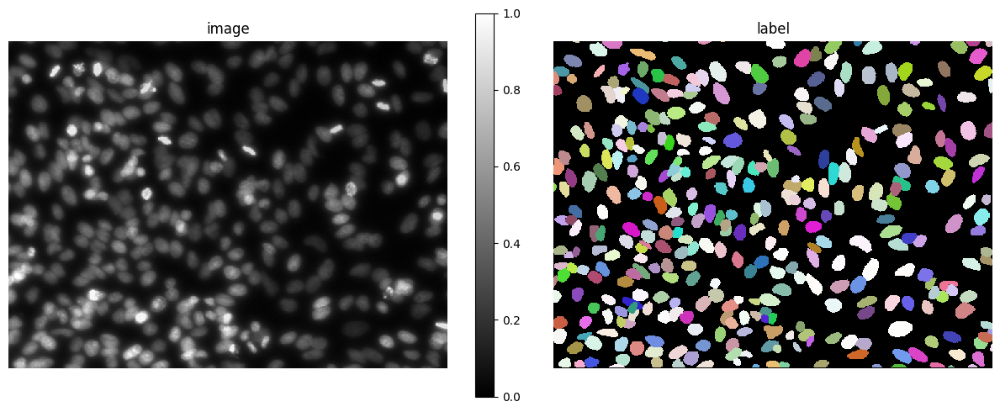

In [4]:
plot_img_label(x_trn[ind], y_trn[ind])

## make sparse annotation

Find the darkest and brightest nuclei

1it [00:00, 31.81it/s]


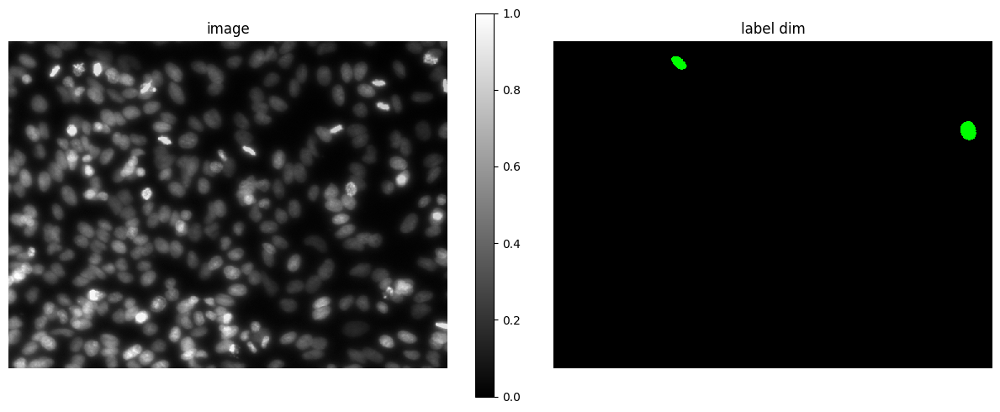

1it [00:00, 33.42it/s]


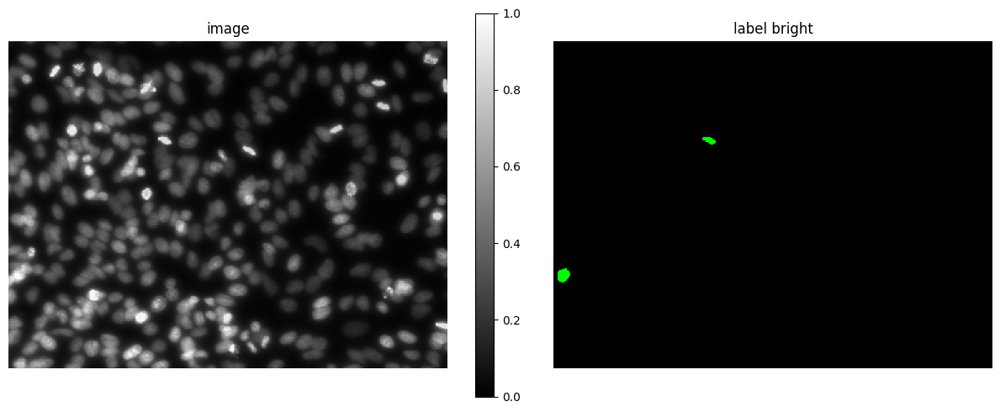

1it [00:00, 31.92it/s]


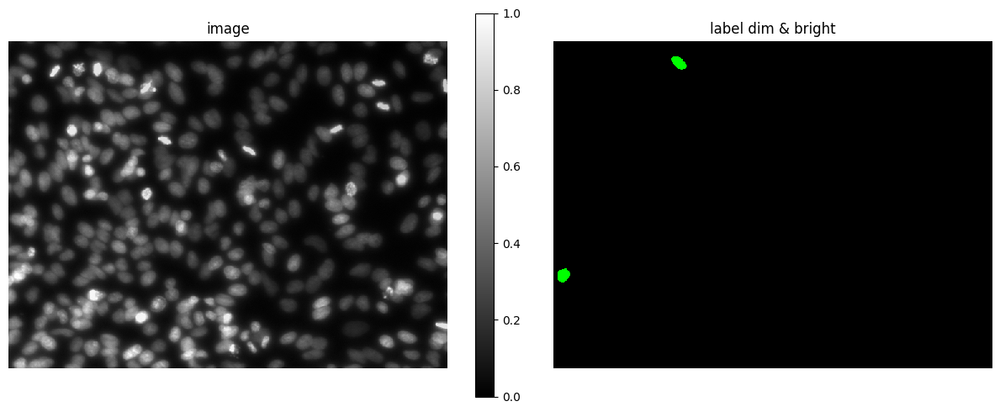

In [5]:
kth = 1
plot_img_label(x_trn[ind], to_sparse([x_trn[ind]], [y_trn[ind]], kth, include_bg=False, mode='min')[0].clip(None, 1),
               lbl_title='label dim', lbl_cmap=seg_cmap)
plot_img_label(x_trn[ind], to_sparse([x_trn[ind]], [y_trn[ind]], kth, include_bg=False, mode='max')[0].clip(None, 1),
               lbl_title='label bright', lbl_cmap=seg_cmap)
plot_img_label(x_trn[ind], to_sparse([x_trn[ind]], [y_trn[ind]], kth, include_bg=False, mode='minmax')[0].clip(None, 1),
               lbl_title='label dim & bright', lbl_cmap=seg_cmap)

1it [00:00, 30.77it/s]
1it [00:00, 851.81it/s]


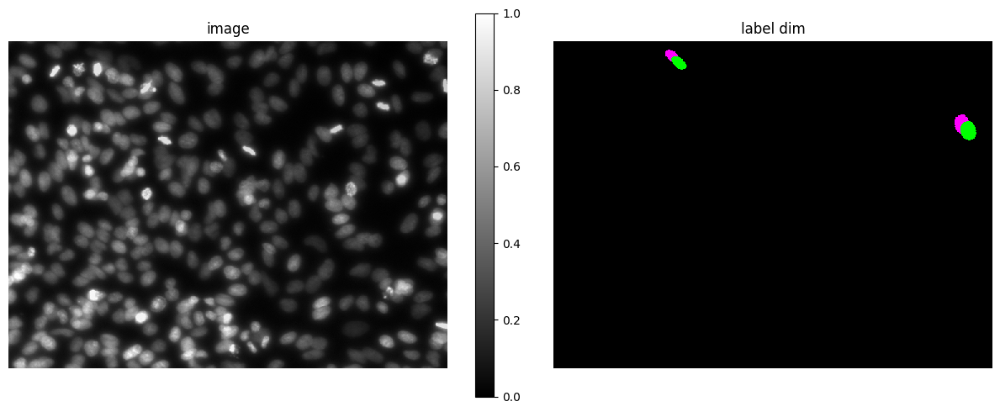

1it [00:00, 31.75it/s]
1it [00:00, 919.80it/s]


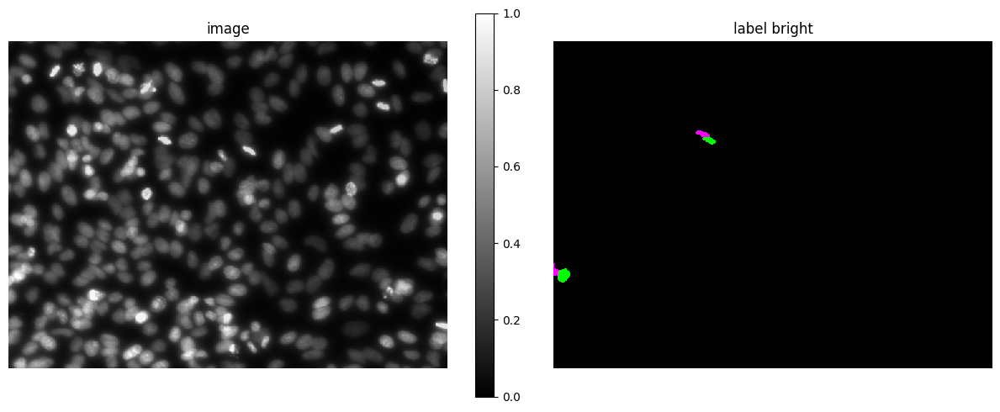

1it [00:00, 33.02it/s]
1it [00:00, 934.56it/s]


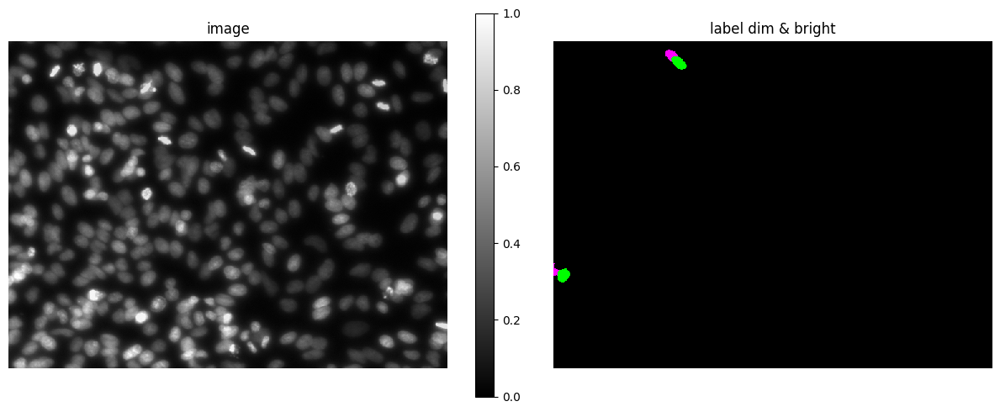

In [6]:
plot_img_label(x_trn[ind], to_sparse([x_trn[ind]], [y_trn[ind]], kth, include_bg=True, mode='min')[0].clip(None, 1),
               lbl_title='label dim', lbl_cmap=seg_cmap)
plot_img_label(x_trn[ind], to_sparse([x_trn[ind]], [y_trn[ind]], kth, include_bg=True, mode='max')[0].clip(None, 1),
               lbl_title='label bright', lbl_cmap=seg_cmap)
plot_img_label(x_trn[ind], to_sparse([x_trn[ind]], [y_trn[ind]], kth, include_bg=True, mode='minmax')[0].clip(None, 1),
               lbl_title='label dim & bright', lbl_cmap=seg_cmap)

In [7]:
is_train = input('Train models? (existing models can be overwritten) (y/n): ').lower().strip() == 'y'

Train models? (existing models can be overwritten) (y/n): y


In [8]:
cellpose_runner = CellposeRunner(
    save_path='models/cellpose/paper01',
    n_epochs=1,
)

2023-06-08 06:18:16,163 [INFO] WRITING LOG OUTPUT TO /home/sugawara/.cellpose/run.log


In [9]:
elephant_runner = ElephantRunner(
    is_3d=False,
    model_dir="models/elephant/paper01",
    log_dir="models/elephant/paper01/logs",
    n_epochs=1,
)

In [10]:
train_batch_size = 8
stardist_runner = StarDistRunner(
    grid=(2, 2),
    basedir='models/stardist/paper01',
    use_gpu=False,
    train_epochs=1,
    train_patch_size=(224, 224),
    train_batch_size=train_batch_size,
    train_steps_per_epoch=len(x_trn) // train_batch_size + 1,
)

2023-06-08 06:18:16,194 [INFO] >>>> loading model models/cellpose/paper01/models/min_full
2023-06-08 06:18:16,195 [INFO] ** TORCH CUDA version installed and working. **
2023-06-08 06:18:16,195 [INFO] >>>> using GPU
2023-06-08 06:18:16,281 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
2023-06-08 06:18:16,281 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)
2023-06-08 06:18:16,282 [INFO] computing flows for labels


100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 57.12it/s]

2023-06-08 06:18:16,302 [INFO] computing flows for labels



100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 98.23it/s]

2023-06-08 06:18:16,316 [INFO] >>>> median diameter set to = 30
2023-06-08 06:18:16,317 [INFO] >>>> mean of training label mask diameters (saved to model) 20.311
2023-06-08 06:18:16,317 [INFO] >>>> training network with 2 channel input <<<<
2023-06-08 06:18:16,317 [INFO] >>>> LR: 0.00100, batch_size: 8, weight_decay: 0.00010
2023-06-08 06:18:16,318 [INFO] >>>> ntrain = 1, ntest = 1
2023-06-08 06:18:16,318 [INFO] >>>> nimg_per_epoch = 8


2023-06-08 06:18:17,991 [INFO] Epoch 0, Time  1.7s, Loss 1.4233, Loss Test 1.0891, LR 0.0000
2023-06-08 06:18:17,992 [INFO] saving network parameters to models/cellpose/paper01/models/min_full
2023-06-08 06:18:18,041 [INFO] >>>> loading model models/cellpose/paper01/models/min_full
2023-06-08 06:18:18,042 [INFO] ** TORCH CUDA version installed and working. **
2023-06-08 06:18:18,042 [INFO] >>>> using GPU
2023-06-08 06:18:18,121 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
2023-06-08 06:18:18,122 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]


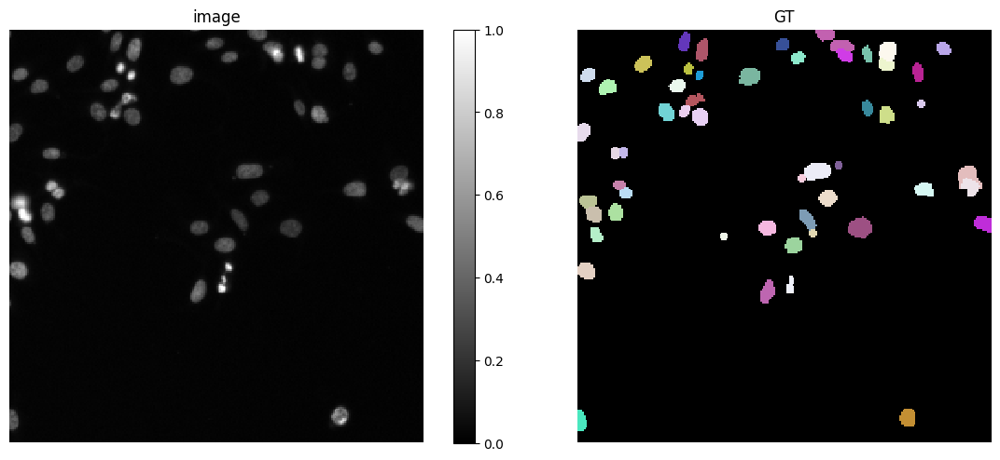

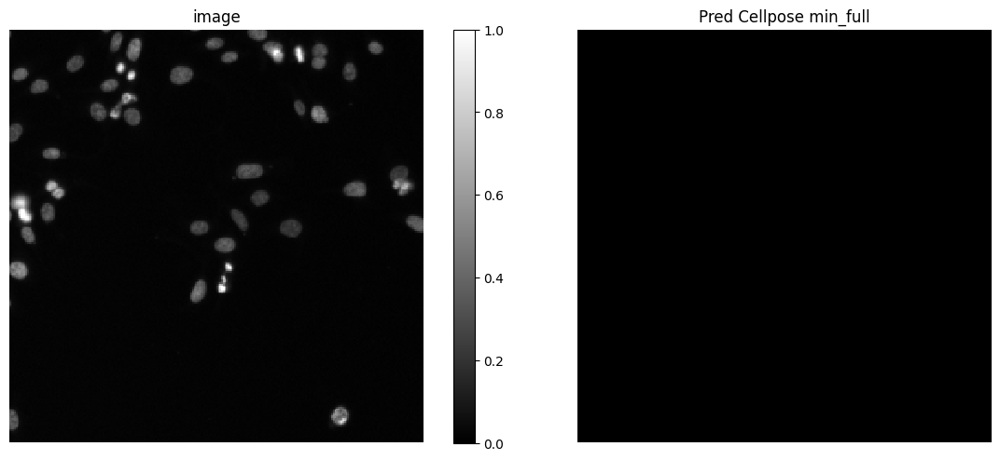

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 39.09it/s]

2023-06-08 06:18:19,010 [INFO] DistributedDataParallel is not used.



DistributedDataParallel is not used.


2023-06-08 06:18:19,391 [INFO] Train Epoch: 0 [1/1 (100%)]	Loss: 0.959909	NLL Loss: 1.719042	Center Dice Loss: 0.963181	Smooth Loss: 0.184415


Train Epoch: 0 [1/1 (100%)]	Loss: 0.959909	NLL Loss: 1.719042	Center Dice Loss: 0.963181	Smooth Loss: 0.184415


2023-06-08 06:18:19,515 [INFO] Eval Epoch: 0 	Loss: 0.959909


Eval Epoch: 0 	Loss: 0.959909
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.16s/it]


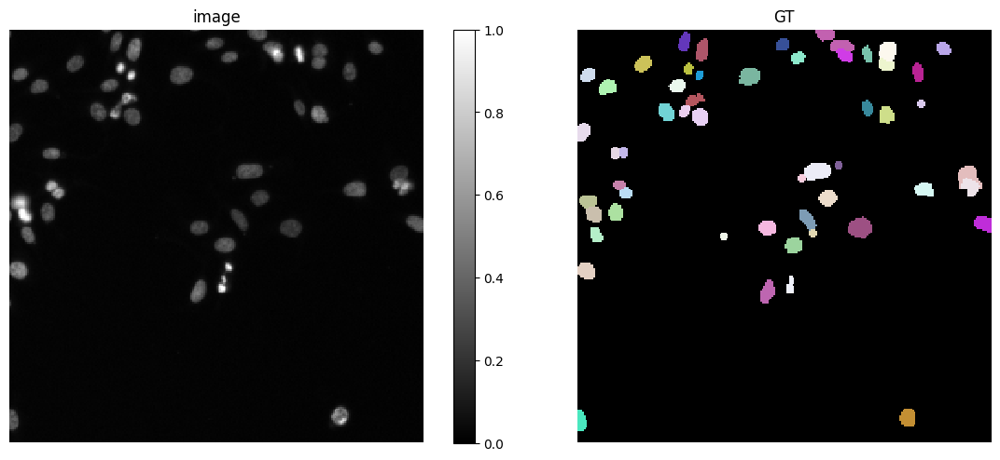

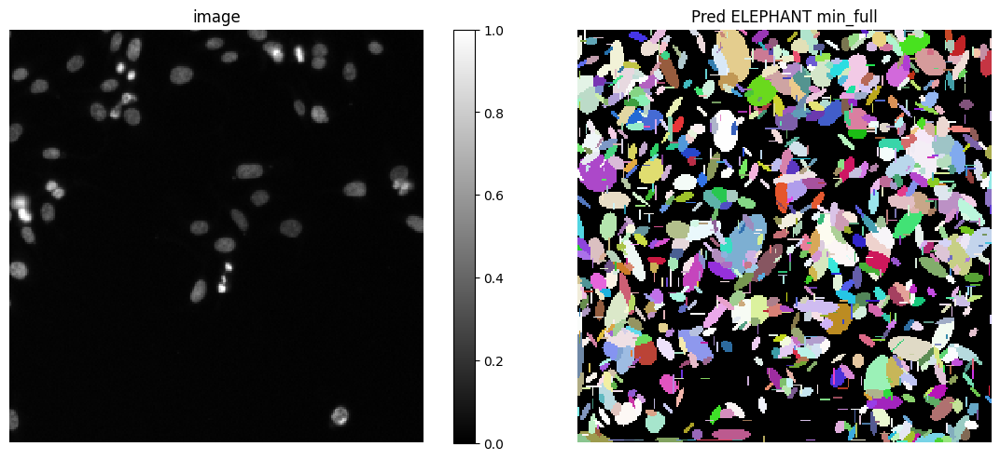

base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/min_full
2023-06-08 06:18:20.976881: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-08 06:18:20.976972: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-08 06:18:20.976989: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-08 06:18:20.977626: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to rea

Using default values: prob_thresh=0.5, nms_thresh=0.4.


2023-06-08 06:18:21.267472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


Cause: Unable to locate the source code of <function _gcd_import at 0x7f8d825dbd80>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
2023-06-08 06:18:22,600 [WARNING] AutoGraph could not transform <function _gcd_import at 0x7f8d825dbd80> and will run it as-is.
Cause: Unable to locate the source code of <function _gcd_import at 0x7f8d825dbd80>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autogra

AutoGraph could not transform <function _gcd_import at 0x7f8d825dbd80> and will run it as-is.
Cause: Unable to locate the source code of <function _gcd_import at 0x7f8d825dbd80>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function _gcd_import at 0x7f8d825dbd80>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


2023-06-08 06:18:23.264393: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8600
2023-06-08 06:18:24.120884: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0x7f89b47efa60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-06-08 06:18:24.120921: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): NVIDIA RTX A4000, Compute Capability 8.6
2023-06-08 06:18:24.124839: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-06-08 06:18:24.199861: I ./tensorflow/compiler/jit/device_compiler.h:180] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


55/56 [============================>.] - ETA: 0s - loss: 0.9068 - prob_loss: 0.1699 - dist_loss: 3.6846 - prob_kld: 0.1017 - dist_relevant_mae: 3.6840 - dist_relevant_mse: 23.8633 - dist_dist_iou_metric: 0.4485

2023-06-08 06:18:29.683341: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:637] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


56/56 [==============================] - 9s 45ms/step - loss: 0.9045 - prob_loss: 0.1698 - dist_loss: 3.6737 - prob_kld: 0.1016 - dist_relevant_mae: 3.6731 - dist_relevant_mse: 23.7539 - dist_dist_iou_metric: 0.4496 - val_loss: 0.8948 - val_prob_loss: 0.1181 - val_dist_loss: 3.8834 - val_prob_kld: 0.0858 - val_dist_relevant_mae: 3.8828 - val_dist_relevant_mse: 19.8538 - val_dist_dist_iou_metric: 0.3398 - lr: 3.0000e-04

Loading network weights from 'weights_best.h5'.
Using default values: prob_thresh=0.5, nms_thresh=0.4.


100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.74it/s]


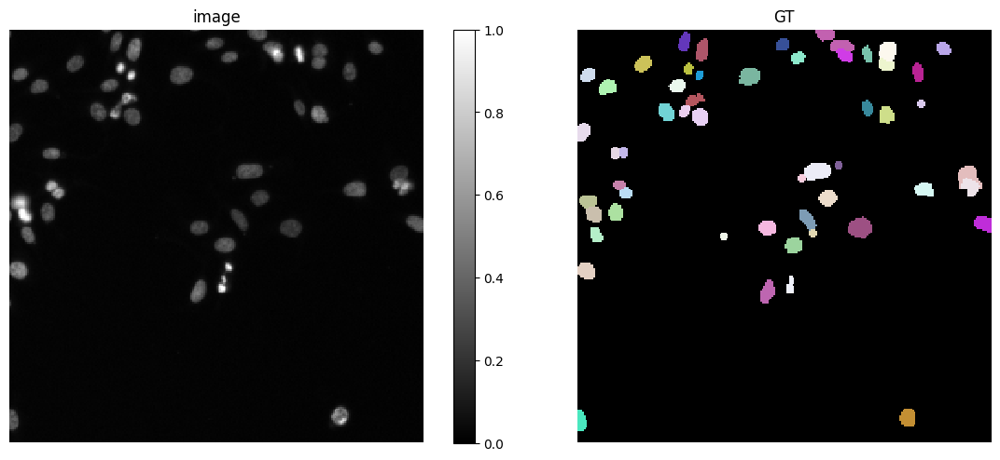

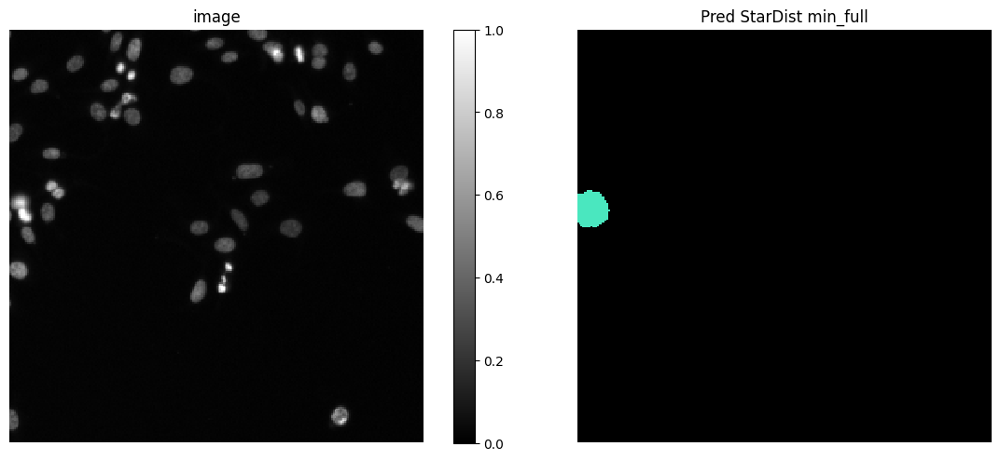

In [11]:
stats_list_dict = {}
for runner in (cellpose_runner, elephant_runner, stardist_runner):
    for include_bg in (False,):#, True):
        for mode in ('min',):# 'max', 'minmax'):
            key = f'{runner.name()}_{mode}{"_bg" if include_bg else ""}'
            stats_list_dict[key] = runner.run(
                x_trn[:1],
                y_trn[:1],
                x_val[:1],
                y_val[:1],
                mode=mode,
                is_train=is_train,
                include_bg=include_bg,
                show_plot=True,
                sample_ind=0,
                kths=(),
            )

## Save predictions of a sample

In [12]:
np.random.seed(42)
cmap = random_label_cmap()

p_out = Path("./predictions/paper01")
p_out.mkdir(parents=True, exist_ok=True)
plt.imsave(p_out / "gt.png", cmap(y_val[21]))
for runner in (stardist_runner, cellpose_runner, elephant_runner):
    for include_bg in (False, True):
        for mode in ('min', 'max', 'minmax'):
            for kth in (1, 4, 16, 64, 256):
                description = f'{mode}_{kth:03d}{"_bg" if include_bg else ""}'
                pred = runner._eval(x_val[21:22], description)
                plt.imsave(p_out / f'{runner.name().lower()}_{description}.png', cmap(pred[0]))

base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/min_001


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:44,289 [INFO] 1/1 - 0s - 85ms/epoch - 85ms/step



1/1 - 0s - 85ms/epoch - 85ms/step



2023-06-08 06:18:44,336 [INFO] 1/1 - 0s - 11ms/epoch - 11ms/step



1/1 - 0s - 11ms/epoch - 11ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/min_004


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:46,232 [WARNING] 5 out of the last 7 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7f8bae6ffe20> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


5 out of the last 7 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7f8bae6ffe20> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


2023-06-08 06:18:46,235 [INFO] 1/1 - 0s - 88ms/epoch - 88ms/step



1/1 - 0s - 88ms/epoch - 88ms/step



2023-06-08 06:18:46,266 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step



2023-06-08 06:18:46,374 [WARNING] 6 out of the last 9 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7f8bae6ffe20> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


6 out of the last 9 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7f8bae6ffe20> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.18it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/min_016


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:46,693 [INFO] 1/1 - 0s - 86ms/epoch - 86ms/step



1/1 - 0s - 86ms/epoch - 86ms/step



2023-06-08 06:18:46,722 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.15it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/min_064


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:47,158 [INFO] 1/1 - 0s - 86ms/epoch - 86ms/step



1/1 - 0s - 86ms/epoch - 86ms/step



2023-06-08 06:18:47,191 [INFO] 1/1 - 0s - 13ms/epoch - 13ms/step



1/1 - 0s - 13ms/epoch - 13ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.13it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/min_256


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:47,621 [INFO] 1/1 - 0s - 85ms/epoch - 85ms/step



1/1 - 0s - 85ms/epoch - 85ms/step



2023-06-08 06:18:47,653 [INFO] 1/1 - 0s - 11ms/epoch - 11ms/step



1/1 - 0s - 11ms/epoch - 11ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.08it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/max_001


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:48,089 [INFO] 1/1 - 0s - 85ms/epoch - 85ms/step



1/1 - 0s - 85ms/epoch - 85ms/step



2023-06-08 06:18:48,134 [INFO] 1/1 - 0s - 14ms/epoch - 14ms/step



1/1 - 0s - 14ms/epoch - 14ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.69it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/max_004


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:48,605 [INFO] 1/1 - 0s - 85ms/epoch - 85ms/step



1/1 - 0s - 85ms/epoch - 85ms/step



2023-06-08 06:18:48,640 [INFO] 1/1 - 0s - 11ms/epoch - 11ms/step



1/1 - 0s - 11ms/epoch - 11ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.92it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/max_016


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:49,093 [INFO] 1/1 - 0s - 85ms/epoch - 85ms/step



1/1 - 0s - 85ms/epoch - 85ms/step



2023-06-08 06:18:49,133 [INFO] 1/1 - 0s - 14ms/epoch - 14ms/step



1/1 - 0s - 14ms/epoch - 14ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.45it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/max_064


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:49,658 [INFO] 1/1 - 0s - 86ms/epoch - 86ms/step



1/1 - 0s - 86ms/epoch - 86ms/step



2023-06-08 06:18:49,698 [INFO] 1/1 - 0s - 13ms/epoch - 13ms/step



1/1 - 0s - 13ms/epoch - 13ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.57it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/max_256


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:50,195 [INFO] 1/1 - 0s - 84ms/epoch - 84ms/step



1/1 - 0s - 84ms/epoch - 84ms/step



2023-06-08 06:18:50,233 [INFO] 1/1 - 0s - 11ms/epoch - 11ms/step



1/1 - 0s - 11ms/epoch - 11ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.30it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/minmax_001


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:51,375 [INFO] 1/1 - 0s - 94ms/epoch - 94ms/step



1/1 - 0s - 94ms/epoch - 94ms/step



2023-06-08 06:18:51,424 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  2.00s/it]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/minmax_004


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:53,542 [INFO] 1/1 - 0s - 90ms/epoch - 90ms/step



1/1 - 0s - 90ms/epoch - 90ms/step



2023-06-08 06:18:53,588 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.15it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/minmax_016


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:54,159 [INFO] 1/1 - 0s - 86ms/epoch - 86ms/step



1/1 - 0s - 86ms/epoch - 86ms/step



2023-06-08 06:18:54,206 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.08it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/minmax_064


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:54,786 [INFO] 1/1 - 0s - 88ms/epoch - 88ms/step



1/1 - 0s - 88ms/epoch - 88ms/step



2023-06-08 06:18:54,832 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.80it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/minmax_256


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:55,493 [INFO] 1/1 - 0s - 88ms/epoch - 88ms/step



1/1 - 0s - 88ms/epoch - 88ms/step



2023-06-08 06:18:55,539 [INFO] 1/1 - 0s - 13ms/epoch - 13ms/step



1/1 - 0s - 13ms/epoch - 13ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.15it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/min_001_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:56,116 [INFO] 1/1 - 0s - 92ms/epoch - 92ms/step



1/1 - 0s - 92ms/epoch - 92ms/step



2023-06-08 06:18:56,163 [INFO] 1/1 - 0s - 14ms/epoch - 14ms/step



1/1 - 0s - 14ms/epoch - 14ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.21it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/min_004_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:56,712 [INFO] 1/1 - 0s - 85ms/epoch - 85ms/step



1/1 - 0s - 85ms/epoch - 85ms/step



2023-06-08 06:18:56,758 [INFO] 1/1 - 0s - 13ms/epoch - 13ms/step



1/1 - 0s - 13ms/epoch - 13ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.22it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/min_016_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:57,321 [INFO] 1/1 - 0s - 89ms/epoch - 89ms/step



1/1 - 0s - 89ms/epoch - 89ms/step



2023-06-08 06:18:57,369 [INFO] 1/1 - 0s - 11ms/epoch - 11ms/step



1/1 - 0s - 11ms/epoch - 11ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.06it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/min_064_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:57,959 [INFO] 1/1 - 0s - 89ms/epoch - 89ms/step



1/1 - 0s - 89ms/epoch - 89ms/step



2023-06-08 06:18:58,006 [INFO] 1/1 - 0s - 13ms/epoch - 13ms/step



1/1 - 0s - 13ms/epoch - 13ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.18it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/min_256_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:58,579 [INFO] 1/1 - 0s - 90ms/epoch - 90ms/step



1/1 - 0s - 90ms/epoch - 90ms/step



2023-06-08 06:18:58,627 [INFO] 1/1 - 0s - 13ms/epoch - 13ms/step



1/1 - 0s - 13ms/epoch - 13ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.14it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/max_001_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:59,201 [INFO] 1/1 - 0s - 89ms/epoch - 89ms/step



1/1 - 0s - 89ms/epoch - 89ms/step



2023-06-08 06:18:59,237 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.24it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/max_004_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:18:59,811 [INFO] 1/1 - 0s - 88ms/epoch - 88ms/step



1/1 - 0s - 88ms/epoch - 88ms/step



2023-06-08 06:18:59,849 [INFO] 1/1 - 0s - 13ms/epoch - 13ms/step



1/1 - 0s - 13ms/epoch - 13ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.64it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/max_016_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:19:00,340 [INFO] 1/1 - 0s - 88ms/epoch - 88ms/step



1/1 - 0s - 88ms/epoch - 88ms/step



2023-06-08 06:19:00,378 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.71it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/max_064_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:19:00,856 [INFO] 1/1 - 0s - 86ms/epoch - 86ms/step



1/1 - 0s - 86ms/epoch - 86ms/step



2023-06-08 06:19:00,902 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.23it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/max_256_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:19:01,471 [INFO] 1/1 - 0s - 90ms/epoch - 90ms/step



1/1 - 0s - 90ms/epoch - 90ms/step



2023-06-08 06:19:01,508 [INFO] 1/1 - 0s - 13ms/epoch - 13ms/step



1/1 - 0s - 13ms/epoch - 13ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.66it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/minmax_001_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:19:01,999 [INFO] 1/1 - 0s - 87ms/epoch - 87ms/step



1/1 - 0s - 87ms/epoch - 87ms/step



2023-06-08 06:19:02,036 [INFO] 1/1 - 0s - 13ms/epoch - 13ms/step



1/1 - 0s - 13ms/epoch - 13ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.70it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/minmax_004_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:19:02,522 [INFO] 1/1 - 0s - 85ms/epoch - 85ms/step



1/1 - 0s - 85ms/epoch - 85ms/step



2023-06-08 06:19:02,560 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.77it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/minmax_016_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:19:03,030 [INFO] 1/1 - 0s - 86ms/epoch - 86ms/step



1/1 - 0s - 86ms/epoch - 86ms/step



2023-06-08 06:19:03,068 [INFO] 1/1 - 0s - 13ms/epoch - 13ms/step



1/1 - 0s - 13ms/epoch - 13ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.34it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/minmax_064_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:19:03,613 [INFO] 1/1 - 0s - 89ms/epoch - 89ms/step



1/1 - 0s - 89ms/epoch - 89ms/step



2023-06-08 06:19:03,659 [INFO] 1/1 - 0s - 13ms/epoch - 13ms/step



1/1 - 0s - 13ms/epoch - 13ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.66it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /home/sugawara/cellsparse-core/notebooks/models/stardist/paper01/minmax_256_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.


  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:19:04,130 [INFO] 1/1 - 0s - 85ms/epoch - 85ms/step



1/1 - 0s - 85ms/epoch - 85ms/step



2023-06-08 06:19:04,166 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.78it/s]

2023-06-08 06:19:04,399 [INFO] >>>> loading model models/cellpose/paper01/models/min_001



>>>> loading model models/cellpose/paper01/models/min_001


2023-06-08 06:19:04,401 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:04,402 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:04,558 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:04,559 [INFO] >>>> model diam_labels =  13.909 (mean diameter of training ROIs)


>>>> model diam_labels =  13.909 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.11it/s]

2023-06-08 06:19:05,476 [INFO] >>>> loading model models/cellpose/paper01/models/min_004



>>>> loading model models/cellpose/paper01/models/min_004


2023-06-08 06:19:05,477 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:05,478 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:05,595 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:05,596 [INFO] >>>> model diam_labels =  20.568 (mean diameter of training ROIs)


>>>> model diam_labels =  20.568 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.46it/s]

2023-06-08 06:19:06,295 [INFO] >>>> loading model models/cellpose/paper01/models/min_016



>>>> loading model models/cellpose/paper01/models/min_016


2023-06-08 06:19:06,297 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:06,298 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:06,408 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:06,409 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.66it/s]

2023-06-08 06:19:07,026 [INFO] >>>> loading model models/cellpose/paper01/models/min_064



>>>> loading model models/cellpose/paper01/models/min_064


2023-06-08 06:19:07,028 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:07,029 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:07,142 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:07,143 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.80it/s]

2023-06-08 06:19:07,513 [INFO] >>>> loading model models/cellpose/paper01/models/min_256



>>>> loading model models/cellpose/paper01/models/min_256


2023-06-08 06:19:07,514 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:07,515 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:07,630 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:07,631 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.84it/s]

2023-06-08 06:19:08,188 [INFO] >>>> loading model models/cellpose/paper01/models/max_001



>>>> loading model models/cellpose/paper01/models/max_001


2023-06-08 06:19:08,190 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:08,191 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:08,305 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:08,306 [INFO] >>>> model diam_labels =  10.319 (mean diameter of training ROIs)


>>>> model diam_labels =  10.319 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.21it/s]

2023-06-08 06:19:09,144 [INFO] >>>> loading model models/cellpose/paper01/models/max_004



>>>> loading model models/cellpose/paper01/models/max_004


2023-06-08 06:19:09,145 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:09,146 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:09,270 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:09,272 [INFO] >>>> model diam_labels =  19.721 (mean diameter of training ROIs)


>>>> model diam_labels =  19.721 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.83it/s]

2023-06-08 06:19:09,831 [INFO] >>>> loading model models/cellpose/paper01/models/max_016



>>>> loading model models/cellpose/paper01/models/max_016


2023-06-08 06:19:09,832 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:09,833 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:09,934 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:09,935 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.83it/s]

2023-06-08 06:19:10,302 [INFO] >>>> loading model models/cellpose/paper01/models/max_064



>>>> loading model models/cellpose/paper01/models/max_064


2023-06-08 06:19:10,303 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:10,304 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:10,682 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:10,682 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.85it/s]

2023-06-08 06:19:11,238 [INFO] >>>> loading model models/cellpose/paper01/models/max_256



>>>> loading model models/cellpose/paper01/models/max_256


2023-06-08 06:19:11,239 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:11,240 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:11,358 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:11,359 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.08it/s]

2023-06-08 06:19:11,854 [INFO] >>>> loading model models/cellpose/paper01/models/minmax_001



>>>> loading model models/cellpose/paper01/models/minmax_001


2023-06-08 06:19:11,856 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:11,857 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:11,967 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:11,968 [INFO] >>>> model diam_labels =  10.810 (mean diameter of training ROIs)


>>>> model diam_labels =  10.810 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.31it/s]

2023-06-08 06:19:12,748 [INFO] >>>> loading model models/cellpose/paper01/models/minmax_004



>>>> loading model models/cellpose/paper01/models/minmax_004


2023-06-08 06:19:12,749 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:12,750 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:12,853 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:12,854 [INFO] >>>> model diam_labels =  15.357 (mean diameter of training ROIs)


>>>> model diam_labels =  15.357 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.49it/s]

2023-06-08 06:19:13,539 [INFO] >>>> loading model models/cellpose/paper01/models/minmax_016



>>>> loading model models/cellpose/paper01/models/minmax_016


2023-06-08 06:19:13,541 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:13,542 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:13,653 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:13,654 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.83it/s]

2023-06-08 06:19:14,215 [INFO] >>>> loading model models/cellpose/paper01/models/minmax_064



>>>> loading model models/cellpose/paper01/models/minmax_064


2023-06-08 06:19:14,216 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:14,217 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:14,322 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:14,323 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.86it/s]

2023-06-08 06:19:14,685 [INFO] >>>> loading model models/cellpose/paper01/models/minmax_256



>>>> loading model models/cellpose/paper01/models/minmax_256


2023-06-08 06:19:14,687 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:14,688 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:14,791 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:14,792 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.01it/s]

2023-06-08 06:19:15,138 [INFO] >>>> loading model models/cellpose/paper01/models/min_001_bg



>>>> loading model models/cellpose/paper01/models/min_001_bg


2023-06-08 06:19:15,140 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:15,140 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:15,243 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:15,244 [INFO] >>>> model diam_labels =  13.909 (mean diameter of training ROIs)


>>>> model diam_labels =  13.909 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.81it/s]

2023-06-08 06:19:15,810 [INFO] >>>> loading model models/cellpose/paper01/models/min_004_bg



>>>> loading model models/cellpose/paper01/models/min_004_bg


2023-06-08 06:19:15,812 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:15,813 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:15,919 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:15,920 [INFO] >>>> model diam_labels =  20.568 (mean diameter of training ROIs)


>>>> model diam_labels =  20.568 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.02it/s]

2023-06-08 06:19:16,264 [INFO] >>>> loading model models/cellpose/paper01/models/min_016_bg



>>>> loading model models/cellpose/paper01/models/min_016_bg


2023-06-08 06:19:16,265 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:16,266 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:16,367 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:16,368 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.52it/s]

2023-06-08 06:19:16,666 [INFO] >>>> loading model models/cellpose/paper01/models/min_064_bg



>>>> loading model models/cellpose/paper01/models/min_064_bg


2023-06-08 06:19:16,667 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:16,668 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:16,770 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:16,771 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.48it/s]

2023-06-08 06:19:17,072 [INFO] >>>> loading model models/cellpose/paper01/models/min_256_bg



>>>> loading model models/cellpose/paper01/models/min_256_bg


2023-06-08 06:19:17,073 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:17,074 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:17,171 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:17,172 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:19:17,396 [INFO] No cell pixels found.


No cell pixels found.
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]

2023-06-08 06:19:17,420 [INFO] >>>> loading model models/cellpose/paper01/models/max_001_bg



>>>> loading model models/cellpose/paper01/models/max_001_bg


2023-06-08 06:19:17,421 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:17,422 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:17,524 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:17,525 [INFO] >>>> model diam_labels =  10.319 (mean diameter of training ROIs)


>>>> model diam_labels =  10.319 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.37it/s]

2023-06-08 06:19:18,271 [INFO] >>>> loading model models/cellpose/paper01/models/max_004_bg



>>>> loading model models/cellpose/paper01/models/max_004_bg


2023-06-08 06:19:18,272 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:18,273 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:18,378 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:18,380 [INFO] >>>> model diam_labels =  19.721 (mean diameter of training ROIs)


>>>> model diam_labels =  19.721 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.58it/s]

2023-06-08 06:19:18,672 [INFO] >>>> loading model models/cellpose/paper01/models/max_016_bg



>>>> loading model models/cellpose/paper01/models/max_016_bg


2023-06-08 06:19:18,673 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:18,674 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:18,779 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:18,781 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.72it/s]

2023-06-08 06:19:19,063 [INFO] >>>> loading model models/cellpose/paper01/models/max_064_bg



>>>> loading model models/cellpose/paper01/models/max_064_bg


2023-06-08 06:19:19,064 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:19,065 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:19,167 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:19,168 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.46it/s]

2023-06-08 06:19:19,471 [INFO] >>>> loading model models/cellpose/paper01/models/max_256_bg



>>>> loading model models/cellpose/paper01/models/max_256_bg


2023-06-08 06:19:19,472 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:19,473 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:19,575 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:19,576 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.66it/s]

2023-06-08 06:19:19,862 [INFO] >>>> loading model models/cellpose/paper01/models/minmax_001_bg



>>>> loading model models/cellpose/paper01/models/minmax_001_bg


2023-06-08 06:19:19,863 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:19,864 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:19,963 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:19,964 [INFO] >>>> model diam_labels =  10.810 (mean diameter of training ROIs)


>>>> model diam_labels =  10.810 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.52it/s]

2023-06-08 06:19:20,635 [INFO] >>>> loading model models/cellpose/paper01/models/minmax_004_bg



>>>> loading model models/cellpose/paper01/models/minmax_004_bg


2023-06-08 06:19:20,636 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:20,637 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:20,740 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:20,741 [INFO] >>>> model diam_labels =  15.357 (mean diameter of training ROIs)


>>>> model diam_labels =  15.357 (mean diameter of training ROIs)
  0%|                                                                                 | 0/1 [00:00<?, ?it/s]

2023-06-08 06:19:21,088 [INFO] No cell pixels found.


No cell pixels found.
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.79it/s]

2023-06-08 06:19:21,113 [INFO] >>>> loading model models/cellpose/paper01/models/minmax_016_bg



>>>> loading model models/cellpose/paper01/models/minmax_016_bg


2023-06-08 06:19:21,115 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:21,116 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:21,215 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:21,216 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.74it/s]

2023-06-08 06:19:21,498 [INFO] >>>> loading model models/cellpose/paper01/models/minmax_064_bg



>>>> loading model models/cellpose/paper01/models/minmax_064_bg


2023-06-08 06:19:21,500 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:21,501 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:21,604 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:21,605 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]

2023-06-08 06:19:21,903 [INFO] >>>> loading model models/cellpose/paper01/models/minmax_256_bg



>>>> loading model models/cellpose/paper01/models/minmax_256_bg


2023-06-08 06:19:21,905 [INFO] ** TORCH CUDA version installed and working. **


** TORCH CUDA version installed and working. **


2023-06-08 06:19:21,906 [INFO] >>>> using GPU


>>>> using GPU


2023-06-08 06:19:22,010 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


>>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


2023-06-08 06:19:22,011 [INFO] >>>> model diam_labels =  20.311 (mean diameter of training ROIs)


>>>> model diam_labels =  20.311 (mean diameter of training ROIs)
100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.94it/s]


# Optional: save and load stats list

## Save stats list

In [13]:
with open("stats_list_001.pkl", "wb") as fp:
    dill.dump(stats_list_dict, fp)

## Load stats list

In [14]:
with open("stats_list_001.pkl", "rb") as fp:
    stats_list_dict_001 = dill.load(fp)

In [3]:
with open("stats_list_002.pkl", "rb") as fp:
    stats_list_dict_002 = dill.load(fp)

In [4]:
with open("stats_list_003.pkl", "rb") as fp:
    stats_list_dict_003 = dill.load(fp)

In [15]:
from collections import namedtuple
from statistics import mean

stats_list_dict = {}
for (k1, v1), (k2, v2), (k3, v3) in zip(stats_list_dict_001.items(), stats_list_dict_002.items(), stats_list_dict_003.items()):
    assert k1 == k2 and k2 == k3
    assert len(v1) == len(v2) and len(v2) == len(v3)
    stats_list_dict[k1] = [
        namedtuple("DatasetMatching", dm1._asdict().keys())(*dm1._asdict().values())._replace(
            fp=mean((dm1.fp, dm2.fp, dm3.fp)),
            tp=mean((dm1.tp, dm2.tp, dm3.tp)),
            fn=mean((dm1.fn, dm2.fn, dm3.fn)),
            precision=mean((dm1.precision, dm2.precision, dm3.precision)),
            recall=mean((dm1.recall, dm2.recall, dm3.recall)),
            accuracy=mean((dm1.accuracy, dm2.accuracy, dm3.accuracy)),
            f1=mean((dm1.f1, dm2.f1, dm3.f1)),
            n_pred=mean((dm1.n_pred, dm2.n_pred, dm3.n_pred)),
            mean_true_score=mean((dm1.mean_true_score, dm2.mean_true_score, dm3.mean_true_score)),
            mean_matched_score=mean((dm1.mean_matched_score, dm2.mean_matched_score, dm3.mean_matched_score)),
            panoptic_quality=mean((dm1.panoptic_quality, dm2.panoptic_quality, dm3.panoptic_quality)),
        )
        for dm1, dm2, dm3 in zip(v1, v2, v3)
    ]


def mean_metrics(algorithm):
    return {
        "fp": mean(v[-1].fp for k, v in stats_list_dict.items() if k.startswith(algorithm)),
        "tp": mean(v[-1].tp for k, v in stats_list_dict.items() if k.startswith(algorithm)),
        "fn": mean(v[-1].tp for k, v in stats_list_dict.items() if k.startswith(algorithm)),
        "precision": mean(v[-1].precision for k, v in stats_list_dict.items() if k.startswith(algorithm)),
        "recall": mean(v[-1].recall for k, v in stats_list_dict.items() if k.startswith(algorithm)),
        "accuracy": mean(v[-1].accuracy for k, v in stats_list_dict.items() if k.startswith(algorithm)),
        "f1": mean(v[-1].f1 for k, v in stats_list_dict.items() if k.startswith(algorithm)),
        "n_pred": mean(v[-1].n_pred for k, v in stats_list_dict.items() if k.startswith(algorithm)),
        "mean_true_score": mean(v[-1].mean_true_score for k, v in stats_list_dict.items() if k.startswith(algorithm)),
        "mean_matched_score": mean(v[-1].mean_matched_score for k, v in stats_list_dict.items() if k.startswith(algorithm)),
        "panoptic_quality": mean(v[-1].panoptic_quality for k, v in stats_list_dict.items() if k.startswith(algorithm)),
    }


mean_stardist = mean_metrics("StarDist")
mean_cellpose = mean_metrics("Cellpose")
mean_elephant = mean_metrics("ELEPHANT")

for k, v in stats_list_dict.items():
    if k.startswith("StarDist"):
        stats_list_dict[k][-1] = namedtuple("DatasetMatching", v[-1]._asdict().keys())(*v[-1]._asdict().values())._replace(**mean_stardist)
    elif k.startswith("Cellpose"):
        stats_list_dict[k][-1] = namedtuple("DatasetMatching", v[-1]._asdict().keys())(*v[-1]._asdict().values())._replace(**mean_cellpose)
    elif k.startswith("ELEPHANT"):
        stats_list_dict[k][-1] = namedtuple("DatasetMatching", v[-1]._asdict().keys())(*v[-1]._asdict().values())._replace(**mean_elephant)

NameError: name 'stats_list_dict_002' is not defined

# Plot stats

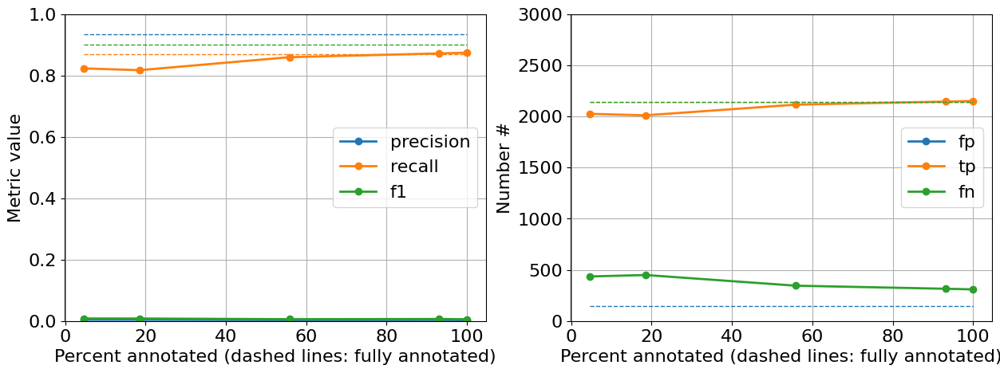

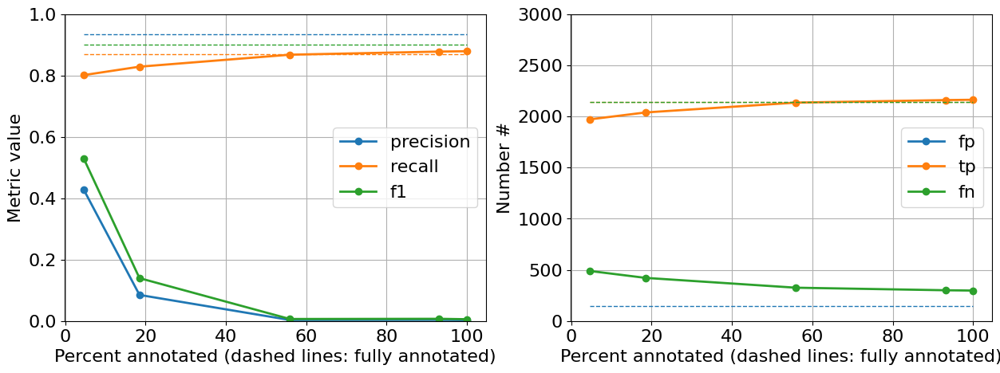

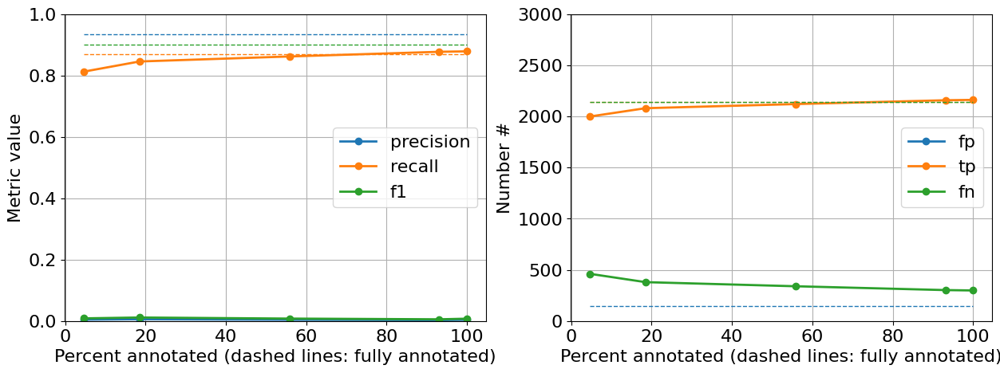

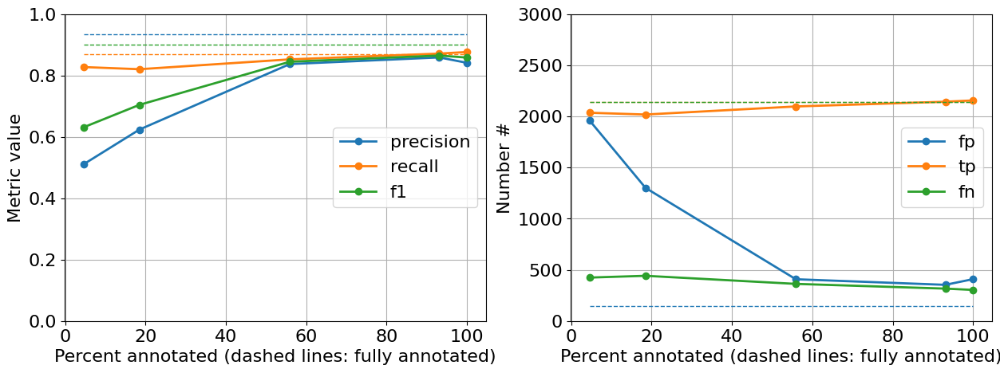

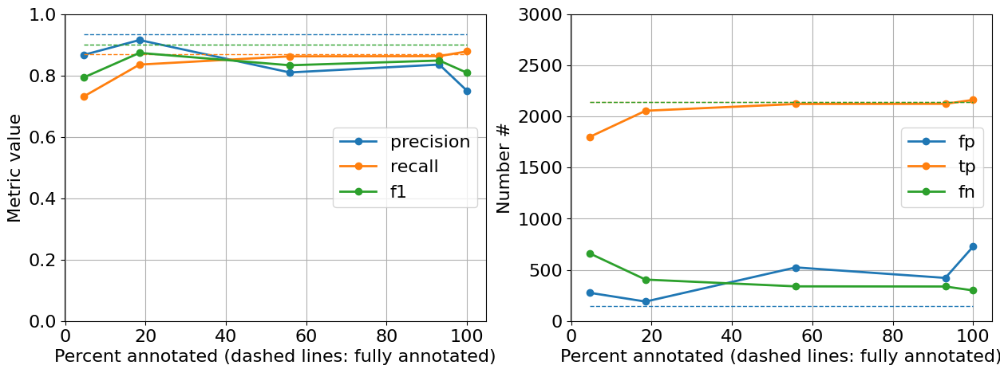

...

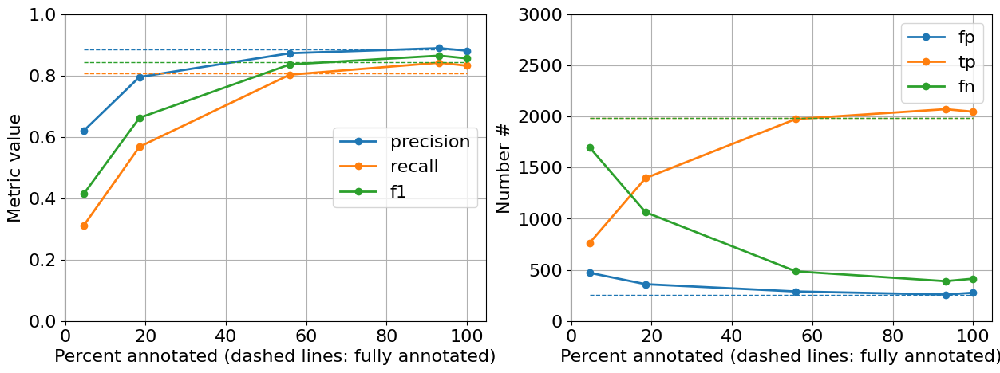

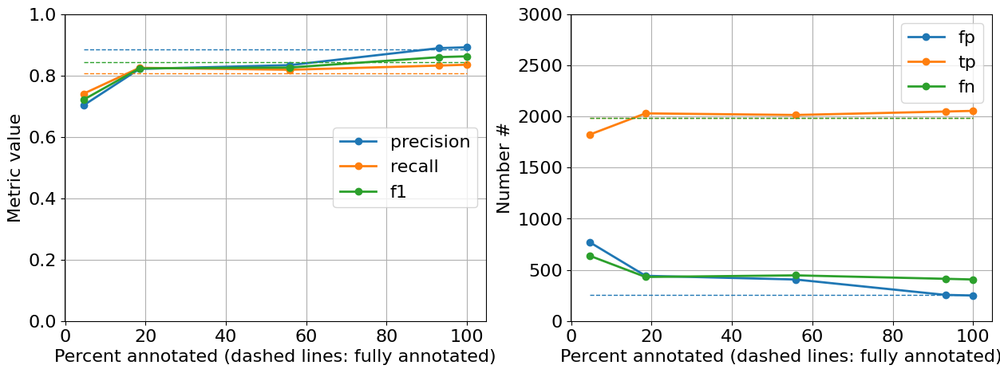

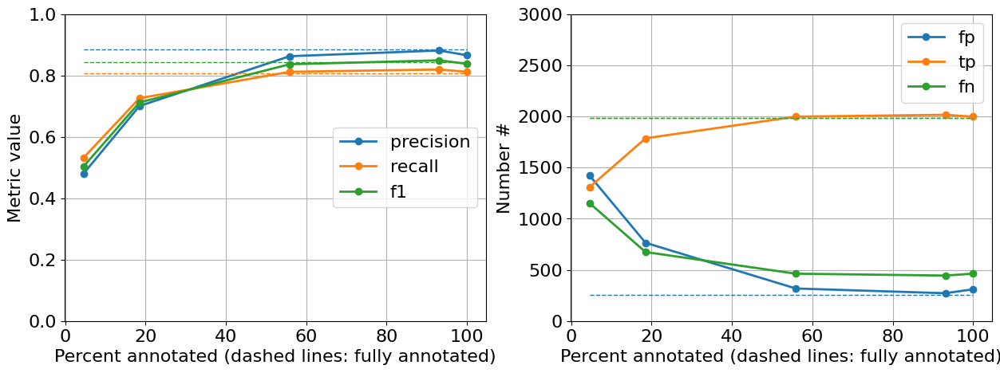

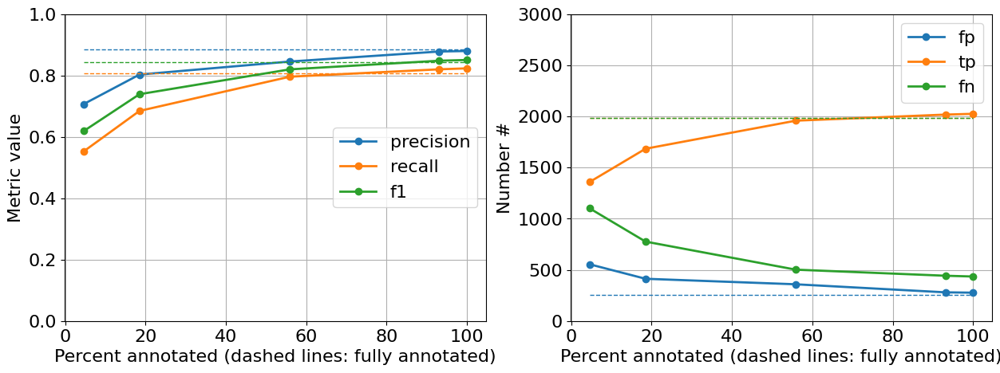

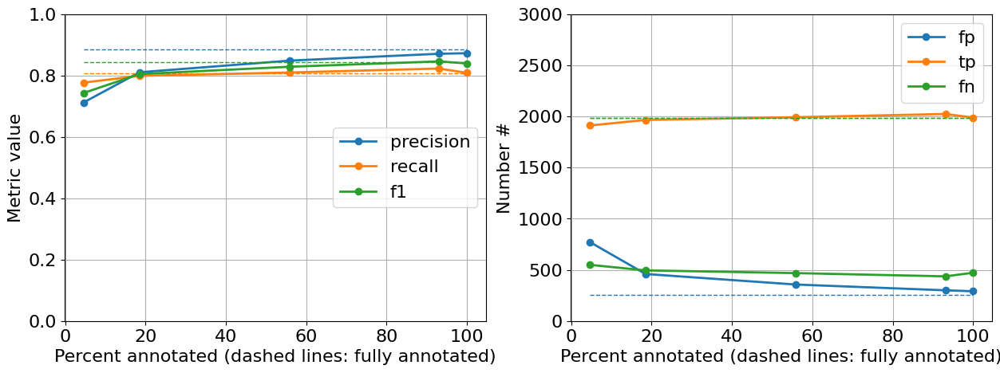

In [6]:
plt.rcParams["font.size"] = 16
for algorithm in ("StarDist", "Cellpose", "ELEPHANT"):
    for include_bg in (False, True):
        for mode in ('min', 'max', 'minmax'):
            key = f'{algorithm}_{mode}{"_bg" if include_bg else ""}'
            plot_stats(
                stats_list_dict[key],
                "",
                data_points=(4.6, 18.5, 55.9, 93.1, 100),
                xlabel="Percent annotated (dashed lines: fully annotated)",
                metrics=("precision", "recall", "f1"),
            )

In [13]:
def get_plot_data(kth):
    data = []
    for i, (img, lbl) in enumerate(zip(x_trn, y_trn)):
        props = regionprops_table(lbl, img, properties=("mean_intensity", "minor_axis_length"))
        keep = np.nonzero(props["minor_axis_length"])
        intensities = props["mean_intensity"][keep]
        intensities = np.sort(intensities)
        colors_min = np.zeros(intensities.shape, dtype=np.uint8)
        colors_max = np.zeros(intensities.shape, dtype=np.uint8)
        colors_minmax = np.zeros(intensities.shape, dtype=np.uint8)
        colors_min[:kth*2] = 1
        colors_max[-kth*2:] = 1
        colors_minmax[:kth*2] = 1
        colors_minmax[-kth*2:] = 1
        for intensity, c_min, c_max, c_minmax in zip(intensities, colors_min, colors_max, colors_minmax):
            data.append([i, intensity, c_min, c_max, c_minmax])
    data = np.array(data)
    return data

In [14]:
data_list = [get_plot_data(kth) for kth in (1, 4, 16, 64, 256)]

In [16]:
def map_color(c):
    if c == 1:
        return "green"
    return "gray"

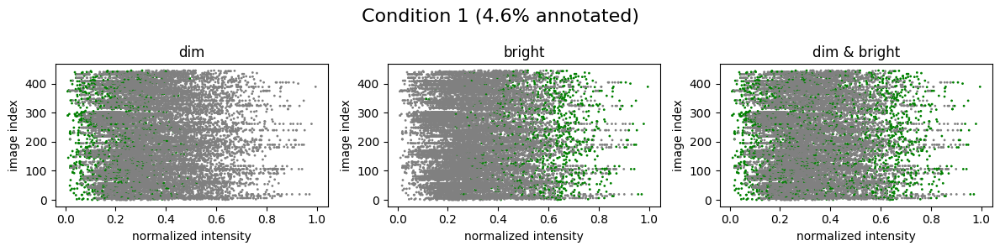

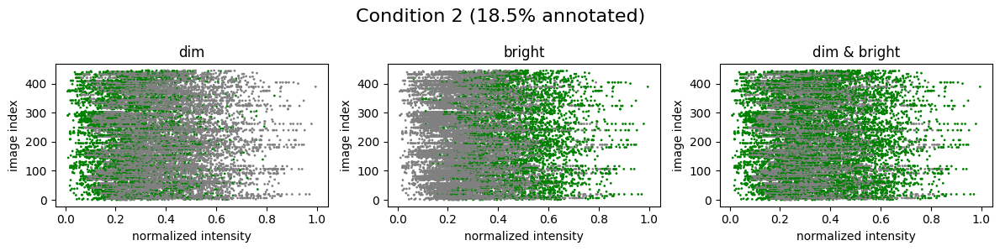

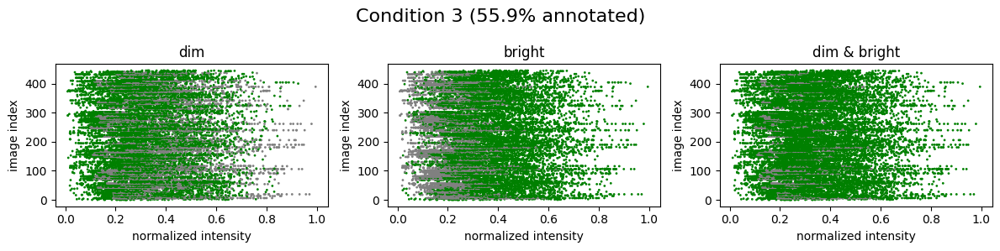

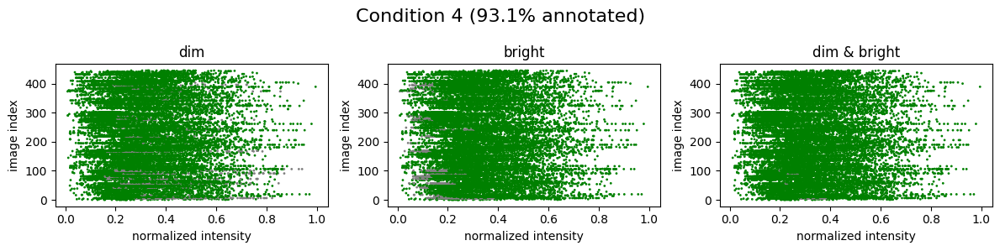

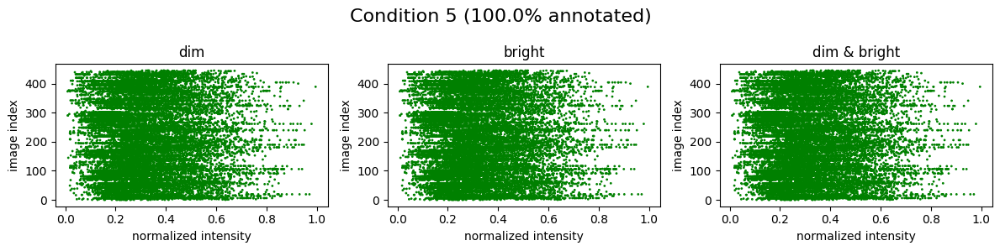

In [18]:
for ind, data in enumerate(data_list):
    fig, axs = plt.subplots(
        1, 3, figsize=(12, 3),
    )
    percentage = data[:, 2].sum() / len(data[:, 2]) * 100
    strategies = ("dim", "bright", "dim & bright")
    fig.suptitle(f"Condition {ind + 1} ({percentage:.1f}% annotated)", fontsize=16)
    for i in range(3):
        axs[i].scatter(data[:, 1], data[:, 0], c=list(map(map_color, data[:, 2+i])), s=1)
        axs[i].set_title(strategies[i])
        axs[i].set_xlabel("normalized intensity")
        axs[i].set_ylabel("image index")
    plt.tight_layout()
    plt.show()
    plt.close(fig)

## Save labels

In [12]:
from PIL import Image
from pathlib import Path

p = Path("./labels")
p.mkdir(parents=True, exist_ok=True)
palette = [
    0, 0, 0, # no label
    255, 0, 255, # bg
    0, 255, 0, # fg
]
for kth in (1, 4, 16, 64, 256):
    for mode in ("min", "max", "minmax"):
        img_min = Image.fromarray(to_sparse([x_trn[ind]], [y_trn[ind]], kth, include_bg=True, mode=mode)[0].clip(None, 1).astype(np.uint8) + 1)
        img_min.putpalette(palette)
        img_min.save(p / f"{mode}_{kth:03d}.png")

1it [00:00, 13.49it/s]
1it [00:00, 509.64it/s]
1it [00:00, 14.03it/s]
1it [00:00, 439.70it/s]
1it [00:00, 10.09it/s]
1it [00:00, 449.89it/s]
1it [00:00,  9.62it/s]
1it [00:00, 550.29it/s]
1it [00:00, 16.07it/s]
1it [00:00, 432.58it/s]
1it [00:00, 11.63it/s]
1it [00:00, 381.30it/s]
1it [00:00, 13.88it/s]
1it [00:00, 411.05it/s]
1it [00:00, 12.46it/s]
1it [00:00, 347.93it/s]
1it [00:00, 13.56it/s]
1it [00:00, 342.95it/s]
1it [00:00, 13.00it/s]
1it [00:00, 366.22it/s]
1it [00:00, 12.81it/s]
1it [00:00, 422.00it/s]
1it [00:00, 12.65it/s]
1it [00:00, 296.25it/s]
1it [00:00, 13.28it/s]
1it [00:00, 237.79it/s]
1it [00:00, 12.90it/s]
1it [00:00, 209.17it/s]
1it [00:00, 12.59it/s]
1it [00:00, 249.90it/s]


In [12]:
CellposeRunner?

2023-05-10 23:02:54,514 [INFO] WRITING LOG OUTPUT TO /root/.cellpose/run.log


48it [00:01, 28.12it/s]
48it [00:00, 1102.72it/s]

2023-05-10 23:02:56,273 [INFO] ** TORCH CUDA version installed and working. **
2023-05-10 23:02:56,274 [INFO] >>>> using GPU


2023-05-10 23:02:56,493 [INFO] computing flows for labels


100%|██████████| 48/48 [00:00<00:00, 51.17it/s]


2023-05-10 23:02:57,662 [INFO] computing flows for labels


100%|██████████| 1/1 [00:00<00:00, 14.39it/s]

2023-05-10 23:02:57,826 [INFO] >>>> median diameter set to = 30
2023-05-10 23:02:57,827 [INFO] >>>> mean of training label mask diameters (saved to model) 20.806
2023-05-10 23:02:57,828 [INFO] >>>> training network with 2 channel input <<<<
2023-05-10 23:02:57,828 [INFO] >>>> LR: 0.01000, batch_size: 8, weight_decay: 0.00010
2023-05-10 23:02:57,829 [INFO] >>>> ntrain = 48, ntest = 1
2023-05-10 23:02:57,829 [INFO] >>>> nimg_per_epoch = 48


2023-05-10 23:02:58,774 [INFO] Epoch 0, Time  0.9s, Loss 1.0715, Loss Test 2.9780, LR 0.0000
2023-05-10 23:02:59,648 [INFO] saving network parameters to models/cellpose/paper_self/models/minmax_001_bg
2023-05-10 23:03:03,245 [INFO] Epoch 5, Time  5.4s, Loss 0.2833, Loss Test 3.0336, LR 0.0056
2023-05-10 23:03:07,668 [INFO] Epoch 10, Time  9.8s, Loss 0.2436, Loss Test 4.3467, LR 0.0100
2023-05-10 23:03:16,478 [INFO] Epoch 20, Time 18.6s, Loss 0.2357, Loss Test 3.0378, LR 0.0100
2023-05-10 23:03:25,311 [INFO] Epoch 30, Time 27.5s, Loss 0.4287, Loss Test 3.1748, LR 0.0100
2023-05-10 23:03:34,195 [INFO] Epoch 40, Time 36.4s, Loss 0.2751, Loss Test 3.4140, LR 0.0100
2023-05-10 23:03:43,128 [INFO] Epoch 50, Time 45.3s, Loss 0.3935, Loss Test 3.1599, LR 0.0100
2023-05-10 23:03:52,132 [INFO] Epoch 60, Time 54.3s, Loss 0.3823, Loss Test 3.5305, LR 0.0100
2023-05-10 23:04:01,082 [INFO] Epoch 70, Time 63.3s, Loss 0.2237, Loss Test 3.2381, LR 0.0100
2023-05-10 23:04:10,006 [INFO] Epoch 80, Time 72

100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


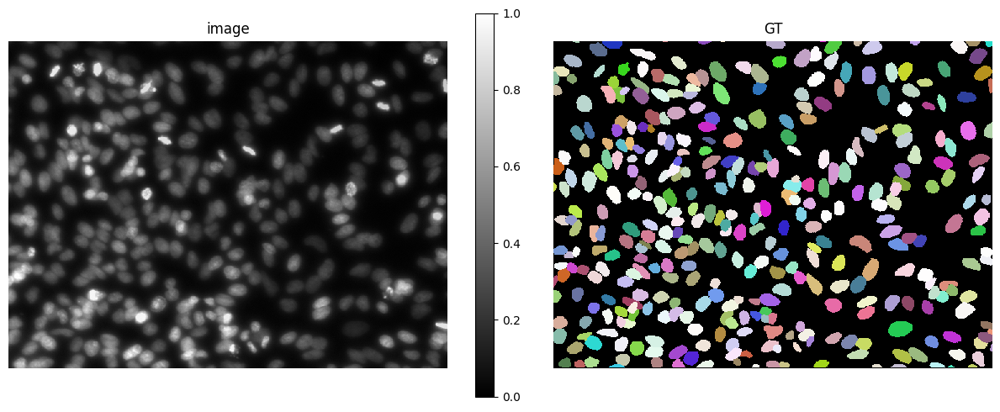

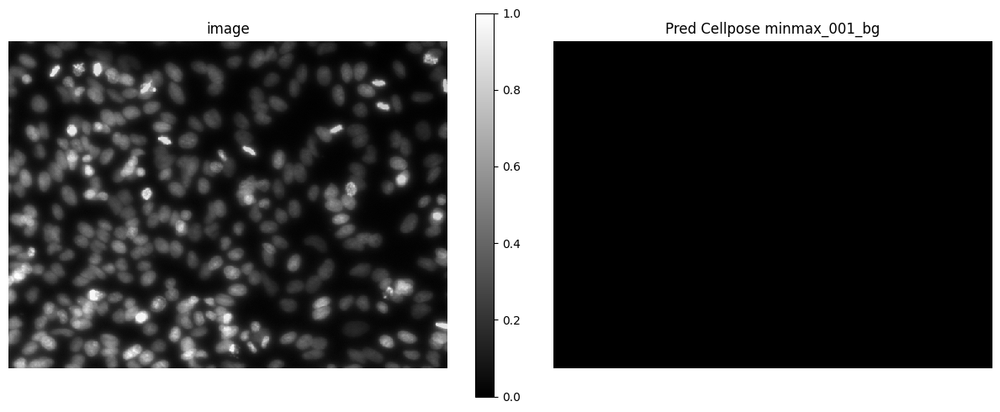

48it [00:01, 28.34it/s]
48it [00:00, 1087.48it/s]

2023-05-10 23:04:30,035 [INFO] ** TORCH CUDA version installed and working. **
2023-05-10 23:04:30,036 [INFO] >>>> using GPU


2023-05-10 23:04:30,107 [INFO] computing flows for labels


100%|██████████| 48/48 [00:00<00:00, 57.95it/s]


2023-05-10 23:04:31,165 [INFO] computing flows for labels


100%|██████████| 1/1 [00:00<00:00, 16.82it/s]

2023-05-10 23:04:31,322 [INFO] >>>> median diameter set to = 30
2023-05-10 23:04:31,323 [INFO] >>>> mean of training label mask diameters (saved to model) 21.331
2023-05-10 23:04:31,324 [INFO] >>>> training network with 2 channel input <<<<
2023-05-10 23:04:31,324 [INFO] >>>> LR: 0.01000, batch_size: 8, weight_decay: 0.00010
2023-05-10 23:04:31,324 [INFO] >>>> ntrain = 48, ntest = 1
2023-05-10 23:04:31,325 [INFO] >>>> nimg_per_epoch = 48


2023-05-10 23:04:32,251 [INFO] Epoch 0, Time  0.9s, Loss 2.1677, Loss Test 2.9707, LR 0.0000
2023-05-10 23:04:33,153 [INFO] saving network parameters to models/cellpose/paper_self/models/minmax_004_bg
2023-05-10 23:04:36,793 [INFO] Epoch 5, Time  5.5s, Loss 1.2235, Loss Test 5.1956, LR 0.0056
2023-05-10 23:04:41,285 [INFO] Epoch 10, Time 10.0s, Loss 0.8210, Loss Test 3.7747, LR 0.0100
2023-05-10 23:04:50,221 [INFO] Epoch 20, Time 18.9s, Loss 0.7544, Loss Test 3.8228, LR 0.0100
2023-05-10 23:04:59,159 [INFO] Epoch 30, Time 27.8s, Loss 0.5491, Loss Test 4.6335, LR 0.0100
2023-05-10 23:05:08,100 [INFO] Epoch 40, Time 36.8s, Loss 0.4143, Loss Test 3.9956, LR 0.0100
2023-05-10 23:05:17,073 [INFO] Epoch 50, Time 45.7s, Loss 0.3965, Loss Test 3.8700, LR 0.0100
2023-05-10 23:05:26,015 [INFO] Epoch 60, Time 54.7s, Loss 0.3947, Loss Test 4.0799, LR 0.0100
2023-05-10 23:05:34,939 [INFO] Epoch 70, Time 63.6s, Loss 0.3206, Loss Test 3.9924, LR 0.0100
2023-05-10 23:05:43,880 [INFO] Epoch 80, Time 72

100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


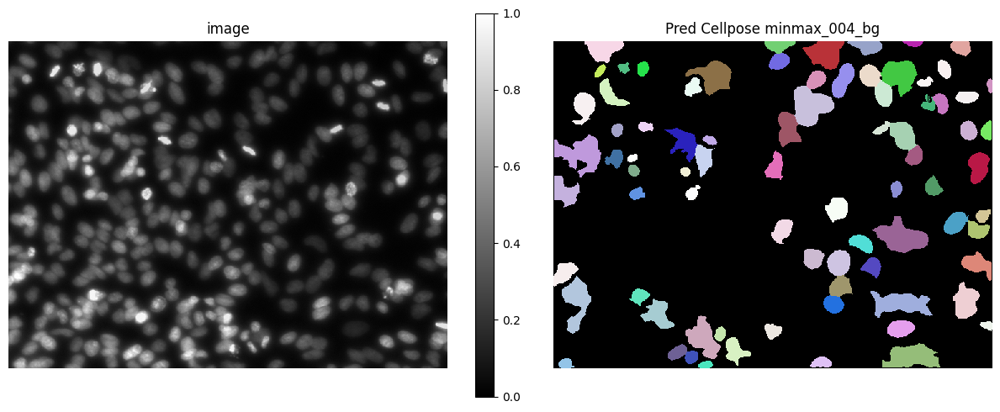

48it [00:01, 25.61it/s]
48it [00:00, 981.21it/s]

2023-05-10 23:06:03,620 [INFO] ** TORCH CUDA version installed and working. **
2023-05-10 23:06:03,621 [INFO] >>>> using GPU


2023-05-10 23:06:03,699 [INFO] computing flows for labels


100%|██████████| 48/48 [00:00<00:00, 53.12it/s]


2023-05-10 23:06:04,831 [INFO] computing flows for labels


100%|██████████| 1/1 [00:00<00:00, 15.66it/s]

2023-05-10 23:06:04,992 [INFO] >>>> median diameter set to = 30
2023-05-10 23:06:04,993 [INFO] >>>> mean of training label mask diameters (saved to model) 21.331
2023-05-10 23:06:04,994 [INFO] >>>> training network with 2 channel input <<<<
2023-05-10 23:06:04,995 [INFO] >>>> LR: 0.01000, batch_size: 8, weight_decay: 0.00010
2023-05-10 23:06:04,996 [INFO] >>>> ntrain = 48, ntest = 1
2023-05-10 23:06:04,996 [INFO] >>>> nimg_per_epoch = 48


2023-05-10 23:06:05,941 [INFO] Epoch 0, Time  0.9s, Loss 2.5957, Loss Test 2.9633, LR 0.0000
2023-05-10 23:06:06,841 [INFO] saving network parameters to models/cellpose/paper_self/models/minmax_016_bg
2023-05-10 23:06:10,502 [INFO] Epoch 5, Time  5.5s, Loss 1.4425, Loss Test 5.4087, LR 0.0056
2023-05-10 23:06:15,007 [INFO] Epoch 10, Time 10.0s, Loss 1.0404, Loss Test 2.0500, LR 0.0100
2023-05-10 23:06:24,045 [INFO] Epoch 20, Time 19.0s, Loss 0.7993, Loss Test 2.1376, LR 0.0100
2023-05-10 23:06:33,061 [INFO] Epoch 30, Time 28.1s, Loss 0.6583, Loss Test 2.1613, LR 0.0100
2023-05-10 23:06:42,089 [INFO] Epoch 40, Time 37.1s, Loss 0.5292, Loss Test 1.9720, LR 0.0100
2023-05-10 23:06:51,082 [INFO] Epoch 50, Time 46.1s, Loss 0.4113, Loss Test 2.0719, LR 0.0100
2023-05-10 23:07:00,095 [INFO] Epoch 60, Time 55.1s, Loss 0.4266, Loss Test 2.2581, LR 0.0100
2023-05-10 23:07:09,068 [INFO] Epoch 70, Time 64.1s, Loss 0.4671, Loss Test 2.1178, LR 0.0100
2023-05-10 23:07:18,089 [INFO] Epoch 80, Time 73

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


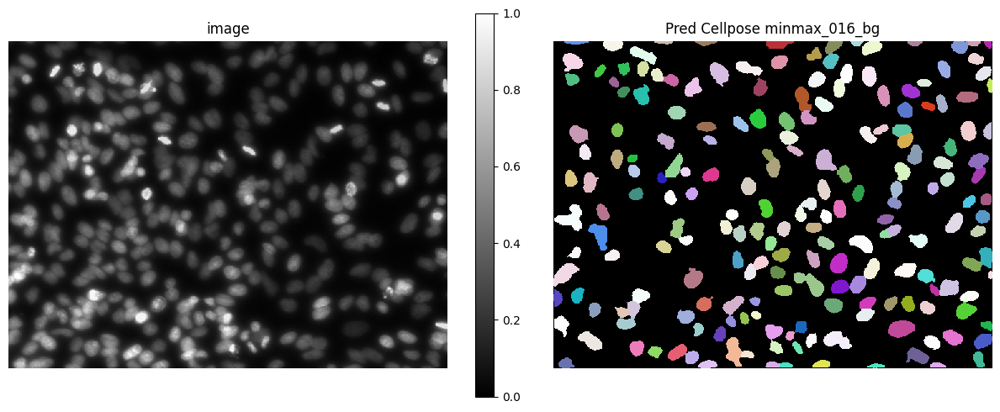

48it [00:01, 24.36it/s]
48it [00:00, 752.79it/s]

2023-05-10 23:07:37,974 [INFO] ** TORCH CUDA version installed and working. **
2023-05-10 23:07:37,974 [INFO] >>>> using GPU


2023-05-10 23:07:38,050 [INFO] computing flows for labels


100%|██████████| 48/48 [00:01<00:00, 30.16it/s]


2023-05-10 23:07:39,858 [INFO] computing flows for labels


100%|██████████| 1/1 [00:00<00:00, 16.41it/s]

2023-05-10 23:07:40,034 [INFO] >>>> median diameter set to = 30
2023-05-10 23:07:40,034 [INFO] >>>> mean of training label mask diameters (saved to model) 20.837
2023-05-10 23:07:40,035 [INFO] >>>> training network with 2 channel input <<<<
2023-05-10 23:07:40,036 [INFO] >>>> LR: 0.01000, batch_size: 8, weight_decay: 0.00010
2023-05-10 23:07:40,036 [INFO] >>>> ntrain = 48, ntest = 1
2023-05-10 23:07:40,037 [INFO] >>>> nimg_per_epoch = 48


2023-05-10 23:07:40,980 [INFO] Epoch 0, Time  0.9s, Loss 3.7901, Loss Test 3.0136, LR 0.0000
2023-05-10 23:07:41,887 [INFO] saving network parameters to models/cellpose/paper_self/models/minmax_064_bg
2023-05-10 23:07:45,593 [INFO] Epoch 5, Time  5.6s, Loss 2.2578, Loss Test 2.5970, LR 0.0056
2023-05-10 23:07:50,162 [INFO] Epoch 10, Time 10.1s, Loss 1.2312, Loss Test 1.3426, LR 0.0100
2023-05-10 23:07:59,266 [INFO] Epoch 20, Time 19.2s, Loss 0.9747, Loss Test 1.2427, LR 0.0100
2023-05-10 23:08:08,360 [INFO] Epoch 30, Time 28.3s, Loss 0.7373, Loss Test 1.0369, LR 0.0100
2023-05-10 23:08:17,470 [INFO] Epoch 40, Time 37.4s, Loss 0.6976, Loss Test 1.0188, LR 0.0100
2023-05-10 23:08:26,641 [INFO] Epoch 50, Time 46.6s, Loss 0.6267, Loss Test 1.2188, LR 0.0100
2023-05-10 23:08:35,758 [INFO] Epoch 60, Time 55.7s, Loss 0.6084, Loss Test 1.1660, LR 0.0100
2023-05-10 23:08:44,871 [INFO] Epoch 70, Time 64.8s, Loss 0.6116, Loss Test 1.0963, LR 0.0100
2023-05-10 23:08:53,941 [INFO] Epoch 80, Time 73

100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


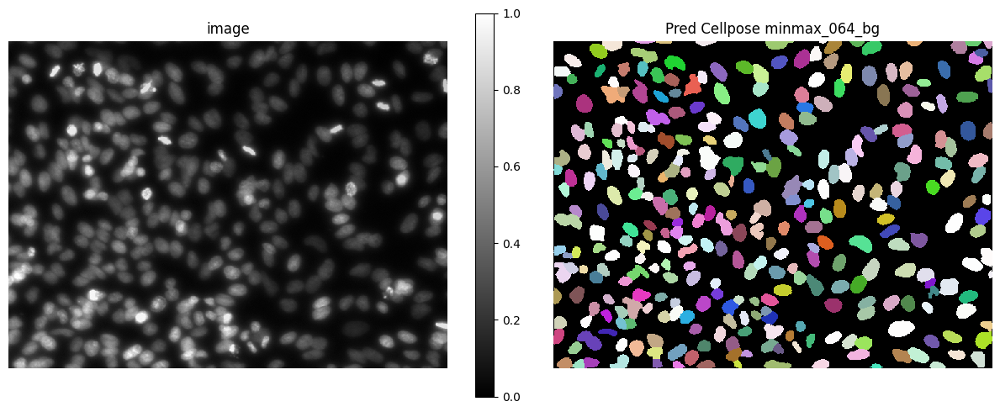

48it [00:01, 24.51it/s]
48it [00:00, 450.13it/s]

2023-05-10 23:09:13,907 [INFO] ** TORCH CUDA version installed and working. **
2023-05-10 23:09:13,908 [INFO] >>>> using GPU
2023-05-10 23:09:13,980 [INFO] computing flows for labels



100%|██████████| 48/48 [00:02<00:00, 16.01it/s]


2023-05-10 23:09:17,162 [INFO] computing flows for labels


100%|██████████| 1/1 [00:00<00:00, 15.44it/s]


2023-05-10 23:09:17,373 [INFO] >>>> median diameter set to = 30
2023-05-10 23:09:17,374 [INFO] >>>> mean of training label mask diameters (saved to model) 20.745
2023-05-10 23:09:17,375 [INFO] >>>> training network with 2 channel input <<<<
2023-05-10 23:09:17,375 [INFO] >>>> LR: 0.01000, batch_size: 8, weight_decay: 0.00010
2023-05-10 23:09:17,376 [INFO] >>>> ntrain = 48, ntest = 1
2023-05-10 23:09:17,377 [INFO] >>>> nimg_per_epoch = 48
2023-05-10 23:09:18,310 [INFO] Epoch 0, Time  0.9s, Loss 4.2069, Loss Test 2.9822, LR 0.0000
2023-05-10 23:09:19,232 [INFO] saving network parameters to models/cellpose/paper_self/models/minmax_256_bg
2023-05-10 23:09:23,047 [INFO] Epoch 5, Time  5.7s, Loss 2.5244, Loss Test 1.9363, LR 0.0056
2023-05-10 23:09:27,712 [INFO] Epoch 10, Time 10.3s, Loss 1.2793, Loss Test 1.0214, LR 0.0100
2023-05-10 23:09:37,092 [INFO] Epoch 20, Time 19.7s, Loss 0.9804, Loss Test 0.8021, LR 0.0100
2023-05-10 23:09:46,389 [INFO] Epoch 30, Time 29.0s, Loss 0.8455, Loss Test 

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


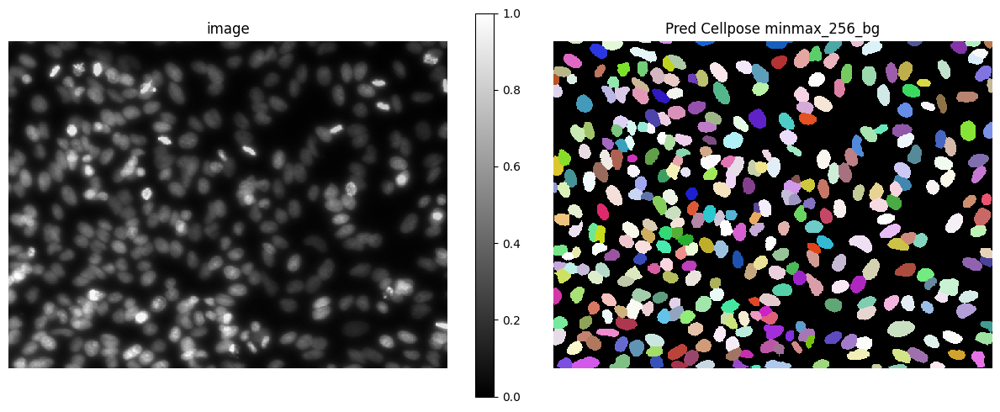

2023-05-10 23:10:51,662 [INFO] ** TORCH CUDA version installed and working. **
2023-05-10 23:10:51,663 [INFO] >>>> using GPU
2023-05-10 23:10:51,733 [INFO] computing flows for labels


100%|██████████| 48/48 [00:02<00:00, 17.30it/s]

2023-05-10 23:10:54,587 [INFO] computing flows for labels



100%|██████████| 1/1 [00:00<00:00, 16.99it/s]


2023-05-10 23:10:54,797 [INFO] >>>> median diameter set to = 30
2023-05-10 23:10:54,798 [INFO] >>>> mean of training label mask diameters (saved to model) 20.745
2023-05-10 23:10:54,798 [INFO] >>>> training network with 2 channel input <<<<
2023-05-10 23:10:54,799 [INFO] >>>> LR: 0.01000, batch_size: 8, weight_decay: 0.00010
2023-05-10 23:10:54,799 [INFO] >>>> ntrain = 48, ntest = 1
2023-05-10 23:10:54,800 [INFO] >>>> nimg_per_epoch = 48
2023-05-10 23:10:55,786 [INFO] Epoch 0, Time  1.0s, Loss 2.7528, Loss Test 2.9824, LR 0.0000
2023-05-10 23:10:56,775 [INFO] saving network parameters to models/cellpose/paper_self/models/minmax_full_bg
2023-05-10 23:11:00,731 [INFO] Epoch 5, Time  5.9s, Loss 1.8147, Loss Test 1.8075, LR 0.0056
2023-05-10 23:11:05,636 [INFO] Epoch 10, Time 10.8s, Loss 0.9027, Loss Test 0.9635, LR 0.0100
2023-05-10 23:11:15,467 [INFO] Epoch 20, Time 20.7s, Loss 0.6921, Loss Test 0.8442, LR 0.0100
2023-05-10 23:11:25,259 [INFO] Epoch 30, Time 30.5s, Loss 0.6010, Loss Test

100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


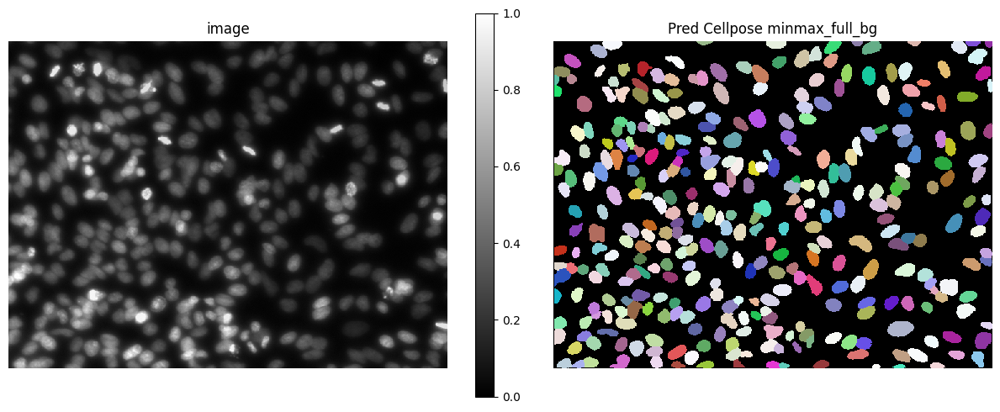

48it [00:01, 26.46it/s]
48it [00:00, 1083.99it/s]
100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

2023-05-10 23:12:35,983 [INFO] DistributedDataParallel is not used.



DistributedDataParallel is not used.


2023-05-10 23:12:38,893 [INFO] Train Epoch: 0 [48/48 (100%)]	Loss: 0.668521	NLL Loss: 1.445002	Center Dice Loss: 0.631520	Smooth Loss: 0.077042


Train Epoch: 0 [48/48 (100%)]	Loss: 0.668521	NLL Loss: 1.445002	Center Dice Loss: 0.631520	Smooth Loss: 0.077042


2023-05-10 23:12:39,046 [INFO] Eval Epoch: 0 	Loss: 0.596472


Eval Epoch: 0 	Loss: 0.596472


2023-05-10 23:12:40,795 [INFO] Train Epoch: 1 [48/48 (100%)]	Loss: 0.559722	NLL Loss: 0.914493	Center Dice Loss: 0.594965	Smooth Loss: 0.028736


Train Epoch: 1 [48/48 (100%)]	Loss: 0.559722	NLL Loss: 0.914493	Center Dice Loss: 0.594965	Smooth Loss: 0.028736


2023-05-10 23:12:40,961 [INFO] Eval Epoch: 1 	Loss: 0.531228


Eval Epoch: 1 	Loss: 0.531228


2023-05-10 23:12:42,718 [INFO] Train Epoch: 2 [48/48 (100%)]	Loss: 0.517276	NLL Loss: 0.793979	Center Dice Loss: 0.558740	Smooth Loss: 0.033253


Train Epoch: 2 [48/48 (100%)]	Loss: 0.517276	NLL Loss: 0.793979	Center Dice Loss: 0.558740	Smooth Loss: 0.033253


2023-05-10 23:12:42,869 [INFO] Eval Epoch: 2 	Loss: 0.464936


Eval Epoch: 2 	Loss: 0.464936


2023-05-10 23:12:45,079 [INFO] Train Epoch: 3 [48/48 (100%)]	Loss: 0.463191	NLL Loss: 0.753562	Center Dice Loss: 0.491231	Smooth Loss: 0.032619


Train Epoch: 3 [48/48 (100%)]	Loss: 0.463191	NLL Loss: 0.753562	Center Dice Loss: 0.491231	Smooth Loss: 0.032619


2023-05-10 23:12:45,224 [INFO] Eval Epoch: 3 	Loss: 0.428146


Eval Epoch: 3 	Loss: 0.428146


2023-05-10 23:12:47,294 [INFO] Train Epoch: 4 [48/48 (100%)]	Loss: 0.465395	NLL Loss: 0.604718	Center Dice Loss: 0.524505	Smooth Loss: 0.030521


Train Epoch: 4 [48/48 (100%)]	Loss: 0.465395	NLL Loss: 0.604718	Center Dice Loss: 0.524505	Smooth Loss: 0.030521


2023-05-10 23:12:47,456 [INFO] Eval Epoch: 4 	Loss: 0.397975


Eval Epoch: 4 	Loss: 0.397975


2023-05-10 23:12:49,551 [INFO] Train Epoch: 5 [48/48 (100%)]	Loss: 0.455751	NLL Loss: 0.727767	Center Dice Loss: 0.486127	Smooth Loss: 0.031856


Train Epoch: 5 [48/48 (100%)]	Loss: 0.455751	NLL Loss: 0.727767	Center Dice Loss: 0.486127	Smooth Loss: 0.031856


2023-05-10 23:12:49,693 [INFO] Eval Epoch: 5 	Loss: 0.434634


Eval Epoch: 5 	Loss: 0.434634


2023-05-10 23:12:52,144 [INFO] Train Epoch: 6 [48/48 (100%)]	Loss: 0.426543	NLL Loss: 0.570858	Center Dice Loss: 0.476590	Smooth Loss: 0.031996


Train Epoch: 6 [48/48 (100%)]	Loss: 0.426543	NLL Loss: 0.570858	Center Dice Loss: 0.476590	Smooth Loss: 0.031996


2023-05-10 23:12:52,296 [INFO] Eval Epoch: 6 	Loss: 0.394974


Eval Epoch: 6 	Loss: 0.394974


2023-05-10 23:12:54,140 [INFO] Train Epoch: 7 [48/48 (100%)]	Loss: 0.406043	NLL Loss: 0.496155	Center Dice Loss: 0.462452	Smooth Loss: 0.033885


Train Epoch: 7 [48/48 (100%)]	Loss: 0.406043	NLL Loss: 0.496155	Center Dice Loss: 0.462452	Smooth Loss: 0.033885


2023-05-10 23:12:54,305 [INFO] Eval Epoch: 7 	Loss: 0.348489


Eval Epoch: 7 	Loss: 0.348489


2023-05-10 23:12:55,972 [INFO] Train Epoch: 8 [48/48 (100%)]	Loss: 0.371995	NLL Loss: 0.523784	Center Dice Loss: 0.408140	Smooth Loss: 0.039480


Train Epoch: 8 [48/48 (100%)]	Loss: 0.371995	NLL Loss: 0.523784	Center Dice Loss: 0.408140	Smooth Loss: 0.039480


2023-05-10 23:12:56,128 [INFO] Eval Epoch: 8 	Loss: 0.378819


Eval Epoch: 8 	Loss: 0.378819


2023-05-10 23:12:58,862 [INFO] Train Epoch: 9 [48/48 (100%)]	Loss: 0.439028	NLL Loss: 0.559433	Center Dice Loss: 0.495382	Smooth Loss: 0.036855


Train Epoch: 9 [48/48 (100%)]	Loss: 0.439028	NLL Loss: 0.559433	Center Dice Loss: 0.495382	Smooth Loss: 0.036855


2023-05-10 23:12:59,025 [INFO] Eval Epoch: 9 	Loss: 0.452155


Eval Epoch: 9 	Loss: 0.452155


2023-05-10 23:13:00,944 [INFO] Train Epoch: 10 [48/48 (100%)]	Loss: 0.442843	NLL Loss: 0.583617	Center Dice Loss: 0.496467	Smooth Loss: 0.033944


Train Epoch: 10 [48/48 (100%)]	Loss: 0.442843	NLL Loss: 0.583617	Center Dice Loss: 0.496467	Smooth Loss: 0.033944


2023-05-10 23:13:01,095 [INFO] Eval Epoch: 10 	Loss: 0.454812


Eval Epoch: 10 	Loss: 0.454812


2023-05-10 23:13:03,310 [INFO] Train Epoch: 11 [48/48 (100%)]	Loss: 0.422661	NLL Loss: 0.542971	Center Dice Loss: 0.477286	Smooth Loss: 0.029225


Train Epoch: 11 [48/48 (100%)]	Loss: 0.422661	NLL Loss: 0.542971	Center Dice Loss: 0.477286	Smooth Loss: 0.029225


2023-05-10 23:13:03,465 [INFO] Eval Epoch: 11 	Loss: 0.459629


Eval Epoch: 11 	Loss: 0.459629


2023-05-10 23:13:05,993 [INFO] Train Epoch: 12 [48/48 (100%)]	Loss: 0.407754	NLL Loss: 0.566597	Center Dice Loss: 0.450595	Smooth Loss: 0.034709


Train Epoch: 12 [48/48 (100%)]	Loss: 0.407754	NLL Loss: 0.566597	Center Dice Loss: 0.450595	Smooth Loss: 0.034709


2023-05-10 23:13:06,149 [INFO] Eval Epoch: 12 	Loss: 0.414156


Eval Epoch: 12 	Loss: 0.414156


2023-05-10 23:13:08,251 [INFO] Train Epoch: 13 [48/48 (100%)]	Loss: 0.394262	NLL Loss: 0.558583	Center Dice Loss: 0.432813	Smooth Loss: 0.037183


Train Epoch: 13 [48/48 (100%)]	Loss: 0.394262	NLL Loss: 0.558583	Center Dice Loss: 0.432813	Smooth Loss: 0.037183


2023-05-10 23:13:08,415 [INFO] Eval Epoch: 13 	Loss: 0.408751


Eval Epoch: 13 	Loss: 0.408751


2023-05-10 23:13:10,845 [INFO] Train Epoch: 14 [48/48 (100%)]	Loss: 0.380706	NLL Loss: 0.518941	Center Dice Loss: 0.422048	Smooth Loss: 0.035766


Train Epoch: 14 [48/48 (100%)]	Loss: 0.380706	NLL Loss: 0.518941	Center Dice Loss: 0.422048	Smooth Loss: 0.035766


2023-05-10 23:13:10,995 [INFO] Eval Epoch: 14 	Loss: 0.366804


Eval Epoch: 14 	Loss: 0.366804


2023-05-10 23:13:13,236 [INFO] Train Epoch: 15 [48/48 (100%)]	Loss: 0.363403	NLL Loss: 0.423900	Center Dice Loss: 0.416530	Smooth Loss: 0.037270


Train Epoch: 15 [48/48 (100%)]	Loss: 0.363403	NLL Loss: 0.423900	Center Dice Loss: 0.416530	Smooth Loss: 0.037270


2023-05-10 23:13:13,394 [INFO] Eval Epoch: 15 	Loss: 0.312873


Eval Epoch: 15 	Loss: 0.312873


2023-05-10 23:13:15,769 [INFO] Train Epoch: 16 [48/48 (100%)]	Loss: 0.363427	NLL Loss: 0.499406	Center Dice Loss: 0.400467	Smooth Loss: 0.042246


Train Epoch: 16 [48/48 (100%)]	Loss: 0.363427	NLL Loss: 0.499406	Center Dice Loss: 0.400467	Smooth Loss: 0.042246


2023-05-10 23:13:15,919 [INFO] Eval Epoch: 16 	Loss: 0.347318


Eval Epoch: 16 	Loss: 0.347318


2023-05-10 23:13:18,239 [INFO] Train Epoch: 17 [48/48 (100%)]	Loss: 0.340203	NLL Loss: 0.510084	Center Dice Loss: 0.365647	Smooth Loss: 0.043099


Train Epoch: 17 [48/48 (100%)]	Loss: 0.340203	NLL Loss: 0.510084	Center Dice Loss: 0.365647	Smooth Loss: 0.043099


2023-05-10 23:13:18,415 [INFO] Eval Epoch: 17 	Loss: 0.310219


Eval Epoch: 17 	Loss: 0.310219


2023-05-10 23:13:20,346 [INFO] Train Epoch: 18 [48/48 (100%)]	Loss: 0.314602	NLL Loss: 0.397969	Center Dice Loss: 0.353196	Smooth Loss: 0.038267


Train Epoch: 18 [48/48 (100%)]	Loss: 0.314602	NLL Loss: 0.397969	Center Dice Loss: 0.353196	Smooth Loss: 0.038267


2023-05-10 23:13:20,507 [INFO] Eval Epoch: 18 	Loss: 0.328505


Eval Epoch: 18 	Loss: 0.328505


2023-05-10 23:13:23,042 [INFO] Train Epoch: 19 [48/48 (100%)]	Loss: 0.372658	NLL Loss: 0.465078	Center Dice Loss: 0.418418	Smooth Loss: 0.051438


Train Epoch: 19 [48/48 (100%)]	Loss: 0.372658	NLL Loss: 0.465078	Center Dice Loss: 0.418418	Smooth Loss: 0.051438


2023-05-10 23:13:23,199 [INFO] Eval Epoch: 19 	Loss: 0.299830


Eval Epoch: 19 	Loss: 0.299830


2023-05-10 23:13:25,968 [INFO] Train Epoch: 20 [48/48 (100%)]	Loss: 0.380063	NLL Loss: 0.557717	Center Dice Loss: 0.410666	Smooth Loss: 0.049392


Train Epoch: 20 [48/48 (100%)]	Loss: 0.380063	NLL Loss: 0.557717	Center Dice Loss: 0.410666	Smooth Loss: 0.049392


2023-05-10 23:13:26,120 [INFO] Eval Epoch: 20 	Loss: 0.378784


Eval Epoch: 20 	Loss: 0.378784


2023-05-10 23:13:28,883 [INFO] Train Epoch: 21 [48/48 (100%)]	Loss: 0.335956	NLL Loss: 0.438510	Center Dice Loss: 0.372956	Smooth Loss: 0.048400


Train Epoch: 21 [48/48 (100%)]	Loss: 0.335956	NLL Loss: 0.438510	Center Dice Loss: 0.372956	Smooth Loss: 0.048400


2023-05-10 23:13:29,045 [INFO] Eval Epoch: 21 	Loss: 0.258912


Eval Epoch: 21 	Loss: 0.258912


2023-05-10 23:13:31,441 [INFO] Train Epoch: 22 [48/48 (100%)]	Loss: 0.337615	NLL Loss: 0.481412	Center Dice Loss: 0.366529	Smooth Loss: 0.049247


Train Epoch: 22 [48/48 (100%)]	Loss: 0.337615	NLL Loss: 0.481412	Center Dice Loss: 0.366529	Smooth Loss: 0.049247


2023-05-10 23:13:31,598 [INFO] Eval Epoch: 22 	Loss: 0.301584


Eval Epoch: 22 	Loss: 0.301584


2023-05-10 23:13:34,123 [INFO] Train Epoch: 23 [48/48 (100%)]	Loss: 0.316332	NLL Loss: 0.418636	Center Dice Loss: 0.349152	Smooth Loss: 0.049931


Train Epoch: 23 [48/48 (100%)]	Loss: 0.316332	NLL Loss: 0.418636	Center Dice Loss: 0.349152	Smooth Loss: 0.049931


2023-05-10 23:13:34,298 [INFO] Eval Epoch: 23 	Loss: 0.264244


Eval Epoch: 23 	Loss: 0.264244


2023-05-10 23:13:36,311 [INFO] Train Epoch: 24 [48/48 (100%)]	Loss: 0.288164	NLL Loss: 0.368569	Center Dice Loss: 0.320692	Smooth Loss: 0.045119


Train Epoch: 24 [48/48 (100%)]	Loss: 0.288164	NLL Loss: 0.368569	Center Dice Loss: 0.320692	Smooth Loss: 0.045119


2023-05-10 23:13:36,467 [INFO] Eval Epoch: 24 	Loss: 0.296624


Eval Epoch: 24 	Loss: 0.296624


2023-05-10 23:13:38,994 [INFO] Train Epoch: 25 [48/48 (100%)]	Loss: 0.256557	NLL Loss: 0.350768	Center Dice Loss: 0.280422	Smooth Loss: 0.043018


Train Epoch: 25 [48/48 (100%)]	Loss: 0.256557	NLL Loss: 0.350768	Center Dice Loss: 0.280422	Smooth Loss: 0.043018


2023-05-10 23:13:39,159 [INFO] Eval Epoch: 25 	Loss: 0.234870


Eval Epoch: 25 	Loss: 0.234870


2023-05-10 23:13:41,652 [INFO] Train Epoch: 26 [48/48 (100%)]	Loss: 0.320269	NLL Loss: 0.367009	Center Dice Loss: 0.365823	Smooth Loss: 0.045756


Train Epoch: 26 [48/48 (100%)]	Loss: 0.320269	NLL Loss: 0.367009	Center Dice Loss: 0.365823	Smooth Loss: 0.045756


2023-05-10 23:13:41,813 [INFO] Eval Epoch: 26 	Loss: 0.327378


Eval Epoch: 26 	Loss: 0.327378


2023-05-10 23:13:44,063 [INFO] Train Epoch: 27 [48/48 (100%)]	Loss: 0.335811	NLL Loss: 0.410928	Center Dice Loss: 0.378760	Smooth Loss: 0.045953


Train Epoch: 27 [48/48 (100%)]	Loss: 0.335811	NLL Loss: 0.410928	Center Dice Loss: 0.378760	Smooth Loss: 0.045953


2023-05-10 23:13:44,217 [INFO] Eval Epoch: 27 	Loss: 0.268748


Eval Epoch: 27 	Loss: 0.268748


2023-05-10 23:13:46,464 [INFO] Train Epoch: 28 [48/48 (100%)]	Loss: 0.364251	NLL Loss: 0.678324	Center Dice Loss: 0.365949	Smooth Loss: 0.041689


Train Epoch: 28 [48/48 (100%)]	Loss: 0.364251	NLL Loss: 0.678324	Center Dice Loss: 0.365949	Smooth Loss: 0.041689


2023-05-10 23:13:46,627 [INFO] Eval Epoch: 28 	Loss: 0.323898


Eval Epoch: 28 	Loss: 0.323898


2023-05-10 23:13:48,956 [INFO] Train Epoch: 29 [48/48 (100%)]	Loss: 0.302401	NLL Loss: 0.498276	Center Dice Loss: 0.315573	Smooth Loss: 0.040667


Train Epoch: 29 [48/48 (100%)]	Loss: 0.302401	NLL Loss: 0.498276	Center Dice Loss: 0.315573	Smooth Loss: 0.040667


2023-05-10 23:13:49,107 [INFO] Eval Epoch: 29 	Loss: 0.386554


Eval Epoch: 29 	Loss: 0.386554


2023-05-10 23:13:51,061 [INFO] Train Epoch: 30 [48/48 (100%)]	Loss: 0.334313	NLL Loss: 0.386522	Center Dice Loss: 0.382654	Smooth Loss: 0.040397


Train Epoch: 30 [48/48 (100%)]	Loss: 0.334313	NLL Loss: 0.386522	Center Dice Loss: 0.382654	Smooth Loss: 0.040397


2023-05-10 23:13:51,216 [INFO] Eval Epoch: 30 	Loss: 0.345873


Eval Epoch: 30 	Loss: 0.345873


2023-05-10 23:13:54,852 [INFO] Train Epoch: 31 [48/48 (100%)]	Loss: 0.283291	NLL Loss: 0.385008	Center Dice Loss: 0.311121	Smooth Loss: 0.042428


Train Epoch: 31 [48/48 (100%)]	Loss: 0.283291	NLL Loss: 0.385008	Center Dice Loss: 0.311121	Smooth Loss: 0.042428


2023-05-10 23:13:55,006 [INFO] Eval Epoch: 31 	Loss: 0.243631


Eval Epoch: 31 	Loss: 0.243631


2023-05-10 23:13:57,484 [INFO] Train Epoch: 32 [48/48 (100%)]	Loss: 0.308951	NLL Loss: 0.424270	Center Dice Loss: 0.338928	Smooth Loss: 0.043747


Train Epoch: 32 [48/48 (100%)]	Loss: 0.308951	NLL Loss: 0.424270	Center Dice Loss: 0.338928	Smooth Loss: 0.043747


2023-05-10 23:13:57,641 [INFO] Eval Epoch: 32 	Loss: 0.287510


Eval Epoch: 32 	Loss: 0.287510


2023-05-10 23:13:59,865 [INFO] Train Epoch: 33 [48/48 (100%)]	Loss: 0.246658	NLL Loss: 0.334641	Center Dice Loss: 0.270017	Smooth Loss: 0.041881


Train Epoch: 33 [48/48 (100%)]	Loss: 0.246658	NLL Loss: 0.334641	Center Dice Loss: 0.270017	Smooth Loss: 0.041881


2023-05-10 23:14:00,027 [INFO] Eval Epoch: 33 	Loss: 0.208877


Eval Epoch: 33 	Loss: 0.208877


2023-05-10 23:14:01,961 [INFO] Train Epoch: 34 [48/48 (100%)]	Loss: 0.237490	NLL Loss: 0.385020	Center Dice Loss: 0.247711	Smooth Loss: 0.038857


Train Epoch: 34 [48/48 (100%)]	Loss: 0.237490	NLL Loss: 0.385020	Center Dice Loss: 0.247711	Smooth Loss: 0.038857


2023-05-10 23:14:02,123 [INFO] Eval Epoch: 34 	Loss: 0.190516


Eval Epoch: 34 	Loss: 0.190516


2023-05-10 23:14:03,825 [INFO] Train Epoch: 35 [48/48 (100%)]	Loss: 0.255333	NLL Loss: 0.401341	Center Dice Loss: 0.269534	Smooth Loss: 0.038317


Train Epoch: 35 [48/48 (100%)]	Loss: 0.255333	NLL Loss: 0.401341	Center Dice Loss: 0.269534	Smooth Loss: 0.038317


2023-05-10 23:14:03,980 [INFO] Eval Epoch: 35 	Loss: 0.278948


Eval Epoch: 35 	Loss: 0.278948


2023-05-10 23:14:07,194 [INFO] Train Epoch: 36 [48/48 (100%)]	Loss: 0.253741	NLL Loss: 0.315489	Center Dice Loss: 0.284120	Smooth Loss: 0.040095


Train Epoch: 36 [48/48 (100%)]	Loss: 0.253741	NLL Loss: 0.315489	Center Dice Loss: 0.284120	Smooth Loss: 0.040095


2023-05-10 23:14:07,350 [INFO] Eval Epoch: 36 	Loss: 0.224965


Eval Epoch: 36 	Loss: 0.224965


2023-05-10 23:14:10,018 [INFO] Train Epoch: 37 [48/48 (100%)]	Loss: 0.259149	NLL Loss: 0.334278	Center Dice Loss: 0.287977	Smooth Loss: 0.039882


Train Epoch: 37 [48/48 (100%)]	Loss: 0.259149	NLL Loss: 0.334278	Center Dice Loss: 0.287977	Smooth Loss: 0.039882


2023-05-10 23:14:10,175 [INFO] Eval Epoch: 37 	Loss: 0.332576


Eval Epoch: 37 	Loss: 0.332576


2023-05-10 23:14:12,277 [INFO] Train Epoch: 38 [48/48 (100%)]	Loss: 0.251728	NLL Loss: 0.336402	Center Dice Loss: 0.277838	Smooth Loss: 0.036505


Train Epoch: 38 [48/48 (100%)]	Loss: 0.251728	NLL Loss: 0.336402	Center Dice Loss: 0.277838	Smooth Loss: 0.036505


2023-05-10 23:14:12,431 [INFO] Eval Epoch: 38 	Loss: 0.187810


Eval Epoch: 38 	Loss: 0.187810


2023-05-10 23:14:14,681 [INFO] Train Epoch: 39 [48/48 (100%)]	Loss: 0.210962	NLL Loss: 0.289013	Center Dice Loss: 0.230758	Smooth Loss: 0.033933


Train Epoch: 39 [48/48 (100%)]	Loss: 0.210962	NLL Loss: 0.289013	Center Dice Loss: 0.230758	Smooth Loss: 0.033933


2023-05-10 23:14:14,841 [INFO] Eval Epoch: 39 	Loss: 0.222258


Eval Epoch: 39 	Loss: 0.222258


2023-05-10 23:14:16,784 [INFO] Train Epoch: 40 [48/48 (100%)]	Loss: 0.192453	NLL Loss: 0.311940	Center Dice Loss: 0.200508	Smooth Loss: 0.032691


Train Epoch: 40 [48/48 (100%)]	Loss: 0.192453	NLL Loss: 0.311940	Center Dice Loss: 0.200508	Smooth Loss: 0.032691


2023-05-10 23:14:16,935 [INFO] Eval Epoch: 40 	Loss: 0.161992


Eval Epoch: 40 	Loss: 0.161992


2023-05-10 23:14:19,705 [INFO] Train Epoch: 41 [48/48 (100%)]	Loss: 0.277911	NLL Loss: 0.497541	Center Dice Loss: 0.283399	Smooth Loss: 0.030841


Train Epoch: 41 [48/48 (100%)]	Loss: 0.277911	NLL Loss: 0.497541	Center Dice Loss: 0.283399	Smooth Loss: 0.030841


2023-05-10 23:14:19,871 [INFO] Eval Epoch: 41 	Loss: 0.251411


Eval Epoch: 41 	Loss: 0.251411


2023-05-10 23:14:22,430 [INFO] Train Epoch: 42 [48/48 (100%)]	Loss: 0.198953	NLL Loss: 0.308283	Center Dice Loss: 0.210708	Smooth Loss: 0.030853


Train Epoch: 42 [48/48 (100%)]	Loss: 0.198953	NLL Loss: 0.308283	Center Dice Loss: 0.210708	Smooth Loss: 0.030853


2023-05-10 23:14:22,578 [INFO] Eval Epoch: 42 	Loss: 0.208672


Eval Epoch: 42 	Loss: 0.208672


2023-05-10 23:14:25,397 [INFO] Train Epoch: 43 [48/48 (100%)]	Loss: 0.203170	NLL Loss: 0.317799	Center Dice Loss: 0.213972	Smooth Loss: 0.034531


Train Epoch: 43 [48/48 (100%)]	Loss: 0.203170	NLL Loss: 0.317799	Center Dice Loss: 0.213972	Smooth Loss: 0.034531


2023-05-10 23:14:25,557 [INFO] Eval Epoch: 43 	Loss: 0.177076


Eval Epoch: 43 	Loss: 0.177076


2023-05-10 23:14:27,528 [INFO] Train Epoch: 44 [48/48 (100%)]	Loss: 0.210482	NLL Loss: 0.280082	Center Dice Loss: 0.231702	Smooth Loss: 0.034782


Train Epoch: 44 [48/48 (100%)]	Loss: 0.210482	NLL Loss: 0.280082	Center Dice Loss: 0.231702	Smooth Loss: 0.034782


2023-05-10 23:14:27,675 [INFO] Eval Epoch: 44 	Loss: 0.186529


Eval Epoch: 44 	Loss: 0.186529


2023-05-10 23:14:29,802 [INFO] Train Epoch: 45 [48/48 (100%)]	Loss: 0.268747	NLL Loss: 0.269417	Center Dice Loss: 0.316362	Smooth Loss: 0.029998


Train Epoch: 45 [48/48 (100%)]	Loss: 0.268747	NLL Loss: 0.269417	Center Dice Loss: 0.316362	Smooth Loss: 0.029998


2023-05-10 23:14:29,958 [INFO] Eval Epoch: 45 	Loss: 0.284306


Eval Epoch: 45 	Loss: 0.284306


2023-05-10 23:14:32,203 [INFO] Train Epoch: 46 [48/48 (100%)]	Loss: 0.246579	NLL Loss: 0.289424	Center Dice Loss: 0.281370	Smooth Loss: 0.029773


Train Epoch: 46 [48/48 (100%)]	Loss: 0.246579	NLL Loss: 0.289424	Center Dice Loss: 0.281370	Smooth Loss: 0.029773


2023-05-10 23:14:32,363 [INFO] Eval Epoch: 46 	Loss: 0.216824


Eval Epoch: 46 	Loss: 0.216824


2023-05-10 23:14:35,128 [INFO] Train Epoch: 47 [48/48 (100%)]	Loss: 0.217755	NLL Loss: 0.350195	Center Dice Loss: 0.229046	Smooth Loss: 0.028857


Train Epoch: 47 [48/48 (100%)]	Loss: 0.217755	NLL Loss: 0.350195	Center Dice Loss: 0.229046	Smooth Loss: 0.028857


2023-05-10 23:14:35,280 [INFO] Eval Epoch: 47 	Loss: 0.161125


Eval Epoch: 47 	Loss: 0.161125


2023-05-10 23:14:38,341 [INFO] Train Epoch: 48 [48/48 (100%)]	Loss: 0.229572	NLL Loss: 0.359470	Center Dice Loss: 0.243605	Smooth Loss: 0.029507


Train Epoch: 48 [48/48 (100%)]	Loss: 0.229572	NLL Loss: 0.359470	Center Dice Loss: 0.243605	Smooth Loss: 0.029507


2023-05-10 23:14:38,491 [INFO] Eval Epoch: 48 	Loss: 0.217807


Eval Epoch: 48 	Loss: 0.217807


2023-05-10 23:14:40,529 [INFO] Train Epoch: 49 [48/48 (100%)]	Loss: 0.260910	NLL Loss: 0.435463	Center Dice Loss: 0.272586	Smooth Loss: 0.027977


Train Epoch: 49 [48/48 (100%)]	Loss: 0.260910	NLL Loss: 0.435463	Center Dice Loss: 0.272586	Smooth Loss: 0.027977


2023-05-10 23:14:40,685 [INFO] Eval Epoch: 49 	Loss: 0.281027


Eval Epoch: 49 	Loss: 0.281027


2023-05-10 23:14:43,484 [INFO] Train Epoch: 50 [48/48 (100%)]	Loss: 0.246060	NLL Loss: 0.265280	Center Dice Loss: 0.285295	Smooth Loss: 0.030669


Train Epoch: 50 [48/48 (100%)]	Loss: 0.246060	NLL Loss: 0.265280	Center Dice Loss: 0.285295	Smooth Loss: 0.030669


2023-05-10 23:14:43,636 [INFO] Eval Epoch: 50 	Loss: 0.211588


Eval Epoch: 50 	Loss: 0.211588


2023-05-10 23:14:46,626 [INFO] Train Epoch: 51 [48/48 (100%)]	Loss: 0.195079	NLL Loss: 0.329330	Center Dice Loss: 0.201118	Smooth Loss: 0.030630


Train Epoch: 51 [48/48 (100%)]	Loss: 0.195079	NLL Loss: 0.329330	Center Dice Loss: 0.201118	Smooth Loss: 0.030630


2023-05-10 23:14:46,786 [INFO] Eval Epoch: 51 	Loss: 0.180208


Eval Epoch: 51 	Loss: 0.180208


2023-05-10 23:14:50,062 [INFO] Train Epoch: 52 [48/48 (100%)]	Loss: 0.202468	NLL Loss: 0.280228	Center Dice Loss: 0.221224	Smooth Loss: 0.030932


Train Epoch: 52 [48/48 (100%)]	Loss: 0.202468	NLL Loss: 0.280228	Center Dice Loss: 0.221224	Smooth Loss: 0.030932


2023-05-10 23:14:50,213 [INFO] Eval Epoch: 52 	Loss: 0.197334


Eval Epoch: 52 	Loss: 0.197334


2023-05-10 23:14:52,298 [INFO] Train Epoch: 53 [48/48 (100%)]	Loss: 0.185277	NLL Loss: 0.224048	Center Dice Loss: 0.208429	Smooth Loss: 0.030745


Train Epoch: 53 [48/48 (100%)]	Loss: 0.185277	NLL Loss: 0.224048	Center Dice Loss: 0.208429	Smooth Loss: 0.030745


2023-05-10 23:14:52,473 [INFO] Eval Epoch: 53 	Loss: 0.176281


Eval Epoch: 53 	Loss: 0.176281


2023-05-10 23:14:55,063 [INFO] Train Epoch: 54 [48/48 (100%)]	Loss: 0.261724	NLL Loss: 0.311282	Center Dice Loss: 0.298386	Smooth Loss: 0.028852


Train Epoch: 54 [48/48 (100%)]	Loss: 0.261724	NLL Loss: 0.311282	Center Dice Loss: 0.298386	Smooth Loss: 0.028852


2023-05-10 23:14:55,223 [INFO] Eval Epoch: 54 	Loss: 0.214351


Eval Epoch: 54 	Loss: 0.214351


2023-05-10 23:14:57,720 [INFO] Train Epoch: 55 [48/48 (100%)]	Loss: 0.272714	NLL Loss: 0.365382	Center Dice Loss: 0.302528	Smooth Loss: 0.030972


Train Epoch: 55 [48/48 (100%)]	Loss: 0.272714	NLL Loss: 0.365382	Center Dice Loss: 0.302528	Smooth Loss: 0.030972


2023-05-10 23:14:57,878 [INFO] Eval Epoch: 55 	Loss: 0.209712


Eval Epoch: 55 	Loss: 0.209712


2023-05-10 23:14:59,900 [INFO] Train Epoch: 56 [48/48 (100%)]	Loss: 0.222767	NLL Loss: 0.330336	Center Dice Loss: 0.239849	Smooth Loss: 0.029789


Train Epoch: 56 [48/48 (100%)]	Loss: 0.222767	NLL Loss: 0.330336	Center Dice Loss: 0.239849	Smooth Loss: 0.029789


2023-05-10 23:15:00,055 [INFO] Eval Epoch: 56 	Loss: 0.179907


Eval Epoch: 56 	Loss: 0.179907


2023-05-10 23:15:02,138 [INFO] Train Epoch: 57 [48/48 (100%)]	Loss: 0.242847	NLL Loss: 0.320566	Center Dice Loss: 0.270494	Smooth Loss: 0.026892


Train Epoch: 57 [48/48 (100%)]	Loss: 0.242847	NLL Loss: 0.320566	Center Dice Loss: 0.270494	Smooth Loss: 0.026892


2023-05-10 23:15:02,307 [INFO] Eval Epoch: 57 	Loss: 0.241924


Eval Epoch: 57 	Loss: 0.241924


2023-05-10 23:15:04,384 [INFO] Train Epoch: 58 [48/48 (100%)]	Loss: 0.259343	NLL Loss: 0.266379	Center Dice Loss: 0.304550	Smooth Loss: 0.026273


Train Epoch: 58 [48/48 (100%)]	Loss: 0.259343	NLL Loss: 0.266379	Center Dice Loss: 0.304550	Smooth Loss: 0.026273


2023-05-10 23:15:04,551 [INFO] Eval Epoch: 58 	Loss: 0.340123


Eval Epoch: 58 	Loss: 0.340123


2023-05-10 23:15:06,803 [INFO] Train Epoch: 59 [48/48 (100%)]	Loss: 0.278551	NLL Loss: 0.342641	Center Dice Loss: 0.315839	Smooth Loss: 0.028016


Train Epoch: 59 [48/48 (100%)]	Loss: 0.278551	NLL Loss: 0.342641	Center Dice Loss: 0.315839	Smooth Loss: 0.028016


2023-05-10 23:15:06,956 [INFO] Eval Epoch: 59 	Loss: 0.199736


Eval Epoch: 59 	Loss: 0.199736


2023-05-10 23:15:09,338 [INFO] Train Epoch: 60 [48/48 (100%)]	Loss: 0.236553	NLL Loss: 0.360442	Center Dice Loss: 0.254201	Smooth Loss: 0.024424


Train Epoch: 60 [48/48 (100%)]	Loss: 0.236553	NLL Loss: 0.360442	Center Dice Loss: 0.254201	Smooth Loss: 0.024424


2023-05-10 23:15:09,490 [INFO] Eval Epoch: 60 	Loss: 0.323000


Eval Epoch: 60 	Loss: 0.323000


2023-05-10 23:15:11,321 [INFO] Train Epoch: 61 [48/48 (100%)]	Loss: 0.219839	NLL Loss: 0.287825	Center Dice Loss: 0.244513	Smooth Loss: 0.028479


Train Epoch: 61 [48/48 (100%)]	Loss: 0.219839	NLL Loss: 0.287825	Center Dice Loss: 0.244513	Smooth Loss: 0.028479


2023-05-10 23:15:11,466 [INFO] Eval Epoch: 61 	Loss: 0.233892


Eval Epoch: 61 	Loss: 0.233892


2023-05-10 23:15:13,236 [INFO] Train Epoch: 62 [48/48 (100%)]	Loss: 0.266923	NLL Loss: 0.323348	Center Dice Loss: 0.302060	Smooth Loss: 0.034814


Train Epoch: 62 [48/48 (100%)]	Loss: 0.266923	NLL Loss: 0.323348	Center Dice Loss: 0.302060	Smooth Loss: 0.034814


2023-05-10 23:15:13,392 [INFO] Eval Epoch: 62 	Loss: 0.267954


Eval Epoch: 62 	Loss: 0.267954


2023-05-10 23:15:15,337 [INFO] Train Epoch: 63 [48/48 (100%)]	Loss: 0.222685	NLL Loss: 0.332966	Center Dice Loss: 0.238539	Smooth Loss: 0.033131


Train Epoch: 63 [48/48 (100%)]	Loss: 0.222685	NLL Loss: 0.332966	Center Dice Loss: 0.238539	Smooth Loss: 0.033131


2023-05-10 23:15:15,501 [INFO] Eval Epoch: 63 	Loss: 0.248998


Eval Epoch: 63 	Loss: 0.248998


2023-05-10 23:15:18,787 [INFO] Train Epoch: 64 [48/48 (100%)]	Loss: 0.227890	NLL Loss: 0.326301	Center Dice Loss: 0.248211	Smooth Loss: 0.027878


Train Epoch: 64 [48/48 (100%)]	Loss: 0.227890	NLL Loss: 0.326301	Center Dice Loss: 0.248211	Smooth Loss: 0.027878


2023-05-10 23:15:18,939 [INFO] Eval Epoch: 64 	Loss: 0.179735


Eval Epoch: 64 	Loss: 0.179735


2023-05-10 23:15:21,300 [INFO] Train Epoch: 65 [48/48 (100%)]	Loss: 0.228816	NLL Loss: 0.309490	Center Dice Loss: 0.253981	Smooth Loss: 0.022317


Train Epoch: 65 [48/48 (100%)]	Loss: 0.228816	NLL Loss: 0.309490	Center Dice Loss: 0.253981	Smooth Loss: 0.022317


2023-05-10 23:15:21,455 [INFO] Eval Epoch: 65 	Loss: 0.179231


Eval Epoch: 65 	Loss: 0.179231


2023-05-10 23:15:23,507 [INFO] Train Epoch: 66 [48/48 (100%)]	Loss: 0.209284	NLL Loss: 0.305521	Center Dice Loss: 0.227570	Smooth Loss: 0.021611


Train Epoch: 66 [48/48 (100%)]	Loss: 0.209284	NLL Loss: 0.305521	Center Dice Loss: 0.227570	Smooth Loss: 0.021611


2023-05-10 23:15:23,658 [INFO] Eval Epoch: 66 	Loss: 0.150452


Eval Epoch: 66 	Loss: 0.150452


2023-05-10 23:15:26,095 [INFO] Train Epoch: 67 [48/48 (100%)]	Loss: 0.191286	NLL Loss: 0.294430	Center Dice Loss: 0.203808	Smooth Loss: 0.025534


Train Epoch: 67 [48/48 (100%)]	Loss: 0.191286	NLL Loss: 0.294430	Center Dice Loss: 0.203808	Smooth Loss: 0.025534


2023-05-10 23:15:26,248 [INFO] Eval Epoch: 67 	Loss: 0.203375


Eval Epoch: 67 	Loss: 0.203375


2023-05-10 23:15:28,156 [INFO] Train Epoch: 68 [48/48 (100%)]	Loss: 0.240170	NLL Loss: 0.281270	Center Dice Loss: 0.275247	Smooth Loss: 0.023681


Train Epoch: 68 [48/48 (100%)]	Loss: 0.240170	NLL Loss: 0.281270	Center Dice Loss: 0.275247	Smooth Loss: 0.023681


2023-05-10 23:15:28,311 [INFO] Eval Epoch: 68 	Loss: 0.191619


Eval Epoch: 68 	Loss: 0.191619


2023-05-10 23:15:30,683 [INFO] Train Epoch: 69 [48/48 (100%)]	Loss: 0.184658	NLL Loss: 0.258811	Center Dice Loss: 0.201806	Smooth Loss: 0.024765


Train Epoch: 69 [48/48 (100%)]	Loss: 0.184658	NLL Loss: 0.258811	Center Dice Loss: 0.201806	Smooth Loss: 0.024765


2023-05-10 23:15:30,844 [INFO] Eval Epoch: 69 	Loss: 0.171769


Eval Epoch: 69 	Loss: 0.171769


2023-05-10 23:15:32,645 [INFO] Train Epoch: 70 [48/48 (100%)]	Loss: 0.183589	NLL Loss: 0.264460	Center Dice Loss: 0.198759	Smooth Loss: 0.026871


Train Epoch: 70 [48/48 (100%)]	Loss: 0.183589	NLL Loss: 0.264460	Center Dice Loss: 0.198759	Smooth Loss: 0.026871


2023-05-10 23:15:32,808 [INFO] Eval Epoch: 70 	Loss: 0.154893


Eval Epoch: 70 	Loss: 0.154893


2023-05-10 23:15:35,459 [INFO] Train Epoch: 71 [48/48 (100%)]	Loss: 0.199851	NLL Loss: 0.257219	Center Dice Loss: 0.223244	Smooth Loss: 0.025520


Train Epoch: 71 [48/48 (100%)]	Loss: 0.199851	NLL Loss: 0.257219	Center Dice Loss: 0.223244	Smooth Loss: 0.025520


2023-05-10 23:15:35,622 [INFO] Eval Epoch: 71 	Loss: 0.214711


Eval Epoch: 71 	Loss: 0.214711


2023-05-10 23:15:37,424 [INFO] Train Epoch: 72 [48/48 (100%)]	Loss: 0.153587	NLL Loss: 0.231192	Center Dice Loss: 0.164263	Smooth Loss: 0.022602


Train Epoch: 72 [48/48 (100%)]	Loss: 0.153587	NLL Loss: 0.231192	Center Dice Loss: 0.164263	Smooth Loss: 0.022602


2023-05-10 23:15:37,583 [INFO] Eval Epoch: 72 	Loss: 0.150343


Eval Epoch: 72 	Loss: 0.150343


2023-05-10 23:15:39,810 [INFO] Train Epoch: 73 [48/48 (100%)]	Loss: 0.169902	NLL Loss: 0.257077	Center Dice Loss: 0.182495	Smooth Loss: 0.019764


Train Epoch: 73 [48/48 (100%)]	Loss: 0.169902	NLL Loss: 0.257077	Center Dice Loss: 0.182495	Smooth Loss: 0.019764


2023-05-10 23:15:39,964 [INFO] Eval Epoch: 73 	Loss: 0.119700


Eval Epoch: 73 	Loss: 0.119700


2023-05-10 23:15:42,891 [INFO] Train Epoch: 74 [48/48 (100%)]	Loss: 0.196711	NLL Loss: 0.247720	Center Dice Loss: 0.222482	Smooth Loss: 0.016851


Train Epoch: 74 [48/48 (100%)]	Loss: 0.196711	NLL Loss: 0.247720	Center Dice Loss: 0.222482	Smooth Loss: 0.016851


2023-05-10 23:15:43,039 [INFO] Eval Epoch: 74 	Loss: 0.156485


Eval Epoch: 74 	Loss: 0.156485


2023-05-10 23:15:44,834 [INFO] Train Epoch: 75 [48/48 (100%)]	Loss: 0.147881	NLL Loss: 0.245495	Center Dice Loss: 0.154795	Smooth Loss: 0.015696


Train Epoch: 75 [48/48 (100%)]	Loss: 0.147881	NLL Loss: 0.245495	Center Dice Loss: 0.154795	Smooth Loss: 0.015696


2023-05-10 23:15:44,998 [INFO] Eval Epoch: 75 	Loss: 0.155874


Eval Epoch: 75 	Loss: 0.155874


2023-05-10 23:15:46,526 [INFO] Train Epoch: 76 [48/48 (100%)]	Loss: 0.244336	NLL Loss: 0.290804	Center Dice Loss: 0.280464	Smooth Loss: 0.017225


Train Epoch: 76 [48/48 (100%)]	Loss: 0.244336	NLL Loss: 0.290804	Center Dice Loss: 0.280464	Smooth Loss: 0.017225


2023-05-10 23:15:46,684 [INFO] Eval Epoch: 76 	Loss: 0.158372


Eval Epoch: 76 	Loss: 0.158372


2023-05-10 23:15:48,489 [INFO] Train Epoch: 77 [48/48 (100%)]	Loss: 0.239659	NLL Loss: 0.514147	Center Dice Loss: 0.228750	Smooth Loss: 0.019718


Train Epoch: 77 [48/48 (100%)]	Loss: 0.239659	NLL Loss: 0.514147	Center Dice Loss: 0.228750	Smooth Loss: 0.019718


2023-05-10 23:15:48,664 [INFO] Eval Epoch: 77 	Loss: 0.197454


Eval Epoch: 77 	Loss: 0.197454


2023-05-10 23:15:51,298 [INFO] Train Epoch: 78 [48/48 (100%)]	Loss: 0.191675	NLL Loss: 0.239932	Center Dice Loss: 0.216735	Smooth Loss: 0.018116


Train Epoch: 78 [48/48 (100%)]	Loss: 0.191675	NLL Loss: 0.239932	Center Dice Loss: 0.216735	Smooth Loss: 0.018116


2023-05-10 23:15:51,454 [INFO] Eval Epoch: 78 	Loss: 0.239111


Eval Epoch: 78 	Loss: 0.239111


2023-05-10 23:15:53,515 [INFO] Train Epoch: 79 [48/48 (100%)]	Loss: 0.182662	NLL Loss: 0.239556	Center Dice Loss: 0.204905	Smooth Loss: 0.014555


Train Epoch: 79 [48/48 (100%)]	Loss: 0.182662	NLL Loss: 0.239556	Center Dice Loss: 0.204905	Smooth Loss: 0.014555


2023-05-10 23:15:53,675 [INFO] Eval Epoch: 79 	Loss: 0.143877


Eval Epoch: 79 	Loss: 0.143877


2023-05-10 23:15:55,874 [INFO] Train Epoch: 80 [48/48 (100%)]	Loss: 0.235267	NLL Loss: 0.312926	Center Dice Loss: 0.263599	Smooth Loss: 0.015949


Train Epoch: 80 [48/48 (100%)]	Loss: 0.235267	NLL Loss: 0.312926	Center Dice Loss: 0.263599	Smooth Loss: 0.015949


2023-05-10 23:15:56,039 [INFO] Eval Epoch: 80 	Loss: 0.253458


Eval Epoch: 80 	Loss: 0.253458


2023-05-10 23:15:57,949 [INFO] Train Epoch: 81 [48/48 (100%)]	Loss: 0.217476	NLL Loss: 0.301157	Center Dice Loss: 0.241145	Smooth Loss: 0.015451


Train Epoch: 81 [48/48 (100%)]	Loss: 0.217476	NLL Loss: 0.301157	Center Dice Loss: 0.241145	Smooth Loss: 0.015451


2023-05-10 23:15:58,123 [INFO] Eval Epoch: 81 	Loss: 0.133997


Eval Epoch: 81 	Loss: 0.133997


2023-05-10 23:16:00,558 [INFO] Train Epoch: 82 [48/48 (100%)]	Loss: 0.204061	NLL Loss: 0.266201	Center Dice Loss: 0.229862	Smooth Loss: 0.012916


Train Epoch: 82 [48/48 (100%)]	Loss: 0.204061	NLL Loss: 0.266201	Center Dice Loss: 0.229862	Smooth Loss: 0.012916


2023-05-10 23:16:00,709 [INFO] Eval Epoch: 82 	Loss: 0.354621


Eval Epoch: 82 	Loss: 0.354621


2023-05-10 23:16:03,387 [INFO] Train Epoch: 83 [48/48 (100%)]	Loss: 0.239665	NLL Loss: 0.256402	Center Dice Loss: 0.281468	Smooth Loss: 0.013910


Train Epoch: 83 [48/48 (100%)]	Loss: 0.239665	NLL Loss: 0.256402	Center Dice Loss: 0.281468	Smooth Loss: 0.013910


2023-05-10 23:16:03,547 [INFO] Eval Epoch: 83 	Loss: 0.142385


Eval Epoch: 83 	Loss: 0.142385


2023-05-10 23:16:06,050 [INFO] Train Epoch: 84 [48/48 (100%)]	Loss: 0.199575	NLL Loss: 0.277191	Center Dice Loss: 0.220724	Smooth Loss: 0.016216


Train Epoch: 84 [48/48 (100%)]	Loss: 0.199575	NLL Loss: 0.277191	Center Dice Loss: 0.220724	Smooth Loss: 0.016216


2023-05-10 23:16:06,198 [INFO] Eval Epoch: 84 	Loss: 0.166158


Eval Epoch: 84 	Loss: 0.166158


2023-05-10 23:16:08,754 [INFO] Train Epoch: 85 [48/48 (100%)]	Loss: 0.202603	NLL Loss: 0.361397	Center Dice Loss: 0.207636	Smooth Loss: 0.018645


Train Epoch: 85 [48/48 (100%)]	Loss: 0.202603	NLL Loss: 0.361397	Center Dice Loss: 0.207636	Smooth Loss: 0.018645


2023-05-10 23:16:08,915 [INFO] Eval Epoch: 85 	Loss: 0.247949


Eval Epoch: 85 	Loss: 0.247949


2023-05-10 23:16:10,888 [INFO] Train Epoch: 86 [48/48 (100%)]	Loss: 0.182986	NLL Loss: 0.257040	Center Dice Loss: 0.201156	Smooth Loss: 0.018081


Train Epoch: 86 [48/48 (100%)]	Loss: 0.182986	NLL Loss: 0.257040	Center Dice Loss: 0.201156	Smooth Loss: 0.018081


2023-05-10 23:16:11,039 [INFO] Eval Epoch: 86 	Loss: 0.239722


Eval Epoch: 86 	Loss: 0.239722


2023-05-10 23:16:13,639 [INFO] Train Epoch: 87 [48/48 (100%)]	Loss: 0.146451	NLL Loss: 0.198716	Center Dice Loss: 0.161280	Smooth Loss: 0.020039


Train Epoch: 87 [48/48 (100%)]	Loss: 0.146451	NLL Loss: 0.198716	Center Dice Loss: 0.161280	Smooth Loss: 0.020039


2023-05-10 23:16:13,802 [INFO] Eval Epoch: 87 	Loss: 0.117189


Eval Epoch: 87 	Loss: 0.117189


2023-05-10 23:16:15,990 [INFO] Train Epoch: 88 [48/48 (100%)]	Loss: 0.176773	NLL Loss: 0.220623	Center Dice Loss: 0.199724	Smooth Loss: 0.018165


Train Epoch: 88 [48/48 (100%)]	Loss: 0.176773	NLL Loss: 0.220623	Center Dice Loss: 0.199724	Smooth Loss: 0.018165


2023-05-10 23:16:16,144 [INFO] Eval Epoch: 88 	Loss: 0.238855


Eval Epoch: 88 	Loss: 0.238855


2023-05-10 23:16:18,751 [INFO] Train Epoch: 89 [48/48 (100%)]	Loss: 0.228174	NLL Loss: 0.235320	Center Dice Loss: 0.268680	Smooth Loss: 0.018497


Train Epoch: 89 [48/48 (100%)]	Loss: 0.228174	NLL Loss: 0.235320	Center Dice Loss: 0.268680	Smooth Loss: 0.018497


2023-05-10 23:16:18,902 [INFO] Eval Epoch: 89 	Loss: 0.144354


Eval Epoch: 89 	Loss: 0.144354


2023-05-10 23:16:21,027 [INFO] Train Epoch: 90 [48/48 (100%)]	Loss: 0.200331	NLL Loss: 0.302537	Center Dice Loss: 0.216183	Smooth Loss: 0.018864


Train Epoch: 90 [48/48 (100%)]	Loss: 0.200331	NLL Loss: 0.302537	Center Dice Loss: 0.216183	Smooth Loss: 0.018864


2023-05-10 23:16:21,181 [INFO] Eval Epoch: 90 	Loss: 0.164644


Eval Epoch: 90 	Loss: 0.164644


2023-05-10 23:16:23,393 [INFO] Train Epoch: 91 [48/48 (100%)]	Loss: 0.180405	NLL Loss: 0.329773	Center Dice Loss: 0.182383	Smooth Loss: 0.021146


Train Epoch: 91 [48/48 (100%)]	Loss: 0.180405	NLL Loss: 0.329773	Center Dice Loss: 0.182383	Smooth Loss: 0.021146


2023-05-10 23:16:23,552 [INFO] Eval Epoch: 91 	Loss: 0.186221


Eval Epoch: 91 	Loss: 0.186221


2023-05-10 23:16:25,898 [INFO] Train Epoch: 92 [48/48 (100%)]	Loss: 0.168854	NLL Loss: 0.254115	Center Dice Loss: 0.181925	Smooth Loss: 0.018240


Train Epoch: 92 [48/48 (100%)]	Loss: 0.168854	NLL Loss: 0.254115	Center Dice Loss: 0.181925	Smooth Loss: 0.018240


2023-05-10 23:16:26,048 [INFO] Eval Epoch: 92 	Loss: 0.162892


Eval Epoch: 92 	Loss: 0.162892


2023-05-10 23:16:28,412 [INFO] Train Epoch: 93 [48/48 (100%)]	Loss: 0.172825	NLL Loss: 0.241753	Center Dice Loss: 0.190728	Smooth Loss: 0.014381


Train Epoch: 93 [48/48 (100%)]	Loss: 0.172825	NLL Loss: 0.241753	Center Dice Loss: 0.190728	Smooth Loss: 0.014381


2023-05-10 23:16:28,561 [INFO] Eval Epoch: 93 	Loss: 0.155944


Eval Epoch: 93 	Loss: 0.155944


2023-05-10 23:16:31,125 [INFO] Train Epoch: 94 [48/48 (100%)]	Loss: 0.205739	NLL Loss: 0.247411	Center Dice Loss: 0.235742	Smooth Loss: 0.014052


Train Epoch: 94 [48/48 (100%)]	Loss: 0.205739	NLL Loss: 0.247411	Center Dice Loss: 0.235742	Smooth Loss: 0.014052


2023-05-10 23:16:31,276 [INFO] Eval Epoch: 94 	Loss: 0.161565


Eval Epoch: 94 	Loss: 0.161565


2023-05-10 23:16:33,630 [INFO] Train Epoch: 95 [48/48 (100%)]	Loss: 0.200413	NLL Loss: 0.288851	Center Dice Loss: 0.218947	Smooth Loss: 0.019302


Train Epoch: 95 [48/48 (100%)]	Loss: 0.200413	NLL Loss: 0.288851	Center Dice Loss: 0.218947	Smooth Loss: 0.019302


2023-05-10 23:16:33,794 [INFO] Eval Epoch: 95 	Loss: 0.216408


Eval Epoch: 95 	Loss: 0.216408


2023-05-10 23:16:36,542 [INFO] Train Epoch: 96 [48/48 (100%)]	Loss: 0.206258	NLL Loss: 0.307259	Center Dice Loss: 0.223065	Smooth Loss: 0.021222


Train Epoch: 96 [48/48 (100%)]	Loss: 0.206258	NLL Loss: 0.307259	Center Dice Loss: 0.223065	Smooth Loss: 0.021222


2023-05-10 23:16:36,695 [INFO] Eval Epoch: 96 	Loss: 0.141364


Eval Epoch: 96 	Loss: 0.141364


2023-05-10 23:16:38,841 [INFO] Train Epoch: 97 [48/48 (100%)]	Loss: 0.147603	NLL Loss: 0.240326	Center Dice Loss: 0.155305	Smooth Loss: 0.016374


Train Epoch: 97 [48/48 (100%)]	Loss: 0.147603	NLL Loss: 0.240326	Center Dice Loss: 0.155305	Smooth Loss: 0.016374


2023-05-10 23:16:38,998 [INFO] Eval Epoch: 97 	Loss: 0.148600


Eval Epoch: 97 	Loss: 0.148600


2023-05-10 23:16:41,642 [INFO] Train Epoch: 98 [48/48 (100%)]	Loss: 0.186941	NLL Loss: 0.287491	Center Dice Loss: 0.201568	Smooth Loss: 0.013255


Train Epoch: 98 [48/48 (100%)]	Loss: 0.186941	NLL Loss: 0.287491	Center Dice Loss: 0.201568	Smooth Loss: 0.013255


2023-05-10 23:16:41,806 [INFO] Eval Epoch: 98 	Loss: 0.141791


Eval Epoch: 98 	Loss: 0.141791


2023-05-10 23:16:44,173 [INFO] Train Epoch: 99 [48/48 (100%)]	Loss: 0.216736	NLL Loss: 0.271257	Center Dice Loss: 0.246682	Smooth Loss: 0.012483


Train Epoch: 99 [48/48 (100%)]	Loss: 0.216736	NLL Loss: 0.271257	Center Dice Loss: 0.246682	Smooth Loss: 0.012483


2023-05-10 23:16:44,332 [INFO] Eval Epoch: 99 	Loss: 0.194034


Eval Epoch: 99 	Loss: 0.194034
100%|██████████| 1/1 [00:00<00:00,  6.90it/s]


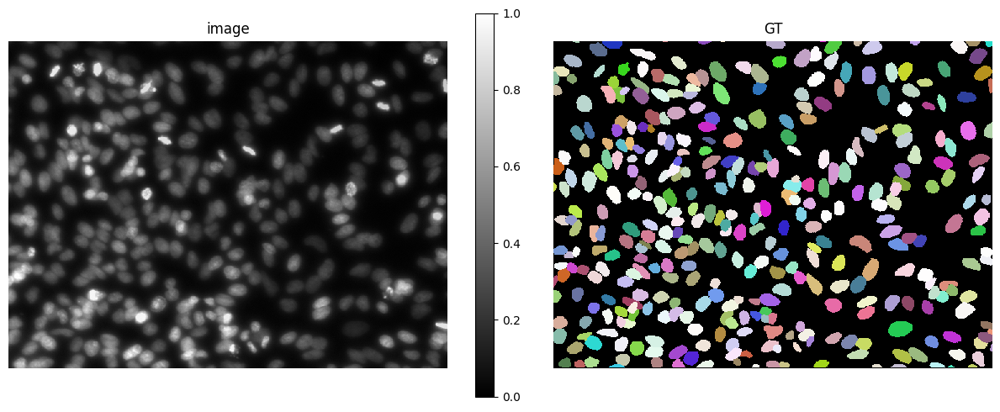

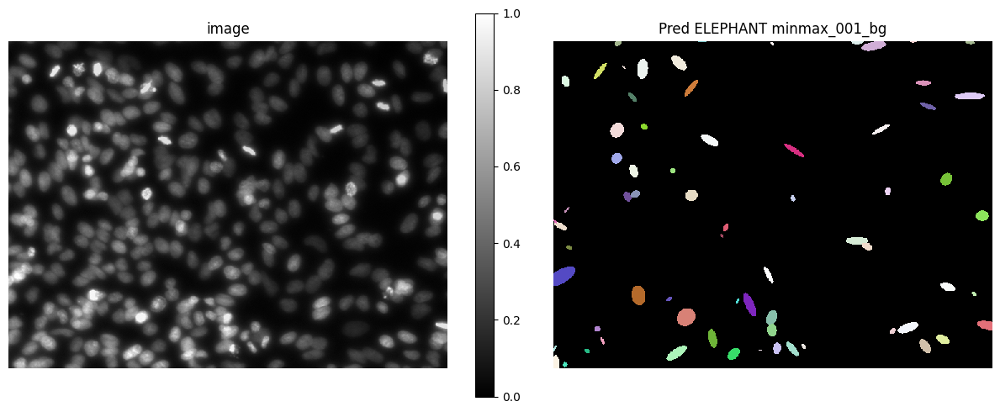

48it [00:01, 27.02it/s]
48it [00:00, 967.74it/s]
100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

2023-05-10 23:16:47,523 [INFO] DistributedDataParallel is not used.



DistributedDataParallel is not used.


2023-05-10 23:16:49,006 [INFO] Train Epoch: 0 [48/48 (100%)]	Loss: 0.737272	NLL Loss: 1.693232	Center Dice Loss: 0.670410	Smooth Loss: 0.115623


Train Epoch: 0 [48/48 (100%)]	Loss: 0.737272	NLL Loss: 1.693232	Center Dice Loss: 0.670410	Smooth Loss: 0.115623


2023-05-10 23:16:49,150 [INFO] Eval Epoch: 0 	Loss: 0.438906


Eval Epoch: 0 	Loss: 0.438906


2023-05-10 23:16:50,391 [INFO] Train Epoch: 1 [48/48 (100%)]	Loss: 0.501360	NLL Loss: 0.909025	Center Dice Loss: 0.514035	Smooth Loss: 0.030322


Train Epoch: 1 [48/48 (100%)]	Loss: 0.501360	NLL Loss: 0.909025	Center Dice Loss: 0.514035	Smooth Loss: 0.030322


2023-05-10 23:16:50,537 [INFO] Eval Epoch: 1 	Loss: 0.443366


Eval Epoch: 1 	Loss: 0.443366


2023-05-10 23:16:51,973 [INFO] Train Epoch: 2 [48/48 (100%)]	Loss: 0.448400	NLL Loss: 0.725762	Center Dice Loss: 0.477891	Smooth Loss: 0.023582


Train Epoch: 2 [48/48 (100%)]	Loss: 0.448400	NLL Loss: 0.725762	Center Dice Loss: 0.477891	Smooth Loss: 0.023582


2023-05-10 23:16:52,135 [INFO] Eval Epoch: 2 	Loss: 0.429444


Eval Epoch: 2 	Loss: 0.429444


2023-05-10 23:16:53,386 [INFO] Train Epoch: 3 [48/48 (100%)]	Loss: 0.357325	NLL Loss: 0.609954	Center Dice Loss: 0.373145	Smooth Loss: 0.025597


Train Epoch: 3 [48/48 (100%)]	Loss: 0.357325	NLL Loss: 0.609954	Center Dice Loss: 0.373145	Smooth Loss: 0.025597


2023-05-10 23:16:53,537 [INFO] Eval Epoch: 3 	Loss: 0.319348


Eval Epoch: 3 	Loss: 0.319348


2023-05-10 23:16:54,677 [INFO] Train Epoch: 4 [48/48 (100%)]	Loss: 0.391299	NLL Loss: 0.594063	Center Dice Loss: 0.423257	Smooth Loss: 0.028741


Train Epoch: 4 [48/48 (100%)]	Loss: 0.391299	NLL Loss: 0.594063	Center Dice Loss: 0.423257	Smooth Loss: 0.028741


2023-05-10 23:16:54,823 [INFO] Eval Epoch: 4 	Loss: 0.348117


Eval Epoch: 4 	Loss: 0.348117


2023-05-10 23:16:56,024 [INFO] Train Epoch: 5 [48/48 (100%)]	Loss: 0.327920	NLL Loss: 0.597829	Center Dice Loss: 0.333188	Smooth Loss: 0.031672


Train Epoch: 5 [48/48 (100%)]	Loss: 0.327920	NLL Loss: 0.597829	Center Dice Loss: 0.333188	Smooth Loss: 0.031672


2023-05-10 23:16:56,175 [INFO] Eval Epoch: 5 	Loss: 0.336066


Eval Epoch: 5 	Loss: 0.336066


2023-05-10 23:16:57,393 [INFO] Train Epoch: 6 [48/48 (100%)]	Loss: 0.276165	NLL Loss: 0.473226	Center Dice Loss: 0.285426	Smooth Loss: 0.032799


Train Epoch: 6 [48/48 (100%)]	Loss: 0.276165	NLL Loss: 0.473226	Center Dice Loss: 0.285426	Smooth Loss: 0.032799


2023-05-10 23:16:57,549 [INFO] Eval Epoch: 6 	Loss: 0.225727


Eval Epoch: 6 	Loss: 0.225727


2023-05-10 23:16:58,906 [INFO] Train Epoch: 7 [48/48 (100%)]	Loss: 0.241939	NLL Loss: 0.445920	Center Dice Loss: 0.243042	Smooth Loss: 0.032447


Train Epoch: 7 [48/48 (100%)]	Loss: 0.241939	NLL Loss: 0.445920	Center Dice Loss: 0.243042	Smooth Loss: 0.032447


2023-05-10 23:16:59,056 [INFO] Eval Epoch: 7 	Loss: 0.223950


Eval Epoch: 7 	Loss: 0.223950


2023-05-10 23:17:00,450 [INFO] Train Epoch: 8 [48/48 (100%)]	Loss: 0.258363	NLL Loss: 0.423826	Center Dice Loss: 0.270145	Smooth Loss: 0.033988


Train Epoch: 8 [48/48 (100%)]	Loss: 0.258363	NLL Loss: 0.423826	Center Dice Loss: 0.270145	Smooth Loss: 0.033988


2023-05-10 23:17:00,601 [INFO] Eval Epoch: 8 	Loss: 0.244829


Eval Epoch: 8 	Loss: 0.244829


2023-05-10 23:17:02,022 [INFO] Train Epoch: 9 [48/48 (100%)]	Loss: 0.219306	NLL Loss: 0.532724	Center Dice Loss: 0.193348	Smooth Loss: 0.035682


Train Epoch: 9 [48/48 (100%)]	Loss: 0.219306	NLL Loss: 0.532724	Center Dice Loss: 0.193348	Smooth Loss: 0.035682


2023-05-10 23:17:02,175 [INFO] Eval Epoch: 9 	Loss: 0.221295


Eval Epoch: 9 	Loss: 0.221295


2023-05-10 23:17:03,404 [INFO] Train Epoch: 10 [48/48 (100%)]	Loss: 0.271720	NLL Loss: 0.511005	Center Dice Loss: 0.271515	Smooth Loss: 0.033460


Train Epoch: 10 [48/48 (100%)]	Loss: 0.271720	NLL Loss: 0.511005	Center Dice Loss: 0.271515	Smooth Loss: 0.033460


2023-05-10 23:17:03,553 [INFO] Eval Epoch: 10 	Loss: 0.253057


Eval Epoch: 10 	Loss: 0.253057


2023-05-10 23:17:04,761 [INFO] Train Epoch: 11 [48/48 (100%)]	Loss: 0.214548	NLL Loss: 0.371801	Center Dice Loss: 0.218961	Smooth Loss: 0.035227


Train Epoch: 11 [48/48 (100%)]	Loss: 0.214548	NLL Loss: 0.371801	Center Dice Loss: 0.218961	Smooth Loss: 0.035227


2023-05-10 23:17:04,905 [INFO] Eval Epoch: 11 	Loss: 0.202243


Eval Epoch: 11 	Loss: 0.202243


2023-05-10 23:17:05,983 [INFO] Train Epoch: 12 [48/48 (100%)]	Loss: 0.209588	NLL Loss: 0.418993	Center Dice Loss: 0.203198	Smooth Loss: 0.032133


Train Epoch: 12 [48/48 (100%)]	Loss: 0.209588	NLL Loss: 0.418993	Center Dice Loss: 0.203198	Smooth Loss: 0.032133


2023-05-10 23:17:06,137 [INFO] Eval Epoch: 12 	Loss: 0.207833


Eval Epoch: 12 	Loss: 0.207833


2023-05-10 23:17:07,513 [INFO] Train Epoch: 13 [48/48 (100%)]	Loss: 0.221909	NLL Loss: 0.437586	Center Dice Loss: 0.216864	Smooth Loss: 0.031458


Train Epoch: 13 [48/48 (100%)]	Loss: 0.221909	NLL Loss: 0.437586	Center Dice Loss: 0.216864	Smooth Loss: 0.031458


2023-05-10 23:17:07,695 [INFO] Eval Epoch: 13 	Loss: 0.193280


Eval Epoch: 13 	Loss: 0.193280


2023-05-10 23:17:09,213 [INFO] Train Epoch: 14 [48/48 (100%)]	Loss: 0.201512	NLL Loss: 0.437988	Center Dice Loss: 0.188551	Smooth Loss: 0.029844


Train Epoch: 14 [48/48 (100%)]	Loss: 0.201512	NLL Loss: 0.437988	Center Dice Loss: 0.188551	Smooth Loss: 0.029844


2023-05-10 23:17:09,365 [INFO] Eval Epoch: 14 	Loss: 0.159877


Eval Epoch: 14 	Loss: 0.159877


2023-05-10 23:17:10,799 [INFO] Train Epoch: 15 [48/48 (100%)]	Loss: 0.214545	NLL Loss: 0.402942	Center Dice Loss: 0.214585	Smooth Loss: 0.025949


Train Epoch: 15 [48/48 (100%)]	Loss: 0.214545	NLL Loss: 0.402942	Center Dice Loss: 0.214585	Smooth Loss: 0.025949


2023-05-10 23:17:10,949 [INFO] Eval Epoch: 15 	Loss: 0.188535


Eval Epoch: 15 	Loss: 0.188535


2023-05-10 23:17:12,364 [INFO] Train Epoch: 16 [48/48 (100%)]	Loss: 0.170879	NLL Loss: 0.351971	Center Dice Loss: 0.163379	Smooth Loss: 0.027289


Train Epoch: 16 [48/48 (100%)]	Loss: 0.170879	NLL Loss: 0.351971	Center Dice Loss: 0.163379	Smooth Loss: 0.027289


2023-05-10 23:17:12,521 [INFO] Eval Epoch: 16 	Loss: 0.167593


Eval Epoch: 16 	Loss: 0.167593


2023-05-10 23:17:13,722 [INFO] Train Epoch: 17 [48/48 (100%)]	Loss: 0.196444	NLL Loss: 0.377069	Center Dice Loss: 0.194301	Smooth Loss: 0.026534


Train Epoch: 17 [48/48 (100%)]	Loss: 0.196444	NLL Loss: 0.377069	Center Dice Loss: 0.194301	Smooth Loss: 0.026534


2023-05-10 23:17:13,876 [INFO] Eval Epoch: 17 	Loss: 0.176202


Eval Epoch: 17 	Loss: 0.176202


2023-05-10 23:17:15,006 [INFO] Train Epoch: 18 [48/48 (100%)]	Loss: 0.178220	NLL Loss: 0.362454	Center Dice Loss: 0.172188	Smooth Loss: 0.024143


Train Epoch: 18 [48/48 (100%)]	Loss: 0.178220	NLL Loss: 0.362454	Center Dice Loss: 0.172188	Smooth Loss: 0.024143


2023-05-10 23:17:15,160 [INFO] Eval Epoch: 18 	Loss: 0.184738


Eval Epoch: 18 	Loss: 0.184738


2023-05-10 23:17:16,507 [INFO] Train Epoch: 19 [48/48 (100%)]	Loss: 0.205492	NLL Loss: 0.439064	Center Dice Loss: 0.194321	Smooth Loss: 0.027776


Train Epoch: 19 [48/48 (100%)]	Loss: 0.205492	NLL Loss: 0.439064	Center Dice Loss: 0.194321	Smooth Loss: 0.027776


2023-05-10 23:17:16,658 [INFO] Eval Epoch: 19 	Loss: 0.221260


Eval Epoch: 19 	Loss: 0.221260


2023-05-10 23:17:17,967 [INFO] Train Epoch: 20 [48/48 (100%)]	Loss: 0.215844	NLL Loss: 0.403356	Center Dice Loss: 0.216298	Smooth Loss: 0.026064


Train Epoch: 20 [48/48 (100%)]	Loss: 0.215844	NLL Loss: 0.403356	Center Dice Loss: 0.216298	Smooth Loss: 0.026064


2023-05-10 23:17:18,120 [INFO] Eval Epoch: 20 	Loss: 0.130004


Eval Epoch: 20 	Loss: 0.130004


2023-05-10 23:17:19,382 [INFO] Train Epoch: 21 [48/48 (100%)]	Loss: 0.200774	NLL Loss: 0.449993	Center Dice Loss: 0.185714	Smooth Loss: 0.026857


Train Epoch: 21 [48/48 (100%)]	Loss: 0.200774	NLL Loss: 0.449993	Center Dice Loss: 0.185714	Smooth Loss: 0.026857


2023-05-10 23:17:19,542 [INFO] Eval Epoch: 21 	Loss: 0.232092


Eval Epoch: 21 	Loss: 0.232092


2023-05-10 23:17:20,778 [INFO] Train Epoch: 22 [48/48 (100%)]	Loss: 0.190734	NLL Loss: 0.398640	Center Dice Loss: 0.181471	Smooth Loss: 0.029146


Train Epoch: 22 [48/48 (100%)]	Loss: 0.190734	NLL Loss: 0.398640	Center Dice Loss: 0.181471	Smooth Loss: 0.029146


2023-05-10 23:17:20,934 [INFO] Eval Epoch: 22 	Loss: 0.258468


Eval Epoch: 22 	Loss: 0.258468


2023-05-10 23:17:22,357 [INFO] Train Epoch: 23 [48/48 (100%)]	Loss: 0.267449	NLL Loss: 0.552676	Center Dice Loss: 0.257563	Smooth Loss: 0.031651


Train Epoch: 23 [48/48 (100%)]	Loss: 0.267449	NLL Loss: 0.552676	Center Dice Loss: 0.257563	Smooth Loss: 0.031651


2023-05-10 23:17:22,511 [INFO] Eval Epoch: 23 	Loss: 0.240963


Eval Epoch: 23 	Loss: 0.240963


2023-05-10 23:17:23,671 [INFO] Train Epoch: 24 [48/48 (100%)]	Loss: 0.203442	NLL Loss: 0.352034	Center Dice Loss: 0.208511	Smooth Loss: 0.029508


Train Epoch: 24 [48/48 (100%)]	Loss: 0.203442	NLL Loss: 0.352034	Center Dice Loss: 0.208511	Smooth Loss: 0.029508


2023-05-10 23:17:23,815 [INFO] Eval Epoch: 24 	Loss: 0.171799


Eval Epoch: 24 	Loss: 0.171799


2023-05-10 23:17:25,188 [INFO] Train Epoch: 25 [48/48 (100%)]	Loss: 0.204993	NLL Loss: 0.400102	Center Dice Loss: 0.200934	Smooth Loss: 0.030176


Train Epoch: 25 [48/48 (100%)]	Loss: 0.204993	NLL Loss: 0.400102	Center Dice Loss: 0.200934	Smooth Loss: 0.030176


2023-05-10 23:17:25,346 [INFO] Eval Epoch: 25 	Loss: 0.195416


Eval Epoch: 25 	Loss: 0.195416


2023-05-10 23:17:26,622 [INFO] Train Epoch: 26 [48/48 (100%)]	Loss: 0.198521	NLL Loss: 0.405776	Center Dice Loss: 0.190777	Smooth Loss: 0.029988


Train Epoch: 26 [48/48 (100%)]	Loss: 0.198521	NLL Loss: 0.405776	Center Dice Loss: 0.190777	Smooth Loss: 0.029988


2023-05-10 23:17:26,769 [INFO] Eval Epoch: 26 	Loss: 0.192407


Eval Epoch: 26 	Loss: 0.192407


2023-05-10 23:17:28,214 [INFO] Train Epoch: 27 [48/48 (100%)]	Loss: 0.161400	NLL Loss: 0.283853	Center Dice Loss: 0.163944	Smooth Loss: 0.026222


Train Epoch: 27 [48/48 (100%)]	Loss: 0.161400	NLL Loss: 0.283853	Center Dice Loss: 0.163944	Smooth Loss: 0.026222


2023-05-10 23:17:28,368 [INFO] Eval Epoch: 27 	Loss: 0.141572


Eval Epoch: 27 	Loss: 0.141572


2023-05-10 23:17:29,589 [INFO] Train Epoch: 28 [48/48 (100%)]	Loss: 0.221470	NLL Loss: 0.395761	Center Dice Loss: 0.225682	Smooth Loss: 0.026116


Train Epoch: 28 [48/48 (100%)]	Loss: 0.221470	NLL Loss: 0.395761	Center Dice Loss: 0.225682	Smooth Loss: 0.026116


2023-05-10 23:17:29,750 [INFO] Eval Epoch: 28 	Loss: 0.225230


Eval Epoch: 28 	Loss: 0.225230


2023-05-10 23:17:31,040 [INFO] Train Epoch: 29 [48/48 (100%)]	Loss: 0.203385	NLL Loss: 0.346150	Center Dice Loss: 0.209455	Smooth Loss: 0.030267


Train Epoch: 29 [48/48 (100%)]	Loss: 0.203385	NLL Loss: 0.346150	Center Dice Loss: 0.209455	Smooth Loss: 0.030267


2023-05-10 23:17:31,194 [INFO] Eval Epoch: 29 	Loss: 0.266185


Eval Epoch: 29 	Loss: 0.266185


2023-05-10 23:17:32,540 [INFO] Train Epoch: 30 [48/48 (100%)]	Loss: 0.177036	NLL Loss: 0.340481	Center Dice Loss: 0.174173	Smooth Loss: 0.027904


Train Epoch: 30 [48/48 (100%)]	Loss: 0.177036	NLL Loss: 0.340481	Center Dice Loss: 0.174173	Smooth Loss: 0.027904


2023-05-10 23:17:32,688 [INFO] Eval Epoch: 30 	Loss: 0.127100


Eval Epoch: 30 	Loss: 0.127100


2023-05-10 23:17:34,234 [INFO] Train Epoch: 31 [48/48 (100%)]	Loss: 0.192959	NLL Loss: 0.361542	Center Dice Loss: 0.192802	Smooth Loss: 0.025160


Train Epoch: 31 [48/48 (100%)]	Loss: 0.192959	NLL Loss: 0.361542	Center Dice Loss: 0.192802	Smooth Loss: 0.025160


2023-05-10 23:17:34,392 [INFO] Eval Epoch: 31 	Loss: 0.136574


Eval Epoch: 31 	Loss: 0.136574


2023-05-10 23:17:36,048 [INFO] Train Epoch: 32 [48/48 (100%)]	Loss: 0.203363	NLL Loss: 0.361798	Center Dice Loss: 0.206495	Smooth Loss: 0.029268


Train Epoch: 32 [48/48 (100%)]	Loss: 0.203363	NLL Loss: 0.361798	Center Dice Loss: 0.206495	Smooth Loss: 0.029268


2023-05-10 23:17:36,195 [INFO] Eval Epoch: 32 	Loss: 0.104947


Eval Epoch: 32 	Loss: 0.104947


2023-05-10 23:17:37,681 [INFO] Train Epoch: 33 [48/48 (100%)]	Loss: 0.214748	NLL Loss: 0.369309	Center Dice Loss: 0.220893	Smooth Loss: 0.029458


Train Epoch: 33 [48/48 (100%)]	Loss: 0.214748	NLL Loss: 0.369309	Center Dice Loss: 0.220893	Smooth Loss: 0.029458


2023-05-10 23:17:37,830 [INFO] Eval Epoch: 33 	Loss: 0.260305


Eval Epoch: 33 	Loss: 0.260305


2023-05-10 23:17:39,480 [INFO] Train Epoch: 34 [48/48 (100%)]	Loss: 0.199141	NLL Loss: 0.366009	Center Dice Loss: 0.199337	Smooth Loss: 0.031287


Train Epoch: 34 [48/48 (100%)]	Loss: 0.199141	NLL Loss: 0.366009	Center Dice Loss: 0.199337	Smooth Loss: 0.031287


2023-05-10 23:17:39,631 [INFO] Eval Epoch: 34 	Loss: 0.120447


Eval Epoch: 34 	Loss: 0.120447


2023-05-10 23:17:41,011 [INFO] Train Epoch: 35 [48/48 (100%)]	Loss: 0.192232	NLL Loss: 0.318540	Center Dice Loss: 0.199666	Smooth Loss: 0.028756


Train Epoch: 35 [48/48 (100%)]	Loss: 0.192232	NLL Loss: 0.318540	Center Dice Loss: 0.199666	Smooth Loss: 0.028756


2023-05-10 23:17:41,167 [INFO] Eval Epoch: 35 	Loss: 0.187653


Eval Epoch: 35 	Loss: 0.187653


2023-05-10 23:17:42,472 [INFO] Train Epoch: 36 [48/48 (100%)]	Loss: 0.179042	NLL Loss: 0.295427	Center Dice Loss: 0.186496	Smooth Loss: 0.025383


Train Epoch: 36 [48/48 (100%)]	Loss: 0.179042	NLL Loss: 0.295427	Center Dice Loss: 0.186496	Smooth Loss: 0.025383


2023-05-10 23:17:42,621 [INFO] Eval Epoch: 36 	Loss: 0.221200


Eval Epoch: 36 	Loss: 0.221200


2023-05-10 23:17:44,047 [INFO] Train Epoch: 37 [48/48 (100%)]	Loss: 0.175743	NLL Loss: 0.307604	Center Dice Loss: 0.179207	Smooth Loss: 0.026559


Train Epoch: 37 [48/48 (100%)]	Loss: 0.175743	NLL Loss: 0.307604	Center Dice Loss: 0.179207	Smooth Loss: 0.026559


2023-05-10 23:17:44,195 [INFO] Eval Epoch: 37 	Loss: 0.210470


Eval Epoch: 37 	Loss: 0.210470


2023-05-10 23:17:45,456 [INFO] Train Epoch: 38 [48/48 (100%)]	Loss: 0.169359	NLL Loss: 0.323309	Center Dice Loss: 0.167248	Smooth Loss: 0.025962


Train Epoch: 38 [48/48 (100%)]	Loss: 0.169359	NLL Loss: 0.323309	Center Dice Loss: 0.167248	Smooth Loss: 0.025962


2023-05-10 23:17:45,633 [INFO] Eval Epoch: 38 	Loss: 0.123479


Eval Epoch: 38 	Loss: 0.123479


2023-05-10 23:17:46,797 [INFO] Train Epoch: 39 [48/48 (100%)]	Loss: 0.211493	NLL Loss: 0.354733	Center Dice Loss: 0.219714	Smooth Loss: 0.027148


Train Epoch: 39 [48/48 (100%)]	Loss: 0.211493	NLL Loss: 0.354733	Center Dice Loss: 0.219714	Smooth Loss: 0.027148


2023-05-10 23:17:46,957 [INFO] Eval Epoch: 39 	Loss: 0.159427


Eval Epoch: 39 	Loss: 0.159427


2023-05-10 23:17:48,275 [INFO] Train Epoch: 40 [48/48 (100%)]	Loss: 0.166330	NLL Loss: 0.270665	Center Dice Loss: 0.173614	Smooth Loss: 0.025578


Train Epoch: 40 [48/48 (100%)]	Loss: 0.166330	NLL Loss: 0.270665	Center Dice Loss: 0.173614	Smooth Loss: 0.025578


2023-05-10 23:17:48,420 [INFO] Eval Epoch: 40 	Loss: 0.192473


Eval Epoch: 40 	Loss: 0.192473


2023-05-10 23:17:49,763 [INFO] Train Epoch: 41 [48/48 (100%)]	Loss: 0.203987	NLL Loss: 0.317633	Center Dice Loss: 0.217150	Smooth Loss: 0.024530


Train Epoch: 41 [48/48 (100%)]	Loss: 0.203987	NLL Loss: 0.317633	Center Dice Loss: 0.217150	Smooth Loss: 0.024530


2023-05-10 23:17:49,923 [INFO] Eval Epoch: 41 	Loss: 0.223844


Eval Epoch: 41 	Loss: 0.223844


2023-05-10 23:17:51,264 [INFO] Train Epoch: 42 [48/48 (100%)]	Loss: 0.173106	NLL Loss: 0.324931	Center Dice Loss: 0.172398	Smooth Loss: 0.024823


Train Epoch: 42 [48/48 (100%)]	Loss: 0.173106	NLL Loss: 0.324931	Center Dice Loss: 0.172398	Smooth Loss: 0.024823


2023-05-10 23:17:51,415 [INFO] Eval Epoch: 42 	Loss: 0.171352


Eval Epoch: 42 	Loss: 0.171352


2023-05-10 23:17:52,662 [INFO] Train Epoch: 43 [48/48 (100%)]	Loss: 0.180853	NLL Loss: 0.362067	Center Dice Loss: 0.174317	Smooth Loss: 0.032317


Train Epoch: 43 [48/48 (100%)]	Loss: 0.180853	NLL Loss: 0.362067	Center Dice Loss: 0.174317	Smooth Loss: 0.032317


2023-05-10 23:17:52,815 [INFO] Eval Epoch: 43 	Loss: 0.181784


Eval Epoch: 43 	Loss: 0.181784


2023-05-10 23:17:54,073 [INFO] Train Epoch: 44 [48/48 (100%)]	Loss: 0.197576	NLL Loss: 0.341155	Center Dice Loss: 0.202534	Smooth Loss: 0.029209


Train Epoch: 44 [48/48 (100%)]	Loss: 0.197576	NLL Loss: 0.341155	Center Dice Loss: 0.202534	Smooth Loss: 0.029209


2023-05-10 23:17:54,226 [INFO] Eval Epoch: 44 	Loss: 0.150783


Eval Epoch: 44 	Loss: 0.150783


2023-05-10 23:17:55,778 [INFO] Train Epoch: 45 [48/48 (100%)]	Loss: 0.151810	NLL Loss: 0.265601	Center Dice Loss: 0.154805	Smooth Loss: 0.023046


Train Epoch: 45 [48/48 (100%)]	Loss: 0.151810	NLL Loss: 0.265601	Center Dice Loss: 0.154805	Smooth Loss: 0.023046


2023-05-10 23:17:55,940 [INFO] Eval Epoch: 45 	Loss: 0.155257


Eval Epoch: 45 	Loss: 0.155257


2023-05-10 23:17:57,231 [INFO] Train Epoch: 46 [48/48 (100%)]	Loss: 0.171659	NLL Loss: 0.271722	Center Dice Loss: 0.181498	Smooth Loss: 0.022403


Train Epoch: 46 [48/48 (100%)]	Loss: 0.171659	NLL Loss: 0.271722	Center Dice Loss: 0.181498	Smooth Loss: 0.022403


2023-05-10 23:17:57,377 [INFO] Eval Epoch: 46 	Loss: 0.218434


Eval Epoch: 46 	Loss: 0.218434


2023-05-10 23:17:58,736 [INFO] Train Epoch: 47 [48/48 (100%)]	Loss: 0.171547	NLL Loss: 0.281024	Center Dice Loss: 0.179419	Smooth Loss: 0.022712


Train Epoch: 47 [48/48 (100%)]	Loss: 0.171547	NLL Loss: 0.281024	Center Dice Loss: 0.179419	Smooth Loss: 0.022712


2023-05-10 23:17:58,896 [INFO] Eval Epoch: 47 	Loss: 0.213563


Eval Epoch: 47 	Loss: 0.213563


2023-05-10 23:18:00,407 [INFO] Train Epoch: 48 [48/48 (100%)]	Loss: 0.164957	NLL Loss: 0.269549	Center Dice Loss: 0.172179	Smooth Loss: 0.024258


Train Epoch: 48 [48/48 (100%)]	Loss: 0.164957	NLL Loss: 0.269549	Center Dice Loss: 0.172179	Smooth Loss: 0.024258


2023-05-10 23:18:00,559 [INFO] Eval Epoch: 48 	Loss: 0.196869


Eval Epoch: 48 	Loss: 0.196869


2023-05-10 23:18:01,794 [INFO] Train Epoch: 49 [48/48 (100%)]	Loss: 0.166538	NLL Loss: 0.285026	Center Dice Loss: 0.170841	Smooth Loss: 0.026532


Train Epoch: 49 [48/48 (100%)]	Loss: 0.166538	NLL Loss: 0.285026	Center Dice Loss: 0.170841	Smooth Loss: 0.026532


2023-05-10 23:18:01,945 [INFO] Eval Epoch: 49 	Loss: 0.114803


Eval Epoch: 49 	Loss: 0.114803


2023-05-10 23:18:03,366 [INFO] Train Epoch: 50 [48/48 (100%)]	Loss: 0.159862	NLL Loss: 0.312822	Center Dice Loss: 0.156147	Smooth Loss: 0.025478


Train Epoch: 50 [48/48 (100%)]	Loss: 0.159862	NLL Loss: 0.312822	Center Dice Loss: 0.156147	Smooth Loss: 0.025478


2023-05-10 23:18:03,509 [INFO] Eval Epoch: 50 	Loss: 0.238839


Eval Epoch: 50 	Loss: 0.238839


2023-05-10 23:18:04,750 [INFO] Train Epoch: 51 [48/48 (100%)]	Loss: 0.181311	NLL Loss: 0.303589	Center Dice Loss: 0.187955	Smooth Loss: 0.025814


Train Epoch: 51 [48/48 (100%)]	Loss: 0.181311	NLL Loss: 0.303589	Center Dice Loss: 0.187955	Smooth Loss: 0.025814


2023-05-10 23:18:04,901 [INFO] Eval Epoch: 51 	Loss: 0.185095


Eval Epoch: 51 	Loss: 0.185095


2023-05-10 23:18:06,209 [INFO] Train Epoch: 52 [48/48 (100%)]	Loss: 0.170194	NLL Loss: 0.279840	Center Dice Loss: 0.177054	Smooth Loss: 0.026245


Train Epoch: 52 [48/48 (100%)]	Loss: 0.170194	NLL Loss: 0.279840	Center Dice Loss: 0.177054	Smooth Loss: 0.026245


2023-05-10 23:18:06,354 [INFO] Eval Epoch: 52 	Loss: 0.158209


Eval Epoch: 52 	Loss: 0.158209


2023-05-10 23:18:07,650 [INFO] Train Epoch: 53 [48/48 (100%)]	Loss: 0.172974	NLL Loss: 0.339376	Center Dice Loss: 0.169140	Smooth Loss: 0.025745


Train Epoch: 53 [48/48 (100%)]	Loss: 0.172974	NLL Loss: 0.339376	Center Dice Loss: 0.169140	Smooth Loss: 0.025745


2023-05-10 23:18:07,801 [INFO] Eval Epoch: 53 	Loss: 0.180241


Eval Epoch: 53 	Loss: 0.180241


2023-05-10 23:18:09,341 [INFO] Train Epoch: 54 [48/48 (100%)]	Loss: 0.187856	NLL Loss: 0.355936	Center Dice Loss: 0.186212	Smooth Loss: 0.027997


Train Epoch: 54 [48/48 (100%)]	Loss: 0.187856	NLL Loss: 0.355936	Center Dice Loss: 0.186212	Smooth Loss: 0.027997


2023-05-10 23:18:09,500 [INFO] Eval Epoch: 54 	Loss: 0.144276


Eval Epoch: 54 	Loss: 0.144276


2023-05-10 23:18:10,717 [INFO] Train Epoch: 55 [48/48 (100%)]	Loss: 0.189982	NLL Loss: 0.310925	Center Dice Loss: 0.197386	Smooth Loss: 0.032017


Train Epoch: 55 [48/48 (100%)]	Loss: 0.189982	NLL Loss: 0.310925	Center Dice Loss: 0.197386	Smooth Loss: 0.032017


2023-05-10 23:18:10,870 [INFO] Eval Epoch: 55 	Loss: 0.136405


Eval Epoch: 55 	Loss: 0.136405


2023-05-10 23:18:12,112 [INFO] Train Epoch: 56 [48/48 (100%)]	Loss: 0.192479	NLL Loss: 0.330062	Center Dice Loss: 0.198393	Smooth Loss: 0.025331


Train Epoch: 56 [48/48 (100%)]	Loss: 0.192479	NLL Loss: 0.330062	Center Dice Loss: 0.198393	Smooth Loss: 0.025331


2023-05-10 23:18:12,260 [INFO] Eval Epoch: 56 	Loss: 0.279396


Eval Epoch: 56 	Loss: 0.279396


2023-05-10 23:18:13,793 [INFO] Train Epoch: 57 [48/48 (100%)]	Loss: 0.199556	NLL Loss: 0.330918	Center Dice Loss: 0.207854	Smooth Loss: 0.026704


Train Epoch: 57 [48/48 (100%)]	Loss: 0.199556	NLL Loss: 0.330918	Center Dice Loss: 0.207854	Smooth Loss: 0.026704


2023-05-10 23:18:13,951 [INFO] Eval Epoch: 57 	Loss: 0.158463


Eval Epoch: 57 	Loss: 0.158463


2023-05-10 23:18:15,447 [INFO] Train Epoch: 58 [48/48 (100%)]	Loss: 0.194462	NLL Loss: 0.332789	Center Dice Loss: 0.200590	Smooth Loss: 0.025493


Train Epoch: 58 [48/48 (100%)]	Loss: 0.194462	NLL Loss: 0.332789	Center Dice Loss: 0.200590	Smooth Loss: 0.025493


2023-05-10 23:18:15,597 [INFO] Eval Epoch: 58 	Loss: 0.129962


Eval Epoch: 58 	Loss: 0.129962


2023-05-10 23:18:17,004 [INFO] Train Epoch: 59 [48/48 (100%)]	Loss: 0.191095	NLL Loss: 0.337179	Center Dice Loss: 0.195032	Smooth Loss: 0.025325


Train Epoch: 59 [48/48 (100%)]	Loss: 0.191095	NLL Loss: 0.337179	Center Dice Loss: 0.195032	Smooth Loss: 0.025325


2023-05-10 23:18:17,152 [INFO] Eval Epoch: 59 	Loss: 0.160762


Eval Epoch: 59 	Loss: 0.160762


2023-05-10 23:18:18,333 [INFO] Train Epoch: 60 [48/48 (100%)]	Loss: 0.166264	NLL Loss: 0.264020	Center Dice Loss: 0.175305	Smooth Loss: 0.023300


Train Epoch: 60 [48/48 (100%)]	Loss: 0.166264	NLL Loss: 0.264020	Center Dice Loss: 0.175305	Smooth Loss: 0.023300


2023-05-10 23:18:18,488 [INFO] Eval Epoch: 60 	Loss: 0.124787


Eval Epoch: 60 	Loss: 0.124787


2023-05-10 23:18:19,896 [INFO] Train Epoch: 61 [48/48 (100%)]	Loss: 0.155082	NLL Loss: 0.321903	Center Dice Loss: 0.147948	Smooth Loss: 0.023930


Train Epoch: 61 [48/48 (100%)]	Loss: 0.155082	NLL Loss: 0.321903	Center Dice Loss: 0.147948	Smooth Loss: 0.023930


2023-05-10 23:18:20,056 [INFO] Eval Epoch: 61 	Loss: 0.240355


Eval Epoch: 61 	Loss: 0.240355


2023-05-10 23:18:21,137 [INFO] Train Epoch: 62 [48/48 (100%)]	Loss: 0.170341	NLL Loss: 0.317400	Center Dice Loss: 0.169871	Smooth Loss: 0.025630


Train Epoch: 62 [48/48 (100%)]	Loss: 0.170341	NLL Loss: 0.317400	Center Dice Loss: 0.169871	Smooth Loss: 0.025630


2023-05-10 23:18:21,298 [INFO] Eval Epoch: 62 	Loss: 0.137868


Eval Epoch: 62 	Loss: 0.137868


2023-05-10 23:18:22,379 [INFO] Train Epoch: 63 [48/48 (100%)]	Loss: 0.193718	NLL Loss: 0.315731	Center Dice Loss: 0.202671	Smooth Loss: 0.026937


Train Epoch: 63 [48/48 (100%)]	Loss: 0.193718	NLL Loss: 0.315731	Center Dice Loss: 0.202671	Smooth Loss: 0.026937


2023-05-10 23:18:22,520 [INFO] Eval Epoch: 63 	Loss: 0.238509


Eval Epoch: 63 	Loss: 0.238509


2023-05-10 23:18:23,931 [INFO] Train Epoch: 64 [48/48 (100%)]	Loss: 0.158506	NLL Loss: 0.291620	Center Dice Loss: 0.157974	Smooth Loss: 0.028057


Train Epoch: 64 [48/48 (100%)]	Loss: 0.158506	NLL Loss: 0.291620	Center Dice Loss: 0.157974	Smooth Loss: 0.028057


2023-05-10 23:18:24,078 [INFO] Eval Epoch: 64 	Loss: 0.139153


Eval Epoch: 64 	Loss: 0.139153


2023-05-10 23:18:25,582 [INFO] Train Epoch: 65 [48/48 (100%)]	Loss: 0.161451	NLL Loss: 0.290479	Center Dice Loss: 0.162586	Smooth Loss: 0.026744


Train Epoch: 65 [48/48 (100%)]	Loss: 0.161451	NLL Loss: 0.290479	Center Dice Loss: 0.162586	Smooth Loss: 0.026744


2023-05-10 23:18:25,729 [INFO] Eval Epoch: 65 	Loss: 0.216214


Eval Epoch: 65 	Loss: 0.216214


2023-05-10 23:18:27,058 [INFO] Train Epoch: 66 [48/48 (100%)]	Loss: 0.166064	NLL Loss: 0.297588	Center Dice Loss: 0.167990	Smooth Loss: 0.024909


Train Epoch: 66 [48/48 (100%)]	Loss: 0.166064	NLL Loss: 0.297588	Center Dice Loss: 0.167990	Smooth Loss: 0.024909


2023-05-10 23:18:27,216 [INFO] Eval Epoch: 66 	Loss: 0.141036


Eval Epoch: 66 	Loss: 0.141036


2023-05-10 23:18:28,817 [INFO] Train Epoch: 67 [48/48 (100%)]	Loss: 0.152878	NLL Loss: 0.255391	Center Dice Loss: 0.156957	Smooth Loss: 0.029969


Train Epoch: 67 [48/48 (100%)]	Loss: 0.152878	NLL Loss: 0.255391	Center Dice Loss: 0.156957	Smooth Loss: 0.029969


2023-05-10 23:18:28,972 [INFO] Eval Epoch: 67 	Loss: 0.120565


Eval Epoch: 67 	Loss: 0.120565


2023-05-10 23:18:30,404 [INFO] Train Epoch: 68 [48/48 (100%)]	Loss: 0.193498	NLL Loss: 0.316143	Center Dice Loss: 0.201665	Smooth Loss: 0.030019


Train Epoch: 68 [48/48 (100%)]	Loss: 0.193498	NLL Loss: 0.316143	Center Dice Loss: 0.201665	Smooth Loss: 0.030019


2023-05-10 23:18:30,559 [INFO] Eval Epoch: 68 	Loss: 0.246613


Eval Epoch: 68 	Loss: 0.246613


2023-05-10 23:18:31,962 [INFO] Train Epoch: 69 [48/48 (100%)]	Loss: 0.139260	NLL Loss: 0.245143	Center Dice Loss: 0.140779	Smooth Loss: 0.025780


Train Epoch: 69 [48/48 (100%)]	Loss: 0.139260	NLL Loss: 0.245143	Center Dice Loss: 0.140779	Smooth Loss: 0.025780


2023-05-10 23:18:32,120 [INFO] Eval Epoch: 69 	Loss: 0.154237


Eval Epoch: 69 	Loss: 0.154237


2023-05-10 23:18:33,543 [INFO] Train Epoch: 70 [48/48 (100%)]	Loss: 0.169684	NLL Loss: 0.289375	Center Dice Loss: 0.174549	Smooth Loss: 0.025665


Train Epoch: 70 [48/48 (100%)]	Loss: 0.169684	NLL Loss: 0.289375	Center Dice Loss: 0.174549	Smooth Loss: 0.025665


2023-05-10 23:18:33,701 [INFO] Eval Epoch: 70 	Loss: 0.223179


Eval Epoch: 70 	Loss: 0.223179


2023-05-10 23:18:35,179 [INFO] Train Epoch: 71 [48/48 (100%)]	Loss: 0.180414	NLL Loss: 0.294486	Center Dice Loss: 0.188205	Smooth Loss: 0.027386


Train Epoch: 71 [48/48 (100%)]	Loss: 0.180414	NLL Loss: 0.294486	Center Dice Loss: 0.188205	Smooth Loss: 0.027386


2023-05-10 23:18:35,328 [INFO] Eval Epoch: 71 	Loss: 0.173215


Eval Epoch: 71 	Loss: 0.173215


2023-05-10 23:18:36,693 [INFO] Train Epoch: 72 [48/48 (100%)]	Loss: 0.173835	NLL Loss: 0.284085	Center Dice Loss: 0.180927	Smooth Loss: 0.028125


Train Epoch: 72 [48/48 (100%)]	Loss: 0.173835	NLL Loss: 0.284085	Center Dice Loss: 0.180927	Smooth Loss: 0.028125


2023-05-10 23:18:36,848 [INFO] Eval Epoch: 72 	Loss: 0.158149


Eval Epoch: 72 	Loss: 0.158149


2023-05-10 23:18:38,135 [INFO] Train Epoch: 73 [48/48 (100%)]	Loss: 0.262533	NLL Loss: 0.450990	Center Dice Loss: 0.271593	Smooth Loss: 0.028773


Train Epoch: 73 [48/48 (100%)]	Loss: 0.262533	NLL Loss: 0.450990	Center Dice Loss: 0.271593	Smooth Loss: 0.028773


2023-05-10 23:18:38,280 [INFO] Eval Epoch: 73 	Loss: 0.264650


Eval Epoch: 73 	Loss: 0.264650


2023-05-10 23:18:39,813 [INFO] Train Epoch: 74 [48/48 (100%)]	Loss: 0.201293	NLL Loss: 0.327355	Center Dice Loss: 0.211118	Smooth Loss: 0.026102


Train Epoch: 74 [48/48 (100%)]	Loss: 0.201293	NLL Loss: 0.327355	Center Dice Loss: 0.211118	Smooth Loss: 0.026102


2023-05-10 23:18:39,975 [INFO] Eval Epoch: 74 	Loss: 0.241863


Eval Epoch: 74 	Loss: 0.241863


2023-05-10 23:18:41,226 [INFO] Train Epoch: 75 [48/48 (100%)]	Loss: 0.203519	NLL Loss: 0.373528	Center Dice Loss: 0.205360	Smooth Loss: 0.024301


Train Epoch: 75 [48/48 (100%)]	Loss: 0.203519	NLL Loss: 0.373528	Center Dice Loss: 0.205360	Smooth Loss: 0.024301


2023-05-10 23:18:41,380 [INFO] Eval Epoch: 75 	Loss: 0.148437


Eval Epoch: 75 	Loss: 0.148437


2023-05-10 23:18:42,821 [INFO] Train Epoch: 76 [48/48 (100%)]	Loss: 0.233776	NLL Loss: 0.369040	Center Dice Loss: 0.249212	Smooth Loss: 0.021330


Train Epoch: 76 [48/48 (100%)]	Loss: 0.233776	NLL Loss: 0.369040	Center Dice Loss: 0.249212	Smooth Loss: 0.021330


2023-05-10 23:18:42,971 [INFO] Eval Epoch: 76 	Loss: 0.187908


Eval Epoch: 76 	Loss: 0.187908


2023-05-10 23:18:44,304 [INFO] Train Epoch: 77 [48/48 (100%)]	Loss: 0.233483	NLL Loss: 0.387179	Center Dice Loss: 0.245133	Smooth Loss: 0.021538


Train Epoch: 77 [48/48 (100%)]	Loss: 0.233483	NLL Loss: 0.387179	Center Dice Loss: 0.245133	Smooth Loss: 0.021538


2023-05-10 23:18:44,454 [INFO] Eval Epoch: 77 	Loss: 0.201502


Eval Epoch: 77 	Loss: 0.201502


2023-05-10 23:18:45,932 [INFO] Train Epoch: 78 [48/48 (100%)]	Loss: 0.193976	NLL Loss: 0.311037	Center Dice Loss: 0.205380	Smooth Loss: 0.019893


Train Epoch: 78 [48/48 (100%)]	Loss: 0.193976	NLL Loss: 0.311037	Center Dice Loss: 0.205380	Smooth Loss: 0.019893


2023-05-10 23:18:46,092 [INFO] Eval Epoch: 78 	Loss: 0.146184


Eval Epoch: 78 	Loss: 0.146184


2023-05-10 23:18:47,523 [INFO] Train Epoch: 79 [48/48 (100%)]	Loss: 0.199585	NLL Loss: 0.396502	Center Dice Loss: 0.195336	Smooth Loss: 0.023917


Train Epoch: 79 [48/48 (100%)]	Loss: 0.199585	NLL Loss: 0.396502	Center Dice Loss: 0.195336	Smooth Loss: 0.023917


2023-05-10 23:18:47,669 [INFO] Eval Epoch: 79 	Loss: 0.147822


Eval Epoch: 79 	Loss: 0.147822


2023-05-10 23:18:48,844 [INFO] Train Epoch: 80 [48/48 (100%)]	Loss: 0.144222	NLL Loss: 0.266217	Center Dice Loss: 0.144369	Smooth Loss: 0.021492


Train Epoch: 80 [48/48 (100%)]	Loss: 0.144222	NLL Loss: 0.266217	Center Dice Loss: 0.144369	Smooth Loss: 0.021492


2023-05-10 23:18:49,000 [INFO] Eval Epoch: 80 	Loss: 0.165909


Eval Epoch: 80 	Loss: 0.165909


2023-05-10 23:18:50,284 [INFO] Train Epoch: 81 [48/48 (100%)]	Loss: 0.157549	NLL Loss: 0.291739	Center Dice Loss: 0.157886	Smooth Loss: 0.021676


Train Epoch: 81 [48/48 (100%)]	Loss: 0.157549	NLL Loss: 0.291739	Center Dice Loss: 0.157886	Smooth Loss: 0.021676


2023-05-10 23:18:50,433 [INFO] Eval Epoch: 81 	Loss: 0.140212


Eval Epoch: 81 	Loss: 0.140212


2023-05-10 23:18:51,717 [INFO] Train Epoch: 82 [48/48 (100%)]	Loss: 0.181500	NLL Loss: 0.290948	Center Dice Loss: 0.191440	Smooth Loss: 0.022352


Train Epoch: 82 [48/48 (100%)]	Loss: 0.181500	NLL Loss: 0.290948	Center Dice Loss: 0.191440	Smooth Loss: 0.022352


2023-05-10 23:18:51,870 [INFO] Eval Epoch: 82 	Loss: 0.205741


Eval Epoch: 82 	Loss: 0.205741


2023-05-10 23:18:53,406 [INFO] Train Epoch: 83 [48/48 (100%)]	Loss: 0.147079	NLL Loss: 0.274897	Center Dice Loss: 0.146317	Smooth Loss: 0.023070


Train Epoch: 83 [48/48 (100%)]	Loss: 0.147079	NLL Loss: 0.274897	Center Dice Loss: 0.146317	Smooth Loss: 0.023070


2023-05-10 23:18:53,567 [INFO] Eval Epoch: 83 	Loss: 0.145250


Eval Epoch: 83 	Loss: 0.145250


2023-05-10 23:18:54,905 [INFO] Train Epoch: 84 [48/48 (100%)]	Loss: 0.168985	NLL Loss: 0.286316	Center Dice Loss: 0.174970	Smooth Loss: 0.021728


Train Epoch: 84 [48/48 (100%)]	Loss: 0.168985	NLL Loss: 0.286316	Center Dice Loss: 0.174970	Smooth Loss: 0.021728


2023-05-10 23:18:55,069 [INFO] Eval Epoch: 84 	Loss: 0.089795


Eval Epoch: 84 	Loss: 0.089795


2023-05-10 23:18:56,527 [INFO] Train Epoch: 85 [48/48 (100%)]	Loss: 0.154172	NLL Loss: 0.252172	Center Dice Loss: 0.160835	Smooth Loss: 0.022854


Train Epoch: 85 [48/48 (100%)]	Loss: 0.154172	NLL Loss: 0.252172	Center Dice Loss: 0.160835	Smooth Loss: 0.022854


2023-05-10 23:18:56,690 [INFO] Eval Epoch: 85 	Loss: 0.146581


Eval Epoch: 85 	Loss: 0.146581


2023-05-10 23:18:58,151 [INFO] Train Epoch: 86 [48/48 (100%)]	Loss: 0.160529	NLL Loss: 0.259764	Center Dice Loss: 0.168057	Smooth Loss: 0.023655


Train Epoch: 86 [48/48 (100%)]	Loss: 0.160529	NLL Loss: 0.259764	Center Dice Loss: 0.168057	Smooth Loss: 0.023655


2023-05-10 23:18:58,309 [INFO] Eval Epoch: 86 	Loss: 0.132875


Eval Epoch: 86 	Loss: 0.132875


2023-05-10 23:18:59,669 [INFO] Train Epoch: 87 [48/48 (100%)]	Loss: 0.151640	NLL Loss: 0.263897	Center Dice Loss: 0.154576	Smooth Loss: 0.024703


Train Epoch: 87 [48/48 (100%)]	Loss: 0.151640	NLL Loss: 0.263897	Center Dice Loss: 0.154576	Smooth Loss: 0.024703


2023-05-10 23:18:59,818 [INFO] Eval Epoch: 87 	Loss: 0.156905


Eval Epoch: 87 	Loss: 0.156905


2023-05-10 23:19:01,005 [INFO] Train Epoch: 88 [48/48 (100%)]	Loss: 0.133883	NLL Loss: 0.243520	Center Dice Loss: 0.134038	Smooth Loss: 0.023472


Train Epoch: 88 [48/48 (100%)]	Loss: 0.133883	NLL Loss: 0.243520	Center Dice Loss: 0.134038	Smooth Loss: 0.023472


2023-05-10 23:19:01,159 [INFO] Eval Epoch: 88 	Loss: 0.116105


Eval Epoch: 88 	Loss: 0.116105


2023-05-10 23:19:02,639 [INFO] Train Epoch: 89 [48/48 (100%)]	Loss: 0.168231	NLL Loss: 0.267265	Center Dice Loss: 0.177691	Smooth Loss: 0.021895


Train Epoch: 89 [48/48 (100%)]	Loss: 0.168231	NLL Loss: 0.267265	Center Dice Loss: 0.177691	Smooth Loss: 0.021895


2023-05-10 23:19:02,808 [INFO] Eval Epoch: 89 	Loss: 0.124847


Eval Epoch: 89 	Loss: 0.124847


2023-05-10 23:19:04,322 [INFO] Train Epoch: 90 [48/48 (100%)]	Loss: 0.175723	NLL Loss: 0.280249	Center Dice Loss: 0.185320	Smooth Loss: 0.023211


Train Epoch: 90 [48/48 (100%)]	Loss: 0.175723	NLL Loss: 0.280249	Center Dice Loss: 0.185320	Smooth Loss: 0.023211


2023-05-10 23:19:04,477 [INFO] Eval Epoch: 90 	Loss: 0.195070


Eval Epoch: 90 	Loss: 0.195070


2023-05-10 23:19:05,792 [INFO] Train Epoch: 91 [48/48 (100%)]	Loss: 0.153145	NLL Loss: 0.254389	Center Dice Loss: 0.159033	Smooth Loss: 0.022461


Train Epoch: 91 [48/48 (100%)]	Loss: 0.153145	NLL Loss: 0.254389	Center Dice Loss: 0.159033	Smooth Loss: 0.022461


2023-05-10 23:19:05,949 [INFO] Eval Epoch: 91 	Loss: 0.115695


Eval Epoch: 91 	Loss: 0.115695


2023-05-10 23:19:07,153 [INFO] Train Epoch: 92 [48/48 (100%)]	Loss: 0.181329	NLL Loss: 0.302074	Center Dice Loss: 0.189489	Smooth Loss: 0.019781


Train Epoch: 92 [48/48 (100%)]	Loss: 0.181329	NLL Loss: 0.302074	Center Dice Loss: 0.189489	Smooth Loss: 0.019781


2023-05-10 23:19:07,317 [INFO] Eval Epoch: 92 	Loss: 0.212855


Eval Epoch: 92 	Loss: 0.212855


2023-05-10 23:19:08,649 [INFO] Train Epoch: 93 [48/48 (100%)]	Loss: 0.179603	NLL Loss: 0.329900	Center Dice Loss: 0.181348	Smooth Loss: 0.020581


Train Epoch: 93 [48/48 (100%)]	Loss: 0.179603	NLL Loss: 0.329900	Center Dice Loss: 0.181348	Smooth Loss: 0.020581


2023-05-10 23:19:08,798 [INFO] Eval Epoch: 93 	Loss: 0.143620


Eval Epoch: 93 	Loss: 0.143620


2023-05-10 23:19:10,481 [INFO] Train Epoch: 94 [48/48 (100%)]	Loss: 0.145442	NLL Loss: 0.246061	Center Dice Loss: 0.149835	Smooth Loss: 0.022857


Train Epoch: 94 [48/48 (100%)]	Loss: 0.145442	NLL Loss: 0.246061	Center Dice Loss: 0.149835	Smooth Loss: 0.022857


2023-05-10 23:19:10,623 [INFO] Eval Epoch: 94 	Loss: 0.179189


Eval Epoch: 94 	Loss: 0.179189


2023-05-10 23:19:11,979 [INFO] Train Epoch: 95 [48/48 (100%)]	Loss: 0.161069	NLL Loss: 0.305959	Center Dice Loss: 0.159429	Smooth Loss: 0.024378


Train Epoch: 95 [48/48 (100%)]	Loss: 0.161069	NLL Loss: 0.305959	Center Dice Loss: 0.159429	Smooth Loss: 0.024378


2023-05-10 23:19:12,134 [INFO] Eval Epoch: 95 	Loss: 0.165204


Eval Epoch: 95 	Loss: 0.165204


2023-05-10 23:19:13,446 [INFO] Train Epoch: 96 [48/48 (100%)]	Loss: 0.149173	NLL Loss: 0.268194	Center Dice Loss: 0.150740	Smooth Loss: 0.022320


Train Epoch: 96 [48/48 (100%)]	Loss: 0.149173	NLL Loss: 0.268194	Center Dice Loss: 0.150740	Smooth Loss: 0.022320


2023-05-10 23:19:13,607 [INFO] Eval Epoch: 96 	Loss: 0.115063


Eval Epoch: 96 	Loss: 0.115063


2023-05-10 23:19:15,058 [INFO] Train Epoch: 97 [48/48 (100%)]	Loss: 0.175111	NLL Loss: 0.278488	Center Dice Loss: 0.185288	Smooth Loss: 0.020853


Train Epoch: 97 [48/48 (100%)]	Loss: 0.175111	NLL Loss: 0.278488	Center Dice Loss: 0.185288	Smooth Loss: 0.020853


2023-05-10 23:19:15,213 [INFO] Eval Epoch: 97 	Loss: 0.209396


Eval Epoch: 97 	Loss: 0.209396


2023-05-10 23:19:16,532 [INFO] Train Epoch: 98 [48/48 (100%)]	Loss: 0.132518	NLL Loss: 0.230917	Center Dice Loss: 0.135102	Smooth Loss: 0.021203


Train Epoch: 98 [48/48 (100%)]	Loss: 0.132518	NLL Loss: 0.230917	Center Dice Loss: 0.135102	Smooth Loss: 0.021203


2023-05-10 23:19:16,682 [INFO] Eval Epoch: 98 	Loss: 0.116483


Eval Epoch: 98 	Loss: 0.116483


2023-05-10 23:19:18,098 [INFO] Train Epoch: 99 [48/48 (100%)]	Loss: 0.204438	NLL Loss: 0.387344	Center Dice Loss: 0.204744	Smooth Loss: 0.020000


Train Epoch: 99 [48/48 (100%)]	Loss: 0.204438	NLL Loss: 0.387344	Center Dice Loss: 0.204744	Smooth Loss: 0.020000


2023-05-10 23:19:18,256 [INFO] Eval Epoch: 99 	Loss: 0.134324


Eval Epoch: 99 	Loss: 0.134324
100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


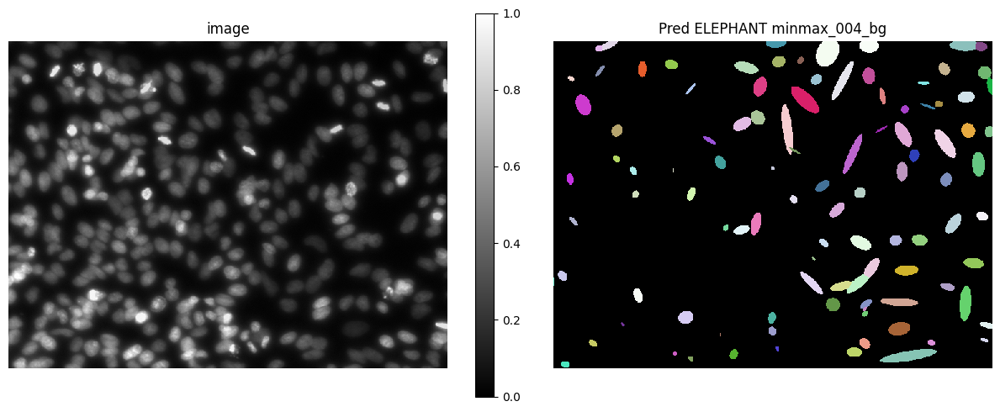

48it [00:01, 27.13it/s]
48it [00:00, 934.30it/s]
100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

2023-05-10 23:19:21,998 [INFO] DistributedDataParallel is not used.



DistributedDataParallel is not used.


2023-05-10 23:19:23,426 [INFO] Train Epoch: 0 [48/48 (100%)]	Loss: 0.599793	NLL Loss: 1.221787	Center Dice Loss: 0.583050	Smooth Loss: 0.061518


Train Epoch: 0 [48/48 (100%)]	Loss: 0.599793	NLL Loss: 1.221787	Center Dice Loss: 0.583050	Smooth Loss: 0.061518


2023-05-10 23:19:23,574 [INFO] Eval Epoch: 0 	Loss: 0.458619


Eval Epoch: 0 	Loss: 0.458619


2023-05-10 23:19:24,617 [INFO] Train Epoch: 1 [48/48 (100%)]	Loss: 0.404754	NLL Loss: 0.803151	Center Dice Loss: 0.398341	Smooth Loss: 0.038422


Train Epoch: 1 [48/48 (100%)]	Loss: 0.404754	NLL Loss: 0.803151	Center Dice Loss: 0.398341	Smooth Loss: 0.038422


2023-05-10 23:19:24,774 [INFO] Eval Epoch: 1 	Loss: 0.389561


Eval Epoch: 1 	Loss: 0.389561


2023-05-10 23:19:25,741 [INFO] Train Epoch: 2 [48/48 (100%)]	Loss: 0.343610	NLL Loss: 0.641444	Center Dice Loss: 0.346202	Smooth Loss: 0.032819


Train Epoch: 2 [48/48 (100%)]	Loss: 0.343610	NLL Loss: 0.641444	Center Dice Loss: 0.346202	Smooth Loss: 0.032819


2023-05-10 23:19:25,885 [INFO] Eval Epoch: 2 	Loss: 0.282412


Eval Epoch: 2 	Loss: 0.282412


2023-05-10 23:19:27,300 [INFO] Train Epoch: 3 [48/48 (100%)]	Loss: 0.287943	NLL Loss: 0.513535	Center Dice Loss: 0.294219	Smooth Loss: 0.030973


Train Epoch: 3 [48/48 (100%)]	Loss: 0.287943	NLL Loss: 0.513535	Center Dice Loss: 0.294219	Smooth Loss: 0.030973


2023-05-10 23:19:27,454 [INFO] Eval Epoch: 3 	Loss: 0.305631


Eval Epoch: 3 	Loss: 0.305631


2023-05-10 23:19:28,807 [INFO] Train Epoch: 4 [48/48 (100%)]	Loss: 0.267107	NLL Loss: 0.503548	Center Dice Loss: 0.266635	Smooth Loss: 0.033026


Train Epoch: 4 [48/48 (100%)]	Loss: 0.267107	NLL Loss: 0.503548	Center Dice Loss: 0.266635	Smooth Loss: 0.033026


2023-05-10 23:19:28,953 [INFO] Eval Epoch: 4 	Loss: 0.237430


Eval Epoch: 4 	Loss: 0.237430


2023-05-10 23:19:30,208 [INFO] Train Epoch: 5 [48/48 (100%)]	Loss: 0.279185	NLL Loss: 0.539007	Center Dice Loss: 0.276837	Smooth Loss: 0.031102


Train Epoch: 5 [48/48 (100%)]	Loss: 0.279185	NLL Loss: 0.539007	Center Dice Loss: 0.276837	Smooth Loss: 0.031102


2023-05-10 23:19:30,368 [INFO] Eval Epoch: 5 	Loss: 0.257738


Eval Epoch: 5 	Loss: 0.257738


2023-05-10 23:19:31,500 [INFO] Train Epoch: 6 [48/48 (100%)]	Loss: 0.265643	NLL Loss: 0.502004	Center Dice Loss: 0.265510	Smooth Loss: 0.029949


Train Epoch: 6 [48/48 (100%)]	Loss: 0.265643	NLL Loss: 0.502004	Center Dice Loss: 0.265510	Smooth Loss: 0.029949


2023-05-10 23:19:31,648 [INFO] Eval Epoch: 6 	Loss: 0.294441


Eval Epoch: 6 	Loss: 0.294441


2023-05-10 23:19:32,913 [INFO] Train Epoch: 7 [48/48 (100%)]	Loss: 0.245667	NLL Loss: 0.485903	Center Dice Loss: 0.241210	Smooth Loss: 0.027712


Train Epoch: 7 [48/48 (100%)]	Loss: 0.245667	NLL Loss: 0.485903	Center Dice Loss: 0.241210	Smooth Loss: 0.027712


2023-05-10 23:19:33,065 [INFO] Eval Epoch: 7 	Loss: 0.257193


Eval Epoch: 7 	Loss: 0.257193


2023-05-10 23:19:34,274 [INFO] Train Epoch: 8 [48/48 (100%)]	Loss: 0.223276	NLL Loss: 0.394417	Center Dice Loss: 0.227962	Smooth Loss: 0.028709


Train Epoch: 8 [48/48 (100%)]	Loss: 0.223276	NLL Loss: 0.394417	Center Dice Loss: 0.227962	Smooth Loss: 0.028709


2023-05-10 23:19:34,441 [INFO] Eval Epoch: 8 	Loss: 0.250953


Eval Epoch: 8 	Loss: 0.250953


2023-05-10 23:19:35,621 [INFO] Train Epoch: 9 [48/48 (100%)]	Loss: 0.223702	NLL Loss: 0.424791	Center Dice Loss: 0.222688	Smooth Loss: 0.027683


Train Epoch: 9 [48/48 (100%)]	Loss: 0.223702	NLL Loss: 0.424791	Center Dice Loss: 0.222688	Smooth Loss: 0.027683


2023-05-10 23:19:35,778 [INFO] Eval Epoch: 9 	Loss: 0.208084


Eval Epoch: 9 	Loss: 0.208084


2023-05-10 23:19:36,848 [INFO] Train Epoch: 10 [48/48 (100%)]	Loss: 0.223945	NLL Loss: 0.435088	Center Dice Loss: 0.220992	Smooth Loss: 0.027566


Train Epoch: 10 [48/48 (100%)]	Loss: 0.223945	NLL Loss: 0.435088	Center Dice Loss: 0.220992	Smooth Loss: 0.027566


2023-05-10 23:19:37,000 [INFO] Eval Epoch: 10 	Loss: 0.175098


Eval Epoch: 10 	Loss: 0.175098


2023-05-10 23:19:38,521 [INFO] Train Epoch: 11 [48/48 (100%)]	Loss: 0.206070	NLL Loss: 0.374999	Center Dice Loss: 0.208259	Smooth Loss: 0.026193


Train Epoch: 11 [48/48 (100%)]	Loss: 0.206070	NLL Loss: 0.374999	Center Dice Loss: 0.208259	Smooth Loss: 0.026193


2023-05-10 23:19:38,676 [INFO] Eval Epoch: 11 	Loss: 0.216050


Eval Epoch: 11 	Loss: 0.216050


2023-05-10 23:19:40,016 [INFO] Train Epoch: 12 [48/48 (100%)]	Loss: 0.187301	NLL Loss: 0.356664	Center Dice Loss: 0.185390	Smooth Loss: 0.027493


Train Epoch: 12 [48/48 (100%)]	Loss: 0.187301	NLL Loss: 0.356664	Center Dice Loss: 0.185390	Smooth Loss: 0.027493


2023-05-10 23:19:40,170 [INFO] Eval Epoch: 12 	Loss: 0.151274


Eval Epoch: 12 	Loss: 0.151274


2023-05-10 23:19:41,477 [INFO] Train Epoch: 13 [48/48 (100%)]	Loss: 0.194901	NLL Loss: 0.360823	Center Dice Loss: 0.195229	Smooth Loss: 0.027339


Train Epoch: 13 [48/48 (100%)]	Loss: 0.194901	NLL Loss: 0.360823	Center Dice Loss: 0.195229	Smooth Loss: 0.027339


2023-05-10 23:19:41,621 [INFO] Eval Epoch: 13 	Loss: 0.214199


Eval Epoch: 13 	Loss: 0.214199


2023-05-10 23:19:42,837 [INFO] Train Epoch: 14 [48/48 (100%)]	Loss: 0.204172	NLL Loss: 0.385319	Center Dice Loss: 0.202985	Smooth Loss: 0.028956


Train Epoch: 14 [48/48 (100%)]	Loss: 0.204172	NLL Loss: 0.385319	Center Dice Loss: 0.202985	Smooth Loss: 0.028956


2023-05-10 23:19:42,993 [INFO] Eval Epoch: 14 	Loss: 0.231568


Eval Epoch: 14 	Loss: 0.231568


2023-05-10 23:19:44,416 [INFO] Train Epoch: 15 [48/48 (100%)]	Loss: 0.190534	NLL Loss: 0.340917	Center Dice Loss: 0.193236	Smooth Loss: 0.026639


Train Epoch: 15 [48/48 (100%)]	Loss: 0.190534	NLL Loss: 0.340917	Center Dice Loss: 0.193236	Smooth Loss: 0.026639


2023-05-10 23:19:44,569 [INFO] Eval Epoch: 15 	Loss: 0.182464


Eval Epoch: 15 	Loss: 0.182464


2023-05-10 23:19:46,070 [INFO] Train Epoch: 16 [48/48 (100%)]	Loss: 0.179911	NLL Loss: 0.330163	Center Dice Loss: 0.180529	Smooth Loss: 0.026565


Train Epoch: 16 [48/48 (100%)]	Loss: 0.179911	NLL Loss: 0.330163	Center Dice Loss: 0.180529	Smooth Loss: 0.026565


2023-05-10 23:19:46,217 [INFO] Eval Epoch: 16 	Loss: 0.189050


Eval Epoch: 16 	Loss: 0.189050


2023-05-10 23:19:47,652 [INFO] Train Epoch: 17 [48/48 (100%)]	Loss: 0.190682	NLL Loss: 0.343512	Center Dice Loss: 0.192633	Smooth Loss: 0.028098


Train Epoch: 17 [48/48 (100%)]	Loss: 0.190682	NLL Loss: 0.343512	Center Dice Loss: 0.192633	Smooth Loss: 0.028098


2023-05-10 23:19:47,803 [INFO] Eval Epoch: 17 	Loss: 0.176799


Eval Epoch: 17 	Loss: 0.176799


2023-05-10 23:19:48,952 [INFO] Train Epoch: 18 [48/48 (100%)]	Loss: 0.187100	NLL Loss: 0.329370	Center Dice Loss: 0.190407	Smooth Loss: 0.028299


Train Epoch: 18 [48/48 (100%)]	Loss: 0.187100	NLL Loss: 0.329370	Center Dice Loss: 0.190407	Smooth Loss: 0.028299


2023-05-10 23:19:49,107 [INFO] Eval Epoch: 18 	Loss: 0.182663


Eval Epoch: 18 	Loss: 0.182663


2023-05-10 23:19:50,423 [INFO] Train Epoch: 19 [48/48 (100%)]	Loss: 0.182355	NLL Loss: 0.334290	Center Dice Loss: 0.182638	Smooth Loss: 0.029007


Train Epoch: 19 [48/48 (100%)]	Loss: 0.182355	NLL Loss: 0.334290	Center Dice Loss: 0.182638	Smooth Loss: 0.029007


2023-05-10 23:19:50,573 [INFO] Eval Epoch: 19 	Loss: 0.187036


Eval Epoch: 19 	Loss: 0.187036


2023-05-10 23:19:51,707 [INFO] Train Epoch: 20 [48/48 (100%)]	Loss: 0.202063	NLL Loss: 0.381062	Center Dice Loss: 0.201586	Smooth Loss: 0.025455


Train Epoch: 20 [48/48 (100%)]	Loss: 0.202063	NLL Loss: 0.381062	Center Dice Loss: 0.201586	Smooth Loss: 0.025455


2023-05-10 23:19:51,854 [INFO] Eval Epoch: 20 	Loss: 0.157596


Eval Epoch: 20 	Loss: 0.157596


2023-05-10 23:19:53,197 [INFO] Train Epoch: 21 [48/48 (100%)]	Loss: 0.201809	NLL Loss: 0.342414	Center Dice Loss: 0.209228	Smooth Loss: 0.024105


Train Epoch: 21 [48/48 (100%)]	Loss: 0.201809	NLL Loss: 0.342414	Center Dice Loss: 0.209228	Smooth Loss: 0.024105


2023-05-10 23:19:53,345 [INFO] Eval Epoch: 21 	Loss: 0.206697


Eval Epoch: 21 	Loss: 0.206697


2023-05-10 23:19:54,810 [INFO] Train Epoch: 22 [48/48 (100%)]	Loss: 0.209842	NLL Loss: 0.356323	Center Dice Loss: 0.217795	Smooth Loss: 0.023595


Train Epoch: 22 [48/48 (100%)]	Loss: 0.209842	NLL Loss: 0.356323	Center Dice Loss: 0.217795	Smooth Loss: 0.023595


2023-05-10 23:19:54,967 [INFO] Eval Epoch: 22 	Loss: 0.206545


Eval Epoch: 22 	Loss: 0.206545


2023-05-10 23:19:55,956 [INFO] Train Epoch: 23 [48/48 (100%)]	Loss: 0.181474	NLL Loss: 0.323045	Center Dice Loss: 0.184478	Smooth Loss: 0.024881


Train Epoch: 23 [48/48 (100%)]	Loss: 0.181474	NLL Loss: 0.323045	Center Dice Loss: 0.184478	Smooth Loss: 0.024881


2023-05-10 23:19:56,106 [INFO] Eval Epoch: 23 	Loss: 0.195431


Eval Epoch: 23 	Loss: 0.195431


2023-05-10 23:19:57,496 [INFO] Train Epoch: 24 [48/48 (100%)]	Loss: 0.162474	NLL Loss: 0.296969	Center Dice Loss: 0.162037	Smooth Loss: 0.030166


Train Epoch: 24 [48/48 (100%)]	Loss: 0.162474	NLL Loss: 0.296969	Center Dice Loss: 0.162037	Smooth Loss: 0.030166


2023-05-10 23:19:57,651 [INFO] Eval Epoch: 24 	Loss: 0.165526


Eval Epoch: 24 	Loss: 0.165526


2023-05-10 23:19:59,161 [INFO] Train Epoch: 25 [48/48 (100%)]	Loss: 0.169435	NLL Loss: 0.315809	Center Dice Loss: 0.167739	Smooth Loss: 0.031541


Train Epoch: 25 [48/48 (100%)]	Loss: 0.169435	NLL Loss: 0.315809	Center Dice Loss: 0.167739	Smooth Loss: 0.031541


2023-05-10 23:19:59,310 [INFO] Eval Epoch: 25 	Loss: 0.150252


Eval Epoch: 25 	Loss: 0.150252


2023-05-10 23:20:00,529 [INFO] Train Epoch: 26 [48/48 (100%)]	Loss: 0.174717	NLL Loss: 0.314957	Center Dice Loss: 0.175693	Smooth Loss: 0.029599


Train Epoch: 26 [48/48 (100%)]	Loss: 0.174717	NLL Loss: 0.314957	Center Dice Loss: 0.175693	Smooth Loss: 0.029599


2023-05-10 23:20:00,686 [INFO] Eval Epoch: 26 	Loss: 0.185176


Eval Epoch: 26 	Loss: 0.185176


2023-05-10 23:20:01,826 [INFO] Train Epoch: 27 [48/48 (100%)]	Loss: 0.199547	NLL Loss: 0.353962	Center Dice Loss: 0.202484	Smooth Loss: 0.030449


Train Epoch: 27 [48/48 (100%)]	Loss: 0.199547	NLL Loss: 0.353962	Center Dice Loss: 0.202484	Smooth Loss: 0.030449


2023-05-10 23:20:01,974 [INFO] Eval Epoch: 27 	Loss: 0.188137


Eval Epoch: 27 	Loss: 0.188137


2023-05-10 23:20:03,296 [INFO] Train Epoch: 28 [48/48 (100%)]	Loss: 0.172215	NLL Loss: 0.312966	Center Dice Loss: 0.173268	Smooth Loss: 0.026200


Train Epoch: 28 [48/48 (100%)]	Loss: 0.172215	NLL Loss: 0.312966	Center Dice Loss: 0.173268	Smooth Loss: 0.026200


2023-05-10 23:20:03,452 [INFO] Eval Epoch: 28 	Loss: 0.146674


Eval Epoch: 28 	Loss: 0.146674


2023-05-10 23:20:04,645 [INFO] Train Epoch: 29 [48/48 (100%)]	Loss: 0.170068	NLL Loss: 0.323317	Center Dice Loss: 0.168601	Smooth Loss: 0.024152


Train Epoch: 29 [48/48 (100%)]	Loss: 0.170068	NLL Loss: 0.323317	Center Dice Loss: 0.168601	Smooth Loss: 0.024152


2023-05-10 23:20:04,797 [INFO] Eval Epoch: 29 	Loss: 0.175444


Eval Epoch: 29 	Loss: 0.175444


2023-05-10 23:20:06,174 [INFO] Train Epoch: 30 [48/48 (100%)]	Loss: 0.186543	NLL Loss: 0.366217	Center Dice Loss: 0.182971	Smooth Loss: 0.024727


Train Epoch: 30 [48/48 (100%)]	Loss: 0.186543	NLL Loss: 0.366217	Center Dice Loss: 0.182971	Smooth Loss: 0.024727


2023-05-10 23:20:06,334 [INFO] Eval Epoch: 30 	Loss: 0.239135


Eval Epoch: 30 	Loss: 0.239135


2023-05-10 23:20:07,756 [INFO] Train Epoch: 31 [48/48 (100%)]	Loss: 0.173339	NLL Loss: 0.325289	Center Dice Loss: 0.172207	Smooth Loss: 0.027050


Train Epoch: 31 [48/48 (100%)]	Loss: 0.173339	NLL Loss: 0.325289	Center Dice Loss: 0.172207	Smooth Loss: 0.027050


2023-05-10 23:20:07,908 [INFO] Eval Epoch: 31 	Loss: 0.158984


Eval Epoch: 31 	Loss: 0.158984


2023-05-10 23:20:09,110 [INFO] Train Epoch: 32 [48/48 (100%)]	Loss: 0.162286	NLL Loss: 0.292357	Center Dice Loss: 0.163384	Smooth Loss: 0.026729


Train Epoch: 32 [48/48 (100%)]	Loss: 0.162286	NLL Loss: 0.292357	Center Dice Loss: 0.163384	Smooth Loss: 0.026729


2023-05-10 23:20:09,264 [INFO] Eval Epoch: 32 	Loss: 0.151654


Eval Epoch: 32 	Loss: 0.151654


2023-05-10 23:20:10,782 [INFO] Train Epoch: 33 [48/48 (100%)]	Loss: 0.176154	NLL Loss: 0.320189	Center Dice Loss: 0.176689	Smooth Loss: 0.029444


Train Epoch: 33 [48/48 (100%)]	Loss: 0.176154	NLL Loss: 0.320189	Center Dice Loss: 0.176689	Smooth Loss: 0.029444


2023-05-10 23:20:10,936 [INFO] Eval Epoch: 33 	Loss: 0.169750


Eval Epoch: 33 	Loss: 0.169750


2023-05-10 23:20:12,295 [INFO] Train Epoch: 34 [48/48 (100%)]	Loss: 0.170399	NLL Loss: 0.304161	Center Dice Loss: 0.171736	Smooth Loss: 0.029951


Train Epoch: 34 [48/48 (100%)]	Loss: 0.170399	NLL Loss: 0.304161	Center Dice Loss: 0.171736	Smooth Loss: 0.029951


2023-05-10 23:20:12,441 [INFO] Eval Epoch: 34 	Loss: 0.184320


Eval Epoch: 34 	Loss: 0.184320


2023-05-10 23:20:14,137 [INFO] Train Epoch: 35 [48/48 (100%)]	Loss: 0.150117	NLL Loss: 0.266606	Center Dice Loss: 0.151369	Smooth Loss: 0.027367


Train Epoch: 35 [48/48 (100%)]	Loss: 0.150117	NLL Loss: 0.266606	Center Dice Loss: 0.151369	Smooth Loss: 0.027367


2023-05-10 23:20:14,290 [INFO] Eval Epoch: 35 	Loss: 0.182281


Eval Epoch: 35 	Loss: 0.182281


2023-05-10 23:20:15,525 [INFO] Train Epoch: 36 [48/48 (100%)]	Loss: 0.153444	NLL Loss: 0.287468	Center Dice Loss: 0.151397	Smooth Loss: 0.029657


Train Epoch: 36 [48/48 (100%)]	Loss: 0.153444	NLL Loss: 0.287468	Center Dice Loss: 0.151397	Smooth Loss: 0.029657


2023-05-10 23:20:15,683 [INFO] Eval Epoch: 36 	Loss: 0.146535


Eval Epoch: 36 	Loss: 0.146535


2023-05-10 23:20:17,079 [INFO] Train Epoch: 37 [48/48 (100%)]	Loss: 0.148067	NLL Loss: 0.266998	Center Dice Loss: 0.148374	Smooth Loss: 0.027597


Train Epoch: 37 [48/48 (100%)]	Loss: 0.148067	NLL Loss: 0.266998	Center Dice Loss: 0.148374	Smooth Loss: 0.027597


2023-05-10 23:20:17,234 [INFO] Eval Epoch: 37 	Loss: 0.176836


Eval Epoch: 37 	Loss: 0.176836


2023-05-10 23:20:18,382 [INFO] Train Epoch: 38 [48/48 (100%)]	Loss: 0.169491	NLL Loss: 0.305222	Center Dice Loss: 0.170560	Smooth Loss: 0.028415


Train Epoch: 38 [48/48 (100%)]	Loss: 0.169491	NLL Loss: 0.305222	Center Dice Loss: 0.170560	Smooth Loss: 0.028415


2023-05-10 23:20:18,532 [INFO] Eval Epoch: 38 	Loss: 0.183772


Eval Epoch: 38 	Loss: 0.183772


2023-05-10 23:20:19,892 [INFO] Train Epoch: 39 [48/48 (100%)]	Loss: 0.160626	NLL Loss: 0.290887	Center Dice Loss: 0.161390	Smooth Loss: 0.026544


Train Epoch: 39 [48/48 (100%)]	Loss: 0.160626	NLL Loss: 0.290887	Center Dice Loss: 0.161390	Smooth Loss: 0.026544


2023-05-10 23:20:20,060 [INFO] Eval Epoch: 39 	Loss: 0.154878


Eval Epoch: 39 	Loss: 0.154878


2023-05-10 23:20:21,350 [INFO] Train Epoch: 40 [48/48 (100%)]	Loss: 0.162617	NLL Loss: 0.295757	Center Dice Loss: 0.163461	Smooth Loss: 0.025256


Train Epoch: 40 [48/48 (100%)]	Loss: 0.162617	NLL Loss: 0.295757	Center Dice Loss: 0.163461	Smooth Loss: 0.025256


2023-05-10 23:20:21,502 [INFO] Eval Epoch: 40 	Loss: 0.190118


Eval Epoch: 40 	Loss: 0.190118


2023-05-10 23:20:22,853 [INFO] Train Epoch: 41 [48/48 (100%)]	Loss: 0.155163	NLL Loss: 0.280179	Center Dice Loss: 0.155926	Smooth Loss: 0.026333


Train Epoch: 41 [48/48 (100%)]	Loss: 0.155163	NLL Loss: 0.280179	Center Dice Loss: 0.155926	Smooth Loss: 0.026333


2023-05-10 23:20:23,025 [INFO] Eval Epoch: 41 	Loss: 0.155368


Eval Epoch: 41 	Loss: 0.155368


2023-05-10 23:20:24,261 [INFO] Train Epoch: 42 [48/48 (100%)]	Loss: 0.149478	NLL Loss: 0.270513	Center Dice Loss: 0.149534	Smooth Loss: 0.028164


Train Epoch: 42 [48/48 (100%)]	Loss: 0.149478	NLL Loss: 0.270513	Center Dice Loss: 0.149534	Smooth Loss: 0.028164


2023-05-10 23:20:24,416 [INFO] Eval Epoch: 42 	Loss: 0.132496


Eval Epoch: 42 	Loss: 0.132496


2023-05-10 23:20:25,629 [INFO] Train Epoch: 43 [48/48 (100%)]	Loss: 0.142937	NLL Loss: 0.265299	Center Dice Loss: 0.141640	Smooth Loss: 0.027057


Train Epoch: 43 [48/48 (100%)]	Loss: 0.142937	NLL Loss: 0.265299	Center Dice Loss: 0.141640	Smooth Loss: 0.027057


2023-05-10 23:20:25,784 [INFO] Eval Epoch: 43 	Loss: 0.138059


Eval Epoch: 43 	Loss: 0.138059


2023-05-10 23:20:26,927 [INFO] Train Epoch: 44 [48/48 (100%)]	Loss: 0.160246	NLL Loss: 0.291761	Center Dice Loss: 0.160515	Smooth Loss: 0.027389


Train Epoch: 44 [48/48 (100%)]	Loss: 0.160246	NLL Loss: 0.291761	Center Dice Loss: 0.160515	Smooth Loss: 0.027389


2023-05-10 23:20:27,071 [INFO] Eval Epoch: 44 	Loss: 0.178930


Eval Epoch: 44 	Loss: 0.178930


2023-05-10 23:20:28,395 [INFO] Train Epoch: 45 [48/48 (100%)]	Loss: 0.144133	NLL Loss: 0.252830	Center Dice Loss: 0.145784	Smooth Loss: 0.027181


Train Epoch: 45 [48/48 (100%)]	Loss: 0.144133	NLL Loss: 0.252830	Center Dice Loss: 0.145784	Smooth Loss: 0.027181


2023-05-10 23:20:28,539 [INFO] Eval Epoch: 45 	Loss: 0.147557


Eval Epoch: 45 	Loss: 0.147557


2023-05-10 23:20:29,873 [INFO] Train Epoch: 46 [48/48 (100%)]	Loss: 0.134599	NLL Loss: 0.247384	Center Dice Loss: 0.133375	Smooth Loss: 0.027939


Train Epoch: 46 [48/48 (100%)]	Loss: 0.134599	NLL Loss: 0.247384	Center Dice Loss: 0.133375	Smooth Loss: 0.027939


2023-05-10 23:20:30,020 [INFO] Eval Epoch: 46 	Loss: 0.139473


Eval Epoch: 46 	Loss: 0.139473


2023-05-10 23:20:31,376 [INFO] Train Epoch: 47 [48/48 (100%)]	Loss: 0.145319	NLL Loss: 0.272617	Center Dice Loss: 0.143613	Smooth Loss: 0.026548


Train Epoch: 47 [48/48 (100%)]	Loss: 0.145319	NLL Loss: 0.272617	Center Dice Loss: 0.143613	Smooth Loss: 0.026548


2023-05-10 23:20:31,524 [INFO] Eval Epoch: 47 	Loss: 0.147213


Eval Epoch: 47 	Loss: 0.147213


2023-05-10 23:20:32,796 [INFO] Train Epoch: 48 [48/48 (100%)]	Loss: 0.158857	NLL Loss: 0.277073	Center Dice Loss: 0.161732	Smooth Loss: 0.026262


Train Epoch: 48 [48/48 (100%)]	Loss: 0.158857	NLL Loss: 0.277073	Center Dice Loss: 0.161732	Smooth Loss: 0.026262


2023-05-10 23:20:32,968 [INFO] Eval Epoch: 48 	Loss: 0.139278


Eval Epoch: 48 	Loss: 0.139278


2023-05-10 23:20:34,305 [INFO] Train Epoch: 49 [48/48 (100%)]	Loss: 0.144061	NLL Loss: 0.259618	Center Dice Loss: 0.144932	Smooth Loss: 0.024153


Train Epoch: 49 [48/48 (100%)]	Loss: 0.144061	NLL Loss: 0.259618	Center Dice Loss: 0.144932	Smooth Loss: 0.024153


2023-05-10 23:20:34,455 [INFO] Eval Epoch: 49 	Loss: 0.177476


Eval Epoch: 49 	Loss: 0.177476


2023-05-10 23:20:35,863 [INFO] Train Epoch: 50 [48/48 (100%)]	Loss: 0.135576	NLL Loss: 0.244370	Center Dice Loss: 0.135653	Smooth Loss: 0.026398


Train Epoch: 50 [48/48 (100%)]	Loss: 0.135576	NLL Loss: 0.244370	Center Dice Loss: 0.135653	Smooth Loss: 0.026398


2023-05-10 23:20:36,012 [INFO] Eval Epoch: 50 	Loss: 0.122095


Eval Epoch: 50 	Loss: 0.122095


2023-05-10 23:20:37,108 [INFO] Train Epoch: 51 [48/48 (100%)]	Loss: 0.129296	NLL Loss: 0.233426	Center Dice Loss: 0.129194	Smooth Loss: 0.025676


Train Epoch: 51 [48/48 (100%)]	Loss: 0.129296	NLL Loss: 0.233426	Center Dice Loss: 0.129194	Smooth Loss: 0.025676


2023-05-10 23:20:37,269 [INFO] Eval Epoch: 51 	Loss: 0.129200


Eval Epoch: 51 	Loss: 0.129200


2023-05-10 23:20:38,431 [INFO] Train Epoch: 52 [48/48 (100%)]	Loss: 0.139845	NLL Loss: 0.267738	Center Dice Loss: 0.136609	Smooth Loss: 0.028128


Train Epoch: 52 [48/48 (100%)]	Loss: 0.139845	NLL Loss: 0.267738	Center Dice Loss: 0.136609	Smooth Loss: 0.028128


2023-05-10 23:20:38,580 [INFO] Eval Epoch: 52 	Loss: 0.114755


Eval Epoch: 52 	Loss: 0.114755


2023-05-10 23:20:39,709 [INFO] Train Epoch: 53 [48/48 (100%)]	Loss: 0.146405	NLL Loss: 0.256789	Center Dice Loss: 0.148250	Smooth Loss: 0.026795


Train Epoch: 53 [48/48 (100%)]	Loss: 0.146405	NLL Loss: 0.256789	Center Dice Loss: 0.148250	Smooth Loss: 0.026795


2023-05-10 23:20:39,856 [INFO] Eval Epoch: 53 	Loss: 0.147267


Eval Epoch: 53 	Loss: 0.147267


2023-05-10 23:20:41,055 [INFO] Train Epoch: 54 [48/48 (100%)]	Loss: 0.173459	NLL Loss: 0.304474	Center Dice Loss: 0.176404	Smooth Loss: 0.027718


Train Epoch: 54 [48/48 (100%)]	Loss: 0.173459	NLL Loss: 0.304474	Center Dice Loss: 0.176404	Smooth Loss: 0.027718


2023-05-10 23:20:41,201 [INFO] Eval Epoch: 54 	Loss: 0.133346


Eval Epoch: 54 	Loss: 0.133346


2023-05-10 23:20:42,399 [INFO] Train Epoch: 55 [48/48 (100%)]	Loss: 0.148457	NLL Loss: 0.267404	Center Dice Loss: 0.149372	Smooth Loss: 0.024933


Train Epoch: 55 [48/48 (100%)]	Loss: 0.148457	NLL Loss: 0.267404	Center Dice Loss: 0.149372	Smooth Loss: 0.024933


2023-05-10 23:20:42,557 [INFO] Eval Epoch: 55 	Loss: 0.166242


Eval Epoch: 55 	Loss: 0.166242


2023-05-10 23:20:43,967 [INFO] Train Epoch: 56 [48/48 (100%)]	Loss: 0.150485	NLL Loss: 0.281544	Center Dice Loss: 0.148257	Smooth Loss: 0.030566


Train Epoch: 56 [48/48 (100%)]	Loss: 0.150485	NLL Loss: 0.281544	Center Dice Loss: 0.148257	Smooth Loss: 0.030566


2023-05-10 23:20:44,129 [INFO] Eval Epoch: 56 	Loss: 0.133613


Eval Epoch: 56 	Loss: 0.133613


2023-05-10 23:20:45,641 [INFO] Train Epoch: 57 [48/48 (100%)]	Loss: 0.143398	NLL Loss: 0.255334	Center Dice Loss: 0.143971	Smooth Loss: 0.028597


Train Epoch: 57 [48/48 (100%)]	Loss: 0.143398	NLL Loss: 0.255334	Center Dice Loss: 0.143971	Smooth Loss: 0.028597


2023-05-10 23:20:45,784 [INFO] Eval Epoch: 57 	Loss: 0.146443


Eval Epoch: 57 	Loss: 0.146443


2023-05-10 23:20:46,820 [INFO] Train Epoch: 58 [48/48 (100%)]	Loss: 0.137513	NLL Loss: 0.248118	Center Dice Loss: 0.137495	Smooth Loss: 0.026995


Train Epoch: 58 [48/48 (100%)]	Loss: 0.137513	NLL Loss: 0.248118	Center Dice Loss: 0.137495	Smooth Loss: 0.026995


2023-05-10 23:20:46,967 [INFO] Eval Epoch: 58 	Loss: 0.107998


Eval Epoch: 58 	Loss: 0.107998


2023-05-10 23:20:48,468 [INFO] Train Epoch: 59 [48/48 (100%)]	Loss: 0.148258	NLL Loss: 0.267145	Center Dice Loss: 0.148932	Smooth Loss: 0.026001


Train Epoch: 59 [48/48 (100%)]	Loss: 0.148258	NLL Loss: 0.267145	Center Dice Loss: 0.148932	Smooth Loss: 0.026001


2023-05-10 23:20:48,618 [INFO] Eval Epoch: 59 	Loss: 0.156885


Eval Epoch: 59 	Loss: 0.156885


2023-05-10 23:20:49,831 [INFO] Train Epoch: 60 [48/48 (100%)]	Loss: 0.129582	NLL Loss: 0.236313	Center Dice Loss: 0.128961	Smooth Loss: 0.025957


Train Epoch: 60 [48/48 (100%)]	Loss: 0.129582	NLL Loss: 0.236313	Center Dice Loss: 0.128961	Smooth Loss: 0.025957


2023-05-10 23:20:49,978 [INFO] Eval Epoch: 60 	Loss: 0.124439


Eval Epoch: 60 	Loss: 0.124439


2023-05-10 23:20:51,083 [INFO] Train Epoch: 61 [48/48 (100%)]	Loss: 0.122228	NLL Loss: 0.228171	Center Dice Loss: 0.120142	Smooth Loss: 0.026718


Train Epoch: 61 [48/48 (100%)]	Loss: 0.122228	NLL Loss: 0.228171	Center Dice Loss: 0.120142	Smooth Loss: 0.026718


2023-05-10 23:20:51,234 [INFO] Eval Epoch: 61 	Loss: 0.124234


Eval Epoch: 61 	Loss: 0.124234


2023-05-10 23:20:52,678 [INFO] Train Epoch: 62 [48/48 (100%)]	Loss: 0.139946	NLL Loss: 0.243046	Center Dice Loss: 0.141840	Smooth Loss: 0.027377


Train Epoch: 62 [48/48 (100%)]	Loss: 0.139946	NLL Loss: 0.243046	Center Dice Loss: 0.141840	Smooth Loss: 0.027377


2023-05-10 23:20:52,827 [INFO] Eval Epoch: 62 	Loss: 0.124972


Eval Epoch: 62 	Loss: 0.124972


2023-05-10 23:20:53,910 [INFO] Train Epoch: 63 [48/48 (100%)]	Loss: 0.141258	NLL Loss: 0.259619	Center Dice Loss: 0.140003	Smooth Loss: 0.029178


Train Epoch: 63 [48/48 (100%)]	Loss: 0.141258	NLL Loss: 0.259619	Center Dice Loss: 0.140003	Smooth Loss: 0.029178


2023-05-10 23:20:54,079 [INFO] Eval Epoch: 63 	Loss: 0.121442


Eval Epoch: 63 	Loss: 0.121442


2023-05-10 23:20:55,409 [INFO] Train Epoch: 64 [48/48 (100%)]	Loss: 0.136306	NLL Loss: 0.250109	Center Dice Loss: 0.135647	Smooth Loss: 0.025800


Train Epoch: 64 [48/48 (100%)]	Loss: 0.136306	NLL Loss: 0.250109	Center Dice Loss: 0.135647	Smooth Loss: 0.025800


2023-05-10 23:20:55,565 [INFO] Eval Epoch: 64 	Loss: 0.138444


Eval Epoch: 64 	Loss: 0.138444


2023-05-10 23:20:57,091 [INFO] Train Epoch: 65 [48/48 (100%)]	Loss: 0.153231	NLL Loss: 0.274704	Center Dice Loss: 0.153874	Smooth Loss: 0.028546


Train Epoch: 65 [48/48 (100%)]	Loss: 0.153231	NLL Loss: 0.274704	Center Dice Loss: 0.153874	Smooth Loss: 0.028546


2023-05-10 23:20:57,248 [INFO] Eval Epoch: 65 	Loss: 0.137619


Eval Epoch: 65 	Loss: 0.137619


2023-05-10 23:20:58,501 [INFO] Train Epoch: 66 [48/48 (100%)]	Loss: 0.152736	NLL Loss: 0.267820	Center Dice Loss: 0.154889	Smooth Loss: 0.026885


Train Epoch: 66 [48/48 (100%)]	Loss: 0.152736	NLL Loss: 0.267820	Center Dice Loss: 0.154889	Smooth Loss: 0.026885


2023-05-10 23:20:58,654 [INFO] Eval Epoch: 66 	Loss: 0.149034


Eval Epoch: 66 	Loss: 0.149034


2023-05-10 23:21:00,022 [INFO] Train Epoch: 67 [48/48 (100%)]	Loss: 0.139850	NLL Loss: 0.243018	Center Dice Loss: 0.141914	Smooth Loss: 0.026358


Train Epoch: 67 [48/48 (100%)]	Loss: 0.139850	NLL Loss: 0.243018	Center Dice Loss: 0.141914	Smooth Loss: 0.026358


2023-05-10 23:21:00,175 [INFO] Eval Epoch: 67 	Loss: 0.145714


Eval Epoch: 67 	Loss: 0.145714


2023-05-10 23:21:01,462 [INFO] Train Epoch: 68 [48/48 (100%)]	Loss: 0.136523	NLL Loss: 0.249977	Center Dice Loss: 0.135510	Smooth Loss: 0.028136


Train Epoch: 68 [48/48 (100%)]	Loss: 0.136523	NLL Loss: 0.249977	Center Dice Loss: 0.135510	Smooth Loss: 0.028136


2023-05-10 23:21:01,626 [INFO] Eval Epoch: 68 	Loss: 0.147524


Eval Epoch: 68 	Loss: 0.147524


2023-05-10 23:21:02,844 [INFO] Train Epoch: 69 [48/48 (100%)]	Loss: 0.127439	NLL Loss: 0.233785	Center Dice Loss: 0.125887	Smooth Loss: 0.028857


Train Epoch: 69 [48/48 (100%)]	Loss: 0.127439	NLL Loss: 0.233785	Center Dice Loss: 0.125887	Smooth Loss: 0.028857


2023-05-10 23:21:02,995 [INFO] Eval Epoch: 69 	Loss: 0.107526


Eval Epoch: 69 	Loss: 0.107526


2023-05-10 23:21:04,005 [INFO] Train Epoch: 70 [48/48 (100%)]	Loss: 0.128991	NLL Loss: 0.244011	Center Dice Loss: 0.126398	Smooth Loss: 0.026935


Train Epoch: 70 [48/48 (100%)]	Loss: 0.128991	NLL Loss: 0.244011	Center Dice Loss: 0.126398	Smooth Loss: 0.026935


2023-05-10 23:21:04,158 [INFO] Eval Epoch: 70 	Loss: 0.136399


Eval Epoch: 70 	Loss: 0.136399


2023-05-10 23:21:05,647 [INFO] Train Epoch: 71 [48/48 (100%)]	Loss: 0.129933	NLL Loss: 0.238008	Center Dice Loss: 0.128891	Smooth Loss: 0.027070


Train Epoch: 71 [48/48 (100%)]	Loss: 0.129933	NLL Loss: 0.238008	Center Dice Loss: 0.128891	Smooth Loss: 0.027070


2023-05-10 23:21:05,802 [INFO] Eval Epoch: 71 	Loss: 0.114070


Eval Epoch: 71 	Loss: 0.114070


2023-05-10 23:21:07,231 [INFO] Train Epoch: 72 [48/48 (100%)]	Loss: 0.129143	NLL Loss: 0.233608	Center Dice Loss: 0.128704	Smooth Loss: 0.026876


Train Epoch: 72 [48/48 (100%)]	Loss: 0.129143	NLL Loss: 0.233608	Center Dice Loss: 0.128704	Smooth Loss: 0.026876


2023-05-10 23:21:07,386 [INFO] Eval Epoch: 72 	Loss: 0.132940


Eval Epoch: 72 	Loss: 0.132940


2023-05-10 23:21:08,660 [INFO] Train Epoch: 73 [48/48 (100%)]	Loss: 0.132934	NLL Loss: 0.246726	Center Dice Loss: 0.131548	Smooth Loss: 0.026076


Train Epoch: 73 [48/48 (100%)]	Loss: 0.132934	NLL Loss: 0.246726	Center Dice Loss: 0.131548	Smooth Loss: 0.026076


2023-05-10 23:21:08,816 [INFO] Eval Epoch: 73 	Loss: 0.143424


Eval Epoch: 73 	Loss: 0.143424


2023-05-10 23:21:10,215 [INFO] Train Epoch: 74 [48/48 (100%)]	Loss: 0.122451	NLL Loss: 0.219156	Center Dice Loss: 0.122728	Smooth Loss: 0.024362


Train Epoch: 74 [48/48 (100%)]	Loss: 0.122451	NLL Loss: 0.219156	Center Dice Loss: 0.122728	Smooth Loss: 0.024362


2023-05-10 23:21:10,363 [INFO] Eval Epoch: 74 	Loss: 0.129013


Eval Epoch: 74 	Loss: 0.129013


2023-05-10 23:21:11,480 [INFO] Train Epoch: 75 [48/48 (100%)]	Loss: 0.130518	NLL Loss: 0.234793	Center Dice Loss: 0.130469	Smooth Loss: 0.026484


Train Epoch: 75 [48/48 (100%)]	Loss: 0.130518	NLL Loss: 0.234793	Center Dice Loss: 0.130469	Smooth Loss: 0.026484


2023-05-10 23:21:11,637 [INFO] Eval Epoch: 75 	Loss: 0.140143


Eval Epoch: 75 	Loss: 0.140143


2023-05-10 23:21:13,108 [INFO] Train Epoch: 76 [48/48 (100%)]	Loss: 0.110502	NLL Loss: 0.207969	Center Dice Loss: 0.107888	Smooth Loss: 0.026108


Train Epoch: 76 [48/48 (100%)]	Loss: 0.110502	NLL Loss: 0.207969	Center Dice Loss: 0.107888	Smooth Loss: 0.026108


2023-05-10 23:21:13,264 [INFO] Eval Epoch: 76 	Loss: 0.099931


Eval Epoch: 76 	Loss: 0.099931


2023-05-10 23:21:14,771 [INFO] Train Epoch: 77 [48/48 (100%)]	Loss: 0.126446	NLL Loss: 0.234438	Center Dice Loss: 0.125048	Smooth Loss: 0.025446


Train Epoch: 77 [48/48 (100%)]	Loss: 0.126446	NLL Loss: 0.234438	Center Dice Loss: 0.125048	Smooth Loss: 0.025446


2023-05-10 23:21:14,933 [INFO] Eval Epoch: 77 	Loss: 0.130141


Eval Epoch: 77 	Loss: 0.130141


2023-05-10 23:21:16,150 [INFO] Train Epoch: 78 [48/48 (100%)]	Loss: 0.122731	NLL Loss: 0.228802	Center Dice Loss: 0.120961	Smooth Loss: 0.025511


Train Epoch: 78 [48/48 (100%)]	Loss: 0.122731	NLL Loss: 0.228802	Center Dice Loss: 0.120961	Smooth Loss: 0.025511


2023-05-10 23:21:16,308 [INFO] Eval Epoch: 78 	Loss: 0.104243


Eval Epoch: 78 	Loss: 0.104243


2023-05-10 23:21:17,440 [INFO] Train Epoch: 79 [48/48 (100%)]	Loss: 0.129555	NLL Loss: 0.241453	Center Dice Loss: 0.127968	Smooth Loss: 0.025594


Train Epoch: 79 [48/48 (100%)]	Loss: 0.129555	NLL Loss: 0.241453	Center Dice Loss: 0.127968	Smooth Loss: 0.025594


2023-05-10 23:21:17,590 [INFO] Eval Epoch: 79 	Loss: 0.119763


Eval Epoch: 79 	Loss: 0.119763


2023-05-10 23:21:18,893 [INFO] Train Epoch: 80 [48/48 (100%)]	Loss: 0.113328	NLL Loss: 0.208635	Center Dice Loss: 0.111951	Smooth Loss: 0.024906


Train Epoch: 80 [48/48 (100%)]	Loss: 0.113328	NLL Loss: 0.208635	Center Dice Loss: 0.111951	Smooth Loss: 0.024906


2023-05-10 23:21:19,044 [INFO] Eval Epoch: 80 	Loss: 0.109965


Eval Epoch: 80 	Loss: 0.109965


2023-05-10 23:21:20,411 [INFO] Train Epoch: 81 [48/48 (100%)]	Loss: 0.130542	NLL Loss: 0.239238	Center Dice Loss: 0.129847	Smooth Loss: 0.025318


Train Epoch: 81 [48/48 (100%)]	Loss: 0.130542	NLL Loss: 0.239238	Center Dice Loss: 0.129847	Smooth Loss: 0.025318


2023-05-10 23:21:20,580 [INFO] Eval Epoch: 81 	Loss: 0.113436


Eval Epoch: 81 	Loss: 0.113436


2023-05-10 23:21:21,737 [INFO] Train Epoch: 82 [48/48 (100%)]	Loss: 0.122520	NLL Loss: 0.222200	Center Dice Loss: 0.122081	Smooth Loss: 0.025031


Train Epoch: 82 [48/48 (100%)]	Loss: 0.122520	NLL Loss: 0.222200	Center Dice Loss: 0.122081	Smooth Loss: 0.025031


2023-05-10 23:21:21,888 [INFO] Eval Epoch: 82 	Loss: 0.103386


Eval Epoch: 82 	Loss: 0.103386


2023-05-10 23:21:23,113 [INFO] Train Epoch: 83 [48/48 (100%)]	Loss: 0.129509	NLL Loss: 0.235646	Center Dice Loss: 0.129335	Smooth Loss: 0.024239


Train Epoch: 83 [48/48 (100%)]	Loss: 0.129509	NLL Loss: 0.235646	Center Dice Loss: 0.129335	Smooth Loss: 0.024239


2023-05-10 23:21:23,273 [INFO] Eval Epoch: 83 	Loss: 0.106150


Eval Epoch: 83 	Loss: 0.106150


2023-05-10 23:21:24,723 [INFO] Train Epoch: 84 [48/48 (100%)]	Loss: 0.125635	NLL Loss: 0.234072	Center Dice Loss: 0.124440	Smooth Loss: 0.023172


Train Epoch: 84 [48/48 (100%)]	Loss: 0.125635	NLL Loss: 0.234072	Center Dice Loss: 0.124440	Smooth Loss: 0.023172


2023-05-10 23:21:24,877 [INFO] Eval Epoch: 84 	Loss: 0.134888


Eval Epoch: 84 	Loss: 0.134888


2023-05-10 23:21:26,082 [INFO] Train Epoch: 85 [48/48 (100%)]	Loss: 0.125652	NLL Loss: 0.220944	Center Dice Loss: 0.127014	Smooth Loss: 0.023552


Train Epoch: 85 [48/48 (100%)]	Loss: 0.125652	NLL Loss: 0.220944	Center Dice Loss: 0.127014	Smooth Loss: 0.023552


2023-05-10 23:21:26,241 [INFO] Eval Epoch: 85 	Loss: 0.139165


Eval Epoch: 85 	Loss: 0.139165


2023-05-10 23:21:27,614 [INFO] Train Epoch: 86 [48/48 (100%)]	Loss: 0.125363	NLL Loss: 0.221111	Center Dice Loss: 0.126223	Smooth Loss: 0.025319


Train Epoch: 86 [48/48 (100%)]	Loss: 0.125363	NLL Loss: 0.221111	Center Dice Loss: 0.126223	Smooth Loss: 0.025319


2023-05-10 23:21:27,769 [INFO] Eval Epoch: 86 	Loss: 0.132216


Eval Epoch: 86 	Loss: 0.132216


2023-05-10 23:21:28,858 [INFO] Train Epoch: 87 [48/48 (100%)]	Loss: 0.133061	NLL Loss: 0.243379	Center Dice Loss: 0.132244	Smooth Loss: 0.026828


Train Epoch: 87 [48/48 (100%)]	Loss: 0.133061	NLL Loss: 0.243379	Center Dice Loss: 0.132244	Smooth Loss: 0.026828


2023-05-10 23:21:29,031 [INFO] Eval Epoch: 87 	Loss: 0.147527


Eval Epoch: 87 	Loss: 0.147527


2023-05-10 23:21:30,567 [INFO] Train Epoch: 88 [48/48 (100%)]	Loss: 0.120763	NLL Loss: 0.223806	Center Dice Loss: 0.119221	Smooth Loss: 0.025427


Train Epoch: 88 [48/48 (100%)]	Loss: 0.120763	NLL Loss: 0.223806	Center Dice Loss: 0.119221	Smooth Loss: 0.025427


2023-05-10 23:21:30,720 [INFO] Eval Epoch: 88 	Loss: 0.120834


Eval Epoch: 88 	Loss: 0.120834


2023-05-10 23:21:31,996 [INFO] Train Epoch: 89 [48/48 (100%)]	Loss: 0.130258	NLL Loss: 0.226346	Center Dice Loss: 0.132246	Smooth Loss: 0.024235


Train Epoch: 89 [48/48 (100%)]	Loss: 0.130258	NLL Loss: 0.226346	Center Dice Loss: 0.132246	Smooth Loss: 0.024235


2023-05-10 23:21:32,150 [INFO] Eval Epoch: 89 	Loss: 0.150709


Eval Epoch: 89 	Loss: 0.150709


2023-05-10 23:21:33,418 [INFO] Train Epoch: 90 [48/48 (100%)]	Loss: 0.139826	NLL Loss: 0.251858	Center Dice Loss: 0.140337	Smooth Loss: 0.025241


Train Epoch: 90 [48/48 (100%)]	Loss: 0.139826	NLL Loss: 0.251858	Center Dice Loss: 0.140337	Smooth Loss: 0.025241


2023-05-10 23:21:33,575 [INFO] Eval Epoch: 90 	Loss: 0.151658


Eval Epoch: 90 	Loss: 0.151658


2023-05-10 23:21:34,811 [INFO] Train Epoch: 91 [48/48 (100%)]	Loss: 0.144502	NLL Loss: 0.257914	Center Dice Loss: 0.145401	Smooth Loss: 0.026598


Train Epoch: 91 [48/48 (100%)]	Loss: 0.144502	NLL Loss: 0.257914	Center Dice Loss: 0.145401	Smooth Loss: 0.026598


2023-05-10 23:21:34,975 [INFO] Eval Epoch: 91 	Loss: 0.159735


Eval Epoch: 91 	Loss: 0.159735


2023-05-10 23:21:36,157 [INFO] Train Epoch: 92 [48/48 (100%)]	Loss: 0.130281	NLL Loss: 0.242538	Center Dice Loss: 0.128451	Smooth Loss: 0.027170


Train Epoch: 92 [48/48 (100%)]	Loss: 0.130281	NLL Loss: 0.242538	Center Dice Loss: 0.128451	Smooth Loss: 0.027170


2023-05-10 23:21:36,306 [INFO] Eval Epoch: 92 	Loss: 0.127703


Eval Epoch: 92 	Loss: 0.127703


2023-05-10 23:21:37,642 [INFO] Train Epoch: 93 [48/48 (100%)]	Loss: 0.123220	NLL Loss: 0.234252	Center Dice Loss: 0.120370	Smooth Loss: 0.026435


Train Epoch: 93 [48/48 (100%)]	Loss: 0.123220	NLL Loss: 0.234252	Center Dice Loss: 0.120370	Smooth Loss: 0.026435


2023-05-10 23:21:37,794 [INFO] Eval Epoch: 93 	Loss: 0.138068


Eval Epoch: 93 	Loss: 0.138068


2023-05-10 23:21:38,963 [INFO] Train Epoch: 94 [48/48 (100%)]	Loss: 0.138234	NLL Loss: 0.264473	Center Dice Loss: 0.135195	Smooth Loss: 0.027190


Train Epoch: 94 [48/48 (100%)]	Loss: 0.138234	NLL Loss: 0.264473	Center Dice Loss: 0.135195	Smooth Loss: 0.027190


2023-05-10 23:21:39,118 [INFO] Eval Epoch: 94 	Loss: 0.136414


Eval Epoch: 94 	Loss: 0.136414


2023-05-10 23:21:40,313 [INFO] Train Epoch: 95 [48/48 (100%)]	Loss: 0.107047	NLL Loss: 0.197069	Center Dice Loss: 0.105175	Smooth Loss: 0.026382


Train Epoch: 95 [48/48 (100%)]	Loss: 0.107047	NLL Loss: 0.197069	Center Dice Loss: 0.105175	Smooth Loss: 0.026382


2023-05-10 23:21:40,477 [INFO] Eval Epoch: 95 	Loss: 0.107815


Eval Epoch: 95 	Loss: 0.107815


2023-05-10 23:21:41,753 [INFO] Train Epoch: 96 [48/48 (100%)]	Loss: 0.127554	NLL Loss: 0.244771	Center Dice Loss: 0.124329	Smooth Loss: 0.026459


Train Epoch: 96 [48/48 (100%)]	Loss: 0.127554	NLL Loss: 0.244771	Center Dice Loss: 0.124329	Smooth Loss: 0.026459


2023-05-10 23:21:41,903 [INFO] Eval Epoch: 96 	Loss: 0.112266


Eval Epoch: 96 	Loss: 0.112266


2023-05-10 23:21:43,427 [INFO] Train Epoch: 97 [48/48 (100%)]	Loss: 0.132618	NLL Loss: 0.241538	Center Dice Loss: 0.131919	Smooth Loss: 0.027195


Train Epoch: 97 [48/48 (100%)]	Loss: 0.132618	NLL Loss: 0.241538	Center Dice Loss: 0.131919	Smooth Loss: 0.027195


2023-05-10 23:21:43,571 [INFO] Eval Epoch: 97 	Loss: 0.147527


Eval Epoch: 97 	Loss: 0.147527


2023-05-10 23:21:44,713 [INFO] Train Epoch: 98 [48/48 (100%)]	Loss: 0.135699	NLL Loss: 0.249199	Center Dice Loss: 0.134975	Smooth Loss: 0.025817


Train Epoch: 98 [48/48 (100%)]	Loss: 0.135699	NLL Loss: 0.249199	Center Dice Loss: 0.134975	Smooth Loss: 0.025817


2023-05-10 23:21:44,879 [INFO] Eval Epoch: 98 	Loss: 0.148014


Eval Epoch: 98 	Loss: 0.148014


2023-05-10 23:21:46,201 [INFO] Train Epoch: 99 [48/48 (100%)]	Loss: 0.130039	NLL Loss: 0.237104	Center Dice Loss: 0.129741	Smooth Loss: 0.024466


Train Epoch: 99 [48/48 (100%)]	Loss: 0.130039	NLL Loss: 0.237104	Center Dice Loss: 0.129741	Smooth Loss: 0.024466


2023-05-10 23:21:46,359 [INFO] Eval Epoch: 99 	Loss: 0.152506


Eval Epoch: 99 	Loss: 0.152506
100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


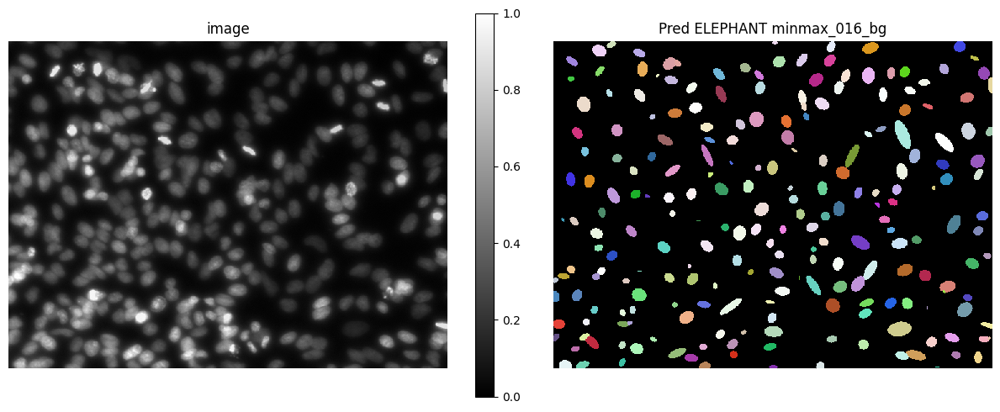

48it [00:01, 24.58it/s]
48it [00:00, 686.68it/s]
100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

2023-05-10 23:21:53,728 [INFO] DistributedDataParallel is not used.



DistributedDataParallel is not used.


2023-05-10 23:21:55,267 [INFO] Train Epoch: 0 [48/48 (100%)]	Loss: 0.590646	NLL Loss: 1.254736	Center Dice Loss: 0.562455	Smooth Loss: 0.067513


Train Epoch: 0 [48/48 (100%)]	Loss: 0.590646	NLL Loss: 1.254736	Center Dice Loss: 0.562455	Smooth Loss: 0.067513


2023-05-10 23:21:55,408 [INFO] Eval Epoch: 0 	Loss: 0.471956


Eval Epoch: 0 	Loss: 0.471956


2023-05-10 23:21:56,612 [INFO] Train Epoch: 1 [48/48 (100%)]	Loss: 0.387999	NLL Loss: 0.686425	Center Dice Loss: 0.400281	Smooth Loss: 0.028159


Train Epoch: 1 [48/48 (100%)]	Loss: 0.387999	NLL Loss: 0.686425	Center Dice Loss: 0.400281	Smooth Loss: 0.028159


2023-05-10 23:21:56,750 [INFO] Eval Epoch: 1 	Loss: 0.341870


Eval Epoch: 1 	Loss: 0.341870


2023-05-10 23:21:57,856 [INFO] Train Epoch: 2 [48/48 (100%)]	Loss: 0.318497	NLL Loss: 0.565548	Center Dice Loss: 0.327612	Smooth Loss: 0.025870


Train Epoch: 2 [48/48 (100%)]	Loss: 0.318497	NLL Loss: 0.565548	Center Dice Loss: 0.327612	Smooth Loss: 0.025870


2023-05-10 23:21:57,994 [INFO] Eval Epoch: 2 	Loss: 0.299757


Eval Epoch: 2 	Loss: 0.299757


2023-05-10 23:21:59,022 [INFO] Train Epoch: 3 [48/48 (100%)]	Loss: 0.283339	NLL Loss: 0.502142	Center Dice Loss: 0.290411	Smooth Loss: 0.029176


Train Epoch: 3 [48/48 (100%)]	Loss: 0.283339	NLL Loss: 0.502142	Center Dice Loss: 0.290411	Smooth Loss: 0.029176


2023-05-10 23:21:59,172 [INFO] Eval Epoch: 3 	Loss: 0.317975


Eval Epoch: 3 	Loss: 0.317975


2023-05-10 23:22:00,571 [INFO] Train Epoch: 4 [48/48 (100%)]	Loss: 0.253238	NLL Loss: 0.464748	Center Dice Loss: 0.255224	Smooth Loss: 0.031796


Train Epoch: 4 [48/48 (100%)]	Loss: 0.253238	NLL Loss: 0.464748	Center Dice Loss: 0.255224	Smooth Loss: 0.031796


2023-05-10 23:22:00,729 [INFO] Eval Epoch: 4 	Loss: 0.234380


Eval Epoch: 4 	Loss: 0.234380


2023-05-10 23:22:02,243 [INFO] Train Epoch: 5 [48/48 (100%)]	Loss: 0.225246	NLL Loss: 0.416680	Center Dice Loss: 0.225615	Smooth Loss: 0.031961


Train Epoch: 5 [48/48 (100%)]	Loss: 0.225246	NLL Loss: 0.416680	Center Dice Loss: 0.225615	Smooth Loss: 0.031961


2023-05-10 23:22:02,397 [INFO] Eval Epoch: 5 	Loss: 0.206081


Eval Epoch: 5 	Loss: 0.206081


2023-05-10 23:22:03,725 [INFO] Train Epoch: 6 [48/48 (100%)]	Loss: 0.223580	NLL Loss: 0.406643	Center Dice Loss: 0.225215	Smooth Loss: 0.032347


Train Epoch: 6 [48/48 (100%)]	Loss: 0.223580	NLL Loss: 0.406643	Center Dice Loss: 0.225215	Smooth Loss: 0.032347


2023-05-10 23:22:03,874 [INFO] Eval Epoch: 6 	Loss: 0.219476


Eval Epoch: 6 	Loss: 0.219476


2023-05-10 23:22:05,391 [INFO] Train Epoch: 7 [48/48 (100%)]	Loss: 0.224632	NLL Loss: 0.413445	Center Dice Loss: 0.225064	Smooth Loss: 0.033663


Train Epoch: 7 [48/48 (100%)]	Loss: 0.224632	NLL Loss: 0.413445	Center Dice Loss: 0.225064	Smooth Loss: 0.033663


2023-05-10 23:22:05,549 [INFO] Eval Epoch: 7 	Loss: 0.223971


Eval Epoch: 7 	Loss: 0.223971


2023-05-10 23:22:06,804 [INFO] Train Epoch: 8 [48/48 (100%)]	Loss: 0.219145	NLL Loss: 0.398039	Center Dice Loss: 0.220674	Smooth Loss: 0.032608


Train Epoch: 8 [48/48 (100%)]	Loss: 0.219145	NLL Loss: 0.398039	Center Dice Loss: 0.220674	Smooth Loss: 0.032608


2023-05-10 23:22:06,954 [INFO] Eval Epoch: 8 	Loss: 0.203473


Eval Epoch: 8 	Loss: 0.203473


2023-05-10 23:22:08,232 [INFO] Train Epoch: 9 [48/48 (100%)]	Loss: 0.207651	NLL Loss: 0.379430	Center Dice Loss: 0.208124	Smooth Loss: 0.033507


Train Epoch: 9 [48/48 (100%)]	Loss: 0.207651	NLL Loss: 0.379430	Center Dice Loss: 0.208124	Smooth Loss: 0.033507


2023-05-10 23:22:08,383 [INFO] Eval Epoch: 9 	Loss: 0.193762


Eval Epoch: 9 	Loss: 0.193762


2023-05-10 23:22:09,593 [INFO] Train Epoch: 10 [48/48 (100%)]	Loss: 0.204000	NLL Loss: 0.389168	Center Dice Loss: 0.200898	Smooth Loss: 0.034344


Train Epoch: 10 [48/48 (100%)]	Loss: 0.204000	NLL Loss: 0.389168	Center Dice Loss: 0.200898	Smooth Loss: 0.034344


2023-05-10 23:22:09,746 [INFO] Eval Epoch: 10 	Loss: 0.223345


Eval Epoch: 10 	Loss: 0.223345


2023-05-10 23:22:11,071 [INFO] Train Epoch: 11 [48/48 (100%)]	Loss: 0.197196	NLL Loss: 0.359086	Center Dice Loss: 0.197456	Smooth Loss: 0.034004


Train Epoch: 11 [48/48 (100%)]	Loss: 0.197196	NLL Loss: 0.359086	Center Dice Loss: 0.197456	Smooth Loss: 0.034004


2023-05-10 23:22:11,217 [INFO] Eval Epoch: 11 	Loss: 0.195164


Eval Epoch: 11 	Loss: 0.195164


2023-05-10 23:22:12,363 [INFO] Train Epoch: 12 [48/48 (100%)]	Loss: 0.191880	NLL Loss: 0.348170	Center Dice Loss: 0.191989	Smooth Loss: 0.035041


Train Epoch: 12 [48/48 (100%)]	Loss: 0.191880	NLL Loss: 0.348170	Center Dice Loss: 0.191989	Smooth Loss: 0.035041


2023-05-10 23:22:12,510 [INFO] Eval Epoch: 12 	Loss: 0.203892


Eval Epoch: 12 	Loss: 0.203892


2023-05-10 23:22:13,627 [INFO] Train Epoch: 13 [48/48 (100%)]	Loss: 0.189819	NLL Loss: 0.344937	Center Dice Loss: 0.189694	Smooth Loss: 0.035329


Train Epoch: 13 [48/48 (100%)]	Loss: 0.189819	NLL Loss: 0.344937	Center Dice Loss: 0.189694	Smooth Loss: 0.035329


2023-05-10 23:22:13,778 [INFO] Eval Epoch: 13 	Loss: 0.183490


Eval Epoch: 13 	Loss: 0.183490


2023-05-10 23:22:14,959 [INFO] Train Epoch: 14 [48/48 (100%)]	Loss: 0.176432	NLL Loss: 0.335861	Center Dice Loss: 0.172858	Smooth Loss: 0.034874


Train Epoch: 14 [48/48 (100%)]	Loss: 0.176432	NLL Loss: 0.335861	Center Dice Loss: 0.172858	Smooth Loss: 0.034874


2023-05-10 23:22:15,109 [INFO] Eval Epoch: 14 	Loss: 0.165806


Eval Epoch: 14 	Loss: 0.165806


2023-05-10 23:22:16,278 [INFO] Train Epoch: 15 [48/48 (100%)]	Loss: 0.170022	NLL Loss: 0.313785	Center Dice Loss: 0.168346	Smooth Loss: 0.034638


Train Epoch: 15 [48/48 (100%)]	Loss: 0.170022	NLL Loss: 0.313785	Center Dice Loss: 0.168346	Smooth Loss: 0.034638


2023-05-10 23:22:16,428 [INFO] Eval Epoch: 15 	Loss: 0.165365


Eval Epoch: 15 	Loss: 0.165365


2023-05-10 23:22:18,011 [INFO] Train Epoch: 16 [48/48 (100%)]	Loss: 0.177776	NLL Loss: 0.320299	Center Dice Loss: 0.177968	Smooth Loss: 0.034292


Train Epoch: 16 [48/48 (100%)]	Loss: 0.177776	NLL Loss: 0.320299	Center Dice Loss: 0.177968	Smooth Loss: 0.034292


2023-05-10 23:22:18,164 [INFO] Eval Epoch: 16 	Loss: 0.180673


Eval Epoch: 16 	Loss: 0.180673


2023-05-10 23:22:19,468 [INFO] Train Epoch: 17 [48/48 (100%)]	Loss: 0.158196	NLL Loss: 0.300435	Center Dice Loss: 0.154204	Smooth Loss: 0.035917


Train Epoch: 17 [48/48 (100%)]	Loss: 0.158196	NLL Loss: 0.300435	Center Dice Loss: 0.154204	Smooth Loss: 0.035917


2023-05-10 23:22:19,613 [INFO] Eval Epoch: 17 	Loss: 0.178460


Eval Epoch: 17 	Loss: 0.178460


2023-05-10 23:22:20,841 [INFO] Train Epoch: 18 [48/48 (100%)]	Loss: 0.164801	NLL Loss: 0.302423	Center Dice Loss: 0.163273	Smooth Loss: 0.034817


Train Epoch: 18 [48/48 (100%)]	Loss: 0.164801	NLL Loss: 0.302423	Center Dice Loss: 0.163273	Smooth Loss: 0.034817


2023-05-10 23:22:21,008 [INFO] Eval Epoch: 18 	Loss: 0.145380


Eval Epoch: 18 	Loss: 0.145380


2023-05-10 23:22:22,352 [INFO] Train Epoch: 19 [48/48 (100%)]	Loss: 0.152373	NLL Loss: 0.278381	Center Dice Loss: 0.150690	Smooth Loss: 0.034776


Train Epoch: 19 [48/48 (100%)]	Loss: 0.152373	NLL Loss: 0.278381	Center Dice Loss: 0.150690	Smooth Loss: 0.034776


2023-05-10 23:22:22,499 [INFO] Eval Epoch: 19 	Loss: 0.150302


Eval Epoch: 19 	Loss: 0.150302


2023-05-10 23:22:23,876 [INFO] Train Epoch: 20 [48/48 (100%)]	Loss: 0.147310	NLL Loss: 0.273803	Center Dice Loss: 0.143948	Smooth Loss: 0.037630


Train Epoch: 20 [48/48 (100%)]	Loss: 0.147310	NLL Loss: 0.273803	Center Dice Loss: 0.143948	Smooth Loss: 0.037630


2023-05-10 23:22:24,027 [INFO] Eval Epoch: 20 	Loss: 0.145723


Eval Epoch: 20 	Loss: 0.145723


2023-05-10 23:22:25,502 [INFO] Train Epoch: 21 [48/48 (100%)]	Loss: 0.152905	NLL Loss: 0.278975	Center Dice Loss: 0.151066	Smooth Loss: 0.036034


Train Epoch: 21 [48/48 (100%)]	Loss: 0.152905	NLL Loss: 0.278975	Center Dice Loss: 0.151066	Smooth Loss: 0.036034


2023-05-10 23:22:25,655 [INFO] Eval Epoch: 21 	Loss: 0.141399


Eval Epoch: 21 	Loss: 0.141399


2023-05-10 23:22:26,777 [INFO] Train Epoch: 22 [48/48 (100%)]	Loss: 0.142887	NLL Loss: 0.264384	Center Dice Loss: 0.140186	Smooth Loss: 0.034898


Train Epoch: 22 [48/48 (100%)]	Loss: 0.142887	NLL Loss: 0.264384	Center Dice Loss: 0.140186	Smooth Loss: 0.034898


2023-05-10 23:22:26,926 [INFO] Eval Epoch: 22 	Loss: 0.113469


Eval Epoch: 22 	Loss: 0.113469


2023-05-10 23:22:28,409 [INFO] Train Epoch: 23 [48/48 (100%)]	Loss: 0.147086	NLL Loss: 0.276128	Center Dice Loss: 0.143138	Smooth Loss: 0.037785


Train Epoch: 23 [48/48 (100%)]	Loss: 0.147086	NLL Loss: 0.276128	Center Dice Loss: 0.143138	Smooth Loss: 0.037785


2023-05-10 23:22:28,564 [INFO] Eval Epoch: 23 	Loss: 0.126851


Eval Epoch: 23 	Loss: 0.126851


2023-05-10 23:22:29,970 [INFO] Train Epoch: 24 [48/48 (100%)]	Loss: 0.149880	NLL Loss: 0.278269	Center Dice Loss: 0.147124	Smooth Loss: 0.035270


Train Epoch: 24 [48/48 (100%)]	Loss: 0.149880	NLL Loss: 0.278269	Center Dice Loss: 0.147124	Smooth Loss: 0.035270


2023-05-10 23:22:30,122 [INFO] Eval Epoch: 24 	Loss: 0.141119


Eval Epoch: 24 	Loss: 0.141119


2023-05-10 23:22:31,214 [INFO] Train Epoch: 25 [48/48 (100%)]	Loss: 0.145277	NLL Loss: 0.269271	Center Dice Loss: 0.142498	Smooth Loss: 0.035179


Train Epoch: 25 [48/48 (100%)]	Loss: 0.145277	NLL Loss: 0.269271	Center Dice Loss: 0.142498	Smooth Loss: 0.035179


2023-05-10 23:22:31,375 [INFO] Eval Epoch: 25 	Loss: 0.150844


Eval Epoch: 25 	Loss: 0.150844


2023-05-10 23:22:32,424 [INFO] Train Epoch: 26 [48/48 (100%)]	Loss: 0.135760	NLL Loss: 0.251994	Center Dice Loss: 0.132676	Smooth Loss: 0.034948


Train Epoch: 26 [48/48 (100%)]	Loss: 0.135760	NLL Loss: 0.251994	Center Dice Loss: 0.132676	Smooth Loss: 0.034948


2023-05-10 23:22:32,575 [INFO] Eval Epoch: 26 	Loss: 0.119691


Eval Epoch: 26 	Loss: 0.119691


2023-05-10 23:22:33,689 [INFO] Train Epoch: 27 [48/48 (100%)]	Loss: 0.132141	NLL Loss: 0.241966	Center Dice Loss: 0.129465	Smooth Loss: 0.035695


Train Epoch: 27 [48/48 (100%)]	Loss: 0.132141	NLL Loss: 0.241966	Center Dice Loss: 0.129465	Smooth Loss: 0.035695


2023-05-10 23:22:33,838 [INFO] Eval Epoch: 27 	Loss: 0.147332


Eval Epoch: 27 	Loss: 0.147332


2023-05-10 23:22:35,071 [INFO] Train Epoch: 28 [48/48 (100%)]	Loss: 0.124171	NLL Loss: 0.228007	Center Dice Loss: 0.121112	Smooth Loss: 0.035634


Train Epoch: 28 [48/48 (100%)]	Loss: 0.124171	NLL Loss: 0.228007	Center Dice Loss: 0.121112	Smooth Loss: 0.035634


2023-05-10 23:22:35,230 [INFO] Eval Epoch: 28 	Loss: 0.133497


Eval Epoch: 28 	Loss: 0.133497


2023-05-10 23:22:36,563 [INFO] Train Epoch: 29 [48/48 (100%)]	Loss: 0.132783	NLL Loss: 0.245348	Center Dice Loss: 0.129720	Smooth Loss: 0.035535


Train Epoch: 29 [48/48 (100%)]	Loss: 0.132783	NLL Loss: 0.245348	Center Dice Loss: 0.129720	Smooth Loss: 0.035535


2023-05-10 23:22:36,712 [INFO] Eval Epoch: 29 	Loss: 0.106518


Eval Epoch: 29 	Loss: 0.106518


2023-05-10 23:22:38,038 [INFO] Train Epoch: 30 [48/48 (100%)]	Loss: 0.128795	NLL Loss: 0.238264	Center Dice Loss: 0.125461	Smooth Loss: 0.035994


Train Epoch: 30 [48/48 (100%)]	Loss: 0.128795	NLL Loss: 0.238264	Center Dice Loss: 0.125461	Smooth Loss: 0.035994


2023-05-10 23:22:38,187 [INFO] Eval Epoch: 30 	Loss: 0.112156


Eval Epoch: 30 	Loss: 0.112156


2023-05-10 23:22:39,391 [INFO] Train Epoch: 31 [48/48 (100%)]	Loss: 0.139631	NLL Loss: 0.253243	Center Dice Loss: 0.137691	Smooth Loss: 0.035720


Train Epoch: 31 [48/48 (100%)]	Loss: 0.139631	NLL Loss: 0.253243	Center Dice Loss: 0.137691	Smooth Loss: 0.035720


2023-05-10 23:22:39,555 [INFO] Eval Epoch: 31 	Loss: 0.143858


Eval Epoch: 31 	Loss: 0.143858


2023-05-10 23:22:40,987 [INFO] Train Epoch: 32 [48/48 (100%)]	Loss: 0.130195	NLL Loss: 0.242383	Center Dice Loss: 0.126558	Smooth Loss: 0.036196


Train Epoch: 32 [48/48 (100%)]	Loss: 0.130195	NLL Loss: 0.242383	Center Dice Loss: 0.126558	Smooth Loss: 0.036196


2023-05-10 23:22:41,139 [INFO] Eval Epoch: 32 	Loss: 0.124520


Eval Epoch: 32 	Loss: 0.124520


2023-05-10 23:22:42,553 [INFO] Train Epoch: 33 [48/48 (100%)]	Loss: 0.129447	NLL Loss: 0.240879	Center Dice Loss: 0.126239	Smooth Loss: 0.034055


Train Epoch: 33 [48/48 (100%)]	Loss: 0.129447	NLL Loss: 0.240879	Center Dice Loss: 0.126239	Smooth Loss: 0.034055


2023-05-10 23:22:42,704 [INFO] Eval Epoch: 33 	Loss: 0.129859


Eval Epoch: 33 	Loss: 0.129859


2023-05-10 23:22:44,108 [INFO] Train Epoch: 34 [48/48 (100%)]	Loss: 0.127389	NLL Loss: 0.235554	Center Dice Loss: 0.124372	Smooth Loss: 0.034308


Train Epoch: 34 [48/48 (100%)]	Loss: 0.127389	NLL Loss: 0.235554	Center Dice Loss: 0.124372	Smooth Loss: 0.034308


2023-05-10 23:22:44,265 [INFO] Eval Epoch: 34 	Loss: 0.131545


Eval Epoch: 34 	Loss: 0.131545


2023-05-10 23:22:45,611 [INFO] Train Epoch: 35 [48/48 (100%)]	Loss: 0.122407	NLL Loss: 0.228098	Center Dice Loss: 0.118806	Smooth Loss: 0.034722


Train Epoch: 35 [48/48 (100%)]	Loss: 0.122407	NLL Loss: 0.228098	Center Dice Loss: 0.118806	Smooth Loss: 0.034722


2023-05-10 23:22:45,760 [INFO] Eval Epoch: 35 	Loss: 0.150501


Eval Epoch: 35 	Loss: 0.150501


2023-05-10 23:22:47,236 [INFO] Train Epoch: 36 [48/48 (100%)]	Loss: 0.126566	NLL Loss: 0.231207	Center Dice Loss: 0.123791	Smooth Loss: 0.035801


Train Epoch: 36 [48/48 (100%)]	Loss: 0.126566	NLL Loss: 0.231207	Center Dice Loss: 0.123791	Smooth Loss: 0.035801


2023-05-10 23:22:47,388 [INFO] Eval Epoch: 36 	Loss: 0.126324


Eval Epoch: 36 	Loss: 0.126324


2023-05-10 23:22:48,883 [INFO] Train Epoch: 37 [48/48 (100%)]	Loss: 0.112222	NLL Loss: 0.209619	Center Dice Loss: 0.108369	Smooth Loss: 0.034088


Train Epoch: 37 [48/48 (100%)]	Loss: 0.112222	NLL Loss: 0.209619	Center Dice Loss: 0.108369	Smooth Loss: 0.034088


2023-05-10 23:22:49,052 [INFO] Eval Epoch: 37 	Loss: 0.103934


Eval Epoch: 37 	Loss: 0.103934


2023-05-10 23:22:50,567 [INFO] Train Epoch: 38 [48/48 (100%)]	Loss: 0.122450	NLL Loss: 0.222787	Center Dice Loss: 0.119776	Smooth Loss: 0.035483


Train Epoch: 38 [48/48 (100%)]	Loss: 0.122450	NLL Loss: 0.222787	Center Dice Loss: 0.119776	Smooth Loss: 0.035483


2023-05-10 23:22:50,739 [INFO] Eval Epoch: 38 	Loss: 0.116221


Eval Epoch: 38 	Loss: 0.116221


2023-05-10 23:22:52,139 [INFO] Train Epoch: 39 [48/48 (100%)]	Loss: 0.120992	NLL Loss: 0.222899	Center Dice Loss: 0.117724	Smooth Loss: 0.035425


Train Epoch: 39 [48/48 (100%)]	Loss: 0.120992	NLL Loss: 0.222899	Center Dice Loss: 0.117724	Smooth Loss: 0.035425


2023-05-10 23:22:52,286 [INFO] Eval Epoch: 39 	Loss: 0.119106


Eval Epoch: 39 	Loss: 0.119106


2023-05-10 23:22:53,615 [INFO] Train Epoch: 40 [48/48 (100%)]	Loss: 0.108803	NLL Loss: 0.203468	Center Dice Loss: 0.104394	Smooth Loss: 0.036187


Train Epoch: 40 [48/48 (100%)]	Loss: 0.108803	NLL Loss: 0.203468	Center Dice Loss: 0.104394	Smooth Loss: 0.036187


2023-05-10 23:22:53,759 [INFO] Eval Epoch: 40 	Loss: 0.105390


Eval Epoch: 40 	Loss: 0.105390


2023-05-10 23:22:54,979 [INFO] Train Epoch: 41 [48/48 (100%)]	Loss: 0.108883	NLL Loss: 0.202096	Center Dice Loss: 0.105060	Smooth Loss: 0.034785


Train Epoch: 41 [48/48 (100%)]	Loss: 0.108883	NLL Loss: 0.202096	Center Dice Loss: 0.105060	Smooth Loss: 0.034785


2023-05-10 23:22:55,126 [INFO] Eval Epoch: 41 	Loss: 0.100488


Eval Epoch: 41 	Loss: 0.100488


2023-05-10 23:22:56,487 [INFO] Train Epoch: 42 [48/48 (100%)]	Loss: 0.118883	NLL Loss: 0.218999	Center Dice Loss: 0.115410	Smooth Loss: 0.036131


Train Epoch: 42 [48/48 (100%)]	Loss: 0.118883	NLL Loss: 0.218999	Center Dice Loss: 0.115410	Smooth Loss: 0.036131


2023-05-10 23:22:56,643 [INFO] Eval Epoch: 42 	Loss: 0.130963


Eval Epoch: 42 	Loss: 0.130963


2023-05-10 23:22:57,919 [INFO] Train Epoch: 43 [48/48 (100%)]	Loss: 0.115780	NLL Loss: 0.212211	Center Dice Loss: 0.112488	Smooth Loss: 0.035808


Train Epoch: 43 [48/48 (100%)]	Loss: 0.115780	NLL Loss: 0.212211	Center Dice Loss: 0.112488	Smooth Loss: 0.035808


2023-05-10 23:22:58,081 [INFO] Eval Epoch: 43 	Loss: 0.113095


Eval Epoch: 43 	Loss: 0.113095


2023-05-10 23:22:59,314 [INFO] Train Epoch: 44 [48/48 (100%)]	Loss: 0.114623	NLL Loss: 0.208576	Center Dice Loss: 0.111803	Smooth Loss: 0.034770


Train Epoch: 44 [48/48 (100%)]	Loss: 0.114623	NLL Loss: 0.208576	Center Dice Loss: 0.111803	Smooth Loss: 0.034770


2023-05-10 23:22:59,462 [INFO] Eval Epoch: 44 	Loss: 0.114905


Eval Epoch: 44 	Loss: 0.114905


2023-05-10 23:23:00,763 [INFO] Train Epoch: 45 [48/48 (100%)]	Loss: 0.121654	NLL Loss: 0.225513	Center Dice Loss: 0.118069	Smooth Loss: 0.035716


Train Epoch: 45 [48/48 (100%)]	Loss: 0.121654	NLL Loss: 0.225513	Center Dice Loss: 0.118069	Smooth Loss: 0.035716


2023-05-10 23:23:00,918 [INFO] Eval Epoch: 45 	Loss: 0.127823


Eval Epoch: 45 	Loss: 0.127823


2023-05-10 23:23:02,229 [INFO] Train Epoch: 46 [48/48 (100%)]	Loss: 0.112438	NLL Loss: 0.207686	Center Dice Loss: 0.108626	Smooth Loss: 0.036247


Train Epoch: 46 [48/48 (100%)]	Loss: 0.112438	NLL Loss: 0.207686	Center Dice Loss: 0.108626	Smooth Loss: 0.036247


2023-05-10 23:23:02,385 [INFO] Eval Epoch: 46 	Loss: 0.111122


Eval Epoch: 46 	Loss: 0.111122


2023-05-10 23:23:03,768 [INFO] Train Epoch: 47 [48/48 (100%)]	Loss: 0.109109	NLL Loss: 0.203238	Center Dice Loss: 0.104850	Smooth Loss: 0.036279


Train Epoch: 47 [48/48 (100%)]	Loss: 0.109109	NLL Loss: 0.203238	Center Dice Loss: 0.104850	Smooth Loss: 0.036279


2023-05-10 23:23:03,927 [INFO] Eval Epoch: 47 	Loss: 0.083779


Eval Epoch: 47 	Loss: 0.083779


2023-05-10 23:23:05,119 [INFO] Train Epoch: 48 [48/48 (100%)]	Loss: 0.118342	NLL Loss: 0.215780	Center Dice Loss: 0.115559	Smooth Loss: 0.034820


Train Epoch: 48 [48/48 (100%)]	Loss: 0.118342	NLL Loss: 0.215780	Center Dice Loss: 0.115559	Smooth Loss: 0.034820


2023-05-10 23:23:05,274 [INFO] Eval Epoch: 48 	Loss: 0.099125


Eval Epoch: 48 	Loss: 0.099125


2023-05-10 23:23:06,624 [INFO] Train Epoch: 49 [48/48 (100%)]	Loss: 0.116281	NLL Loss: 0.211576	Center Dice Loss: 0.113630	Smooth Loss: 0.034237


Train Epoch: 49 [48/48 (100%)]	Loss: 0.116281	NLL Loss: 0.211576	Center Dice Loss: 0.113630	Smooth Loss: 0.034237


2023-05-10 23:23:06,775 [INFO] Eval Epoch: 49 	Loss: 0.115026


Eval Epoch: 49 	Loss: 0.115026


2023-05-10 23:23:08,239 [INFO] Train Epoch: 50 [48/48 (100%)]	Loss: 0.115060	NLL Loss: 0.210220	Center Dice Loss: 0.111648	Smooth Loss: 0.036960


Train Epoch: 50 [48/48 (100%)]	Loss: 0.115060	NLL Loss: 0.210220	Center Dice Loss: 0.111648	Smooth Loss: 0.036960


2023-05-10 23:23:08,398 [INFO] Eval Epoch: 50 	Loss: 0.123726


Eval Epoch: 50 	Loss: 0.123726


2023-05-10 23:23:09,545 [INFO] Train Epoch: 51 [48/48 (100%)]	Loss: 0.116219	NLL Loss: 0.213040	Center Dice Loss: 0.113197	Smooth Loss: 0.034508


Train Epoch: 51 [48/48 (100%)]	Loss: 0.116219	NLL Loss: 0.213040	Center Dice Loss: 0.113197	Smooth Loss: 0.034508


2023-05-10 23:23:09,701 [INFO] Eval Epoch: 51 	Loss: 0.108629


Eval Epoch: 51 	Loss: 0.108629


2023-05-10 23:23:11,192 [INFO] Train Epoch: 52 [48/48 (100%)]	Loss: 0.104748	NLL Loss: 0.194306	Center Dice Loss: 0.100807	Smooth Loss: 0.034894


Train Epoch: 52 [48/48 (100%)]	Loss: 0.104748	NLL Loss: 0.194306	Center Dice Loss: 0.100807	Smooth Loss: 0.034894


2023-05-10 23:23:11,337 [INFO] Eval Epoch: 52 	Loss: 0.106499


Eval Epoch: 52 	Loss: 0.106499


2023-05-10 23:23:12,628 [INFO] Train Epoch: 53 [48/48 (100%)]	Loss: 0.110157	NLL Loss: 0.199935	Center Dice Loss: 0.107057	Smooth Loss: 0.035876


Train Epoch: 53 [48/48 (100%)]	Loss: 0.110157	NLL Loss: 0.199935	Center Dice Loss: 0.107057	Smooth Loss: 0.035876


2023-05-10 23:23:12,781 [INFO] Eval Epoch: 53 	Loss: 0.102946


Eval Epoch: 53 	Loss: 0.102946


2023-05-10 23:23:14,006 [INFO] Train Epoch: 54 [48/48 (100%)]	Loss: 0.103373	NLL Loss: 0.189963	Center Dice Loss: 0.099816	Smooth Loss: 0.034567


Train Epoch: 54 [48/48 (100%)]	Loss: 0.103373	NLL Loss: 0.189963	Center Dice Loss: 0.099816	Smooth Loss: 0.034567


2023-05-10 23:23:14,165 [INFO] Eval Epoch: 54 	Loss: 0.105251


Eval Epoch: 54 	Loss: 0.105251


2023-05-10 23:23:15,380 [INFO] Train Epoch: 55 [48/48 (100%)]	Loss: 0.113975	NLL Loss: 0.206078	Center Dice Loss: 0.111395	Smooth Loss: 0.034771


Train Epoch: 55 [48/48 (100%)]	Loss: 0.113975	NLL Loss: 0.206078	Center Dice Loss: 0.111395	Smooth Loss: 0.034771


2023-05-10 23:23:15,536 [INFO] Eval Epoch: 55 	Loss: 0.129159


Eval Epoch: 55 	Loss: 0.129159


2023-05-10 23:23:16,900 [INFO] Train Epoch: 56 [48/48 (100%)]	Loss: 0.110051	NLL Loss: 0.201876	Center Dice Loss: 0.107161	Smooth Loss: 0.032678


Train Epoch: 56 [48/48 (100%)]	Loss: 0.110051	NLL Loss: 0.201876	Center Dice Loss: 0.107161	Smooth Loss: 0.032678


2023-05-10 23:23:17,050 [INFO] Eval Epoch: 56 	Loss: 0.111039


Eval Epoch: 56 	Loss: 0.111039


2023-05-10 23:23:18,430 [INFO] Train Epoch: 57 [48/48 (100%)]	Loss: 0.102585	NLL Loss: 0.188624	Center Dice Loss: 0.099108	Smooth Loss: 0.033926


Train Epoch: 57 [48/48 (100%)]	Loss: 0.102585	NLL Loss: 0.188624	Center Dice Loss: 0.099108	Smooth Loss: 0.033926


2023-05-10 23:23:18,582 [INFO] Eval Epoch: 57 	Loss: 0.118929


Eval Epoch: 57 	Loss: 0.118929


2023-05-10 23:23:19,903 [INFO] Train Epoch: 58 [48/48 (100%)]	Loss: 0.112705	NLL Loss: 0.207051	Center Dice Loss: 0.109473	Smooth Loss: 0.034517


Train Epoch: 58 [48/48 (100%)]	Loss: 0.112705	NLL Loss: 0.207051	Center Dice Loss: 0.109473	Smooth Loss: 0.034517


2023-05-10 23:23:20,054 [INFO] Eval Epoch: 58 	Loss: 0.103203


Eval Epoch: 58 	Loss: 0.103203


2023-05-10 23:23:21,342 [INFO] Train Epoch: 59 [48/48 (100%)]	Loss: 0.104867	NLL Loss: 0.192215	Center Dice Loss: 0.101053	Smooth Loss: 0.036589


Train Epoch: 59 [48/48 (100%)]	Loss: 0.104867	NLL Loss: 0.192215	Center Dice Loss: 0.101053	Smooth Loss: 0.036589


2023-05-10 23:23:21,492 [INFO] Eval Epoch: 59 	Loss: 0.115074


Eval Epoch: 59 	Loss: 0.115074


2023-05-10 23:23:22,769 [INFO] Train Epoch: 60 [48/48 (100%)]	Loss: 0.100068	NLL Loss: 0.183430	Center Dice Loss: 0.096619	Smooth Loss: 0.033950


Train Epoch: 60 [48/48 (100%)]	Loss: 0.100068	NLL Loss: 0.183430	Center Dice Loss: 0.096619	Smooth Loss: 0.033950


2023-05-10 23:23:22,926 [INFO] Eval Epoch: 60 	Loss: 0.110624


Eval Epoch: 60 	Loss: 0.110624


2023-05-10 23:23:24,349 [INFO] Train Epoch: 61 [48/48 (100%)]	Loss: 0.109259	NLL Loss: 0.197642	Center Dice Loss: 0.106407	Smooth Loss: 0.035136


Train Epoch: 61 [48/48 (100%)]	Loss: 0.109259	NLL Loss: 0.197642	Center Dice Loss: 0.106407	Smooth Loss: 0.035136


2023-05-10 23:23:24,503 [INFO] Eval Epoch: 61 	Loss: 0.095919


Eval Epoch: 61 	Loss: 0.095919


2023-05-10 23:23:25,759 [INFO] Train Epoch: 62 [48/48 (100%)]	Loss: 0.098792	NLL Loss: 0.179533	Center Dice Loss: 0.095258	Smooth Loss: 0.035721


Train Epoch: 62 [48/48 (100%)]	Loss: 0.098792	NLL Loss: 0.179533	Center Dice Loss: 0.095258	Smooth Loss: 0.035721


2023-05-10 23:23:25,912 [INFO] Eval Epoch: 62 	Loss: 0.094280


Eval Epoch: 62 	Loss: 0.094280


2023-05-10 23:23:26,916 [INFO] Train Epoch: 63 [48/48 (100%)]	Loss: 0.093432	NLL Loss: 0.170628	Center Dice Loss: 0.089696	Smooth Loss: 0.034921


Train Epoch: 63 [48/48 (100%)]	Loss: 0.093432	NLL Loss: 0.170628	Center Dice Loss: 0.089696	Smooth Loss: 0.034921


2023-05-10 23:23:27,061 [INFO] Eval Epoch: 63 	Loss: 0.093950


Eval Epoch: 63 	Loss: 0.093950


2023-05-10 23:23:28,478 [INFO] Train Epoch: 64 [48/48 (100%)]	Loss: 0.096372	NLL Loss: 0.176993	Center Dice Loss: 0.092686	Smooth Loss: 0.034182


Train Epoch: 64 [48/48 (100%)]	Loss: 0.096372	NLL Loss: 0.176993	Center Dice Loss: 0.092686	Smooth Loss: 0.034182


2023-05-10 23:23:28,624 [INFO] Eval Epoch: 64 	Loss: 0.091193


Eval Epoch: 64 	Loss: 0.091193


2023-05-10 23:23:29,901 [INFO] Train Epoch: 65 [48/48 (100%)]	Loss: 0.101640	NLL Loss: 0.183170	Center Dice Loss: 0.098861	Smooth Loss: 0.034000


Train Epoch: 65 [48/48 (100%)]	Loss: 0.101640	NLL Loss: 0.183170	Center Dice Loss: 0.098861	Smooth Loss: 0.034000


2023-05-10 23:23:30,054 [INFO] Eval Epoch: 65 	Loss: 0.086783


Eval Epoch: 65 	Loss: 0.086783


2023-05-10 23:23:31,339 [INFO] Train Epoch: 66 [48/48 (100%)]	Loss: 0.112503	NLL Loss: 0.206231	Center Dice Loss: 0.109516	Smooth Loss: 0.033708


Train Epoch: 66 [48/48 (100%)]	Loss: 0.112503	NLL Loss: 0.206231	Center Dice Loss: 0.109516	Smooth Loss: 0.033708


2023-05-10 23:23:31,498 [INFO] Eval Epoch: 66 	Loss: 0.115405


Eval Epoch: 66 	Loss: 0.115405


2023-05-10 23:23:32,668 [INFO] Train Epoch: 67 [48/48 (100%)]	Loss: 0.090208	NLL Loss: 0.161441	Center Dice Loss: 0.087584	Smooth Loss: 0.032096


Train Epoch: 67 [48/48 (100%)]	Loss: 0.090208	NLL Loss: 0.161441	Center Dice Loss: 0.087584	Smooth Loss: 0.032096


2023-05-10 23:23:32,842 [INFO] Eval Epoch: 67 	Loss: 0.081344


Eval Epoch: 67 	Loss: 0.081344


2023-05-10 23:23:34,119 [INFO] Train Epoch: 68 [48/48 (100%)]	Loss: 0.104263	NLL Loss: 0.194968	Center Dice Loss: 0.100033	Smooth Loss: 0.034712


Train Epoch: 68 [48/48 (100%)]	Loss: 0.104263	NLL Loss: 0.194968	Center Dice Loss: 0.100033	Smooth Loss: 0.034712


2023-05-10 23:23:34,288 [INFO] Eval Epoch: 68 	Loss: 0.097822


Eval Epoch: 68 	Loss: 0.097822


2023-05-10 23:23:35,464 [INFO] Train Epoch: 69 [48/48 (100%)]	Loss: 0.107628	NLL Loss: 0.197493	Center Dice Loss: 0.103999	Smooth Loss: 0.035912


Train Epoch: 69 [48/48 (100%)]	Loss: 0.107628	NLL Loss: 0.197493	Center Dice Loss: 0.103999	Smooth Loss: 0.035912


2023-05-10 23:23:35,628 [INFO] Eval Epoch: 69 	Loss: 0.112051


Eval Epoch: 69 	Loss: 0.112051


2023-05-10 23:23:37,157 [INFO] Train Epoch: 70 [48/48 (100%)]	Loss: 0.091374	NLL Loss: 0.166516	Center Dice Loss: 0.087440	Smooth Loss: 0.035903


Train Epoch: 70 [48/48 (100%)]	Loss: 0.091374	NLL Loss: 0.166516	Center Dice Loss: 0.087440	Smooth Loss: 0.035903


2023-05-10 23:23:37,339 [INFO] Eval Epoch: 70 	Loss: 0.084858


Eval Epoch: 70 	Loss: 0.084858


2023-05-10 23:23:38,611 [INFO] Train Epoch: 71 [48/48 (100%)]	Loss: 0.096456	NLL Loss: 0.174247	Center Dice Loss: 0.093251	Smooth Loss: 0.034691


Train Epoch: 71 [48/48 (100%)]	Loss: 0.096456	NLL Loss: 0.174247	Center Dice Loss: 0.093251	Smooth Loss: 0.034691


2023-05-10 23:23:38,767 [INFO] Eval Epoch: 71 	Loss: 0.074756


Eval Epoch: 71 	Loss: 0.074756


2023-05-10 23:23:40,262 [INFO] Train Epoch: 72 [48/48 (100%)]	Loss: 0.090337	NLL Loss: 0.165128	Center Dice Loss: 0.086355	Smooth Loss: 0.035457


Train Epoch: 72 [48/48 (100%)]	Loss: 0.090337	NLL Loss: 0.165128	Center Dice Loss: 0.086355	Smooth Loss: 0.035457


2023-05-10 23:23:40,423 [INFO] Eval Epoch: 72 	Loss: 0.101368


Eval Epoch: 72 	Loss: 0.101368


2023-05-10 23:23:41,633 [INFO] Train Epoch: 73 [48/48 (100%)]	Loss: 0.095818	NLL Loss: 0.175360	Center Dice Loss: 0.092297	Smooth Loss: 0.033876


Train Epoch: 73 [48/48 (100%)]	Loss: 0.095818	NLL Loss: 0.175360	Center Dice Loss: 0.092297	Smooth Loss: 0.033876


2023-05-10 23:23:41,791 [INFO] Eval Epoch: 73 	Loss: 0.101737


Eval Epoch: 73 	Loss: 0.101737


2023-05-10 23:23:43,138 [INFO] Train Epoch: 74 [48/48 (100%)]	Loss: 0.097267	NLL Loss: 0.178333	Center Dice Loss: 0.094009	Smooth Loss: 0.032494


Train Epoch: 74 [48/48 (100%)]	Loss: 0.097267	NLL Loss: 0.178333	Center Dice Loss: 0.094009	Smooth Loss: 0.032494


2023-05-10 23:23:43,300 [INFO] Eval Epoch: 74 	Loss: 0.078393


Eval Epoch: 74 	Loss: 0.078393


2023-05-10 23:23:44,508 [INFO] Train Epoch: 75 [48/48 (100%)]	Loss: 0.091415	NLL Loss: 0.166584	Center Dice Loss: 0.088085	Smooth Loss: 0.032900


Train Epoch: 75 [48/48 (100%)]	Loss: 0.091415	NLL Loss: 0.166584	Center Dice Loss: 0.088085	Smooth Loss: 0.032900


2023-05-10 23:23:44,662 [INFO] Eval Epoch: 75 	Loss: 0.082678


Eval Epoch: 75 	Loss: 0.082678


2023-05-10 23:23:45,762 [INFO] Train Epoch: 76 [48/48 (100%)]	Loss: 0.091891	NLL Loss: 0.168048	Center Dice Loss: 0.088503	Smooth Loss: 0.032672


Train Epoch: 76 [48/48 (100%)]	Loss: 0.091891	NLL Loss: 0.168048	Center Dice Loss: 0.088503	Smooth Loss: 0.032672


2023-05-10 23:23:45,910 [INFO] Eval Epoch: 76 	Loss: 0.090093


Eval Epoch: 76 	Loss: 0.090093


2023-05-10 23:23:47,127 [INFO] Train Epoch: 77 [48/48 (100%)]	Loss: 0.088745	NLL Loss: 0.163718	Center Dice Loss: 0.084582	Smooth Loss: 0.034587


Train Epoch: 77 [48/48 (100%)]	Loss: 0.088745	NLL Loss: 0.163718	Center Dice Loss: 0.084582	Smooth Loss: 0.034587


2023-05-10 23:23:47,281 [INFO] Eval Epoch: 77 	Loss: 0.108894


Eval Epoch: 77 	Loss: 0.108894


2023-05-10 23:23:48,404 [INFO] Train Epoch: 78 [48/48 (100%)]	Loss: 0.095314	NLL Loss: 0.172332	Center Dice Loss: 0.092176	Smooth Loss: 0.033986


Train Epoch: 78 [48/48 (100%)]	Loss: 0.095314	NLL Loss: 0.172332	Center Dice Loss: 0.092176	Smooth Loss: 0.033986


2023-05-10 23:23:48,554 [INFO] Eval Epoch: 78 	Loss: 0.082586


Eval Epoch: 78 	Loss: 0.082586


2023-05-10 23:23:49,822 [INFO] Train Epoch: 79 [48/48 (100%)]	Loss: 0.090982	NLL Loss: 0.164736	Center Dice Loss: 0.087722	Smooth Loss: 0.033529


Train Epoch: 79 [48/48 (100%)]	Loss: 0.090982	NLL Loss: 0.164736	Center Dice Loss: 0.087722	Smooth Loss: 0.033529


2023-05-10 23:23:49,962 [INFO] Eval Epoch: 79 	Loss: 0.084615


Eval Epoch: 79 	Loss: 0.084615


2023-05-10 23:23:51,309 [INFO] Train Epoch: 80 [48/48 (100%)]	Loss: 0.098071	NLL Loss: 0.177875	Center Dice Loss: 0.094670	Smooth Loss: 0.035271


Train Epoch: 80 [48/48 (100%)]	Loss: 0.098071	NLL Loss: 0.177875	Center Dice Loss: 0.094670	Smooth Loss: 0.035271


2023-05-10 23:23:51,454 [INFO] Eval Epoch: 80 	Loss: 0.103960


Eval Epoch: 80 	Loss: 0.103960


2023-05-10 23:23:52,566 [INFO] Train Epoch: 81 [48/48 (100%)]	Loss: 0.095477	NLL Loss: 0.173456	Center Dice Loss: 0.092135	Smooth Loss: 0.034208


Train Epoch: 81 [48/48 (100%)]	Loss: 0.095477	NLL Loss: 0.173456	Center Dice Loss: 0.092135	Smooth Loss: 0.034208


2023-05-10 23:23:52,722 [INFO] Eval Epoch: 81 	Loss: 0.091894


Eval Epoch: 81 	Loss: 0.091894


2023-05-10 23:23:54,505 [INFO] Train Epoch: 82 [48/48 (100%)]	Loss: 0.091060	NLL Loss: 0.163296	Center Dice Loss: 0.087677	Smooth Loss: 0.035737


Train Epoch: 82 [48/48 (100%)]	Loss: 0.091060	NLL Loss: 0.163296	Center Dice Loss: 0.087677	Smooth Loss: 0.035737


2023-05-10 23:23:54,655 [INFO] Eval Epoch: 82 	Loss: 0.092219


Eval Epoch: 82 	Loss: 0.092219


2023-05-10 23:23:55,908 [INFO] Train Epoch: 83 [48/48 (100%)]	Loss: 0.093914	NLL Loss: 0.168296	Center Dice Loss: 0.091036	Smooth Loss: 0.033923


Train Epoch: 83 [48/48 (100%)]	Loss: 0.093914	NLL Loss: 0.168296	Center Dice Loss: 0.091036	Smooth Loss: 0.033923


2023-05-10 23:23:56,064 [INFO] Eval Epoch: 83 	Loss: 0.090166


Eval Epoch: 83 	Loss: 0.090166


2023-05-10 23:23:57,364 [INFO] Train Epoch: 84 [48/48 (100%)]	Loss: 0.084493	NLL Loss: 0.152440	Center Dice Loss: 0.080984	Smooth Loss: 0.034090


Train Epoch: 84 [48/48 (100%)]	Loss: 0.084493	NLL Loss: 0.152440	Center Dice Loss: 0.080984	Smooth Loss: 0.034090


2023-05-10 23:23:57,535 [INFO] Eval Epoch: 84 	Loss: 0.078188


Eval Epoch: 84 	Loss: 0.078188


2023-05-10 23:23:58,832 [INFO] Train Epoch: 85 [48/48 (100%)]	Loss: 0.090375	NLL Loss: 0.161734	Center Dice Loss: 0.087271	Smooth Loss: 0.034537


Train Epoch: 85 [48/48 (100%)]	Loss: 0.090375	NLL Loss: 0.161734	Center Dice Loss: 0.087271	Smooth Loss: 0.034537


2023-05-10 23:23:58,986 [INFO] Eval Epoch: 85 	Loss: 0.091683


Eval Epoch: 85 	Loss: 0.091683


2023-05-10 23:24:00,317 [INFO] Train Epoch: 86 [48/48 (100%)]	Loss: 0.092372	NLL Loss: 0.164899	Center Dice Loss: 0.089431	Smooth Loss: 0.034550


Train Epoch: 86 [48/48 (100%)]	Loss: 0.092372	NLL Loss: 0.164899	Center Dice Loss: 0.089431	Smooth Loss: 0.034550


2023-05-10 23:24:00,474 [INFO] Eval Epoch: 86 	Loss: 0.102746


Eval Epoch: 86 	Loss: 0.102746


2023-05-10 23:24:01,889 [INFO] Train Epoch: 87 [48/48 (100%)]	Loss: 0.096903	NLL Loss: 0.174725	Center Dice Loss: 0.093855	Smooth Loss: 0.034321


Train Epoch: 87 [48/48 (100%)]	Loss: 0.096903	NLL Loss: 0.174725	Center Dice Loss: 0.093855	Smooth Loss: 0.034321


2023-05-10 23:24:02,045 [INFO] Eval Epoch: 87 	Loss: 0.095065


Eval Epoch: 87 	Loss: 0.095065


2023-05-10 23:24:03,185 [INFO] Train Epoch: 88 [48/48 (100%)]	Loss: 0.083365	NLL Loss: 0.152799	Center Dice Loss: 0.079282	Smooth Loss: 0.034347


Train Epoch: 88 [48/48 (100%)]	Loss: 0.083365	NLL Loss: 0.152799	Center Dice Loss: 0.079282	Smooth Loss: 0.034347


2023-05-10 23:24:03,334 [INFO] Eval Epoch: 88 	Loss: 0.085008


Eval Epoch: 88 	Loss: 0.085008


2023-05-10 23:24:04,722 [INFO] Train Epoch: 89 [48/48 (100%)]	Loss: 0.097584	NLL Loss: 0.175573	Center Dice Loss: 0.094680	Smooth Loss: 0.034110


Train Epoch: 89 [48/48 (100%)]	Loss: 0.097584	NLL Loss: 0.175573	Center Dice Loss: 0.094680	Smooth Loss: 0.034110


2023-05-10 23:24:04,868 [INFO] Eval Epoch: 89 	Loss: 0.093056


Eval Epoch: 89 	Loss: 0.093056


2023-05-10 23:24:06,097 [INFO] Train Epoch: 90 [48/48 (100%)]	Loss: 0.090280	NLL Loss: 0.165661	Center Dice Loss: 0.086644	Smooth Loss: 0.033077


Train Epoch: 90 [48/48 (100%)]	Loss: 0.090280	NLL Loss: 0.165661	Center Dice Loss: 0.086644	Smooth Loss: 0.033077


2023-05-10 23:24:06,248 [INFO] Eval Epoch: 90 	Loss: 0.095451


Eval Epoch: 90 	Loss: 0.095451


2023-05-10 23:24:07,441 [INFO] Train Epoch: 91 [48/48 (100%)]	Loss: 0.084731	NLL Loss: 0.154255	Center Dice Loss: 0.081195	Smooth Loss: 0.032889


Train Epoch: 91 [48/48 (100%)]	Loss: 0.084731	NLL Loss: 0.154255	Center Dice Loss: 0.081195	Smooth Loss: 0.032889


2023-05-10 23:24:07,592 [INFO] Eval Epoch: 91 	Loss: 0.077115


Eval Epoch: 91 	Loss: 0.077115


2023-05-10 23:24:08,624 [INFO] Train Epoch: 92 [48/48 (100%)]	Loss: 0.087598	NLL Loss: 0.158880	Center Dice Loss: 0.084126	Smooth Loss: 0.033673


Train Epoch: 92 [48/48 (100%)]	Loss: 0.087598	NLL Loss: 0.158880	Center Dice Loss: 0.084126	Smooth Loss: 0.033673


2023-05-10 23:24:08,782 [INFO] Eval Epoch: 92 	Loss: 0.083360


Eval Epoch: 92 	Loss: 0.083360


2023-05-10 23:24:10,000 [INFO] Train Epoch: 93 [48/48 (100%)]	Loss: 0.087400	NLL Loss: 0.156556	Center Dice Loss: 0.084210	Smooth Loss: 0.034192


Train Epoch: 93 [48/48 (100%)]	Loss: 0.087400	NLL Loss: 0.156556	Center Dice Loss: 0.084210	Smooth Loss: 0.034192


2023-05-10 23:24:10,159 [INFO] Eval Epoch: 93 	Loss: 0.084946


Eval Epoch: 93 	Loss: 0.084946


2023-05-10 23:24:11,317 [INFO] Train Epoch: 94 [48/48 (100%)]	Loss: 0.097262	NLL Loss: 0.174938	Center Dice Loss: 0.094447	Smooth Loss: 0.033666


Train Epoch: 94 [48/48 (100%)]	Loss: 0.097262	NLL Loss: 0.174938	Center Dice Loss: 0.094447	Smooth Loss: 0.033666


2023-05-10 23:24:11,471 [INFO] Eval Epoch: 94 	Loss: 0.116171


Eval Epoch: 94 	Loss: 0.116171


2023-05-10 23:24:12,632 [INFO] Train Epoch: 95 [48/48 (100%)]	Loss: 0.099283	NLL Loss: 0.178767	Center Dice Loss: 0.096565	Smooth Loss: 0.033385


Train Epoch: 95 [48/48 (100%)]	Loss: 0.099283	NLL Loss: 0.178767	Center Dice Loss: 0.096565	Smooth Loss: 0.033385


2023-05-10 23:24:12,784 [INFO] Eval Epoch: 95 	Loss: 0.094331


Eval Epoch: 95 	Loss: 0.094331


2023-05-10 23:24:14,033 [INFO] Train Epoch: 96 [48/48 (100%)]	Loss: 0.095843	NLL Loss: 0.174597	Center Dice Loss: 0.092717	Smooth Loss: 0.032718


Train Epoch: 96 [48/48 (100%)]	Loss: 0.095843	NLL Loss: 0.174597	Center Dice Loss: 0.092717	Smooth Loss: 0.032718


2023-05-10 23:24:14,205 [INFO] Eval Epoch: 96 	Loss: 0.089951


Eval Epoch: 96 	Loss: 0.089951


2023-05-10 23:24:15,448 [INFO] Train Epoch: 97 [48/48 (100%)]	Loss: 0.094078	NLL Loss: 0.169570	Center Dice Loss: 0.091050	Smooth Loss: 0.033728


Train Epoch: 97 [48/48 (100%)]	Loss: 0.094078	NLL Loss: 0.169570	Center Dice Loss: 0.091050	Smooth Loss: 0.033728


2023-05-10 23:24:15,601 [INFO] Eval Epoch: 97 	Loss: 0.082252


Eval Epoch: 97 	Loss: 0.082252


2023-05-10 23:24:16,929 [INFO] Train Epoch: 98 [48/48 (100%)]	Loss: 0.085206	NLL Loss: 0.154902	Center Dice Loss: 0.081560	Smooth Loss: 0.033741


Train Epoch: 98 [48/48 (100%)]	Loss: 0.085206	NLL Loss: 0.154902	Center Dice Loss: 0.081560	Smooth Loss: 0.033741


2023-05-10 23:24:17,086 [INFO] Eval Epoch: 98 	Loss: 0.079681


Eval Epoch: 98 	Loss: 0.079681


2023-05-10 23:24:18,412 [INFO] Train Epoch: 99 [48/48 (100%)]	Loss: 0.076825	NLL Loss: 0.139054	Center Dice Loss: 0.073206	Smooth Loss: 0.032693


Train Epoch: 99 [48/48 (100%)]	Loss: 0.076825	NLL Loss: 0.139054	Center Dice Loss: 0.073206	Smooth Loss: 0.032693


2023-05-10 23:24:18,580 [INFO] Eval Epoch: 99 	Loss: 0.061665


Eval Epoch: 99 	Loss: 0.061665
100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


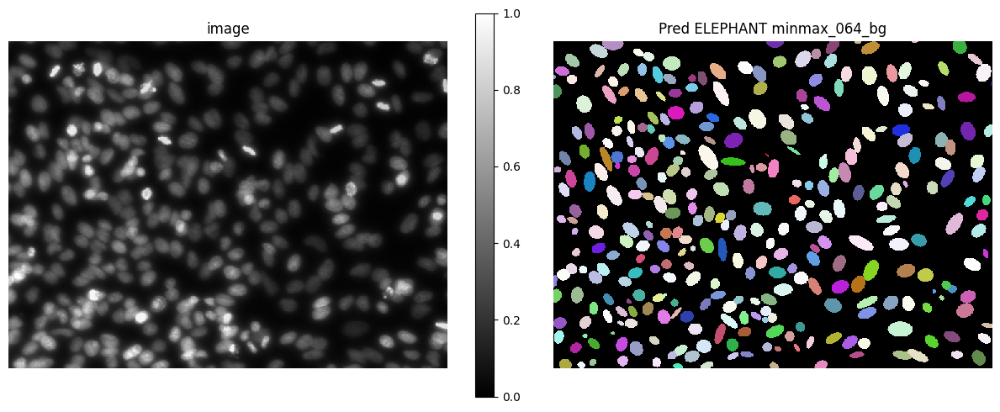

48it [00:01, 24.06it/s]
48it [00:00, 431.26it/s]
100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

2023-05-10 23:24:34,055 [INFO] DistributedDataParallel is not used.



DistributedDataParallel is not used.


2023-05-10 23:24:35,693 [INFO] Train Epoch: 0 [48/48 (100%)]	Loss: 0.501191	NLL Loss: 1.041663	Center Dice Loss: 0.478449	Smooth Loss: 0.074428


Train Epoch: 0 [48/48 (100%)]	Loss: 0.501191	NLL Loss: 1.041663	Center Dice Loss: 0.478449	Smooth Loss: 0.074428


2023-05-10 23:24:35,837 [INFO] Eval Epoch: 0 	Loss: 0.352279


Eval Epoch: 0 	Loss: 0.352279


2023-05-10 23:24:37,046 [INFO] Train Epoch: 1 [48/48 (100%)]	Loss: 0.296326	NLL Loss: 0.541101	Center Dice Loss: 0.298539	Smooth Loss: 0.040482


Train Epoch: 1 [48/48 (100%)]	Loss: 0.296326	NLL Loss: 0.541101	Center Dice Loss: 0.298539	Smooth Loss: 0.040482


2023-05-10 23:24:37,201 [INFO] Eval Epoch: 1 	Loss: 0.270667


Eval Epoch: 1 	Loss: 0.270667


2023-05-10 23:24:38,359 [INFO] Train Epoch: 2 [48/48 (100%)]	Loss: 0.254405	NLL Loss: 0.473275	Center Dice Loss: 0.253403	Smooth Loss: 0.040543


Train Epoch: 2 [48/48 (100%)]	Loss: 0.254405	NLL Loss: 0.473275	Center Dice Loss: 0.253403	Smooth Loss: 0.040543


2023-05-10 23:24:38,504 [INFO] Eval Epoch: 2 	Loss: 0.258285


Eval Epoch: 2 	Loss: 0.258285


2023-05-10 23:24:39,821 [INFO] Train Epoch: 3 [48/48 (100%)]	Loss: 0.232085	NLL Loss: 0.433680	Center Dice Loss: 0.230560	Smooth Loss: 0.038112


Train Epoch: 3 [48/48 (100%)]	Loss: 0.232085	NLL Loss: 0.433680	Center Dice Loss: 0.230560	Smooth Loss: 0.038112


2023-05-10 23:24:39,967 [INFO] Eval Epoch: 3 	Loss: 0.233797


Eval Epoch: 3 	Loss: 0.233797


2023-05-10 23:24:41,299 [INFO] Train Epoch: 4 [48/48 (100%)]	Loss: 0.216817	NLL Loss: 0.407671	Center Dice Loss: 0.214363	Smooth Loss: 0.038234


Train Epoch: 4 [48/48 (100%)]	Loss: 0.216817	NLL Loss: 0.407671	Center Dice Loss: 0.214363	Smooth Loss: 0.038234


2023-05-10 23:24:41,445 [INFO] Eval Epoch: 4 	Loss: 0.215593


Eval Epoch: 4 	Loss: 0.215593


2023-05-10 23:24:42,700 [INFO] Train Epoch: 5 [48/48 (100%)]	Loss: 0.214022	NLL Loss: 0.397782	Center Dice Loss: 0.212430	Smooth Loss: 0.038221


Train Epoch: 5 [48/48 (100%)]	Loss: 0.214022	NLL Loss: 0.397782	Center Dice Loss: 0.212430	Smooth Loss: 0.038221


2023-05-10 23:24:42,858 [INFO] Eval Epoch: 5 	Loss: 0.210879


Eval Epoch: 5 	Loss: 0.210879


2023-05-10 23:24:44,049 [INFO] Train Epoch: 6 [48/48 (100%)]	Loss: 0.199561	NLL Loss: 0.382203	Center Dice Loss: 0.195124	Smooth Loss: 0.039103


Train Epoch: 6 [48/48 (100%)]	Loss: 0.199561	NLL Loss: 0.382203	Center Dice Loss: 0.195124	Smooth Loss: 0.039103


2023-05-10 23:24:44,211 [INFO] Eval Epoch: 6 	Loss: 0.200232


Eval Epoch: 6 	Loss: 0.200232


2023-05-10 23:24:45,392 [INFO] Train Epoch: 7 [48/48 (100%)]	Loss: 0.195810	NLL Loss: 0.374176	Center Dice Loss: 0.191517	Smooth Loss: 0.038911


Train Epoch: 7 [48/48 (100%)]	Loss: 0.195810	NLL Loss: 0.374176	Center Dice Loss: 0.191517	Smooth Loss: 0.038911


2023-05-10 23:24:45,543 [INFO] Eval Epoch: 7 	Loss: 0.188764


Eval Epoch: 7 	Loss: 0.188764


2023-05-10 23:24:46,685 [INFO] Train Epoch: 8 [48/48 (100%)]	Loss: 0.194884	NLL Loss: 0.366521	Center Dice Loss: 0.191733	Smooth Loss: 0.038997


Train Epoch: 8 [48/48 (100%)]	Loss: 0.194884	NLL Loss: 0.366521	Center Dice Loss: 0.191733	Smooth Loss: 0.038997


2023-05-10 23:24:46,838 [INFO] Eval Epoch: 8 	Loss: 0.190245


Eval Epoch: 8 	Loss: 0.190245


2023-05-10 23:24:48,231 [INFO] Train Epoch: 9 [48/48 (100%)]	Loss: 0.194889	NLL Loss: 0.360077	Center Dice Loss: 0.192874	Smooth Loss: 0.039780


Train Epoch: 9 [48/48 (100%)]	Loss: 0.194889	NLL Loss: 0.360077	Center Dice Loss: 0.192874	Smooth Loss: 0.039780


2023-05-10 23:24:48,383 [INFO] Eval Epoch: 9 	Loss: 0.193332


Eval Epoch: 9 	Loss: 0.193332


2023-05-10 23:24:50,132 [INFO] Train Epoch: 10 [48/48 (100%)]	Loss: 0.182003	NLL Loss: 0.339060	Center Dice Loss: 0.179552	Smooth Loss: 0.037200


Train Epoch: 10 [48/48 (100%)]	Loss: 0.182003	NLL Loss: 0.339060	Center Dice Loss: 0.179552	Smooth Loss: 0.037200


2023-05-10 23:24:50,285 [INFO] Eval Epoch: 10 	Loss: 0.179506


Eval Epoch: 10 	Loss: 0.179506


2023-05-10 23:24:51,770 [INFO] Train Epoch: 11 [48/48 (100%)]	Loss: 0.179413	NLL Loss: 0.334582	Center Dice Loss: 0.176331	Smooth Loss: 0.039651


Train Epoch: 11 [48/48 (100%)]	Loss: 0.179413	NLL Loss: 0.334582	Center Dice Loss: 0.176331	Smooth Loss: 0.039651


2023-05-10 23:24:51,934 [INFO] Eval Epoch: 11 	Loss: 0.182522


Eval Epoch: 11 	Loss: 0.182522


2023-05-10 23:24:53,285 [INFO] Train Epoch: 12 [48/48 (100%)]	Loss: 0.173683	NLL Loss: 0.326729	Center Dice Loss: 0.170059	Smooth Loss: 0.038752


Train Epoch: 12 [48/48 (100%)]	Loss: 0.173683	NLL Loss: 0.326729	Center Dice Loss: 0.170059	Smooth Loss: 0.038752


2023-05-10 23:24:53,452 [INFO] Eval Epoch: 12 	Loss: 0.157583


Eval Epoch: 12 	Loss: 0.157583


2023-05-10 23:24:54,907 [INFO] Train Epoch: 13 [48/48 (100%)]	Loss: 0.164712	NLL Loss: 0.305206	Center Dice Loss: 0.162104	Smooth Loss: 0.037260


Train Epoch: 13 [48/48 (100%)]	Loss: 0.164712	NLL Loss: 0.305206	Center Dice Loss: 0.162104	Smooth Loss: 0.037260


2023-05-10 23:24:55,063 [INFO] Eval Epoch: 13 	Loss: 0.180134


Eval Epoch: 13 	Loss: 0.180134


2023-05-10 23:24:56,610 [INFO] Train Epoch: 14 [48/48 (100%)]	Loss: 0.174208	NLL Loss: 0.322269	Center Dice Loss: 0.171426	Smooth Loss: 0.040056


Train Epoch: 14 [48/48 (100%)]	Loss: 0.174208	NLL Loss: 0.322269	Center Dice Loss: 0.171426	Smooth Loss: 0.040056


2023-05-10 23:24:56,775 [INFO] Eval Epoch: 14 	Loss: 0.186538


Eval Epoch: 14 	Loss: 0.186538


2023-05-10 23:24:58,082 [INFO] Train Epoch: 15 [48/48 (100%)]	Loss: 0.169864	NLL Loss: 0.313822	Center Dice Loss: 0.167428	Smooth Loss: 0.038086


Train Epoch: 15 [48/48 (100%)]	Loss: 0.169864	NLL Loss: 0.313822	Center Dice Loss: 0.167428	Smooth Loss: 0.038086


2023-05-10 23:24:58,242 [INFO] Eval Epoch: 15 	Loss: 0.180774


Eval Epoch: 15 	Loss: 0.180774


2023-05-10 23:24:59,547 [INFO] Train Epoch: 16 [48/48 (100%)]	Loss: 0.156016	NLL Loss: 0.283947	Center Dice Loss: 0.153866	Smooth Loss: 0.038833


Train Epoch: 16 [48/48 (100%)]	Loss: 0.156016	NLL Loss: 0.283947	Center Dice Loss: 0.153866	Smooth Loss: 0.038833


2023-05-10 23:24:59,691 [INFO] Eval Epoch: 16 	Loss: 0.154952


Eval Epoch: 16 	Loss: 0.154952


2023-05-10 23:25:01,182 [INFO] Train Epoch: 17 [48/48 (100%)]	Loss: 0.150222	NLL Loss: 0.276007	Center Dice Loss: 0.147097	Smooth Loss: 0.040063


Train Epoch: 17 [48/48 (100%)]	Loss: 0.150222	NLL Loss: 0.276007	Center Dice Loss: 0.147097	Smooth Loss: 0.040063


2023-05-10 23:25:01,340 [INFO] Eval Epoch: 17 	Loss: 0.146776


Eval Epoch: 17 	Loss: 0.146776


2023-05-10 23:25:03,006 [INFO] Train Epoch: 18 [48/48 (100%)]	Loss: 0.157778	NLL Loss: 0.288707	Center Dice Loss: 0.155323	Smooth Loss: 0.039120


Train Epoch: 18 [48/48 (100%)]	Loss: 0.157778	NLL Loss: 0.288707	Center Dice Loss: 0.155323	Smooth Loss: 0.039120


2023-05-10 23:25:03,161 [INFO] Eval Epoch: 18 	Loss: 0.143176


Eval Epoch: 18 	Loss: 0.143176


2023-05-10 23:25:04,503 [INFO] Train Epoch: 19 [48/48 (100%)]	Loss: 0.148991	NLL Loss: 0.273550	Center Dice Loss: 0.146078	Smooth Loss: 0.038995


Train Epoch: 19 [48/48 (100%)]	Loss: 0.148991	NLL Loss: 0.273550	Center Dice Loss: 0.146078	Smooth Loss: 0.038995


2023-05-10 23:25:04,670 [INFO] Eval Epoch: 19 	Loss: 0.161449


Eval Epoch: 19 	Loss: 0.161449


2023-05-10 23:25:06,008 [INFO] Train Epoch: 20 [48/48 (100%)]	Loss: 0.155227	NLL Loss: 0.286031	Center Dice Loss: 0.151793	Smooth Loss: 0.041597


Train Epoch: 20 [48/48 (100%)]	Loss: 0.155227	NLL Loss: 0.286031	Center Dice Loss: 0.151793	Smooth Loss: 0.041597


2023-05-10 23:25:06,172 [INFO] Eval Epoch: 20 	Loss: 0.168427


Eval Epoch: 20 	Loss: 0.168427


2023-05-10 23:25:07,412 [INFO] Train Epoch: 21 [48/48 (100%)]	Loss: 0.141349	NLL Loss: 0.257089	Center Dice Loss: 0.138319	Smooth Loss: 0.040762


Train Epoch: 21 [48/48 (100%)]	Loss: 0.141349	NLL Loss: 0.257089	Center Dice Loss: 0.138319	Smooth Loss: 0.040762


2023-05-10 23:25:07,563 [INFO] Eval Epoch: 21 	Loss: 0.127230


Eval Epoch: 21 	Loss: 0.127230


2023-05-10 23:25:09,063 [INFO] Train Epoch: 22 [48/48 (100%)]	Loss: 0.138868	NLL Loss: 0.254014	Center Dice Loss: 0.135452	Smooth Loss: 0.040804


Train Epoch: 22 [48/48 (100%)]	Loss: 0.138868	NLL Loss: 0.254014	Center Dice Loss: 0.135452	Smooth Loss: 0.040804


2023-05-10 23:25:09,225 [INFO] Eval Epoch: 22 	Loss: 0.140571


Eval Epoch: 22 	Loss: 0.140571


2023-05-10 23:25:10,652 [INFO] Train Epoch: 23 [48/48 (100%)]	Loss: 0.145644	NLL Loss: 0.265693	Center Dice Loss: 0.142619	Smooth Loss: 0.040720


Train Epoch: 23 [48/48 (100%)]	Loss: 0.145644	NLL Loss: 0.265693	Center Dice Loss: 0.142619	Smooth Loss: 0.040720


2023-05-10 23:25:10,800 [INFO] Eval Epoch: 23 	Loss: 0.135180


Eval Epoch: 23 	Loss: 0.135180


2023-05-10 23:25:12,016 [INFO] Train Epoch: 24 [48/48 (100%)]	Loss: 0.140371	NLL Loss: 0.252337	Center Dice Loss: 0.138069	Smooth Loss: 0.039913


Train Epoch: 24 [48/48 (100%)]	Loss: 0.140371	NLL Loss: 0.252337	Center Dice Loss: 0.138069	Smooth Loss: 0.039913


2023-05-10 23:25:12,170 [INFO] Eval Epoch: 24 	Loss: 0.145163


Eval Epoch: 24 	Loss: 0.145163


2023-05-10 23:25:13,670 [INFO] Train Epoch: 25 [48/48 (100%)]	Loss: 0.144430	NLL Loss: 0.263026	Center Dice Loss: 0.141486	Smooth Loss: 0.040558


Train Epoch: 25 [48/48 (100%)]	Loss: 0.144430	NLL Loss: 0.263026	Center Dice Loss: 0.141486	Smooth Loss: 0.040558


2023-05-10 23:25:13,820 [INFO] Eval Epoch: 25 	Loss: 0.138840


Eval Epoch: 25 	Loss: 0.138840


2023-05-10 23:25:15,254 [INFO] Train Epoch: 26 [48/48 (100%)]	Loss: 0.140286	NLL Loss: 0.256647	Center Dice Loss: 0.137099	Smooth Loss: 0.039861


Train Epoch: 26 [48/48 (100%)]	Loss: 0.140286	NLL Loss: 0.256647	Center Dice Loss: 0.137099	Smooth Loss: 0.039861


2023-05-10 23:25:15,400 [INFO] Eval Epoch: 26 	Loss: 0.151289


Eval Epoch: 26 	Loss: 0.151289


2023-05-10 23:25:16,691 [INFO] Train Epoch: 27 [48/48 (100%)]	Loss: 0.131975	NLL Loss: 0.241874	Center Dice Loss: 0.127584	Smooth Loss: 0.044031


Train Epoch: 27 [48/48 (100%)]	Loss: 0.131975	NLL Loss: 0.241874	Center Dice Loss: 0.127584	Smooth Loss: 0.044031


2023-05-10 23:25:16,837 [INFO] Eval Epoch: 27 	Loss: 0.126557


Eval Epoch: 27 	Loss: 0.126557


2023-05-10 23:25:18,135 [INFO] Train Epoch: 28 [48/48 (100%)]	Loss: 0.131480	NLL Loss: 0.241396	Center Dice Loss: 0.127133	Smooth Loss: 0.043298


Train Epoch: 28 [48/48 (100%)]	Loss: 0.131480	NLL Loss: 0.241396	Center Dice Loss: 0.127133	Smooth Loss: 0.043298


2023-05-10 23:25:18,291 [INFO] Eval Epoch: 28 	Loss: 0.130880


Eval Epoch: 28 	Loss: 0.130880


2023-05-10 23:25:19,562 [INFO] Train Epoch: 29 [48/48 (100%)]	Loss: 0.131372	NLL Loss: 0.239052	Center Dice Loss: 0.127403	Smooth Loss: 0.043538


Train Epoch: 29 [48/48 (100%)]	Loss: 0.131372	NLL Loss: 0.239052	Center Dice Loss: 0.127403	Smooth Loss: 0.043538


2023-05-10 23:25:19,711 [INFO] Eval Epoch: 29 	Loss: 0.135568


Eval Epoch: 29 	Loss: 0.135568


2023-05-10 23:25:21,091 [INFO] Train Epoch: 30 [48/48 (100%)]	Loss: 0.124982	NLL Loss: 0.228072	Center Dice Loss: 0.120499	Smooth Loss: 0.044302


Train Epoch: 30 [48/48 (100%)]	Loss: 0.124982	NLL Loss: 0.228072	Center Dice Loss: 0.120499	Smooth Loss: 0.044302


2023-05-10 23:25:21,242 [INFO] Eval Epoch: 30 	Loss: 0.131429


Eval Epoch: 30 	Loss: 0.131429


2023-05-10 23:25:22,594 [INFO] Train Epoch: 31 [48/48 (100%)]	Loss: 0.121729	NLL Loss: 0.221582	Center Dice Loss: 0.117854	Smooth Loss: 0.041249


Train Epoch: 31 [48/48 (100%)]	Loss: 0.121729	NLL Loss: 0.221582	Center Dice Loss: 0.117854	Smooth Loss: 0.041249


2023-05-10 23:25:22,765 [INFO] Eval Epoch: 31 	Loss: 0.128424


Eval Epoch: 31 	Loss: 0.128424


2023-05-10 23:25:24,100 [INFO] Train Epoch: 32 [48/48 (100%)]	Loss: 0.128647	NLL Loss: 0.235071	Center Dice Loss: 0.124378	Smooth Loss: 0.043567


Train Epoch: 32 [48/48 (100%)]	Loss: 0.128647	NLL Loss: 0.235071	Center Dice Loss: 0.124378	Smooth Loss: 0.043567


2023-05-10 23:25:24,255 [INFO] Eval Epoch: 32 	Loss: 0.120219


Eval Epoch: 32 	Loss: 0.120219


2023-05-10 23:25:25,504 [INFO] Train Epoch: 33 [48/48 (100%)]	Loss: 0.120816	NLL Loss: 0.219123	Center Dice Loss: 0.116813	Smooth Loss: 0.042519


Train Epoch: 33 [48/48 (100%)]	Loss: 0.120816	NLL Loss: 0.219123	Center Dice Loss: 0.116813	Smooth Loss: 0.042519


2023-05-10 23:25:25,650 [INFO] Eval Epoch: 33 	Loss: 0.118590


Eval Epoch: 33 	Loss: 0.118590


2023-05-10 23:25:27,036 [INFO] Train Epoch: 34 [48/48 (100%)]	Loss: 0.128720	NLL Loss: 0.234033	Center Dice Loss: 0.125054	Smooth Loss: 0.041732


Train Epoch: 34 [48/48 (100%)]	Loss: 0.128720	NLL Loss: 0.234033	Center Dice Loss: 0.125054	Smooth Loss: 0.041732


2023-05-10 23:25:27,180 [INFO] Eval Epoch: 34 	Loss: 0.119978


Eval Epoch: 34 	Loss: 0.119978


2023-05-10 23:25:28,388 [INFO] Train Epoch: 35 [48/48 (100%)]	Loss: 0.117591	NLL Loss: 0.213082	Center Dice Loss: 0.113600	Smooth Loss: 0.042057


Train Epoch: 35 [48/48 (100%)]	Loss: 0.117591	NLL Loss: 0.213082	Center Dice Loss: 0.113600	Smooth Loss: 0.042057


2023-05-10 23:25:28,545 [INFO] Eval Epoch: 35 	Loss: 0.106990


Eval Epoch: 35 	Loss: 0.106990


2023-05-10 23:25:30,117 [INFO] Train Epoch: 36 [48/48 (100%)]	Loss: 0.115127	NLL Loss: 0.208862	Center Dice Loss: 0.110749	Smooth Loss: 0.043280


Train Epoch: 36 [48/48 (100%)]	Loss: 0.115127	NLL Loss: 0.208862	Center Dice Loss: 0.110749	Smooth Loss: 0.043280


2023-05-10 23:25:30,282 [INFO] Eval Epoch: 36 	Loss: 0.130839


Eval Epoch: 36 	Loss: 0.130839


2023-05-10 23:25:31,825 [INFO] Train Epoch: 37 [48/48 (100%)]	Loss: 0.112671	NLL Loss: 0.204440	Center Dice Loss: 0.108344	Smooth Loss: 0.042537


Train Epoch: 37 [48/48 (100%)]	Loss: 0.112671	NLL Loss: 0.204440	Center Dice Loss: 0.108344	Smooth Loss: 0.042537


2023-05-10 23:25:31,973 [INFO] Eval Epoch: 37 	Loss: 0.099284


Eval Epoch: 37 	Loss: 0.099284


2023-05-10 23:25:33,233 [INFO] Train Epoch: 38 [48/48 (100%)]	Loss: 0.121743	NLL Loss: 0.221107	Center Dice Loss: 0.117476	Smooth Loss: 0.043715


Train Epoch: 38 [48/48 (100%)]	Loss: 0.121743	NLL Loss: 0.221107	Center Dice Loss: 0.117476	Smooth Loss: 0.043715


2023-05-10 23:25:33,386 [INFO] Eval Epoch: 38 	Loss: 0.102838


Eval Epoch: 38 	Loss: 0.102838


2023-05-10 23:25:34,815 [INFO] Train Epoch: 39 [48/48 (100%)]	Loss: 0.113439	NLL Loss: 0.204423	Center Dice Loss: 0.109336	Smooth Loss: 0.042971


Train Epoch: 39 [48/48 (100%)]	Loss: 0.113439	NLL Loss: 0.204423	Center Dice Loss: 0.109336	Smooth Loss: 0.042971


2023-05-10 23:25:34,983 [INFO] Eval Epoch: 39 	Loss: 0.125807


Eval Epoch: 39 	Loss: 0.125807


2023-05-10 23:25:36,039 [INFO] Train Epoch: 40 [48/48 (100%)]	Loss: 0.110213	NLL Loss: 0.199306	Center Dice Loss: 0.105730	Smooth Loss: 0.043535


Train Epoch: 40 [48/48 (100%)]	Loss: 0.110213	NLL Loss: 0.199306	Center Dice Loss: 0.105730	Smooth Loss: 0.043535


2023-05-10 23:25:36,188 [INFO] Eval Epoch: 40 	Loss: 0.101482


Eval Epoch: 40 	Loss: 0.101482


2023-05-10 23:25:37,450 [INFO] Train Epoch: 41 [48/48 (100%)]	Loss: 0.107020	NLL Loss: 0.192884	Center Dice Loss: 0.102479	Smooth Loss: 0.043856


Train Epoch: 41 [48/48 (100%)]	Loss: 0.107020	NLL Loss: 0.192884	Center Dice Loss: 0.102479	Smooth Loss: 0.043856


2023-05-10 23:25:37,604 [INFO] Eval Epoch: 41 	Loss: 0.125698


Eval Epoch: 41 	Loss: 0.125698


2023-05-10 23:25:38,840 [INFO] Train Epoch: 42 [48/48 (100%)]	Loss: 0.116010	NLL Loss: 0.209092	Center Dice Loss: 0.112105	Smooth Loss: 0.042453


Train Epoch: 42 [48/48 (100%)]	Loss: 0.116010	NLL Loss: 0.209092	Center Dice Loss: 0.112105	Smooth Loss: 0.042453


2023-05-10 23:25:38,992 [INFO] Eval Epoch: 42 	Loss: 0.099722


Eval Epoch: 42 	Loss: 0.099722


2023-05-10 23:25:40,455 [INFO] Train Epoch: 43 [48/48 (100%)]	Loss: 0.111962	NLL Loss: 0.202566	Center Dice Loss: 0.107750	Smooth Loss: 0.042416


Train Epoch: 43 [48/48 (100%)]	Loss: 0.111962	NLL Loss: 0.202566	Center Dice Loss: 0.107750	Smooth Loss: 0.042416


2023-05-10 23:25:40,613 [INFO] Eval Epoch: 43 	Loss: 0.119567


Eval Epoch: 43 	Loss: 0.119567


2023-05-10 23:25:42,160 [INFO] Train Epoch: 44 [48/48 (100%)]	Loss: 0.106205	NLL Loss: 0.192745	Center Dice Loss: 0.101795	Smooth Loss: 0.041716


Train Epoch: 44 [48/48 (100%)]	Loss: 0.106205	NLL Loss: 0.192745	Center Dice Loss: 0.101795	Smooth Loss: 0.041716


2023-05-10 23:25:42,312 [INFO] Eval Epoch: 44 	Loss: 0.113690


Eval Epoch: 44 	Loss: 0.113690


2023-05-10 23:25:43,669 [INFO] Train Epoch: 45 [48/48 (100%)]	Loss: 0.109399	NLL Loss: 0.197909	Center Dice Loss: 0.104554	Smooth Loss: 0.045113


Train Epoch: 45 [48/48 (100%)]	Loss: 0.109399	NLL Loss: 0.197909	Center Dice Loss: 0.104554	Smooth Loss: 0.045113


2023-05-10 23:25:43,826 [INFO] Eval Epoch: 45 	Loss: 0.115747


Eval Epoch: 45 	Loss: 0.115747


2023-05-10 23:25:45,154 [INFO] Train Epoch: 46 [48/48 (100%)]	Loss: 0.105043	NLL Loss: 0.189891	Center Dice Loss: 0.100582	Smooth Loss: 0.042501


Train Epoch: 46 [48/48 (100%)]	Loss: 0.105043	NLL Loss: 0.189891	Center Dice Loss: 0.100582	Smooth Loss: 0.042501


2023-05-10 23:25:45,311 [INFO] Eval Epoch: 46 	Loss: 0.099157


Eval Epoch: 46 	Loss: 0.099157


2023-05-10 23:25:46,445 [INFO] Train Epoch: 47 [48/48 (100%)]	Loss: 0.114258	NLL Loss: 0.208019	Center Dice Loss: 0.109836	Smooth Loss: 0.042609


Train Epoch: 47 [48/48 (100%)]	Loss: 0.114258	NLL Loss: 0.208019	Center Dice Loss: 0.109836	Smooth Loss: 0.042609


2023-05-10 23:25:46,602 [INFO] Eval Epoch: 47 	Loss: 0.103654


Eval Epoch: 47 	Loss: 0.103654


2023-05-10 23:25:47,953 [INFO] Train Epoch: 48 [48/48 (100%)]	Loss: 0.111024	NLL Loss: 0.200457	Center Dice Loss: 0.106495	Smooth Loss: 0.044238


Train Epoch: 48 [48/48 (100%)]	Loss: 0.111024	NLL Loss: 0.200457	Center Dice Loss: 0.106495	Smooth Loss: 0.044238


2023-05-10 23:25:48,113 [INFO] Eval Epoch: 48 	Loss: 0.111176


Eval Epoch: 48 	Loss: 0.111176


2023-05-10 23:25:49,529 [INFO] Train Epoch: 49 [48/48 (100%)]	Loss: 0.099610	NLL Loss: 0.178873	Center Dice Loss: 0.094776	Smooth Loss: 0.044516


Train Epoch: 49 [48/48 (100%)]	Loss: 0.099610	NLL Loss: 0.178873	Center Dice Loss: 0.094776	Smooth Loss: 0.044516


2023-05-10 23:25:49,685 [INFO] Eval Epoch: 49 	Loss: 0.106883


Eval Epoch: 49 	Loss: 0.106883


2023-05-10 23:25:50,865 [INFO] Train Epoch: 50 [48/48 (100%)]	Loss: 0.103105	NLL Loss: 0.184280	Center Dice Loss: 0.098446	Smooth Loss: 0.045229


Train Epoch: 50 [48/48 (100%)]	Loss: 0.103105	NLL Loss: 0.184280	Center Dice Loss: 0.098446	Smooth Loss: 0.045229


2023-05-10 23:25:51,016 [INFO] Eval Epoch: 50 	Loss: 0.099942


Eval Epoch: 50 	Loss: 0.099942


2023-05-10 23:25:52,352 [INFO] Train Epoch: 51 [48/48 (100%)]	Loss: 0.099304	NLL Loss: 0.178379	Center Dice Loss: 0.094813	Smooth Loss: 0.042688


Train Epoch: 51 [48/48 (100%)]	Loss: 0.099304	NLL Loss: 0.178379	Center Dice Loss: 0.094813	Smooth Loss: 0.042688


2023-05-10 23:25:52,517 [INFO] Eval Epoch: 51 	Loss: 0.089141


Eval Epoch: 51 	Loss: 0.089141


2023-05-10 23:25:53,598 [INFO] Train Epoch: 52 [48/48 (100%)]	Loss: 0.101961	NLL Loss: 0.184474	Center Dice Loss: 0.097475	Smooth Loss: 0.041877


Train Epoch: 52 [48/48 (100%)]	Loss: 0.101961	NLL Loss: 0.184474	Center Dice Loss: 0.097475	Smooth Loss: 0.041877


2023-05-10 23:25:53,767 [INFO] Eval Epoch: 52 	Loss: 0.107634


Eval Epoch: 52 	Loss: 0.107634


2023-05-10 23:25:54,750 [INFO] Train Epoch: 53 [48/48 (100%)]	Loss: 0.097547	NLL Loss: 0.174527	Center Dice Loss: 0.093077	Smooth Loss: 0.042918


Train Epoch: 53 [48/48 (100%)]	Loss: 0.097547	NLL Loss: 0.174527	Center Dice Loss: 0.093077	Smooth Loss: 0.042918


2023-05-10 23:25:54,901 [INFO] Eval Epoch: 53 	Loss: 0.091092


Eval Epoch: 53 	Loss: 0.091092


2023-05-10 23:25:56,256 [INFO] Train Epoch: 54 [48/48 (100%)]	Loss: 0.091450	NLL Loss: 0.163682	Center Dice Loss: 0.086675	Smooth Loss: 0.043097


Train Epoch: 54 [48/48 (100%)]	Loss: 0.091450	NLL Loss: 0.163682	Center Dice Loss: 0.086675	Smooth Loss: 0.043097


2023-05-10 23:25:56,418 [INFO] Eval Epoch: 54 	Loss: 0.103767


Eval Epoch: 54 	Loss: 0.103767


2023-05-10 23:25:57,742 [INFO] Train Epoch: 55 [48/48 (100%)]	Loss: 0.102425	NLL Loss: 0.185369	Center Dice Loss: 0.097285	Smooth Loss: 0.045185


Train Epoch: 55 [48/48 (100%)]	Loss: 0.102425	NLL Loss: 0.185369	Center Dice Loss: 0.097285	Smooth Loss: 0.045185


2023-05-10 23:25:57,900 [INFO] Eval Epoch: 55 	Loss: 0.085576


Eval Epoch: 55 	Loss: 0.085576


2023-05-10 23:25:59,389 [INFO] Train Epoch: 56 [48/48 (100%)]	Loss: 0.101999	NLL Loss: 0.182401	Center Dice Loss: 0.098066	Smooth Loss: 0.041264


Train Epoch: 56 [48/48 (100%)]	Loss: 0.101999	NLL Loss: 0.182401	Center Dice Loss: 0.098066	Smooth Loss: 0.041264


2023-05-10 23:25:59,537 [INFO] Eval Epoch: 56 	Loss: 0.100309


Eval Epoch: 56 	Loss: 0.100309


2023-05-10 23:26:00,931 [INFO] Train Epoch: 57 [48/48 (100%)]	Loss: 0.100636	NLL Loss: 0.180959	Center Dice Loss: 0.096158	Smooth Loss: 0.042701


Train Epoch: 57 [48/48 (100%)]	Loss: 0.100636	NLL Loss: 0.180959	Center Dice Loss: 0.096158	Smooth Loss: 0.042701


2023-05-10 23:26:01,082 [INFO] Eval Epoch: 57 	Loss: 0.092036


Eval Epoch: 57 	Loss: 0.092036


2023-05-10 23:26:02,671 [INFO] Train Epoch: 58 [48/48 (100%)]	Loss: 0.096328	NLL Loss: 0.173500	Center Dice Loss: 0.091305	Smooth Loss: 0.044273


Train Epoch: 58 [48/48 (100%)]	Loss: 0.096328	NLL Loss: 0.173500	Center Dice Loss: 0.091305	Smooth Loss: 0.044273


2023-05-10 23:26:02,831 [INFO] Eval Epoch: 58 	Loss: 0.088325


Eval Epoch: 58 	Loss: 0.088325


2023-05-10 23:26:04,108 [INFO] Train Epoch: 59 [48/48 (100%)]	Loss: 0.093672	NLL Loss: 0.167557	Center Dice Loss: 0.088898	Smooth Loss: 0.043658


Train Epoch: 59 [48/48 (100%)]	Loss: 0.093672	NLL Loss: 0.167557	Center Dice Loss: 0.088898	Smooth Loss: 0.043658


2023-05-10 23:26:04,266 [INFO] Eval Epoch: 59 	Loss: 0.109426


Eval Epoch: 59 	Loss: 0.109426


2023-05-10 23:26:05,673 [INFO] Train Epoch: 60 [48/48 (100%)]	Loss: 0.108125	NLL Loss: 0.195256	Center Dice Loss: 0.103524	Smooth Loss: 0.044001


Train Epoch: 60 [48/48 (100%)]	Loss: 0.108125	NLL Loss: 0.195256	Center Dice Loss: 0.103524	Smooth Loss: 0.044001


2023-05-10 23:26:05,823 [INFO] Eval Epoch: 60 	Loss: 0.121723


Eval Epoch: 60 	Loss: 0.121723


2023-05-10 23:26:07,234 [INFO] Train Epoch: 61 [48/48 (100%)]	Loss: 0.114161	NLL Loss: 0.205621	Center Dice Loss: 0.109856	Smooth Loss: 0.044224


Train Epoch: 61 [48/48 (100%)]	Loss: 0.114161	NLL Loss: 0.205621	Center Dice Loss: 0.109856	Smooth Loss: 0.044224


2023-05-10 23:26:07,384 [INFO] Eval Epoch: 61 	Loss: 0.112126


Eval Epoch: 61 	Loss: 0.112126


2023-05-10 23:26:08,662 [INFO] Train Epoch: 62 [48/48 (100%)]	Loss: 0.094559	NLL Loss: 0.170768	Center Dice Loss: 0.089842	Smooth Loss: 0.041936


Train Epoch: 62 [48/48 (100%)]	Loss: 0.094559	NLL Loss: 0.170768	Center Dice Loss: 0.089842	Smooth Loss: 0.041936


2023-05-10 23:26:08,818 [INFO] Eval Epoch: 62 	Loss: 0.096298


Eval Epoch: 62 	Loss: 0.096298


2023-05-10 23:26:10,305 [INFO] Train Epoch: 63 [48/48 (100%)]	Loss: 0.094360	NLL Loss: 0.169877	Center Dice Loss: 0.088868	Smooth Loss: 0.046303


Train Epoch: 63 [48/48 (100%)]	Loss: 0.094360	NLL Loss: 0.169877	Center Dice Loss: 0.088868	Smooth Loss: 0.046303


2023-05-10 23:26:10,456 [INFO] Eval Epoch: 63 	Loss: 0.112418


Eval Epoch: 63 	Loss: 0.112418


2023-05-10 23:26:12,079 [INFO] Train Epoch: 64 [48/48 (100%)]	Loss: 0.098887	NLL Loss: 0.178157	Center Dice Loss: 0.094068	Smooth Loss: 0.043717


Train Epoch: 64 [48/48 (100%)]	Loss: 0.098887	NLL Loss: 0.178157	Center Dice Loss: 0.094068	Smooth Loss: 0.043717


2023-05-10 23:26:12,234 [INFO] Eval Epoch: 64 	Loss: 0.094573


Eval Epoch: 64 	Loss: 0.094573


2023-05-10 23:26:13,807 [INFO] Train Epoch: 65 [48/48 (100%)]	Loss: 0.092792	NLL Loss: 0.165719	Center Dice Loss: 0.087563	Smooth Loss: 0.046011


Train Epoch: 65 [48/48 (100%)]	Loss: 0.092792	NLL Loss: 0.165719	Center Dice Loss: 0.087563	Smooth Loss: 0.046011


2023-05-10 23:26:13,967 [INFO] Eval Epoch: 65 	Loss: 0.082592


Eval Epoch: 65 	Loss: 0.082592


2023-05-10 23:26:15,480 [INFO] Train Epoch: 66 [48/48 (100%)]	Loss: 0.097791	NLL Loss: 0.176325	Center Dice Loss: 0.093237	Smooth Loss: 0.042026


Train Epoch: 66 [48/48 (100%)]	Loss: 0.097791	NLL Loss: 0.176325	Center Dice Loss: 0.093237	Smooth Loss: 0.042026


2023-05-10 23:26:15,628 [INFO] Eval Epoch: 66 	Loss: 0.120041


Eval Epoch: 66 	Loss: 0.120041


2023-05-10 23:26:17,020 [INFO] Train Epoch: 67 [48/48 (100%)]	Loss: 0.093030	NLL Loss: 0.166243	Center Dice Loss: 0.088058	Smooth Loss: 0.044678


Train Epoch: 67 [48/48 (100%)]	Loss: 0.093030	NLL Loss: 0.166243	Center Dice Loss: 0.088058	Smooth Loss: 0.044678


2023-05-10 23:26:17,175 [INFO] Eval Epoch: 67 	Loss: 0.108416


Eval Epoch: 67 	Loss: 0.108416


2023-05-10 23:26:18,686 [INFO] Train Epoch: 68 [48/48 (100%)]	Loss: 0.095680	NLL Loss: 0.172125	Center Dice Loss: 0.090779	Smooth Loss: 0.043735


Train Epoch: 68 [48/48 (100%)]	Loss: 0.095680	NLL Loss: 0.172125	Center Dice Loss: 0.090779	Smooth Loss: 0.043735


2023-05-10 23:26:18,843 [INFO] Eval Epoch: 68 	Loss: 0.093941


Eval Epoch: 68 	Loss: 0.093941


2023-05-10 23:26:20,207 [INFO] Train Epoch: 69 [48/48 (100%)]	Loss: 0.093156	NLL Loss: 0.166785	Center Dice Loss: 0.088264	Smooth Loss: 0.043985


Train Epoch: 69 [48/48 (100%)]	Loss: 0.093156	NLL Loss: 0.166785	Center Dice Loss: 0.088264	Smooth Loss: 0.043985


2023-05-10 23:26:20,355 [INFO] Eval Epoch: 69 	Loss: 0.090678


Eval Epoch: 69 	Loss: 0.090678


2023-05-10 23:26:21,725 [INFO] Train Epoch: 70 [48/48 (100%)]	Loss: 0.094256	NLL Loss: 0.167574	Center Dice Loss: 0.089424	Smooth Loss: 0.045101


Train Epoch: 70 [48/48 (100%)]	Loss: 0.094256	NLL Loss: 0.167574	Center Dice Loss: 0.089424	Smooth Loss: 0.045101


2023-05-10 23:26:21,876 [INFO] Eval Epoch: 70 	Loss: 0.093019


Eval Epoch: 70 	Loss: 0.093019


2023-05-10 23:26:23,121 [INFO] Train Epoch: 71 [48/48 (100%)]	Loss: 0.086174	NLL Loss: 0.153808	Center Dice Loss: 0.081148	Smooth Loss: 0.043672


Train Epoch: 71 [48/48 (100%)]	Loss: 0.086174	NLL Loss: 0.153808	Center Dice Loss: 0.081148	Smooth Loss: 0.043672


2023-05-10 23:26:23,276 [INFO] Eval Epoch: 71 	Loss: 0.079994


Eval Epoch: 71 	Loss: 0.079994


2023-05-10 23:26:24,568 [INFO] Train Epoch: 72 [48/48 (100%)]	Loss: 0.098798	NLL Loss: 0.176717	Center Dice Loss: 0.094015	Smooth Loss: 0.044795


Train Epoch: 72 [48/48 (100%)]	Loss: 0.098798	NLL Loss: 0.176717	Center Dice Loss: 0.094015	Smooth Loss: 0.044795


2023-05-10 23:26:24,713 [INFO] Eval Epoch: 72 	Loss: 0.085653


Eval Epoch: 72 	Loss: 0.085653


2023-05-10 23:26:25,817 [INFO] Train Epoch: 73 [48/48 (100%)]	Loss: 0.090705	NLL Loss: 0.162865	Center Dice Loss: 0.085543	Smooth Loss: 0.044352


Train Epoch: 73 [48/48 (100%)]	Loss: 0.090705	NLL Loss: 0.162865	Center Dice Loss: 0.085543	Smooth Loss: 0.044352


2023-05-10 23:26:25,989 [INFO] Eval Epoch: 73 	Loss: 0.084718


Eval Epoch: 73 	Loss: 0.084718


2023-05-10 23:26:27,326 [INFO] Train Epoch: 74 [48/48 (100%)]	Loss: 0.090745	NLL Loss: 0.161193	Center Dice Loss: 0.085731	Smooth Loss: 0.045366


Train Epoch: 74 [48/48 (100%)]	Loss: 0.090745	NLL Loss: 0.161193	Center Dice Loss: 0.085731	Smooth Loss: 0.045366


2023-05-10 23:26:27,471 [INFO] Eval Epoch: 74 	Loss: 0.110410


Eval Epoch: 74 	Loss: 0.110410


2023-05-10 23:26:28,845 [INFO] Train Epoch: 75 [48/48 (100%)]	Loss: 0.084709	NLL Loss: 0.149850	Center Dice Loss: 0.079814	Smooth Loss: 0.044043


Train Epoch: 75 [48/48 (100%)]	Loss: 0.084709	NLL Loss: 0.149850	Center Dice Loss: 0.079814	Smooth Loss: 0.044043


2023-05-10 23:26:28,991 [INFO] Eval Epoch: 75 	Loss: 0.078036


Eval Epoch: 75 	Loss: 0.078036


2023-05-10 23:26:30,584 [INFO] Train Epoch: 76 [48/48 (100%)]	Loss: 0.092310	NLL Loss: 0.164665	Center Dice Loss: 0.087499	Smooth Loss: 0.044013


Train Epoch: 76 [48/48 (100%)]	Loss: 0.092310	NLL Loss: 0.164665	Center Dice Loss: 0.087499	Smooth Loss: 0.044013


2023-05-10 23:26:30,746 [INFO] Eval Epoch: 76 	Loss: 0.095497


Eval Epoch: 76 	Loss: 0.095497


2023-05-10 23:26:32,109 [INFO] Train Epoch: 77 [48/48 (100%)]	Loss: 0.093040	NLL Loss: 0.166985	Center Dice Loss: 0.087899	Smooth Loss: 0.044800


Train Epoch: 77 [48/48 (100%)]	Loss: 0.093040	NLL Loss: 0.166985	Center Dice Loss: 0.087899	Smooth Loss: 0.044800


2023-05-10 23:26:32,262 [INFO] Eval Epoch: 77 	Loss: 0.098184


Eval Epoch: 77 	Loss: 0.098184


2023-05-10 23:26:33,617 [INFO] Train Epoch: 78 [48/48 (100%)]	Loss: 0.087062	NLL Loss: 0.153992	Center Dice Loss: 0.082052	Smooth Loss: 0.045182


Train Epoch: 78 [48/48 (100%)]	Loss: 0.087062	NLL Loss: 0.153992	Center Dice Loss: 0.082052	Smooth Loss: 0.045182


2023-05-10 23:26:33,768 [INFO] Eval Epoch: 78 	Loss: 0.097720


Eval Epoch: 78 	Loss: 0.097720


2023-05-10 23:26:34,920 [INFO] Train Epoch: 79 [48/48 (100%)]	Loss: 0.087465	NLL Loss: 0.156460	Center Dice Loss: 0.082662	Smooth Loss: 0.042484


Train Epoch: 79 [48/48 (100%)]	Loss: 0.087465	NLL Loss: 0.156460	Center Dice Loss: 0.082662	Smooth Loss: 0.042484


2023-05-10 23:26:35,075 [INFO] Eval Epoch: 79 	Loss: 0.094921


Eval Epoch: 79 	Loss: 0.094921


2023-05-10 23:26:36,233 [INFO] Train Epoch: 80 [48/48 (100%)]	Loss: 0.086987	NLL Loss: 0.154526	Center Dice Loss: 0.081920	Smooth Loss: 0.044781


Train Epoch: 80 [48/48 (100%)]	Loss: 0.086987	NLL Loss: 0.154526	Center Dice Loss: 0.081920	Smooth Loss: 0.044781


2023-05-10 23:26:36,384 [INFO] Eval Epoch: 80 	Loss: 0.083521


Eval Epoch: 80 	Loss: 0.083521


2023-05-10 23:26:37,842 [INFO] Train Epoch: 81 [48/48 (100%)]	Loss: 0.087654	NLL Loss: 0.156656	Center Dice Loss: 0.082254	Smooth Loss: 0.045650


Train Epoch: 81 [48/48 (100%)]	Loss: 0.087654	NLL Loss: 0.156656	Center Dice Loss: 0.082254	Smooth Loss: 0.045650


2023-05-10 23:26:37,999 [INFO] Eval Epoch: 81 	Loss: 0.095509


Eval Epoch: 81 	Loss: 0.095509


2023-05-10 23:26:39,594 [INFO] Train Epoch: 82 [48/48 (100%)]	Loss: 0.088913	NLL Loss: 0.158351	Center Dice Loss: 0.083980	Smooth Loss: 0.044143


Train Epoch: 82 [48/48 (100%)]	Loss: 0.088913	NLL Loss: 0.158351	Center Dice Loss: 0.083980	Smooth Loss: 0.044143


2023-05-10 23:26:39,756 [INFO] Eval Epoch: 82 	Loss: 0.087156


Eval Epoch: 82 	Loss: 0.087156


2023-05-10 23:26:41,003 [INFO] Train Epoch: 83 [48/48 (100%)]	Loss: 0.086359	NLL Loss: 0.154739	Center Dice Loss: 0.081034	Smooth Loss: 0.044607


Train Epoch: 83 [48/48 (100%)]	Loss: 0.086359	NLL Loss: 0.154739	Center Dice Loss: 0.081034	Smooth Loss: 0.044607


2023-05-10 23:26:41,159 [INFO] Eval Epoch: 83 	Loss: 0.087806


Eval Epoch: 83 	Loss: 0.087806


2023-05-10 23:26:42,666 [INFO] Train Epoch: 84 [48/48 (100%)]	Loss: 0.088440	NLL Loss: 0.155756	Center Dice Loss: 0.083353	Smooth Loss: 0.046560


Train Epoch: 84 [48/48 (100%)]	Loss: 0.088440	NLL Loss: 0.155756	Center Dice Loss: 0.083353	Smooth Loss: 0.046560


2023-05-10 23:26:42,830 [INFO] Eval Epoch: 84 	Loss: 0.079396


Eval Epoch: 84 	Loss: 0.079396


2023-05-10 23:26:44,092 [INFO] Train Epoch: 85 [48/48 (100%)]	Loss: 0.086895	NLL Loss: 0.155004	Center Dice Loss: 0.081479	Smooth Loss: 0.045868


Train Epoch: 85 [48/48 (100%)]	Loss: 0.086895	NLL Loss: 0.155004	Center Dice Loss: 0.081479	Smooth Loss: 0.045868


2023-05-10 23:26:44,245 [INFO] Eval Epoch: 85 	Loss: 0.096752


Eval Epoch: 85 	Loss: 0.096752


2023-05-10 23:26:45,496 [INFO] Train Epoch: 86 [48/48 (100%)]	Loss: 0.091252	NLL Loss: 0.161928	Center Dice Loss: 0.086447	Smooth Loss: 0.044599


Train Epoch: 86 [48/48 (100%)]	Loss: 0.091252	NLL Loss: 0.161928	Center Dice Loss: 0.086447	Smooth Loss: 0.044599


2023-05-10 23:26:45,650 [INFO] Eval Epoch: 86 	Loss: 0.096293


Eval Epoch: 86 	Loss: 0.096293


2023-05-10 23:26:47,251 [INFO] Train Epoch: 87 [48/48 (100%)]	Loss: 0.093632	NLL Loss: 0.166359	Center Dice Loss: 0.089015	Smooth Loss: 0.043991


Train Epoch: 87 [48/48 (100%)]	Loss: 0.093632	NLL Loss: 0.166359	Center Dice Loss: 0.089015	Smooth Loss: 0.043991


2023-05-10 23:26:47,401 [INFO] Eval Epoch: 87 	Loss: 0.086950


Eval Epoch: 87 	Loss: 0.086950


2023-05-10 23:26:48,874 [INFO] Train Epoch: 88 [48/48 (100%)]	Loss: 0.090168	NLL Loss: 0.158753	Center Dice Loss: 0.085449	Smooth Loss: 0.045182


Train Epoch: 88 [48/48 (100%)]	Loss: 0.090168	NLL Loss: 0.158753	Center Dice Loss: 0.085449	Smooth Loss: 0.045182


2023-05-10 23:26:49,033 [INFO] Eval Epoch: 88 	Loss: 0.086821


Eval Epoch: 88 	Loss: 0.086821


2023-05-10 23:26:50,203 [INFO] Train Epoch: 89 [48/48 (100%)]	Loss: 0.080568	NLL Loss: 0.140164	Center Dice Loss: 0.075493	Smooth Loss: 0.046347


Train Epoch: 89 [48/48 (100%)]	Loss: 0.080568	NLL Loss: 0.140164	Center Dice Loss: 0.075493	Smooth Loss: 0.046347


2023-05-10 23:26:50,354 [INFO] Eval Epoch: 89 	Loss: 0.094020


Eval Epoch: 89 	Loss: 0.094020


2023-05-10 23:26:51,757 [INFO] Train Epoch: 90 [48/48 (100%)]	Loss: 0.092126	NLL Loss: 0.164250	Center Dice Loss: 0.087161	Smooth Loss: 0.044829


Train Epoch: 90 [48/48 (100%)]	Loss: 0.092126	NLL Loss: 0.164250	Center Dice Loss: 0.087161	Smooth Loss: 0.044829


2023-05-10 23:26:51,931 [INFO] Eval Epoch: 90 	Loss: 0.087546


Eval Epoch: 90 	Loss: 0.087546


2023-05-10 23:26:53,563 [INFO] Train Epoch: 91 [48/48 (100%)]	Loss: 0.083781	NLL Loss: 0.147638	Center Dice Loss: 0.078525	Smooth Loss: 0.046202


Train Epoch: 91 [48/48 (100%)]	Loss: 0.083781	NLL Loss: 0.147638	Center Dice Loss: 0.078525	Smooth Loss: 0.046202


2023-05-10 23:26:53,713 [INFO] Eval Epoch: 91 	Loss: 0.072818


Eval Epoch: 91 	Loss: 0.072818


2023-05-10 23:26:55,083 [INFO] Train Epoch: 92 [48/48 (100%)]	Loss: 0.092952	NLL Loss: 0.166832	Center Dice Loss: 0.087673	Smooth Loss: 0.045468


Train Epoch: 92 [48/48 (100%)]	Loss: 0.092952	NLL Loss: 0.166832	Center Dice Loss: 0.087673	Smooth Loss: 0.045468


2023-05-10 23:26:55,238 [INFO] Eval Epoch: 92 	Loss: 0.074188


Eval Epoch: 92 	Loss: 0.074188


2023-05-10 23:26:56,588 [INFO] Train Epoch: 93 [48/48 (100%)]	Loss: 0.082080	NLL Loss: 0.144696	Center Dice Loss: 0.076888	Smooth Loss: 0.045427


Train Epoch: 93 [48/48 (100%)]	Loss: 0.082080	NLL Loss: 0.144696	Center Dice Loss: 0.076888	Smooth Loss: 0.045427


2023-05-10 23:26:56,749 [INFO] Eval Epoch: 93 	Loss: 0.082866


Eval Epoch: 93 	Loss: 0.082866


2023-05-10 23:26:58,104 [INFO] Train Epoch: 94 [48/48 (100%)]	Loss: 0.087989	NLL Loss: 0.155874	Center Dice Loss: 0.082948	Smooth Loss: 0.045308


Train Epoch: 94 [48/48 (100%)]	Loss: 0.087989	NLL Loss: 0.155874	Center Dice Loss: 0.082948	Smooth Loss: 0.045308


2023-05-10 23:26:58,253 [INFO] Eval Epoch: 94 	Loss: 0.093177


Eval Epoch: 94 	Loss: 0.093177


2023-05-10 23:26:59,641 [INFO] Train Epoch: 95 [48/48 (100%)]	Loss: 0.088517	NLL Loss: 0.156990	Center Dice Loss: 0.083443	Smooth Loss: 0.045413


Train Epoch: 95 [48/48 (100%)]	Loss: 0.088517	NLL Loss: 0.156990	Center Dice Loss: 0.083443	Smooth Loss: 0.045413


2023-05-10 23:26:59,796 [INFO] Eval Epoch: 95 	Loss: 0.080951


Eval Epoch: 95 	Loss: 0.080951


2023-05-10 23:27:00,918 [INFO] Train Epoch: 96 [48/48 (100%)]	Loss: 0.085239	NLL Loss: 0.150628	Center Dice Loss: 0.080242	Smooth Loss: 0.044837


Train Epoch: 96 [48/48 (100%)]	Loss: 0.085239	NLL Loss: 0.150628	Center Dice Loss: 0.080242	Smooth Loss: 0.044837


2023-05-10 23:27:01,071 [INFO] Eval Epoch: 96 	Loss: 0.076040


Eval Epoch: 96 	Loss: 0.076040


2023-05-10 23:27:02,441 [INFO] Train Epoch: 97 [48/48 (100%)]	Loss: 0.090497	NLL Loss: 0.162589	Center Dice Loss: 0.085036	Smooth Loss: 0.045705


Train Epoch: 97 [48/48 (100%)]	Loss: 0.090497	NLL Loss: 0.162589	Center Dice Loss: 0.085036	Smooth Loss: 0.045705


2023-05-10 23:27:02,591 [INFO] Eval Epoch: 97 	Loss: 0.079292


Eval Epoch: 97 	Loss: 0.079292


2023-05-10 23:27:03,907 [INFO] Train Epoch: 98 [48/48 (100%)]	Loss: 0.086145	NLL Loss: 0.154298	Center Dice Loss: 0.080682	Smooth Loss: 0.045308


Train Epoch: 98 [48/48 (100%)]	Loss: 0.086145	NLL Loss: 0.154298	Center Dice Loss: 0.080682	Smooth Loss: 0.045308


2023-05-10 23:27:04,064 [INFO] Eval Epoch: 98 	Loss: 0.100364


Eval Epoch: 98 	Loss: 0.100364


2023-05-10 23:27:05,440 [INFO] Train Epoch: 99 [48/48 (100%)]	Loss: 0.080996	NLL Loss: 0.144767	Center Dice Loss: 0.075602	Smooth Loss: 0.044195


Train Epoch: 99 [48/48 (100%)]	Loss: 0.080996	NLL Loss: 0.144767	Center Dice Loss: 0.075602	Smooth Loss: 0.044195


2023-05-10 23:27:05,593 [INFO] Eval Epoch: 99 	Loss: 0.088421


Eval Epoch: 99 	Loss: 0.088421
100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


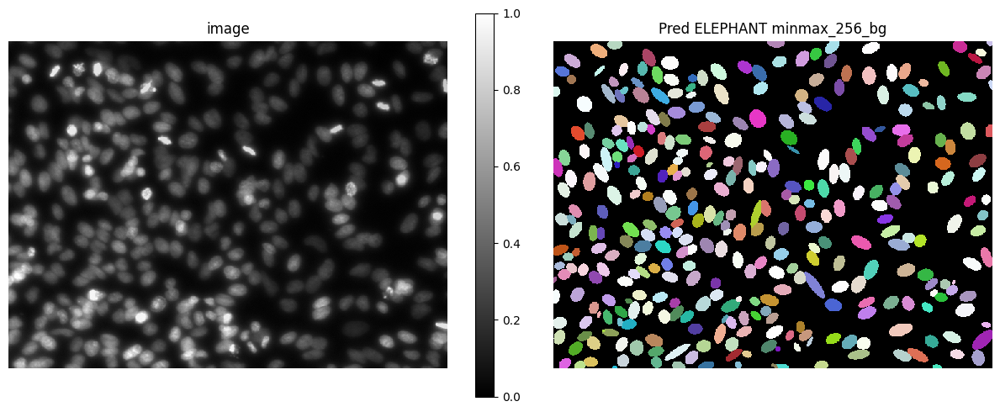

100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

2023-05-10 23:27:19,253 [INFO] DistributedDataParallel is not used.



DistributedDataParallel is not used.


2023-05-10 23:27:20,940 [INFO] Train Epoch: 0 [48/48 (100%)]	Loss: 0.552697	NLL Loss: 1.020428	Center Dice Loss: 0.558657	Smooth Loss: 0.055169


Train Epoch: 0 [48/48 (100%)]	Loss: 0.552697	NLL Loss: 1.020428	Center Dice Loss: 0.558657	Smooth Loss: 0.055169


2023-05-10 23:27:21,087 [INFO] Eval Epoch: 0 	Loss: 0.421689


Eval Epoch: 0 	Loss: 0.421689


2023-05-10 23:27:22,495 [INFO] Train Epoch: 1 [48/48 (100%)]	Loss: 0.351690	NLL Loss: 0.634696	Center Dice Loss: 0.358723	Smooth Loss: 0.033518


Train Epoch: 1 [48/48 (100%)]	Loss: 0.351690	NLL Loss: 0.634696	Center Dice Loss: 0.358723	Smooth Loss: 0.033518


2023-05-10 23:27:22,652 [INFO] Eval Epoch: 1 	Loss: 0.325361


Eval Epoch: 1 	Loss: 0.325361


2023-05-10 23:27:23,784 [INFO] Train Epoch: 2 [48/48 (100%)]	Loss: 0.317087	NLL Loss: 0.576573	Center Dice Loss: 0.321868	Smooth Loss: 0.033699


Train Epoch: 2 [48/48 (100%)]	Loss: 0.317087	NLL Loss: 0.576573	Center Dice Loss: 0.321868	Smooth Loss: 0.033699


2023-05-10 23:27:23,930 [INFO] Eval Epoch: 2 	Loss: 0.311977


Eval Epoch: 2 	Loss: 0.311977


2023-05-10 23:27:25,222 [INFO] Train Epoch: 3 [48/48 (100%)]	Loss: 0.272967	NLL Loss: 0.525114	Center Dice Loss: 0.270469	Smooth Loss: 0.033313


Train Epoch: 3 [48/48 (100%)]	Loss: 0.272967	NLL Loss: 0.525114	Center Dice Loss: 0.270469	Smooth Loss: 0.033313


2023-05-10 23:27:25,375 [INFO] Eval Epoch: 3 	Loss: 0.259481


Eval Epoch: 3 	Loss: 0.259481


2023-05-10 23:27:26,779 [INFO] Train Epoch: 4 [48/48 (100%)]	Loss: 0.247298	NLL Loss: 0.474423	Center Dice Loss: 0.244702	Smooth Loss: 0.033155


Train Epoch: 4 [48/48 (100%)]	Loss: 0.247298	NLL Loss: 0.474423	Center Dice Loss: 0.244702	Smooth Loss: 0.033155


2023-05-10 23:27:26,933 [INFO] Eval Epoch: 4 	Loss: 0.231585


Eval Epoch: 4 	Loss: 0.231585


2023-05-10 23:27:28,219 [INFO] Train Epoch: 5 [48/48 (100%)]	Loss: 0.242911	NLL Loss: 0.458453	Center Dice Loss: 0.241273	Smooth Loss: 0.035558


Train Epoch: 5 [48/48 (100%)]	Loss: 0.242911	NLL Loss: 0.458453	Center Dice Loss: 0.241273	Smooth Loss: 0.035558


2023-05-10 23:27:28,364 [INFO] Eval Epoch: 5 	Loss: 0.249727


Eval Epoch: 5 	Loss: 0.249727


2023-05-10 23:27:29,617 [INFO] Train Epoch: 6 [48/48 (100%)]	Loss: 0.232196	NLL Loss: 0.441778	Center Dice Loss: 0.229384	Smooth Loss: 0.036671


Train Epoch: 6 [48/48 (100%)]	Loss: 0.232196	NLL Loss: 0.441778	Center Dice Loss: 0.229384	Smooth Loss: 0.036671


2023-05-10 23:27:29,765 [INFO] Eval Epoch: 6 	Loss: 0.225738


Eval Epoch: 6 	Loss: 0.225738


2023-05-10 23:27:31,224 [INFO] Train Epoch: 7 [48/48 (100%)]	Loss: 0.212292	NLL Loss: 0.403349	Center Dice Loss: 0.209424	Smooth Loss: 0.035574


Train Epoch: 7 [48/48 (100%)]	Loss: 0.212292	NLL Loss: 0.403349	Center Dice Loss: 0.209424	Smooth Loss: 0.035574


2023-05-10 23:27:31,377 [INFO] Eval Epoch: 7 	Loss: 0.210621


Eval Epoch: 7 	Loss: 0.210621


2023-05-10 23:27:32,659 [INFO] Train Epoch: 8 [48/48 (100%)]	Loss: 0.197616	NLL Loss: 0.386787	Center Dice Loss: 0.191900	Smooth Loss: 0.037022


Train Epoch: 8 [48/48 (100%)]	Loss: 0.197616	NLL Loss: 0.386787	Center Dice Loss: 0.191900	Smooth Loss: 0.037022


2023-05-10 23:27:32,811 [INFO] Eval Epoch: 8 	Loss: 0.183218


Eval Epoch: 8 	Loss: 0.183218


2023-05-10 23:27:34,403 [INFO] Train Epoch: 9 [48/48 (100%)]	Loss: 0.199778	NLL Loss: 0.382952	Center Dice Loss: 0.195913	Smooth Loss: 0.035927


Train Epoch: 9 [48/48 (100%)]	Loss: 0.199778	NLL Loss: 0.382952	Center Dice Loss: 0.195913	Smooth Loss: 0.035927


2023-05-10 23:27:34,578 [INFO] Eval Epoch: 9 	Loss: 0.208913


Eval Epoch: 9 	Loss: 0.208913


2023-05-10 23:27:35,919 [INFO] Train Epoch: 10 [48/48 (100%)]	Loss: 0.188558	NLL Loss: 0.361006	Center Dice Loss: 0.184741	Smooth Loss: 0.035196


Train Epoch: 10 [48/48 (100%)]	Loss: 0.188558	NLL Loss: 0.361006	Center Dice Loss: 0.184741	Smooth Loss: 0.035196


2023-05-10 23:27:36,084 [INFO] Eval Epoch: 10 	Loss: 0.182284


Eval Epoch: 10 	Loss: 0.182284


2023-05-10 23:27:37,268 [INFO] Train Epoch: 11 [48/48 (100%)]	Loss: 0.182413	NLL Loss: 0.351524	Center Dice Loss: 0.177762	Smooth Loss: 0.036555


Train Epoch: 11 [48/48 (100%)]	Loss: 0.182413	NLL Loss: 0.351524	Center Dice Loss: 0.177762	Smooth Loss: 0.036555


2023-05-10 23:27:37,414 [INFO] Eval Epoch: 11 	Loss: 0.188854


Eval Epoch: 11 	Loss: 0.188854


2023-05-10 23:27:38,784 [INFO] Train Epoch: 12 [48/48 (100%)]	Loss: 0.180772	NLL Loss: 0.348153	Center Dice Loss: 0.176163	Smooth Loss: 0.036433


Train Epoch: 12 [48/48 (100%)]	Loss: 0.180772	NLL Loss: 0.348153	Center Dice Loss: 0.176163	Smooth Loss: 0.036433


2023-05-10 23:27:38,934 [INFO] Eval Epoch: 12 	Loss: 0.176692


Eval Epoch: 12 	Loss: 0.176692


2023-05-10 23:27:40,445 [INFO] Train Epoch: 13 [48/48 (100%)]	Loss: 0.177601	NLL Loss: 0.340660	Center Dice Loss: 0.172883	Smooth Loss: 0.038130


Train Epoch: 13 [48/48 (100%)]	Loss: 0.177601	NLL Loss: 0.340660	Center Dice Loss: 0.172883	Smooth Loss: 0.038130


2023-05-10 23:27:40,603 [INFO] Eval Epoch: 13 	Loss: 0.190936


Eval Epoch: 13 	Loss: 0.190936


2023-05-10 23:27:42,003 [INFO] Train Epoch: 14 [48/48 (100%)]	Loss: 0.173031	NLL Loss: 0.327862	Center Dice Loss: 0.169542	Smooth Loss: 0.035647


Train Epoch: 14 [48/48 (100%)]	Loss: 0.173031	NLL Loss: 0.327862	Center Dice Loss: 0.169542	Smooth Loss: 0.035647


2023-05-10 23:27:42,155 [INFO] Eval Epoch: 14 	Loss: 0.182175


Eval Epoch: 14 	Loss: 0.182175


2023-05-10 23:27:43,784 [INFO] Train Epoch: 15 [48/48 (100%)]	Loss: 0.168165	NLL Loss: 0.320714	Center Dice Loss: 0.164108	Smooth Loss: 0.035898


Train Epoch: 15 [48/48 (100%)]	Loss: 0.168165	NLL Loss: 0.320714	Center Dice Loss: 0.164108	Smooth Loss: 0.035898


2023-05-10 23:27:43,943 [INFO] Eval Epoch: 15 	Loss: 0.167157


Eval Epoch: 15 	Loss: 0.167157


2023-05-10 23:27:45,503 [INFO] Train Epoch: 16 [48/48 (100%)]	Loss: 0.167563	NLL Loss: 0.322365	Center Dice Loss: 0.162661	Smooth Loss: 0.037270


Train Epoch: 16 [48/48 (100%)]	Loss: 0.167563	NLL Loss: 0.322365	Center Dice Loss: 0.162661	Smooth Loss: 0.037270


2023-05-10 23:27:45,661 [INFO] Eval Epoch: 16 	Loss: 0.154044


Eval Epoch: 16 	Loss: 0.154044


2023-05-10 23:27:47,134 [INFO] Train Epoch: 17 [48/48 (100%)]	Loss: 0.169791	NLL Loss: 0.323740	Center Dice Loss: 0.165412	Smooth Loss: 0.037739


Train Epoch: 17 [48/48 (100%)]	Loss: 0.169791	NLL Loss: 0.323740	Center Dice Loss: 0.165412	Smooth Loss: 0.037739


2023-05-10 23:27:47,289 [INFO] Eval Epoch: 17 	Loss: 0.183752


Eval Epoch: 17 	Loss: 0.183752


2023-05-10 23:27:48,782 [INFO] Train Epoch: 18 [48/48 (100%)]	Loss: 0.156281	NLL Loss: 0.304684	Center Dice Loss: 0.150289	Smooth Loss: 0.037841


Train Epoch: 18 [48/48 (100%)]	Loss: 0.156281	NLL Loss: 0.304684	Center Dice Loss: 0.150289	Smooth Loss: 0.037841


2023-05-10 23:27:48,959 [INFO] Eval Epoch: 18 	Loss: 0.165881


Eval Epoch: 18 	Loss: 0.165881


2023-05-10 23:27:50,487 [INFO] Train Epoch: 19 [48/48 (100%)]	Loss: 0.152086	NLL Loss: 0.294306	Center Dice Loss: 0.146506	Smooth Loss: 0.037766


Train Epoch: 19 [48/48 (100%)]	Loss: 0.152086	NLL Loss: 0.294306	Center Dice Loss: 0.146506	Smooth Loss: 0.037766


2023-05-10 23:27:50,647 [INFO] Eval Epoch: 19 	Loss: 0.150180


Eval Epoch: 19 	Loss: 0.150180


2023-05-10 23:27:52,298 [INFO] Train Epoch: 20 [48/48 (100%)]	Loss: 0.155036	NLL Loss: 0.298582	Center Dice Loss: 0.149985	Smooth Loss: 0.036744


Train Epoch: 20 [48/48 (100%)]	Loss: 0.155036	NLL Loss: 0.298582	Center Dice Loss: 0.149985	Smooth Loss: 0.036744


2023-05-10 23:27:52,457 [INFO] Eval Epoch: 20 	Loss: 0.168266


Eval Epoch: 20 	Loss: 0.168266


2023-05-10 23:27:53,905 [INFO] Train Epoch: 21 [48/48 (100%)]	Loss: 0.156044	NLL Loss: 0.294912	Center Dice Loss: 0.152134	Smooth Loss: 0.036725


Train Epoch: 21 [48/48 (100%)]	Loss: 0.156044	NLL Loss: 0.294912	Center Dice Loss: 0.152134	Smooth Loss: 0.036725


2023-05-10 23:27:54,059 [INFO] Eval Epoch: 21 	Loss: 0.149547


Eval Epoch: 21 	Loss: 0.149547


2023-05-10 23:27:55,634 [INFO] Train Epoch: 22 [48/48 (100%)]	Loss: 0.148449	NLL Loss: 0.284410	Center Dice Loss: 0.143439	Smooth Loss: 0.037534


Train Epoch: 22 [48/48 (100%)]	Loss: 0.148449	NLL Loss: 0.284410	Center Dice Loss: 0.143439	Smooth Loss: 0.037534


2023-05-10 23:27:55,784 [INFO] Eval Epoch: 22 	Loss: 0.152196


Eval Epoch: 22 	Loss: 0.152196


2023-05-10 23:27:57,110 [INFO] Train Epoch: 23 [48/48 (100%)]	Loss: 0.151279	NLL Loss: 0.294257	Center Dice Loss: 0.145006	Smooth Loss: 0.039668


Train Epoch: 23 [48/48 (100%)]	Loss: 0.151279	NLL Loss: 0.294257	Center Dice Loss: 0.145006	Smooth Loss: 0.039668


2023-05-10 23:27:57,266 [INFO] Eval Epoch: 23 	Loss: 0.147286


Eval Epoch: 23 	Loss: 0.147286


2023-05-10 23:27:58,468 [INFO] Train Epoch: 24 [48/48 (100%)]	Loss: 0.146986	NLL Loss: 0.283354	Center Dice Loss: 0.141033	Smooth Loss: 0.040380


Train Epoch: 24 [48/48 (100%)]	Loss: 0.146986	NLL Loss: 0.283354	Center Dice Loss: 0.141033	Smooth Loss: 0.040380


2023-05-10 23:27:58,629 [INFO] Eval Epoch: 24 	Loss: 0.136245


Eval Epoch: 24 	Loss: 0.136245


2023-05-10 23:28:00,028 [INFO] Train Epoch: 25 [48/48 (100%)]	Loss: 0.143923	NLL Loss: 0.279144	Center Dice Loss: 0.137853	Smooth Loss: 0.039049


Train Epoch: 25 [48/48 (100%)]	Loss: 0.143923	NLL Loss: 0.279144	Center Dice Loss: 0.137853	Smooth Loss: 0.039049


2023-05-10 23:28:00,176 [INFO] Eval Epoch: 25 	Loss: 0.144566


Eval Epoch: 25 	Loss: 0.144566


2023-05-10 23:28:01,484 [INFO] Train Epoch: 26 [48/48 (100%)]	Loss: 0.144883	NLL Loss: 0.276894	Center Dice Loss: 0.139538	Smooth Loss: 0.039597


Train Epoch: 26 [48/48 (100%)]	Loss: 0.144883	NLL Loss: 0.276894	Center Dice Loss: 0.139538	Smooth Loss: 0.039597


2023-05-10 23:28:01,641 [INFO] Eval Epoch: 26 	Loss: 0.133191


Eval Epoch: 26 	Loss: 0.133191


2023-05-10 23:28:03,113 [INFO] Train Epoch: 27 [48/48 (100%)]	Loss: 0.132585	NLL Loss: 0.254670	Center Dice Loss: 0.126991	Smooth Loss: 0.038467


Train Epoch: 27 [48/48 (100%)]	Loss: 0.132585	NLL Loss: 0.254670	Center Dice Loss: 0.126991	Smooth Loss: 0.038467


2023-05-10 23:28:03,267 [INFO] Eval Epoch: 27 	Loss: 0.124025


Eval Epoch: 27 	Loss: 0.124025


2023-05-10 23:28:04,745 [INFO] Train Epoch: 28 [48/48 (100%)]	Loss: 0.124190	NLL Loss: 0.238336	Center Dice Loss: 0.118556	Smooth Loss: 0.038215


Train Epoch: 28 [48/48 (100%)]	Loss: 0.124190	NLL Loss: 0.238336	Center Dice Loss: 0.118556	Smooth Loss: 0.038215


2023-05-10 23:28:04,900 [INFO] Eval Epoch: 28 	Loss: 0.121865


Eval Epoch: 28 	Loss: 0.121865


2023-05-10 23:28:06,260 [INFO] Train Epoch: 29 [48/48 (100%)]	Loss: 0.134028	NLL Loss: 0.257418	Center Dice Loss: 0.128419	Smooth Loss: 0.038682


Train Epoch: 29 [48/48 (100%)]	Loss: 0.134028	NLL Loss: 0.257418	Center Dice Loss: 0.128419	Smooth Loss: 0.038682


2023-05-10 23:28:06,420 [INFO] Eval Epoch: 29 	Loss: 0.134721


Eval Epoch: 29 	Loss: 0.134721


2023-05-10 23:28:07,996 [INFO] Train Epoch: 30 [48/48 (100%)]	Loss: 0.129427	NLL Loss: 0.246638	Center Dice Loss: 0.123824	Smooth Loss: 0.040231


Train Epoch: 30 [48/48 (100%)]	Loss: 0.129427	NLL Loss: 0.246638	Center Dice Loss: 0.123824	Smooth Loss: 0.040231


2023-05-10 23:28:08,152 [INFO] Eval Epoch: 30 	Loss: 0.143568


Eval Epoch: 30 	Loss: 0.143568


2023-05-10 23:28:09,736 [INFO] Train Epoch: 31 [48/48 (100%)]	Loss: 0.130310	NLL Loss: 0.248133	Center Dice Loss: 0.124911	Smooth Loss: 0.039484


Train Epoch: 31 [48/48 (100%)]	Loss: 0.130310	NLL Loss: 0.248133	Center Dice Loss: 0.124911	Smooth Loss: 0.039484


2023-05-10 23:28:09,886 [INFO] Eval Epoch: 31 	Loss: 0.127083


Eval Epoch: 31 	Loss: 0.127083


2023-05-10 23:28:11,275 [INFO] Train Epoch: 32 [48/48 (100%)]	Loss: 0.131026	NLL Loss: 0.249811	Center Dice Loss: 0.125619	Smooth Loss: 0.039278


Train Epoch: 32 [48/48 (100%)]	Loss: 0.131026	NLL Loss: 0.249811	Center Dice Loss: 0.125619	Smooth Loss: 0.039278


2023-05-10 23:28:11,433 [INFO] Eval Epoch: 32 	Loss: 0.119666


Eval Epoch: 32 	Loss: 0.119666


2023-05-10 23:28:12,625 [INFO] Train Epoch: 33 [48/48 (100%)]	Loss: 0.134916	NLL Loss: 0.257538	Center Dice Loss: 0.129434	Smooth Loss: 0.039703


Train Epoch: 33 [48/48 (100%)]	Loss: 0.134916	NLL Loss: 0.257538	Center Dice Loss: 0.129434	Smooth Loss: 0.039703


2023-05-10 23:28:12,777 [INFO] Eval Epoch: 33 	Loss: 0.137019


Eval Epoch: 33 	Loss: 0.137019


2023-05-10 23:28:14,394 [INFO] Train Epoch: 34 [48/48 (100%)]	Loss: 0.115562	NLL Loss: 0.219500	Center Dice Loss: 0.109710	Smooth Loss: 0.040887


Train Epoch: 34 [48/48 (100%)]	Loss: 0.115562	NLL Loss: 0.219500	Center Dice Loss: 0.109710	Smooth Loss: 0.040887


2023-05-10 23:28:14,553 [INFO] Eval Epoch: 34 	Loss: 0.104548


Eval Epoch: 34 	Loss: 0.104548


2023-05-10 23:28:15,751 [INFO] Train Epoch: 35 [48/48 (100%)]	Loss: 0.130946	NLL Loss: 0.246224	Center Dice Loss: 0.126058	Smooth Loss: 0.040107


Train Epoch: 35 [48/48 (100%)]	Loss: 0.130946	NLL Loss: 0.246224	Center Dice Loss: 0.126058	Smooth Loss: 0.040107


2023-05-10 23:28:15,904 [INFO] Eval Epoch: 35 	Loss: 0.130027


Eval Epoch: 35 	Loss: 0.130027


2023-05-10 23:28:17,333 [INFO] Train Epoch: 36 [48/48 (100%)]	Loss: 0.121909	NLL Loss: 0.231132	Center Dice Loss: 0.116526	Smooth Loss: 0.039602


Train Epoch: 36 [48/48 (100%)]	Loss: 0.121909	NLL Loss: 0.231132	Center Dice Loss: 0.116526	Smooth Loss: 0.039602


2023-05-10 23:28:17,490 [INFO] Eval Epoch: 36 	Loss: 0.133140


Eval Epoch: 36 	Loss: 0.133140


2023-05-10 23:28:18,921 [INFO] Train Epoch: 37 [48/48 (100%)]	Loss: 0.115206	NLL Loss: 0.217434	Center Dice Loss: 0.109514	Smooth Loss: 0.041440


Train Epoch: 37 [48/48 (100%)]	Loss: 0.115206	NLL Loss: 0.217434	Center Dice Loss: 0.109514	Smooth Loss: 0.041440


2023-05-10 23:28:19,074 [INFO] Eval Epoch: 37 	Loss: 0.132242


Eval Epoch: 37 	Loss: 0.132242


2023-05-10 23:28:20,616 [INFO] Train Epoch: 38 [48/48 (100%)]	Loss: 0.114820	NLL Loss: 0.218636	Center Dice Loss: 0.108689	Smooth Loss: 0.041657


Train Epoch: 38 [48/48 (100%)]	Loss: 0.114820	NLL Loss: 0.218636	Center Dice Loss: 0.108689	Smooth Loss: 0.041657


2023-05-10 23:28:20,782 [INFO] Eval Epoch: 38 	Loss: 0.117208


Eval Epoch: 38 	Loss: 0.117208


2023-05-10 23:28:22,309 [INFO] Train Epoch: 39 [48/48 (100%)]	Loss: 0.113141	NLL Loss: 0.213102	Center Dice Loss: 0.107297	Smooth Loss: 0.042398


Train Epoch: 39 [48/48 (100%)]	Loss: 0.113141	NLL Loss: 0.213102	Center Dice Loss: 0.107297	Smooth Loss: 0.042398


2023-05-10 23:28:22,461 [INFO] Eval Epoch: 39 	Loss: 0.097878


Eval Epoch: 39 	Loss: 0.097878


2023-05-10 23:28:23,885 [INFO] Train Epoch: 40 [48/48 (100%)]	Loss: 0.112112	NLL Loss: 0.210778	Center Dice Loss: 0.106608	Smooth Loss: 0.040962


Train Epoch: 40 [48/48 (100%)]	Loss: 0.112112	NLL Loss: 0.210778	Center Dice Loss: 0.106608	Smooth Loss: 0.040962


2023-05-10 23:28:24,040 [INFO] Eval Epoch: 40 	Loss: 0.102815


Eval Epoch: 40 	Loss: 0.102815


2023-05-10 23:28:25,574 [INFO] Train Epoch: 41 [48/48 (100%)]	Loss: 0.110961	NLL Loss: 0.208253	Center Dice Loss: 0.105473	Smooth Loss: 0.041107


Train Epoch: 41 [48/48 (100%)]	Loss: 0.110961	NLL Loss: 0.208253	Center Dice Loss: 0.105473	Smooth Loss: 0.041107


2023-05-10 23:28:25,736 [INFO] Eval Epoch: 41 	Loss: 0.096216


Eval Epoch: 41 	Loss: 0.096216


2023-05-10 23:28:27,110 [INFO] Train Epoch: 42 [48/48 (100%)]	Loss: 0.114827	NLL Loss: 0.215913	Center Dice Loss: 0.109287	Smooth Loss: 0.041441


Train Epoch: 42 [48/48 (100%)]	Loss: 0.114827	NLL Loss: 0.215913	Center Dice Loss: 0.109287	Smooth Loss: 0.041441


2023-05-10 23:28:27,265 [INFO] Eval Epoch: 42 	Loss: 0.115254


Eval Epoch: 42 	Loss: 0.115254


2023-05-10 23:28:28,823 [INFO] Train Epoch: 43 [48/48 (100%)]	Loss: 0.108006	NLL Loss: 0.201466	Center Dice Loss: 0.102430	Smooth Loss: 0.042423


Train Epoch: 43 [48/48 (100%)]	Loss: 0.108006	NLL Loss: 0.201466	Center Dice Loss: 0.102430	Smooth Loss: 0.042423


2023-05-10 23:28:28,980 [INFO] Eval Epoch: 43 	Loss: 0.109333


Eval Epoch: 43 	Loss: 0.109333


2023-05-10 23:28:30,433 [INFO] Train Epoch: 44 [48/48 (100%)]	Loss: 0.107727	NLL Loss: 0.202668	Center Dice Loss: 0.101867	Smooth Loss: 0.042089


Train Epoch: 44 [48/48 (100%)]	Loss: 0.107727	NLL Loss: 0.202668	Center Dice Loss: 0.101867	Smooth Loss: 0.042089


2023-05-10 23:28:30,593 [INFO] Eval Epoch: 44 	Loss: 0.123618


Eval Epoch: 44 	Loss: 0.123618


2023-05-10 23:28:31,978 [INFO] Train Epoch: 45 [48/48 (100%)]	Loss: 0.107190	NLL Loss: 0.198844	Center Dice Loss: 0.101866	Smooth Loss: 0.042154


Train Epoch: 45 [48/48 (100%)]	Loss: 0.107190	NLL Loss: 0.198844	Center Dice Loss: 0.101866	Smooth Loss: 0.042154


2023-05-10 23:28:32,134 [INFO] Eval Epoch: 45 	Loss: 0.118822


Eval Epoch: 45 	Loss: 0.118822


2023-05-10 23:28:33,392 [INFO] Train Epoch: 46 [48/48 (100%)]	Loss: 0.117033	NLL Loss: 0.220350	Center Dice Loss: 0.111553	Smooth Loss: 0.041113


Train Epoch: 46 [48/48 (100%)]	Loss: 0.117033	NLL Loss: 0.220350	Center Dice Loss: 0.111553	Smooth Loss: 0.041113


2023-05-10 23:28:33,542 [INFO] Eval Epoch: 46 	Loss: 0.122820


Eval Epoch: 46 	Loss: 0.122820


2023-05-10 23:28:35,178 [INFO] Train Epoch: 47 [48/48 (100%)]	Loss: 0.117490	NLL Loss: 0.220923	Center Dice Loss: 0.111956	Smooth Loss: 0.041723


Train Epoch: 47 [48/48 (100%)]	Loss: 0.117490	NLL Loss: 0.220923	Center Dice Loss: 0.111956	Smooth Loss: 0.041723


2023-05-10 23:28:35,333 [INFO] Eval Epoch: 47 	Loss: 0.115609


Eval Epoch: 47 	Loss: 0.115609


2023-05-10 23:28:36,953 [INFO] Train Epoch: 48 [48/48 (100%)]	Loss: 0.115449	NLL Loss: 0.216319	Center Dice Loss: 0.110137	Smooth Loss: 0.041137


Train Epoch: 48 [48/48 (100%)]	Loss: 0.115449	NLL Loss: 0.216319	Center Dice Loss: 0.110137	Smooth Loss: 0.041137


2023-05-10 23:28:37,110 [INFO] Eval Epoch: 48 	Loss: 0.112031


Eval Epoch: 48 	Loss: 0.112031


2023-05-10 23:28:38,550 [INFO] Train Epoch: 49 [48/48 (100%)]	Loss: 0.110987	NLL Loss: 0.208707	Center Dice Loss: 0.105608	Smooth Loss: 0.040168


Train Epoch: 49 [48/48 (100%)]	Loss: 0.110987	NLL Loss: 0.208707	Center Dice Loss: 0.105608	Smooth Loss: 0.040168


2023-05-10 23:28:38,710 [INFO] Eval Epoch: 49 	Loss: 0.105675


Eval Epoch: 49 	Loss: 0.105675


2023-05-10 23:28:39,972 [INFO] Train Epoch: 50 [48/48 (100%)]	Loss: 0.113883	NLL Loss: 0.213734	Center Dice Loss: 0.108124	Smooth Loss: 0.042829


Train Epoch: 50 [48/48 (100%)]	Loss: 0.113883	NLL Loss: 0.213734	Center Dice Loss: 0.108124	Smooth Loss: 0.042829


2023-05-10 23:28:40,129 [INFO] Eval Epoch: 50 	Loss: 0.101410


Eval Epoch: 50 	Loss: 0.101410


2023-05-10 23:28:41,436 [INFO] Train Epoch: 51 [48/48 (100%)]	Loss: 0.105886	NLL Loss: 0.198987	Center Dice Loss: 0.100032	Smooth Loss: 0.042050


Train Epoch: 51 [48/48 (100%)]	Loss: 0.105886	NLL Loss: 0.198987	Center Dice Loss: 0.100032	Smooth Loss: 0.042050


2023-05-10 23:28:41,599 [INFO] Eval Epoch: 51 	Loss: 0.125559


Eval Epoch: 51 	Loss: 0.125559


2023-05-10 23:28:42,902 [INFO] Train Epoch: 52 [48/48 (100%)]	Loss: 0.109121	NLL Loss: 0.202522	Center Dice Loss: 0.103369	Smooth Loss: 0.044480


Train Epoch: 52 [48/48 (100%)]	Loss: 0.109121	NLL Loss: 0.202522	Center Dice Loss: 0.103369	Smooth Loss: 0.044480


2023-05-10 23:28:43,063 [INFO] Eval Epoch: 52 	Loss: 0.099531


Eval Epoch: 52 	Loss: 0.099531


2023-05-10 23:28:44,356 [INFO] Train Epoch: 53 [48/48 (100%)]	Loss: 0.107733	NLL Loss: 0.201899	Center Dice Loss: 0.102176	Smooth Loss: 0.041348


Train Epoch: 53 [48/48 (100%)]	Loss: 0.107733	NLL Loss: 0.201899	Center Dice Loss: 0.102176	Smooth Loss: 0.041348


2023-05-10 23:28:44,508 [INFO] Eval Epoch: 53 	Loss: 0.100666


Eval Epoch: 53 	Loss: 0.100666


2023-05-10 23:28:46,009 [INFO] Train Epoch: 54 [48/48 (100%)]	Loss: 0.104104	NLL Loss: 0.193570	Center Dice Loss: 0.098700	Smooth Loss: 0.041661


Train Epoch: 54 [48/48 (100%)]	Loss: 0.104104	NLL Loss: 0.193570	Center Dice Loss: 0.098700	Smooth Loss: 0.041661


2023-05-10 23:28:46,157 [INFO] Eval Epoch: 54 	Loss: 0.093073


Eval Epoch: 54 	Loss: 0.093073


2023-05-10 23:28:47,707 [INFO] Train Epoch: 55 [48/48 (100%)]	Loss: 0.107708	NLL Loss: 0.200632	Center Dice Loss: 0.102019	Smooth Loss: 0.043227


Train Epoch: 55 [48/48 (100%)]	Loss: 0.107708	NLL Loss: 0.200632	Center Dice Loss: 0.102019	Smooth Loss: 0.043227


2023-05-10 23:28:47,863 [INFO] Eval Epoch: 55 	Loss: 0.118346


Eval Epoch: 55 	Loss: 0.118346


2023-05-10 23:28:48,976 [INFO] Train Epoch: 56 [48/48 (100%)]	Loss: 0.096499	NLL Loss: 0.176596	Center Dice Loss: 0.091088	Smooth Loss: 0.043454


Train Epoch: 56 [48/48 (100%)]	Loss: 0.096499	NLL Loss: 0.176596	Center Dice Loss: 0.091088	Smooth Loss: 0.043454


2023-05-10 23:28:49,135 [INFO] Eval Epoch: 56 	Loss: 0.111870


Eval Epoch: 56 	Loss: 0.111870


2023-05-10 23:28:50,360 [INFO] Train Epoch: 57 [48/48 (100%)]	Loss: 0.103929	NLL Loss: 0.191788	Center Dice Loss: 0.098962	Smooth Loss: 0.040902


Train Epoch: 57 [48/48 (100%)]	Loss: 0.103929	NLL Loss: 0.191788	Center Dice Loss: 0.098962	Smooth Loss: 0.040902


2023-05-10 23:28:50,509 [INFO] Eval Epoch: 57 	Loss: 0.094558


Eval Epoch: 57 	Loss: 0.094558


2023-05-10 23:28:51,774 [INFO] Train Epoch: 58 [48/48 (100%)]	Loss: 0.099484	NLL Loss: 0.183952	Center Dice Loss: 0.094304	Smooth Loss: 0.040916


Train Epoch: 58 [48/48 (100%)]	Loss: 0.099484	NLL Loss: 0.183952	Center Dice Loss: 0.094304	Smooth Loss: 0.040916


2023-05-10 23:28:51,920 [INFO] Eval Epoch: 58 	Loss: 0.102535


Eval Epoch: 58 	Loss: 0.102535


2023-05-10 23:28:53,343 [INFO] Train Epoch: 59 [48/48 (100%)]	Loss: 0.102431	NLL Loss: 0.192527	Center Dice Loss: 0.096704	Smooth Loss: 0.040972


Train Epoch: 59 [48/48 (100%)]	Loss: 0.102431	NLL Loss: 0.192527	Center Dice Loss: 0.096704	Smooth Loss: 0.040972


2023-05-10 23:28:53,527 [INFO] Eval Epoch: 59 	Loss: 0.090631


Eval Epoch: 59 	Loss: 0.090631


2023-05-10 23:28:54,959 [INFO] Train Epoch: 60 [48/48 (100%)]	Loss: 0.101156	NLL Loss: 0.185933	Center Dice Loss: 0.095662	Smooth Loss: 0.043851


Train Epoch: 60 [48/48 (100%)]	Loss: 0.101156	NLL Loss: 0.185933	Center Dice Loss: 0.095662	Smooth Loss: 0.043851


2023-05-10 23:28:55,115 [INFO] Eval Epoch: 60 	Loss: 0.110156


Eval Epoch: 60 	Loss: 0.110156


2023-05-10 23:28:56,427 [INFO] Train Epoch: 61 [48/48 (100%)]	Loss: 0.104597	NLL Loss: 0.195713	Center Dice Loss: 0.098300	Smooth Loss: 0.044969


Train Epoch: 61 [48/48 (100%)]	Loss: 0.104597	NLL Loss: 0.195713	Center Dice Loss: 0.098300	Smooth Loss: 0.044969


2023-05-10 23:28:56,584 [INFO] Eval Epoch: 61 	Loss: 0.110573


Eval Epoch: 61 	Loss: 0.110573


2023-05-10 23:28:58,146 [INFO] Train Epoch: 62 [48/48 (100%)]	Loss: 0.094634	NLL Loss: 0.172373	Center Dice Loss: 0.089376	Smooth Loss: 0.043180


Train Epoch: 62 [48/48 (100%)]	Loss: 0.094634	NLL Loss: 0.172373	Center Dice Loss: 0.089376	Smooth Loss: 0.043180


2023-05-10 23:28:58,301 [INFO] Eval Epoch: 62 	Loss: 0.088395


Eval Epoch: 62 	Loss: 0.088395


2023-05-10 23:28:59,916 [INFO] Train Epoch: 63 [48/48 (100%)]	Loss: 0.097940	NLL Loss: 0.182238	Center Dice Loss: 0.092376	Smooth Loss: 0.041459


Train Epoch: 63 [48/48 (100%)]	Loss: 0.097940	NLL Loss: 0.182238	Center Dice Loss: 0.092376	Smooth Loss: 0.041459


2023-05-10 23:29:00,081 [INFO] Eval Epoch: 63 	Loss: 0.088053


Eval Epoch: 63 	Loss: 0.088053


2023-05-10 23:29:01,316 [INFO] Train Epoch: 64 [48/48 (100%)]	Loss: 0.088829	NLL Loss: 0.160163	Center Dice Loss: 0.083799	Smooth Loss: 0.042645


Train Epoch: 64 [48/48 (100%)]	Loss: 0.088829	NLL Loss: 0.160163	Center Dice Loss: 0.083799	Smooth Loss: 0.042645


2023-05-10 23:29:01,469 [INFO] Eval Epoch: 64 	Loss: 0.091170


Eval Epoch: 64 	Loss: 0.091170


2023-05-10 23:29:02,887 [INFO] Train Epoch: 65 [48/48 (100%)]	Loss: 0.096413	NLL Loss: 0.177766	Center Dice Loss: 0.090473	Smooth Loss: 0.044758


Train Epoch: 65 [48/48 (100%)]	Loss: 0.096413	NLL Loss: 0.177766	Center Dice Loss: 0.090473	Smooth Loss: 0.044758


2023-05-10 23:29:03,035 [INFO] Eval Epoch: 65 	Loss: 0.088732


Eval Epoch: 65 	Loss: 0.088732


2023-05-10 23:29:04,330 [INFO] Train Epoch: 66 [48/48 (100%)]	Loss: 0.084552	NLL Loss: 0.152201	Center Dice Loss: 0.079638	Smooth Loss: 0.041476


Train Epoch: 66 [48/48 (100%)]	Loss: 0.084552	NLL Loss: 0.152201	Center Dice Loss: 0.079638	Smooth Loss: 0.041476


2023-05-10 23:29:04,515 [INFO] Eval Epoch: 66 	Loss: 0.092690


Eval Epoch: 66 	Loss: 0.092690


2023-05-10 23:29:05,912 [INFO] Train Epoch: 67 [48/48 (100%)]	Loss: 0.089243	NLL Loss: 0.162816	Center Dice Loss: 0.083686	Smooth Loss: 0.043450


Train Epoch: 67 [48/48 (100%)]	Loss: 0.089243	NLL Loss: 0.162816	Center Dice Loss: 0.083686	Smooth Loss: 0.043450


2023-05-10 23:29:06,068 [INFO] Eval Epoch: 67 	Loss: 0.080868


Eval Epoch: 67 	Loss: 0.080868


2023-05-10 23:29:07,639 [INFO] Train Epoch: 68 [48/48 (100%)]	Loss: 0.090644	NLL Loss: 0.165187	Center Dice Loss: 0.085255	Smooth Loss: 0.043045


Train Epoch: 68 [48/48 (100%)]	Loss: 0.090644	NLL Loss: 0.165187	Center Dice Loss: 0.085255	Smooth Loss: 0.043045


2023-05-10 23:29:07,790 [INFO] Eval Epoch: 68 	Loss: 0.109936


Eval Epoch: 68 	Loss: 0.109936


2023-05-10 23:29:09,158 [INFO] Train Epoch: 69 [48/48 (100%)]	Loss: 0.092151	NLL Loss: 0.169531	Center Dice Loss: 0.086610	Smooth Loss: 0.042474


Train Epoch: 69 [48/48 (100%)]	Loss: 0.092151	NLL Loss: 0.169531	Center Dice Loss: 0.086610	Smooth Loss: 0.042474


2023-05-10 23:29:09,310 [INFO] Eval Epoch: 69 	Loss: 0.094681


Eval Epoch: 69 	Loss: 0.094681


2023-05-10 23:29:10,654 [INFO] Train Epoch: 70 [48/48 (100%)]	Loss: 0.095159	NLL Loss: 0.175700	Center Dice Loss: 0.089377	Smooth Loss: 0.043531


Train Epoch: 70 [48/48 (100%)]	Loss: 0.095159	NLL Loss: 0.175700	Center Dice Loss: 0.089377	Smooth Loss: 0.043531


2023-05-10 23:29:10,810 [INFO] Eval Epoch: 70 	Loss: 0.098887


Eval Epoch: 70 	Loss: 0.098887


2023-05-10 23:29:12,594 [INFO] Train Epoch: 71 [48/48 (100%)]	Loss: 0.091459	NLL Loss: 0.169821	Center Dice Loss: 0.085710	Smooth Loss: 0.041838


Train Epoch: 71 [48/48 (100%)]	Loss: 0.091459	NLL Loss: 0.169821	Center Dice Loss: 0.085710	Smooth Loss: 0.041838


2023-05-10 23:29:12,747 [INFO] Eval Epoch: 71 	Loss: 0.079912


Eval Epoch: 71 	Loss: 0.079912


2023-05-10 23:29:14,115 [INFO] Train Epoch: 72 [48/48 (100%)]	Loss: 0.097275	NLL Loss: 0.180793	Center Dice Loss: 0.091238	Smooth Loss: 0.043941


Train Epoch: 72 [48/48 (100%)]	Loss: 0.097275	NLL Loss: 0.180793	Center Dice Loss: 0.091238	Smooth Loss: 0.043941


2023-05-10 23:29:14,282 [INFO] Eval Epoch: 72 	Loss: 0.096764


Eval Epoch: 72 	Loss: 0.096764


2023-05-10 23:29:15,781 [INFO] Train Epoch: 73 [48/48 (100%)]	Loss: 0.094327	NLL Loss: 0.172879	Center Dice Loss: 0.088397	Smooth Loss: 0.045425


Train Epoch: 73 [48/48 (100%)]	Loss: 0.094327	NLL Loss: 0.172879	Center Dice Loss: 0.088397	Smooth Loss: 0.045425


2023-05-10 23:29:15,928 [INFO] Eval Epoch: 73 	Loss: 0.090876


Eval Epoch: 73 	Loss: 0.090876


2023-05-10 23:29:17,627 [INFO] Train Epoch: 74 [48/48 (100%)]	Loss: 0.088069	NLL Loss: 0.159568	Center Dice Loss: 0.082528	Smooth Loss: 0.044273


Train Epoch: 74 [48/48 (100%)]	Loss: 0.088069	NLL Loss: 0.159568	Center Dice Loss: 0.082528	Smooth Loss: 0.044273


2023-05-10 23:29:17,788 [INFO] Eval Epoch: 74 	Loss: 0.081559


Eval Epoch: 74 	Loss: 0.081559


2023-05-10 23:29:18,932 [INFO] Train Epoch: 75 [48/48 (100%)]	Loss: 0.095771	NLL Loss: 0.178038	Center Dice Loss: 0.089443	Smooth Loss: 0.045144


Train Epoch: 75 [48/48 (100%)]	Loss: 0.095771	NLL Loss: 0.178038	Center Dice Loss: 0.089443	Smooth Loss: 0.045144


2023-05-10 23:29:19,089 [INFO] Eval Epoch: 75 	Loss: 0.089994


Eval Epoch: 75 	Loss: 0.089994


2023-05-10 23:29:20,532 [INFO] Train Epoch: 76 [48/48 (100%)]	Loss: 0.099474	NLL Loss: 0.182643	Center Dice Loss: 0.094176	Smooth Loss: 0.042794


Train Epoch: 76 [48/48 (100%)]	Loss: 0.099474	NLL Loss: 0.182643	Center Dice Loss: 0.094176	Smooth Loss: 0.042794


2023-05-10 23:29:20,689 [INFO] Eval Epoch: 76 	Loss: 0.100404


Eval Epoch: 76 	Loss: 0.100404


2023-05-10 23:29:21,978 [INFO] Train Epoch: 77 [48/48 (100%)]	Loss: 0.095038	NLL Loss: 0.174468	Center Dice Loss: 0.089660	Smooth Loss: 0.042501


Train Epoch: 77 [48/48 (100%)]	Loss: 0.095038	NLL Loss: 0.174468	Center Dice Loss: 0.089660	Smooth Loss: 0.042501


2023-05-10 23:29:22,129 [INFO] Eval Epoch: 77 	Loss: 0.084066


Eval Epoch: 77 	Loss: 0.084066


2023-05-10 23:29:23,631 [INFO] Train Epoch: 78 [48/48 (100%)]	Loss: 0.093176	NLL Loss: 0.172212	Center Dice Loss: 0.087418	Smooth Loss: 0.042934


Train Epoch: 78 [48/48 (100%)]	Loss: 0.093176	NLL Loss: 0.172212	Center Dice Loss: 0.087418	Smooth Loss: 0.042934


2023-05-10 23:29:23,805 [INFO] Eval Epoch: 78 	Loss: 0.074845


Eval Epoch: 78 	Loss: 0.074845


2023-05-10 23:29:25,259 [INFO] Train Epoch: 79 [48/48 (100%)]	Loss: 0.086189	NLL Loss: 0.157116	Center Dice Loss: 0.080354	Smooth Loss: 0.044439


Train Epoch: 79 [48/48 (100%)]	Loss: 0.086189	NLL Loss: 0.157116	Center Dice Loss: 0.080354	Smooth Loss: 0.044439


2023-05-10 23:29:25,426 [INFO] Eval Epoch: 79 	Loss: 0.094555


Eval Epoch: 79 	Loss: 0.094555


2023-05-10 23:29:26,622 [INFO] Train Epoch: 80 [48/48 (100%)]	Loss: 0.092153	NLL Loss: 0.168169	Center Dice Loss: 0.086666	Smooth Loss: 0.043572


Train Epoch: 80 [48/48 (100%)]	Loss: 0.092153	NLL Loss: 0.168169	Center Dice Loss: 0.086666	Smooth Loss: 0.043572


2023-05-10 23:29:26,778 [INFO] Eval Epoch: 80 	Loss: 0.091164


Eval Epoch: 80 	Loss: 0.091164


2023-05-10 23:29:28,062 [INFO] Train Epoch: 81 [48/48 (100%)]	Loss: 0.091108	NLL Loss: 0.166430	Center Dice Loss: 0.085759	Smooth Loss: 0.042526


Train Epoch: 81 [48/48 (100%)]	Loss: 0.091108	NLL Loss: 0.166430	Center Dice Loss: 0.085759	Smooth Loss: 0.042526


2023-05-10 23:29:28,224 [INFO] Eval Epoch: 81 	Loss: 0.086212


Eval Epoch: 81 	Loss: 0.086212


2023-05-10 23:29:29,649 [INFO] Train Epoch: 82 [48/48 (100%)]	Loss: 0.086816	NLL Loss: 0.158695	Center Dice Loss: 0.081180	Smooth Loss: 0.043119


Train Epoch: 82 [48/48 (100%)]	Loss: 0.086816	NLL Loss: 0.158695	Center Dice Loss: 0.081180	Smooth Loss: 0.043119


2023-05-10 23:29:29,806 [INFO] Eval Epoch: 82 	Loss: 0.078805


Eval Epoch: 82 	Loss: 0.078805


2023-05-10 23:29:31,260 [INFO] Train Epoch: 83 [48/48 (100%)]	Loss: 0.094735	NLL Loss: 0.174580	Center Dice Loss: 0.088909	Smooth Loss: 0.044021


Train Epoch: 83 [48/48 (100%)]	Loss: 0.094735	NLL Loss: 0.174580	Center Dice Loss: 0.088909	Smooth Loss: 0.044021


2023-05-10 23:29:31,418 [INFO] Eval Epoch: 83 	Loss: 0.090335


Eval Epoch: 83 	Loss: 0.090335


2023-05-10 23:29:32,598 [INFO] Train Epoch: 84 [48/48 (100%)]	Loss: 0.088679	NLL Loss: 0.162608	Center Dice Loss: 0.082823	Smooth Loss: 0.044032


Train Epoch: 84 [48/48 (100%)]	Loss: 0.088679	NLL Loss: 0.162608	Center Dice Loss: 0.082823	Smooth Loss: 0.044032


2023-05-10 23:29:32,753 [INFO] Eval Epoch: 84 	Loss: 0.100701


Eval Epoch: 84 	Loss: 0.100701


2023-05-10 23:29:34,288 [INFO] Train Epoch: 85 [48/48 (100%)]	Loss: 0.095626	NLL Loss: 0.177099	Center Dice Loss: 0.089605	Smooth Loss: 0.044262


Train Epoch: 85 [48/48 (100%)]	Loss: 0.095626	NLL Loss: 0.177099	Center Dice Loss: 0.089605	Smooth Loss: 0.044262


2023-05-10 23:29:34,450 [INFO] Eval Epoch: 85 	Loss: 0.115943


Eval Epoch: 85 	Loss: 0.115943


2023-05-10 23:29:35,741 [INFO] Train Epoch: 86 [48/48 (100%)]	Loss: 0.085537	NLL Loss: 0.155189	Center Dice Loss: 0.080246	Smooth Loss: 0.042338


Train Epoch: 86 [48/48 (100%)]	Loss: 0.085537	NLL Loss: 0.155189	Center Dice Loss: 0.080246	Smooth Loss: 0.042338


2023-05-10 23:29:35,914 [INFO] Eval Epoch: 86 	Loss: 0.080644


Eval Epoch: 86 	Loss: 0.080644


2023-05-10 23:29:37,133 [INFO] Train Epoch: 87 [48/48 (100%)]	Loss: 0.087708	NLL Loss: 0.160259	Center Dice Loss: 0.081787	Smooth Loss: 0.044763


Train Epoch: 87 [48/48 (100%)]	Loss: 0.087708	NLL Loss: 0.160259	Center Dice Loss: 0.081787	Smooth Loss: 0.044763


2023-05-10 23:29:37,294 [INFO] Eval Epoch: 87 	Loss: 0.089311


Eval Epoch: 87 	Loss: 0.089311


2023-05-10 23:29:38,586 [INFO] Train Epoch: 88 [48/48 (100%)]	Loss: 0.089349	NLL Loss: 0.161967	Center Dice Loss: 0.083858	Smooth Loss: 0.044185


Train Epoch: 88 [48/48 (100%)]	Loss: 0.089349	NLL Loss: 0.161967	Center Dice Loss: 0.083858	Smooth Loss: 0.044185


2023-05-10 23:29:38,741 [INFO] Eval Epoch: 88 	Loss: 0.086434


Eval Epoch: 88 	Loss: 0.086434


2023-05-10 23:29:40,225 [INFO] Train Epoch: 89 [48/48 (100%)]	Loss: 0.095338	NLL Loss: 0.175471	Center Dice Loss: 0.089463	Smooth Loss: 0.044577


Train Epoch: 89 [48/48 (100%)]	Loss: 0.095338	NLL Loss: 0.175471	Center Dice Loss: 0.089463	Smooth Loss: 0.044577


2023-05-10 23:29:40,402 [INFO] Eval Epoch: 89 	Loss: 0.099242


Eval Epoch: 89 	Loss: 0.099242


2023-05-10 23:29:41,741 [INFO] Train Epoch: 90 [48/48 (100%)]	Loss: 0.087567	NLL Loss: 0.159006	Center Dice Loss: 0.081800	Smooth Loss: 0.044966


Train Epoch: 90 [48/48 (100%)]	Loss: 0.087567	NLL Loss: 0.159006	Center Dice Loss: 0.081800	Smooth Loss: 0.044966


2023-05-10 23:29:41,905 [INFO] Eval Epoch: 90 	Loss: 0.078908


Eval Epoch: 90 	Loss: 0.078908


2023-05-10 23:29:43,549 [INFO] Train Epoch: 91 [48/48 (100%)]	Loss: 0.090779	NLL Loss: 0.165688	Center Dice Loss: 0.085163	Smooth Loss: 0.043955


Train Epoch: 91 [48/48 (100%)]	Loss: 0.090779	NLL Loss: 0.165688	Center Dice Loss: 0.085163	Smooth Loss: 0.043955


2023-05-10 23:29:43,711 [INFO] Eval Epoch: 91 	Loss: 0.077608


Eval Epoch: 91 	Loss: 0.077608


2023-05-10 23:29:45,257 [INFO] Train Epoch: 92 [48/48 (100%)]	Loss: 0.083239	NLL Loss: 0.150288	Center Dice Loss: 0.077382	Smooth Loss: 0.045471


Train Epoch: 92 [48/48 (100%)]	Loss: 0.083239	NLL Loss: 0.150288	Center Dice Loss: 0.077382	Smooth Loss: 0.045471


2023-05-10 23:29:45,420 [INFO] Eval Epoch: 92 	Loss: 0.073891


Eval Epoch: 92 	Loss: 0.073891


2023-05-10 23:29:46,749 [INFO] Train Epoch: 93 [48/48 (100%)]	Loss: 0.089076	NLL Loss: 0.163232	Center Dice Loss: 0.083025	Smooth Loss: 0.045172


Train Epoch: 93 [48/48 (100%)]	Loss: 0.089076	NLL Loss: 0.163232	Center Dice Loss: 0.083025	Smooth Loss: 0.045172


2023-05-10 23:29:46,900 [INFO] Eval Epoch: 93 	Loss: 0.101169


Eval Epoch: 93 	Loss: 0.101169


2023-05-10 23:29:48,385 [INFO] Train Epoch: 94 [48/48 (100%)]	Loss: 0.093143	NLL Loss: 0.171018	Center Dice Loss: 0.087786	Smooth Loss: 0.042053


Train Epoch: 94 [48/48 (100%)]	Loss: 0.093143	NLL Loss: 0.171018	Center Dice Loss: 0.087786	Smooth Loss: 0.042053


2023-05-10 23:29:48,549 [INFO] Eval Epoch: 94 	Loss: 0.082731


Eval Epoch: 94 	Loss: 0.082731


2023-05-10 23:29:49,926 [INFO] Train Epoch: 95 [48/48 (100%)]	Loss: 0.088970	NLL Loss: 0.165552	Center Dice Loss: 0.082717	Smooth Loss: 0.043651


Train Epoch: 95 [48/48 (100%)]	Loss: 0.088970	NLL Loss: 0.165552	Center Dice Loss: 0.082717	Smooth Loss: 0.043651


2023-05-10 23:29:50,084 [INFO] Eval Epoch: 95 	Loss: 0.114333


Eval Epoch: 95 	Loss: 0.114333


2023-05-10 23:29:51,512 [INFO] Train Epoch: 96 [48/48 (100%)]	Loss: 0.092906	NLL Loss: 0.171711	Center Dice Loss: 0.087166	Smooth Loss: 0.042800


Train Epoch: 96 [48/48 (100%)]	Loss: 0.092906	NLL Loss: 0.171711	Center Dice Loss: 0.087166	Smooth Loss: 0.042800


2023-05-10 23:29:51,673 [INFO] Eval Epoch: 96 	Loss: 0.095058


Eval Epoch: 96 	Loss: 0.095058


2023-05-10 23:29:53,121 [INFO] Train Epoch: 97 [48/48 (100%)]	Loss: 0.080483	NLL Loss: 0.143336	Center Dice Loss: 0.075424	Smooth Loss: 0.042925


Train Epoch: 97 [48/48 (100%)]	Loss: 0.080483	NLL Loss: 0.143336	Center Dice Loss: 0.075424	Smooth Loss: 0.042925


2023-05-10 23:29:53,276 [INFO] Eval Epoch: 97 	Loss: 0.085008


Eval Epoch: 97 	Loss: 0.085008


2023-05-10 23:29:54,659 [INFO] Train Epoch: 98 [48/48 (100%)]	Loss: 0.088369	NLL Loss: 0.159950	Center Dice Loss: 0.083099	Smooth Loss: 0.043136


Train Epoch: 98 [48/48 (100%)]	Loss: 0.088369	NLL Loss: 0.159950	Center Dice Loss: 0.083099	Smooth Loss: 0.043136


2023-05-10 23:29:54,814 [INFO] Eval Epoch: 98 	Loss: 0.087685


Eval Epoch: 98 	Loss: 0.087685


2023-05-10 23:29:56,116 [INFO] Train Epoch: 99 [48/48 (100%)]	Loss: 0.093442	NLL Loss: 0.172008	Center Dice Loss: 0.087308	Smooth Loss: 0.045544


Train Epoch: 99 [48/48 (100%)]	Loss: 0.093442	NLL Loss: 0.172008	Center Dice Loss: 0.087308	Smooth Loss: 0.045544


2023-05-10 23:29:56,271 [INFO] Eval Epoch: 99 	Loss: 0.100214


Eval Epoch: 99 	Loss: 0.100214
100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


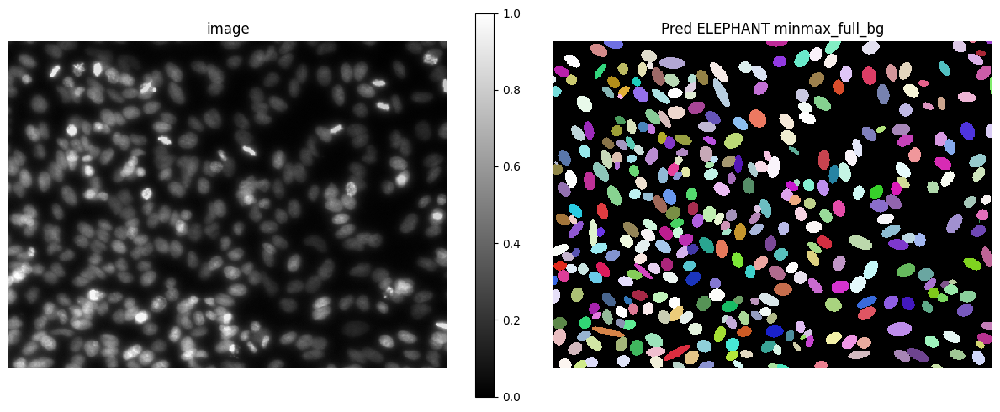

48it [00:01, 27.45it/s]
48it [00:00, 1017.79it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /src/models/stardist/paper_self/minmax_001_bg
2023-05-10 23:29:58.775448: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-05-10 23:29:58.776476: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-05-10 23:29:58.776719: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-05-10 23:29:58.778483: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] coul

Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100


2023-05-10 23:30:00.024411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


Cause: Unable to locate the source code of <function _gcd_import at 0x7f6a3bbb4430>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
2023-05-10 23:30:01,174 [WARNING] AutoGraph could not transform <function _gcd_import at 0x7f6a3bbb4430> and will run it as-is.
Cause: Unable to locate the source code of <function _gcd_import at 0x7f6a3bbb4430>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autogra

AutoGraph could not transform <function _gcd_import at 0x7f6a3bbb4430> and will run it as-is.
Cause: Unable to locate the source code of <function _gcd_import at 0x7f6a3bbb4430>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function _gcd_import at 0x7f6a3bbb4430>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


2023-05-10 23:30:02.098942: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8600
2023-05-10 23:30:03.505788: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0xb3557bc0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-05-10 23:30:03.505820: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): NVIDIA RTX A4000, Compute Capability 8.6
2023-05-10 23:30:03.509194: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-05-10 23:30:03.585792: I ./tensorflow/compiler/jit/device_compiler.h:180] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


6/6 [==============================] - ETA: 0s - loss: 2.4512 - prob_loss: 0.7642 - dist_loss: 8.4347 - prob_kld: 0.5569 - dist_relevant_mae: 8.4346 - dist_relevant_mse: 96.7154 - dist_dist_iou_metric: 7.8320e-04

2023-05-10 23:30:07.646105: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:637] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


6/6 [==============================] - 8s 188ms/step - loss: 2.4512 - prob_loss: 0.7642 - dist_loss: 8.4347 - prob_kld: 0.5569 - dist_relevant_mae: 8.4346 - dist_relevant_mse: 96.7154 - dist_dist_iou_metric: 7.8320e-04 - val_loss: 2.3381 - val_prob_loss: 0.6685 - val_dist_loss: 8.3480 - val_prob_kld: 0.4324 - val_dist_relevant_mae: 8.3480 - val_dist_relevant_mse: 94.0522 - val_dist_dist_iou_metric: 3.6303e-05 - lr: 0.0030
Epoch 2/100
6/6 [==============================] - 0s 60ms/step - loss: 2.3701 - prob_loss: 0.8619 - dist_loss: 7.5409 - prob_kld: 0.4653 - dist_relevant_mae: 7.5408 - dist_relevant_mse: 82.7752 - dist_dist_iou_metric: 0.0404 - val_loss: 2.3033 - val_prob_loss: 0.7292 - val_dist_loss: 7.8706 - val_prob_kld: 0.4931 - val_dist_relevant_mae: 7.8706 - val_dist_relevant_mse: 86.1454 - val_dist_dist_iou_metric: 0.0043 - lr: 0.0030
Epoch 3/100
6/6 [==============================] - 0s 55ms/step - loss: 2.2599 - prob_loss: 0.7192 - dist_loss: 7.7037 - prob_kld: 0.8016 - dist_

Epoch 27/100
6/6 [==============================] - 0s 56ms/step - loss: 1.4489 - prob_loss: 0.6610 - dist_loss: 3.9395 - prob_kld: 0.4529 - dist_relevant_mae: 3.9387 - dist_relevant_mse: 25.7181 - dist_dist_iou_metric: 0.3837 - val_loss: 1.3641 - val_prob_loss: 0.5747 - val_dist_loss: 3.9472 - val_prob_kld: 0.3386 - val_dist_relevant_mae: 3.9465 - val_dist_relevant_mse: 24.5550 - val_dist_dist_iou_metric: 0.4121 - lr: 0.0030
Epoch 28/100
6/6 [==============================] - 0s 56ms/step - loss: 1.4321 - prob_loss: 0.6589 - dist_loss: 3.8659 - prob_kld: 0.4784 - dist_relevant_mae: 3.8651 - dist_relevant_mse: 24.6072 - dist_dist_iou_metric: 0.3876 - val_loss: 1.3220 - val_prob_loss: 0.5403 - val_dist_loss: 3.9085 - val_prob_kld: 0.3042 - val_dist_relevant_mae: 3.9078 - val_dist_relevant_mse: 24.0140 - val_dist_dist_iou_metric: 0.4115 - lr: 0.0030
Epoch 29/100
6/6 [==============================] - 0s 57ms/step - loss: 1.4232 - prob_loss: 0.6683 - dist_loss: 3.7745 - prob_kld: 0.4433 -

Epoch 40/100
6/6 [==============================] - 0s 59ms/step - loss: 1.4303 - prob_loss: 0.6602 - dist_loss: 3.8506 - prob_kld: 0.5570 - dist_relevant_mae: 3.8498 - dist_relevant_mse: 24.6474 - dist_dist_iou_metric: 0.4013 - val_loss: 1.2603 - val_prob_loss: 0.4850 - val_dist_loss: 3.8763 - val_prob_kld: 0.2489 - val_dist_relevant_mae: 3.8756 - val_dist_relevant_mse: 23.3375 - val_dist_dist_iou_metric: 0.4529 - lr: 0.0030
Epoch 41/100
6/6 [==============================] - 0s 54ms/step - loss: 1.4552 - prob_loss: 0.6866 - dist_loss: 3.8430 - prob_kld: 0.4807 - dist_relevant_mae: 3.8421 - dist_relevant_mse: 24.9076 - dist_dist_iou_metric: 0.3870 - val_loss: 1.3778 - val_prob_loss: 0.6005 - val_dist_loss: 3.8866 - val_prob_kld: 0.3644 - val_dist_relevant_mae: 3.8861 - val_dist_relevant_mse: 24.7673 - val_dist_dist_iou_metric: 0.3699 - lr: 0.0030
Epoch 42/100
6/6 [==============================] - 0s 55ms/step - loss: 1.4395 - prob_loss: 0.6617 - dist_loss: 3.8890 - prob_kld: 0.4391 -

Epoch 53/100
6/6 [==============================] - 0s 59ms/step - loss: 1.3894 - prob_loss: 0.6637 - dist_loss: 3.6285 - prob_kld: 0.5118 - dist_relevant_mae: 3.6277 - dist_relevant_mse: 23.0545 - dist_dist_iou_metric: 0.4117 - val_loss: 1.2556 - val_prob_loss: 0.5015 - val_dist_loss: 3.7704 - val_prob_kld: 0.2654 - val_dist_relevant_mae: 3.7697 - val_dist_relevant_mse: 22.0319 - val_dist_dist_iou_metric: 0.4754 - lr: 0.0030
Epoch 54/100
6/6 [==============================] - 0s 55ms/step - loss: 1.4018 - prob_loss: 0.6592 - dist_loss: 3.7128 - prob_kld: 0.4896 - dist_relevant_mae: 3.7120 - dist_relevant_mse: 23.7640 - dist_dist_iou_metric: 0.4160 - val_loss: 1.3033 - val_prob_loss: 0.5677 - val_dist_loss: 3.6782 - val_prob_kld: 0.3316 - val_dist_relevant_mae: 3.6776 - val_dist_relevant_mse: 21.6474 - val_dist_dist_iou_metric: 0.4349 - lr: 0.0030
Epoch 55/100
6/6 [==============================] - 0s 55ms/step - loss: 1.3740 - prob_loss: 0.6742 - dist_loss: 3.4990 - prob_kld: 0.4313 -

Epoch 66/100
6/6 [==============================] - 0s 55ms/step - loss: 1.3628 - prob_loss: 0.6461 - dist_loss: 3.5835 - prob_kld: 0.4838 - dist_relevant_mae: 3.5827 - dist_relevant_mse: 22.5585 - dist_dist_iou_metric: 0.4163 - val_loss: 1.1637 - val_prob_loss: 0.4733 - val_dist_loss: 3.4518 - val_prob_kld: 0.2372 - val_dist_relevant_mae: 3.4512 - val_dist_relevant_mse: 19.2547 - val_dist_dist_iou_metric: 0.4832 - lr: 0.0030
Epoch 67/100
6/6 [==============================] - 0s 54ms/step - loss: 1.2769 - prob_loss: 0.5903 - dist_loss: 3.4327 - prob_kld: 0.4184 - dist_relevant_mae: 3.4319 - dist_relevant_mse: 20.5704 - dist_dist_iou_metric: 0.4651 - val_loss: 1.1528 - val_prob_loss: 0.4873 - val_dist_loss: 3.3275 - val_prob_kld: 0.2512 - val_dist_relevant_mae: 3.3269 - val_dist_relevant_mse: 18.5492 - val_dist_dist_iou_metric: 0.4681 - lr: 0.0030
Epoch 68/100
6/6 [==============================] - 0s 62ms/step - loss: 1.2997 - prob_loss: 0.6372 - dist_loss: 3.3124 - prob_kld: 0.4140 -

Epoch 79/100
6/6 [==============================] - 0s 56ms/step - loss: 1.2731 - prob_loss: 0.6094 - dist_loss: 3.3183 - prob_kld: 0.4300 - dist_relevant_mae: 3.3176 - dist_relevant_mse: 19.6749 - dist_dist_iou_metric: 0.4459 - val_loss: 1.1108 - val_prob_loss: 0.4690 - val_dist_loss: 3.2087 - val_prob_kld: 0.2329 - val_dist_relevant_mae: 3.2082 - val_dist_relevant_mse: 17.6438 - val_dist_dist_iou_metric: 0.4814 - lr: 0.0030
Epoch 80/100
6/6 [==============================] - 0s 55ms/step - loss: 1.2462 - prob_loss: 0.6392 - dist_loss: 3.0347 - prob_kld: 0.4218 - dist_relevant_mae: 3.0340 - dist_relevant_mse: 16.0731 - dist_dist_iou_metric: 0.4847 - val_loss: 1.0446 - val_prob_loss: 0.4414 - val_dist_loss: 3.0156 - val_prob_kld: 0.2053 - val_dist_relevant_mae: 3.0151 - val_dist_relevant_mse: 15.7506 - val_dist_dist_iou_metric: 0.5214 - lr: 0.0030
Epoch 81/100
6/6 [==============================] - 0s 57ms/step - loss: 1.1980 - prob_loss: 0.6345 - dist_loss: 2.8176 - prob_kld: 0.3421 -

Epoch 92/100
6/6 [==============================] - 0s 55ms/step - loss: 1.1493 - prob_loss: 0.6209 - dist_loss: 2.6419 - prob_kld: 0.3275 - dist_relevant_mae: 2.6412 - dist_relevant_mse: 13.0922 - dist_dist_iou_metric: 0.5334 - val_loss: 1.0837 - val_prob_loss: 0.4377 - val_dist_loss: 3.2298 - val_prob_kld: 0.2016 - val_dist_relevant_mae: 3.2293 - val_dist_relevant_mse: 17.9781 - val_dist_dist_iou_metric: 0.4759 - lr: 0.0030
Epoch 93/100
6/6 [==============================] - 0s 56ms/step - loss: 1.1187 - prob_loss: 0.6040 - dist_loss: 2.5734 - prob_kld: 0.2831 - dist_relevant_mae: 2.5727 - dist_relevant_mse: 12.4496 - dist_dist_iou_metric: 0.5336 - val_loss: 0.9672 - val_prob_loss: 0.3905 - val_dist_loss: 2.8835 - val_prob_kld: 0.1545 - val_dist_relevant_mae: 2.8829 - val_dist_relevant_mse: 14.7628 - val_dist_dist_iou_metric: 0.5319 - lr: 0.0030
Epoch 94/100
6/6 [==============================] - 0s 57ms/step - loss: 1.0728 - prob_loss: 0.5603 - dist_loss: 2.5625 - prob_kld: 0.3907 -


  0%|          | 0/1 [00:00<?, ?it/s]

2023-05-10 23:30:39,678 [INFO] 1/1 - 0s - 238ms/epoch - 238ms/step



1/1 - 0s - 238ms/epoch - 238ms/step



2023-05-10 23:30:39,860 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


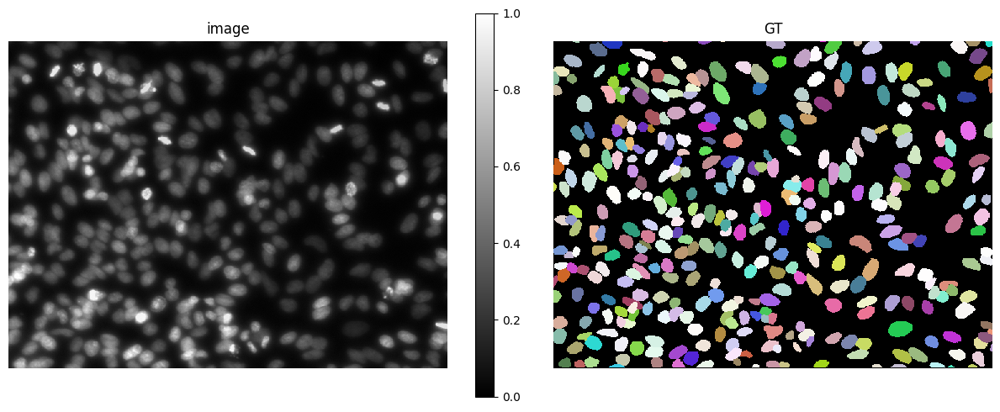

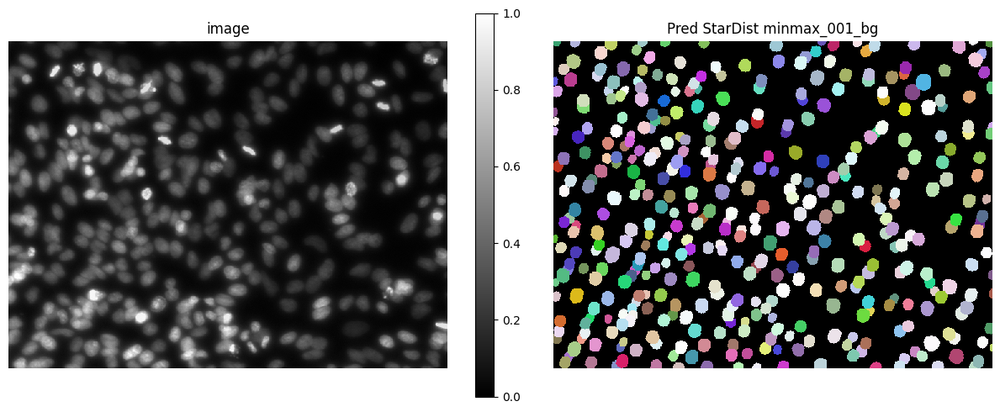

48it [00:01, 28.08it/s]
48it [00:00, 922.50it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /src/models/stardist/paper_self/minmax_004_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100


2023-05-10 23:30:42.816712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 4s 140ms/step - loss: 3.2325 - prob_loss: 1.3521 - dist_loss: 9.4017 - prob_kld: 0.5201 - dist_relevant_mae: 9.4016 - dist_relevant_mse: 130.3361 - dist_dist_iou_metric: 0.0172 - val_loss: 2.4843 - val_prob_loss: 0.6383 - val_dist_loss: 9.2300 - val_prob_kld: 0.4561 - val_dist_relevant_mae: 9.2300 - val_dist_relevant_mse: 115.6372 - val_dist_dist_iou_metric: 7.4714e-05 - lr: 0.0030
Epoch 2/100
6/6 [==============================] - 0s 62ms/step - loss: 2.5857 - prob_loss: 0.6463 - dist_loss: 9.6970 - prob_kld: 0.3853 - dist_relevant_mae: 9.6970 - dist_relevant_mse: 138.6107 - dist_dist_iou_metric: 0.0064 - val_loss: 2.0655 - val_prob_loss: 0.4461 - val_dist_loss: 8.0972 - val_prob_kld: 0.2639 - val_dist_relevant_mae: 8.0970 - val_dist_relevant_mse: 94.8970 - val_dist_dist_iou_metric: 0.0182 - lr: 0.0030
Epoch 3/100
6/6 [==============================] - 0s 60ms/step - loss: 2.5666 - prob_loss: 0.7524 - dist_loss: 9.0710 - prob_kld: 0.4684 - dist_r

Epoch 14/100
6/6 [==============================] - 0s 64ms/step - loss: 1.5685 - prob_loss: 0.5964 - dist_loss: 4.8608 - prob_kld: 0.2851 - dist_relevant_mae: 4.8599 - dist_relevant_mse: 41.3674 - dist_dist_iou_metric: 0.3409 - val_loss: 1.3079 - val_prob_loss: 0.4279 - val_dist_loss: 4.3996 - val_prob_kld: 0.2457 - val_dist_relevant_mae: 4.3987 - val_dist_relevant_mse: 30.4277 - val_dist_dist_iou_metric: 0.4130 - lr: 0.0030
Epoch 15/100
6/6 [==============================] - 0s 54ms/step - loss: 1.5400 - prob_loss: 0.5955 - dist_loss: 4.7227 - prob_kld: 0.3600 - dist_relevant_mae: 4.7218 - dist_relevant_mse: 37.7260 - dist_dist_iou_metric: 0.3683 - val_loss: 1.3484 - val_prob_loss: 0.4696 - val_dist_loss: 4.3938 - val_prob_kld: 0.2874 - val_dist_relevant_mae: 4.3930 - val_dist_relevant_mse: 30.1744 - val_dist_dist_iou_metric: 0.4278 - lr: 0.0030
Epoch 16/100
6/6 [==============================] - 0s 59ms/step - loss: 1.5214 - prob_loss: 0.5828 - dist_loss: 4.6927 - prob_kld: 0.3121 -

Epoch 27/100
6/6 [==============================] - 0s 61ms/step - loss: 1.5350 - prob_loss: 0.5472 - dist_loss: 4.9390 - prob_kld: 0.3481 - dist_relevant_mae: 4.9380 - dist_relevant_mse: 42.0883 - dist_dist_iou_metric: 0.3715 - val_loss: 1.2701 - val_prob_loss: 0.3965 - val_dist_loss: 4.3680 - val_prob_kld: 0.2143 - val_dist_relevant_mae: 4.3671 - val_dist_relevant_mse: 29.8939 - val_dist_dist_iou_metric: 0.4352 - lr: 0.0030
Epoch 28/100
6/6 [==============================] - 0s 58ms/step - loss: 1.5221 - prob_loss: 0.5719 - dist_loss: 4.7510 - prob_kld: 0.3348 - dist_relevant_mae: 4.7500 - dist_relevant_mse: 39.5698 - dist_dist_iou_metric: 0.3547 - val_loss: 1.2347 - val_prob_loss: 0.3552 - val_dist_loss: 4.3972 - val_prob_kld: 0.1730 - val_dist_relevant_mae: 4.3963 - val_dist_relevant_mse: 30.2770 - val_dist_dist_iou_metric: 0.4345 - lr: 0.0030
Epoch 29/100
6/6 [==============================] - 0s 55ms/step - loss: 1.5194 - prob_loss: 0.5553 - dist_loss: 4.8207 - prob_kld: 0.4244 -

Epoch 40/100
6/6 [==============================] - 0s 61ms/step - loss: 1.3713 - prob_loss: 0.4970 - dist_loss: 4.3716 - prob_kld: 0.2891 - dist_relevant_mae: 4.3707 - dist_relevant_mse: 34.0897 - dist_dist_iou_metric: 0.3831 - val_loss: 1.1452 - val_prob_loss: 0.3148 - val_dist_loss: 4.1522 - val_prob_kld: 0.1325 - val_dist_relevant_mae: 4.1515 - val_dist_relevant_mse: 29.2516 - val_dist_dist_iou_metric: 0.4059 - lr: 0.0030
Epoch 41/100
6/6 [==============================] - 0s 57ms/step - loss: 1.4083 - prob_loss: 0.4827 - dist_loss: 4.6280 - prob_kld: 0.2584 - dist_relevant_mae: 4.6273 - dist_relevant_mse: 39.5046 - dist_dist_iou_metric: 0.3662 - val_loss: 1.1630 - val_prob_loss: 0.3274 - val_dist_loss: 4.1782 - val_prob_kld: 0.1452 - val_dist_relevant_mae: 4.1775 - val_dist_relevant_mse: 28.7235 - val_dist_dist_iou_metric: 0.4296 - lr: 0.0030
Epoch 42/100
6/6 [==============================] - 0s 57ms/step - loss: 1.3871 - prob_loss: 0.4752 - dist_loss: 4.5596 - prob_kld: 0.2696 -

Epoch 53/100
6/6 [==============================] - 0s 58ms/step - loss: 1.1498 - prob_loss: 0.4507 - dist_loss: 3.4954 - prob_kld: 0.2306 - dist_relevant_mae: 3.4946 - dist_relevant_mse: 25.1016 - dist_dist_iou_metric: 0.4649 - val_loss: 1.0174 - val_prob_loss: 0.3227 - val_dist_loss: 3.4733 - val_prob_kld: 0.1405 - val_dist_relevant_mae: 3.4726 - val_dist_relevant_mse: 21.4739 - val_dist_dist_iou_metric: 0.5193 - lr: 0.0030
Epoch 54/100
6/6 [==============================] - 0s 56ms/step - loss: 1.1760 - prob_loss: 0.4773 - dist_loss: 3.4939 - prob_kld: 0.2663 - dist_relevant_mae: 3.4932 - dist_relevant_mse: 26.2339 - dist_dist_iou_metric: 0.4572 - val_loss: 0.9893 - val_prob_loss: 0.2732 - val_dist_loss: 3.5803 - val_prob_kld: 0.0910 - val_dist_relevant_mae: 3.5795 - val_dist_relevant_mse: 21.9879 - val_dist_dist_iou_metric: 0.5208 - lr: 0.0030
Epoch 55/100
6/6 [==============================] - 0s 63ms/step - loss: 1.1242 - prob_loss: 0.4597 - dist_loss: 3.3221 - prob_kld: 0.2589 -

Epoch 66/100
6/6 [==============================] - 0s 56ms/step - loss: 1.0561 - prob_loss: 0.4303 - dist_loss: 3.1289 - prob_kld: 0.2140 - dist_relevant_mae: 3.1281 - dist_relevant_mse: 21.3915 - dist_dist_iou_metric: 0.5368 - val_loss: 0.8176 - val_prob_loss: 0.2500 - val_dist_loss: 2.8380 - val_prob_kld: 0.0678 - val_dist_relevant_mae: 2.8374 - val_dist_relevant_mse: 16.2060 - val_dist_dist_iou_metric: 0.5429 - lr: 0.0030
Epoch 67/100
6/6 [==============================] - 0s 56ms/step - loss: 1.0209 - prob_loss: 0.4331 - dist_loss: 2.9392 - prob_kld: 0.2502 - dist_relevant_mae: 2.9384 - dist_relevant_mse: 19.4693 - dist_dist_iou_metric: 0.5373 - val_loss: 0.8115 - val_prob_loss: 0.2496 - val_dist_loss: 2.8095 - val_prob_kld: 0.0674 - val_dist_relevant_mae: 2.8089 - val_dist_relevant_mse: 15.9546 - val_dist_dist_iou_metric: 0.5568 - lr: 0.0030
Epoch 68/100
6/6 [==============================] - 0s 57ms/step - loss: 0.9792 - prob_loss: 0.4075 - dist_loss: 2.8586 - prob_kld: 0.2253 -

Epoch 79/100
6/6 [==============================] - 0s 58ms/step - loss: 0.9388 - prob_loss: 0.4080 - dist_loss: 2.6539 - prob_kld: 0.2355 - dist_relevant_mae: 2.6532 - dist_relevant_mse: 16.9308 - dist_dist_iou_metric: 0.5717 - val_loss: 0.7715 - val_prob_loss: 0.2371 - val_dist_loss: 2.6718 - val_prob_kld: 0.0549 - val_dist_relevant_mae: 2.6712 - val_dist_relevant_mse: 14.5608 - val_dist_dist_iou_metric: 0.5801 - lr: 0.0030
Epoch 80/100
6/6 [==============================] - 0s 58ms/step - loss: 0.9350 - prob_loss: 0.4201 - dist_loss: 2.5747 - prob_kld: 0.2246 - dist_relevant_mae: 2.5740 - dist_relevant_mse: 15.5106 - dist_dist_iou_metric: 0.5801 - val_loss: 0.7697 - val_prob_loss: 0.2366 - val_dist_loss: 2.6655 - val_prob_kld: 0.0543 - val_dist_relevant_mae: 2.6650 - val_dist_relevant_mse: 14.4606 - val_dist_dist_iou_metric: 0.5751 - lr: 0.0030
Epoch 81/100
6/6 [==============================] - 0s 56ms/step - loss: 0.8932 - prob_loss: 0.4168 - dist_loss: 2.3820 - prob_kld: 0.2440 -

Epoch 92/100
6/6 [==============================] - 0s 62ms/step - loss: 0.8266 - prob_loss: 0.4018 - dist_loss: 2.1239 - prob_kld: 0.2342 - dist_relevant_mae: 2.1233 - dist_relevant_mse: 11.4160 - dist_dist_iou_metric: 0.6322 - val_loss: 0.7384 - val_prob_loss: 0.2335 - val_dist_loss: 2.5244 - val_prob_kld: 0.0513 - val_dist_relevant_mae: 2.5239 - val_dist_relevant_mse: 13.6339 - val_dist_dist_iou_metric: 0.6096 - lr: 0.0030
Epoch 93/100
6/6 [==============================] - 0s 65ms/step - loss: 0.8429 - prob_loss: 0.4345 - dist_loss: 2.0423 - prob_kld: 0.2419 - dist_relevant_mae: 2.0416 - dist_relevant_mse: 10.5523 - dist_dist_iou_metric: 0.6502 - val_loss: 0.7383 - val_prob_loss: 0.2371 - val_dist_loss: 2.5061 - val_prob_kld: 0.0548 - val_dist_relevant_mae: 2.5056 - val_dist_relevant_mse: 13.6454 - val_dist_dist_iou_metric: 0.6205 - lr: 0.0030
Epoch 94/100
6/6 [==============================] - 0s 59ms/step - loss: 0.8383 - prob_loss: 0.4040 - dist_loss: 2.1716 - prob_kld: 0.2441 -


  0%|          | 0/1 [00:00<?, ?it/s]

2023-05-10 23:31:19,583 [INFO] 1/1 - 0s - 89ms/epoch - 89ms/step



1/1 - 0s - 89ms/epoch - 89ms/step



2023-05-10 23:31:19,615 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


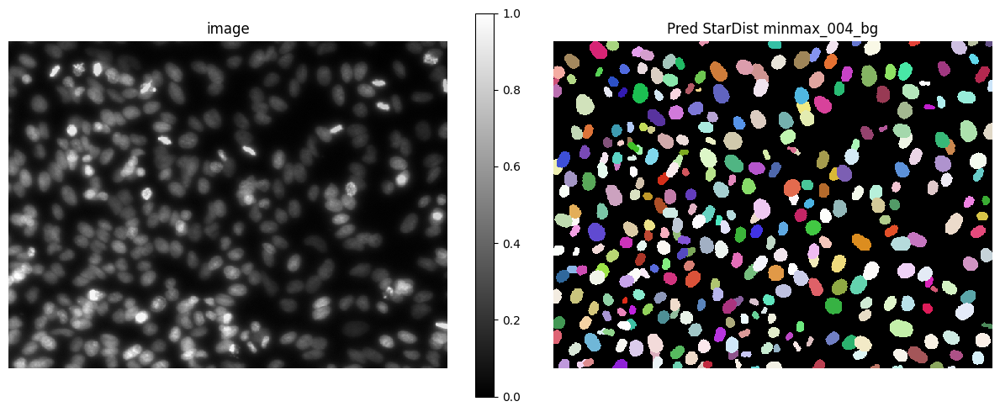

48it [00:02, 22.81it/s]
48it [00:00, 952.98it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /src/models/stardist/paper_self/minmax_016_bg
2023-05-10 23:31:22.551957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100
6/6 [==============================] - 4s 194ms/step - loss: 3.1268 - prob_loss: 1.2846 - dist_loss: 9.2106 - prob_kld: 0.5185 - dist_relevant_mae: 9.2105 - dist_relevant_mse: 122.7789 - dist_dist_iou_metric: 0.0275 - val_loss: 2.3643 - val_prob_loss: 0.6284 - val_dist_loss: 8.6800 - val_prob_kld: 0.4376 - val_dist_relevant_mae: 8.6800 - val_dist_relevant_mse: 102.7825 - val_dist_dist_iou_metric: 8.8513e-05 - lr: 0.0030
Epoch 2/100
6/6 [==============================] - 0s 65ms/step - loss: 2.5476 - prob_loss: 0.6452 - dist_loss: 9.5121 - prob_kld: 0.4269 - dist_relevant_mae: 9.5120 - dist_relevant_mse: 129.9129 - dist_dist_iou_metric: 0.0050 - val_loss: 1.9396 - val_prob_loss: 0.5566 - val_dist_loss: 6.9150 - val_prob_kld: 0.3658 - val_dist_relevant_mae: 6.9149 - val_dist_relevant_mse: 73.5627 - val_dist_dist_iou_metric: 0.0633 - lr: 0.0030
Epoch 3/100
6/6 [==============================] - 0s 59ms/step - loss: 2.3066 

Epoch 14/100
6/6 [==============================] - 0s 56ms/step - loss: 1.5147 - prob_loss: 0.5986 - dist_loss: 4.5806 - prob_kld: 0.3173 - dist_relevant_mae: 4.5797 - dist_relevant_mse: 35.1253 - dist_dist_iou_metric: 0.3850 - val_loss: 1.2974 - val_prob_loss: 0.4555 - val_dist_loss: 4.2095 - val_prob_kld: 0.2647 - val_dist_relevant_mae: 4.2087 - val_dist_relevant_mse: 26.9811 - val_dist_dist_iou_metric: 0.4287 - lr: 0.0030
Epoch 15/100
6/6 [==============================] - 0s 60ms/step - loss: 1.4779 - prob_loss: 0.5959 - dist_loss: 4.4101 - prob_kld: 0.3246 - dist_relevant_mae: 4.4092 - dist_relevant_mse: 33.2472 - dist_dist_iou_metric: 0.3628 - val_loss: 1.3025 - val_prob_loss: 0.4563 - val_dist_loss: 4.2313 - val_prob_kld: 0.2655 - val_dist_relevant_mae: 4.2304 - val_dist_relevant_mse: 27.2880 - val_dist_dist_iou_metric: 0.4263 - lr: 0.0030
Epoch 16/100
6/6 [==============================] - 0s 56ms/step - loss: 1.4822 - prob_loss: 0.5925 - dist_loss: 4.4484 - prob_kld: 0.3290 -

Epoch 27/100
6/6 [==============================] - 0s 59ms/step - loss: 1.4736 - prob_loss: 0.5533 - dist_loss: 4.6019 - prob_kld: 0.2865 - dist_relevant_mae: 4.6009 - dist_relevant_mse: 36.4467 - dist_dist_iou_metric: 0.3877 - val_loss: 1.2383 - val_prob_loss: 0.4092 - val_dist_loss: 4.1453 - val_prob_kld: 0.2185 - val_dist_relevant_mae: 4.1446 - val_dist_relevant_mse: 27.7650 - val_dist_dist_iou_metric: 0.3819 - lr: 0.0030
Epoch 28/100
6/6 [==============================] - 0s 56ms/step - loss: 1.4085 - prob_loss: 0.5333 - dist_loss: 4.3756 - prob_kld: 0.2779 - dist_relevant_mae: 4.3747 - dist_relevant_mse: 33.4116 - dist_dist_iou_metric: 0.3831 - val_loss: 1.2376 - val_prob_loss: 0.3907 - val_dist_loss: 4.2347 - val_prob_kld: 0.1999 - val_dist_relevant_mae: 4.2338 - val_dist_relevant_mse: 27.7821 - val_dist_dist_iou_metric: 0.4395 - lr: 0.0030
Epoch 29/100
6/6 [==============================] - 0s 60ms/step - loss: 1.4125 - prob_loss: 0.5004 - dist_loss: 4.5601 - prob_kld: 0.2996 -

Epoch 40/100
6/6 [==============================] - 0s 54ms/step - loss: 1.0895 - prob_loss: 0.4492 - dist_loss: 3.2017 - prob_kld: 0.2382 - dist_relevant_mae: 3.2008 - dist_relevant_mse: 20.6420 - dist_dist_iou_metric: 0.5095 - val_loss: 0.8451 - val_prob_loss: 0.2758 - val_dist_loss: 2.8460 - val_prob_kld: 0.0851 - val_dist_relevant_mae: 2.8454 - val_dist_relevant_mse: 15.3632 - val_dist_dist_iou_metric: 0.5297 - lr: 0.0030
Epoch 41/100
6/6 [==============================] - 0s 56ms/step - loss: 1.0707 - prob_loss: 0.4441 - dist_loss: 3.1327 - prob_kld: 0.2258 - dist_relevant_mae: 3.1320 - dist_relevant_mse: 20.1393 - dist_dist_iou_metric: 0.5113 - val_loss: 0.8274 - val_prob_loss: 0.2832 - val_dist_loss: 2.7207 - val_prob_kld: 0.0925 - val_dist_relevant_mae: 2.7201 - val_dist_relevant_mse: 14.3708 - val_dist_dist_iou_metric: 0.5437 - lr: 0.0030
Epoch 42/100
6/6 [==============================] - 0s 59ms/step - loss: 1.0103 - prob_loss: 0.4481 - dist_loss: 2.8109 - prob_kld: 0.2538 -

Epoch 53/100
6/6 [==============================] - 0s 61ms/step - loss: 0.8915 - prob_loss: 0.4100 - dist_loss: 2.4075 - prob_kld: 0.2231 - dist_relevant_mae: 2.4068 - dist_relevant_mse: 13.7191 - dist_dist_iou_metric: 0.5958 - val_loss: 0.7508 - val_prob_loss: 0.2589 - val_dist_loss: 2.4590 - val_prob_kld: 0.0682 - val_dist_relevant_mae: 2.4585 - val_dist_relevant_mse: 12.0744 - val_dist_dist_iou_metric: 0.5909 - lr: 0.0030
Epoch 54/100
6/6 [==============================] - 0s 56ms/step - loss: 0.9398 - prob_loss: 0.4108 - dist_loss: 2.6452 - prob_kld: 0.2094 - dist_relevant_mae: 2.6445 - dist_relevant_mse: 15.8208 - dist_dist_iou_metric: 0.5725 - val_loss: 0.7515 - val_prob_loss: 0.2603 - val_dist_loss: 2.4556 - val_prob_kld: 0.0696 - val_dist_relevant_mae: 2.4550 - val_dist_relevant_mse: 11.9730 - val_dist_dist_iou_metric: 0.6059 - lr: 0.0030
Epoch 55/100
6/6 [==============================] - 0s 59ms/step - loss: 0.8682 - prob_loss: 0.4074 - dist_loss: 2.3040 - prob_kld: 0.2310 -

Epoch 66/100
6/6 [==============================] - 0s 62ms/step - loss: 0.8055 - prob_loss: 0.3871 - dist_loss: 2.0916 - prob_kld: 0.2253 - dist_relevant_mae: 2.0909 - dist_relevant_mse: 10.6226 - dist_dist_iou_metric: 0.6360 - val_loss: 0.7171 - val_prob_loss: 0.2600 - val_dist_loss: 2.2858 - val_prob_kld: 0.0692 - val_dist_relevant_mae: 2.2853 - val_dist_relevant_mse: 11.1410 - val_dist_dist_iou_metric: 0.6254 - lr: 0.0030
Epoch 67/100
6/6 [==============================] - 0s 60ms/step - loss: 0.8013 - prob_loss: 0.4074 - dist_loss: 1.9699 - prob_kld: 0.2460 - dist_relevant_mae: 1.9693 - dist_relevant_mse: 9.6048 - dist_dist_iou_metric: 0.6471 - val_loss: 0.7140 - val_prob_loss: 0.2598 - val_dist_loss: 2.2712 - val_prob_kld: 0.0690 - val_dist_relevant_mae: 2.2707 - val_dist_relevant_mse: 11.0851 - val_dist_dist_iou_metric: 0.6240 - lr: 0.0030
Epoch 68/100
6/6 [==============================] - 0s 60ms/step - loss: 0.7813 - prob_loss: 0.3907 - dist_loss: 1.9534 - prob_kld: 0.2178 - 

Epoch 79/100
6/6 [==============================] - 0s 55ms/step - loss: 0.7690 - prob_loss: 0.3876 - dist_loss: 1.9072 - prob_kld: 0.2210 - dist_relevant_mae: 1.9066 - dist_relevant_mse: 8.7583 - dist_dist_iou_metric: 0.6699 - val_loss: 0.7225 - val_prob_loss: 0.2602 - val_dist_loss: 2.3112 - val_prob_kld: 0.0695 - val_dist_relevant_mae: 2.3107 - val_dist_relevant_mse: 11.5319 - val_dist_dist_iou_metric: 0.6400 - lr: 0.0030
Epoch 80/100
6/6 [==============================] - 0s 55ms/step - loss: 0.7930 - prob_loss: 0.4036 - dist_loss: 1.9470 - prob_kld: 0.2104 - dist_relevant_mae: 1.9464 - dist_relevant_mse: 9.2517 - dist_dist_iou_metric: 0.6643 - val_loss: 0.6928 - val_prob_loss: 0.2559 - val_dist_loss: 2.1842 - val_prob_kld: 0.0652 - val_dist_relevant_mae: 2.1837 - val_dist_relevant_mse: 10.5568 - val_dist_dist_iou_metric: 0.6414 - lr: 0.0030
Epoch 81/100
6/6 [==============================] - 0s 57ms/step - loss: 0.7868 - prob_loss: 0.3967 - dist_loss: 1.9503 - prob_kld: 0.2337 - d

Epoch 92/100
6/6 [==============================] - 0s 63ms/step - loss: 0.7560 - prob_loss: 0.3981 - dist_loss: 1.7894 - prob_kld: 0.2277 - dist_relevant_mae: 1.7888 - dist_relevant_mse: 7.9448 - dist_dist_iou_metric: 0.6832 - val_loss: 0.6850 - val_prob_loss: 0.2562 - val_dist_loss: 2.1441 - val_prob_kld: 0.0655 - val_dist_relevant_mae: 2.1436 - val_dist_relevant_mse: 10.4937 - val_dist_dist_iou_metric: 0.6456 - lr: 0.0030
Epoch 93/100
6/6 [==============================] - 0s 55ms/step - loss: 0.7366 - prob_loss: 0.3926 - dist_loss: 1.7203 - prob_kld: 0.2191 - dist_relevant_mae: 1.7197 - dist_relevant_mse: 7.3595 - dist_dist_iou_metric: 0.6984 - val_loss: 0.6960 - val_prob_loss: 0.2630 - val_dist_loss: 2.1651 - val_prob_kld: 0.0722 - val_dist_relevant_mae: 2.1647 - val_dist_relevant_mse: 10.5158 - val_dist_dist_iou_metric: 0.6396 - lr: 0.0030
Epoch 94/100
6/6 [==============================] - 0s 57ms/step - loss: 0.7572 - prob_loss: 0.3924 - dist_loss: 1.8242 - prob_kld: 0.2203 - d


  0%|          | 0/1 [00:00<?, ?it/s]

2023-05-10 23:31:59,325 [INFO] 1/1 - 0s - 89ms/epoch - 89ms/step



1/1 - 0s - 89ms/epoch - 89ms/step



2023-05-10 23:31:59,357 [INFO] 1/1 - 0s - 13ms/epoch - 13ms/step



1/1 - 0s - 13ms/epoch - 13ms/step

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


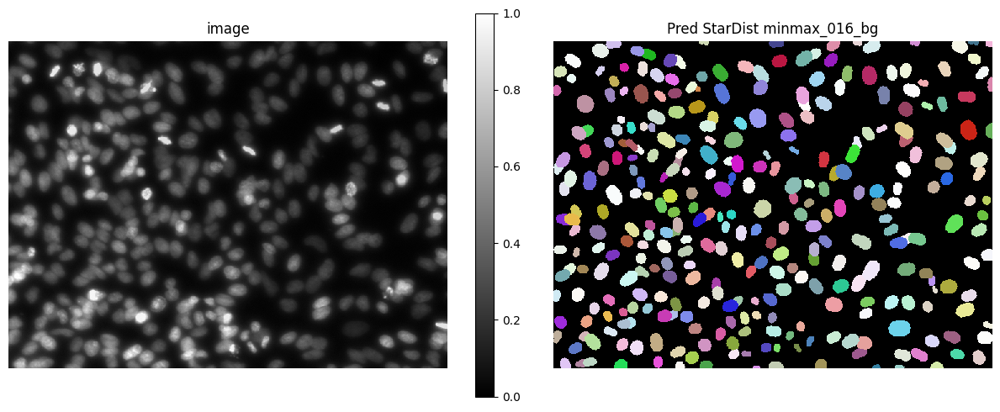

48it [00:02, 23.86it/s]
48it [00:00, 739.70it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /src/models/stardist/paper_self/minmax_064_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100


2023-05-10 23:32:02.056474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 4s 173ms/step - loss: 2.8756 - prob_loss: 1.1427 - dist_loss: 8.6641 - prob_kld: 0.5931 - dist_relevant_mae: 8.6640 - dist_relevant_mse: 104.4009 - dist_dist_iou_metric: 0.0118 - val_loss: 2.3617 - val_prob_loss: 0.6668 - val_dist_loss: 8.4746 - val_prob_kld: 0.4372 - val_dist_relevant_mae: 8.4746 - val_dist_relevant_mse: 97.2988 - val_dist_dist_iou_metric: 2.6118e-05 - lr: 0.0030
Epoch 2/100
6/6 [==============================] - 0s 63ms/step - loss: 2.5134 - prob_loss: 0.6679 - dist_loss: 9.2274 - prob_kld: 0.5758 - dist_relevant_mae: 9.2274 - dist_relevant_mse: 116.6274 - dist_dist_iou_metric: 8.2292e-05 - val_loss: 2.2951 - val_prob_loss: 0.6211 - val_dist_loss: 8.3703 - val_prob_kld: 0.3914 - val_dist_relevant_mae: 8.3703 - val_dist_relevant_mse: 95.5253 - val_dist_dist_iou_metric: 3.0592e-04 - lr: 0.0030
Epoch 3/100
6/6 [==============================] - 0s 61ms/step - loss: 2.3771 - prob_loss: 0.6546 - dist_loss: 8.6120 - prob_kld: 0.3986 -

Epoch 14/100
6/6 [==============================] - 0s 57ms/step - loss: 1.4791 - prob_loss: 0.5915 - dist_loss: 4.4380 - prob_kld: 0.2949 - dist_relevant_mae: 4.4371 - dist_relevant_mse: 32.5461 - dist_dist_iou_metric: 0.3890 - val_loss: 1.3343 - val_prob_loss: 0.5016 - val_dist_loss: 4.1637 - val_prob_kld: 0.2719 - val_dist_relevant_mae: 4.1629 - val_dist_relevant_mse: 26.0336 - val_dist_dist_iou_metric: 0.4460 - lr: 0.0030
Epoch 15/100
6/6 [==============================] - 0s 59ms/step - loss: 1.4379 - prob_loss: 0.5838 - dist_loss: 4.2707 - prob_kld: 0.2935 - dist_relevant_mae: 4.2698 - dist_relevant_mse: 29.8239 - dist_dist_iou_metric: 0.3951 - val_loss: 1.2911 - val_prob_loss: 0.4801 - val_dist_loss: 4.0549 - val_prob_kld: 0.2504 - val_dist_relevant_mae: 4.0541 - val_dist_relevant_mse: 25.0270 - val_dist_dist_iou_metric: 0.4388 - lr: 0.0030
Epoch 16/100
6/6 [==============================] - 0s 58ms/step - loss: 1.4213 - prob_loss: 0.5760 - dist_loss: 4.2266 - prob_kld: 0.2948 -

Epoch 27/100
6/6 [==============================] - 0s 61ms/step - loss: 1.2203 - prob_loss: 0.5093 - dist_loss: 3.5547 - prob_kld: 0.2433 - dist_relevant_mae: 3.5540 - dist_relevant_mse: 23.3153 - dist_dist_iou_metric: 0.4561 - val_loss: 0.9802 - val_prob_loss: 0.3588 - val_dist_loss: 3.1072 - val_prob_kld: 0.1291 - val_dist_relevant_mae: 3.1067 - val_dist_relevant_mse: 16.8147 - val_dist_dist_iou_metric: 0.4931 - lr: 0.0030
Epoch 28/100
6/6 [==============================] - 0s 62ms/step - loss: 1.1276 - prob_loss: 0.4866 - dist_loss: 3.2051 - prob_kld: 0.2294 - dist_relevant_mae: 3.2043 - dist_relevant_mse: 18.9949 - dist_dist_iou_metric: 0.5068 - val_loss: 0.8960 - val_prob_loss: 0.3275 - val_dist_loss: 2.8426 - val_prob_kld: 0.0978 - val_dist_relevant_mae: 2.8419 - val_dist_relevant_mse: 14.2094 - val_dist_dist_iou_metric: 0.5468 - lr: 0.0030
Epoch 29/100
6/6 [==============================] - 0s 59ms/step - loss: 1.1056 - prob_loss: 0.4808 - dist_loss: 3.1242 - prob_kld: 0.2141 -

Epoch 40/100
6/6 [==============================] - 0s 66ms/step - loss: 0.9281 - prob_loss: 0.4186 - dist_loss: 2.5475 - prob_kld: 0.1859 - dist_relevant_mae: 2.5469 - dist_relevant_mse: 12.8274 - dist_dist_iou_metric: 0.5894 - val_loss: 0.7894 - val_prob_loss: 0.2912 - val_dist_loss: 2.4908 - val_prob_kld: 0.0615 - val_dist_relevant_mae: 2.4902 - val_dist_relevant_mse: 11.8488 - val_dist_dist_iou_metric: 0.5961 - lr: 0.0030
Epoch 41/100
6/6 [==============================] - 0s 63ms/step - loss: 0.9193 - prob_loss: 0.4195 - dist_loss: 2.4991 - prob_kld: 0.1830 - dist_relevant_mae: 2.4984 - dist_relevant_mse: 12.7214 - dist_dist_iou_metric: 0.5862 - val_loss: 0.7839 - val_prob_loss: 0.2903 - val_dist_loss: 2.4680 - val_prob_kld: 0.0606 - val_dist_relevant_mae: 2.4675 - val_dist_relevant_mse: 11.6393 - val_dist_dist_iou_metric: 0.5859 - lr: 0.0030
Epoch 42/100
6/6 [==============================] - 0s 62ms/step - loss: 0.9271 - prob_loss: 0.4254 - dist_loss: 2.5085 - prob_kld: 0.1804 -

Epoch 53/100
6/6 [==============================] - 0s 63ms/step - loss: 0.8715 - prob_loss: 0.4120 - dist_loss: 2.2974 - prob_kld: 0.1960 - dist_relevant_mae: 2.2968 - dist_relevant_mse: 11.1808 - dist_dist_iou_metric: 0.6170 - val_loss: 0.7369 - val_prob_loss: 0.2859 - val_dist_loss: 2.2550 - val_prob_kld: 0.0562 - val_dist_relevant_mae: 2.2545 - val_dist_relevant_mse: 10.3562 - val_dist_dist_iou_metric: 0.6242 - lr: 0.0030
Epoch 54/100
6/6 [==============================] - 0s 58ms/step - loss: 0.8639 - prob_loss: 0.4117 - dist_loss: 2.2609 - prob_kld: 0.1820 - dist_relevant_mae: 2.2603 - dist_relevant_mse: 10.8563 - dist_dist_iou_metric: 0.6220 - val_loss: 0.7386 - val_prob_loss: 0.2853 - val_dist_loss: 2.2665 - val_prob_kld: 0.0556 - val_dist_relevant_mae: 2.2661 - val_dist_relevant_mse: 10.2350 - val_dist_dist_iou_metric: 0.6094 - lr: 0.0030
Epoch 55/100
6/6 [==============================] - 0s 62ms/step - loss: 0.8565 - prob_loss: 0.4091 - dist_loss: 2.2367 - prob_kld: 0.1849 -

Epoch 66/100
6/6 [==============================] - 0s 63ms/step - loss: 0.8056 - prob_loss: 0.4009 - dist_loss: 2.0235 - prob_kld: 0.1743 - dist_relevant_mae: 2.0230 - dist_relevant_mse: 9.2580 - dist_dist_iou_metric: 0.6545 - val_loss: 0.6899 - val_prob_loss: 0.2800 - val_dist_loss: 2.0493 - val_prob_kld: 0.0504 - val_dist_relevant_mae: 2.0488 - val_dist_relevant_mse: 9.2191 - val_dist_dist_iou_metric: 0.6540 - lr: 0.0030
Epoch 67/100
6/6 [==============================] - 0s 59ms/step - loss: 0.8149 - prob_loss: 0.4145 - dist_loss: 2.0020 - prob_kld: 0.2082 - dist_relevant_mae: 2.0014 - dist_relevant_mse: 9.0209 - dist_dist_iou_metric: 0.6549 - val_loss: 0.6976 - val_prob_loss: 0.2808 - val_dist_loss: 2.0840 - val_prob_kld: 0.0512 - val_dist_relevant_mae: 2.0835 - val_dist_relevant_mse: 9.3820 - val_dist_dist_iou_metric: 0.6427 - lr: 0.0030
Epoch 68/100
6/6 [==============================] - 0s 62ms/step - loss: 0.8015 - prob_loss: 0.4060 - dist_loss: 1.9779 - prob_kld: 0.1884 - dis

Epoch 79/100
6/6 [==============================] - 0s 64ms/step - loss: 0.7854 - prob_loss: 0.3975 - dist_loss: 1.9396 - prob_kld: 0.1785 - dist_relevant_mae: 1.9390 - dist_relevant_mse: 8.5596 - dist_dist_iou_metric: 0.6700 - val_loss: 0.6743 - val_prob_loss: 0.2811 - val_dist_loss: 1.9659 - val_prob_kld: 0.0515 - val_dist_relevant_mae: 1.9655 - val_dist_relevant_mse: 8.7342 - val_dist_dist_iou_metric: 0.6676 - lr: 0.0030
Epoch 80/100
6/6 [==============================] - 0s 59ms/step - loss: 0.7884 - prob_loss: 0.4011 - dist_loss: 1.9361 - prob_kld: 0.1906 - dist_relevant_mae: 1.9355 - dist_relevant_mse: 8.7076 - dist_dist_iou_metric: 0.6729 - val_loss: 0.6861 - val_prob_loss: 0.2788 - val_dist_loss: 2.0367 - val_prob_kld: 0.0491 - val_dist_relevant_mae: 2.0363 - val_dist_relevant_mse: 9.2738 - val_dist_dist_iou_metric: 0.6555 - lr: 0.0030
Epoch 81/100
6/6 [==============================] - 0s 63ms/step - loss: 0.7809 - prob_loss: 0.4091 - dist_loss: 1.8591 - prob_kld: 0.1995 - dis

Epoch 92/100
6/6 [==============================] - 0s 59ms/step - loss: 0.7671 - prob_loss: 0.4026 - dist_loss: 1.8223 - prob_kld: 0.1875 - dist_relevant_mae: 1.8217 - dist_relevant_mse: 7.5716 - dist_dist_iou_metric: 0.6855 - val_loss: 0.6608 - val_prob_loss: 0.2762 - val_dist_loss: 1.9230 - val_prob_kld: 0.0465 - val_dist_relevant_mae: 1.9225 - val_dist_relevant_mse: 8.7450 - val_dist_dist_iou_metric: 0.6779 - lr: 0.0030
Epoch 93/100
6/6 [==============================] - 0s 58ms/step - loss: 0.7610 - prob_loss: 0.4038 - dist_loss: 1.7862 - prob_kld: 0.1926 - dist_relevant_mae: 1.7856 - dist_relevant_mse: 7.4468 - dist_dist_iou_metric: 0.6918 - val_loss: 0.6597 - val_prob_loss: 0.2753 - val_dist_loss: 1.9220 - val_prob_kld: 0.0456 - val_dist_relevant_mae: 1.9216 - val_dist_relevant_mse: 8.3683 - val_dist_dist_iou_metric: 0.6623 - lr: 0.0030
Epoch 94/100
6/6 [==============================] - 0s 57ms/step - loss: 0.7566 - prob_loss: 0.3956 - dist_loss: 1.8051 - prob_kld: 0.1876 - dis


  0%|          | 0/1 [00:00<?, ?it/s]

2023-05-10 23:32:40,323 [INFO] 1/1 - 0s - 92ms/epoch - 92ms/step



1/1 - 0s - 92ms/epoch - 92ms/step



2023-05-10 23:32:40,357 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


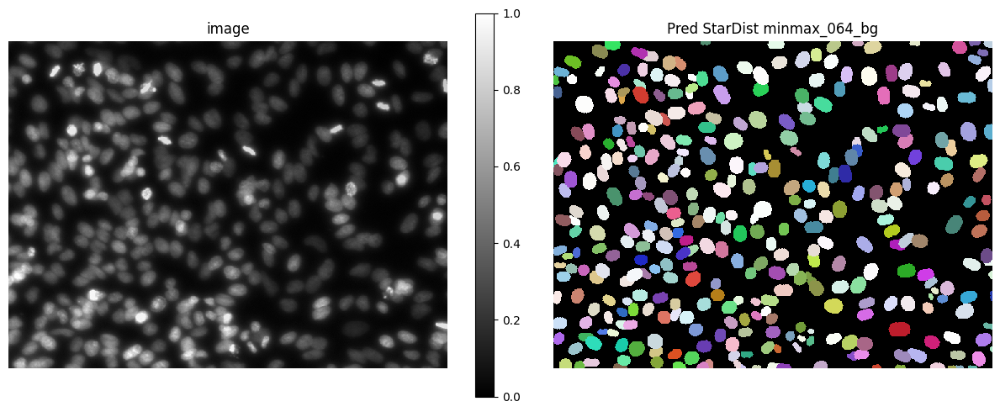

48it [00:02, 23.30it/s]
48it [00:00, 441.86it/s]
base_model.py (149): output path for model already exists, files may be overwritten: /src/models/stardist/paper_self/minmax_256_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100


2023-05-10 23:32:43.183175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 4s 150ms/step - loss: 3.1304 - prob_loss: 1.2966 - dist_loss: 9.1691 - prob_kld: 0.7256 - dist_relevant_mae: 9.1690 - dist_relevant_mse: 118.4261 - dist_dist_iou_metric: 0.0255 - val_loss: 2.4817 - val_prob_loss: 0.6276 - val_dist_loss: 9.2706 - val_prob_kld: 0.4593 - val_dist_relevant_mae: 9.2706 - val_dist_relevant_mse: 116.8169 - val_dist_dist_iou_metric: 1.7276e-05 - lr: 0.0030
Epoch 2/100
6/6 [==============================] - 0s 66ms/step - loss: 2.4534 - prob_loss: 0.6432 - dist_loss: 9.0511 - prob_kld: 0.4075 - dist_relevant_mae: 9.0511 - dist_relevant_mse: 111.8494 - dist_dist_iou_metric: 8.3774e-05 - val_loss: 2.3363 - val_prob_loss: 0.5030 - val_dist_loss: 9.1666 - val_prob_kld: 0.3346 - val_dist_relevant_mae: 9.1666 - val_dist_relevant_mse: 114.8842 - val_dist_dist_iou_metric: 4.1815e-04 - lr: 0.0030
Epoch 3/100
6/6 [==============================] - 0s 68ms/step - loss: 2.3943 - prob_loss: 0.6202 - dist_loss: 8.8705 - prob_kld: 0.2999

Epoch 14/100
6/6 [==============================] - 0s 63ms/step - loss: 1.4542 - prob_loss: 0.6008 - dist_loss: 4.2673 - prob_kld: 0.2800 - dist_relevant_mae: 4.2666 - dist_relevant_mse: 29.0896 - dist_dist_iou_metric: 0.3928 - val_loss: 1.3216 - val_prob_loss: 0.4480 - val_dist_loss: 4.3677 - val_prob_kld: 0.2797 - val_dist_relevant_mae: 4.3669 - val_dist_relevant_mse: 30.4834 - val_dist_dist_iou_metric: 0.3964 - lr: 0.0030
Epoch 15/100
6/6 [==============================] - 0s 60ms/step - loss: 1.4492 - prob_loss: 0.6024 - dist_loss: 4.2340 - prob_kld: 0.2790 - dist_relevant_mae: 4.2333 - dist_relevant_mse: 28.6423 - dist_dist_iou_metric: 0.3957 - val_loss: 1.3335 - val_prob_loss: 0.4586 - val_dist_loss: 4.3745 - val_prob_kld: 0.2903 - val_dist_relevant_mae: 4.3737 - val_dist_relevant_mse: 30.3384 - val_dist_dist_iou_metric: 0.4059 - lr: 0.0030
Epoch 16/100
6/6 [==============================] - 0s 60ms/step - loss: 1.4525 - prob_loss: 0.5984 - dist_loss: 4.2706 - prob_kld: 0.2828 -

Epoch 27/100
6/6 [==============================] - 0s 66ms/step - loss: 1.2438 - prob_loss: 0.4812 - dist_loss: 3.8129 - prob_kld: 0.1363 - dist_relevant_mae: 3.8124 - dist_relevant_mse: 25.1964 - dist_dist_iou_metric: 0.4236 - val_loss: 1.0753 - val_prob_loss: 0.2787 - val_dist_loss: 3.9831 - val_prob_kld: 0.1103 - val_dist_relevant_mae: 3.9827 - val_dist_relevant_mse: 30.1221 - val_dist_dist_iou_metric: 0.3799 - lr: 0.0030
Epoch 28/100
6/6 [==============================] - 0s 66ms/step - loss: 1.1799 - prob_loss: 0.4681 - dist_loss: 3.5589 - prob_kld: 0.1024 - dist_relevant_mae: 3.5584 - dist_relevant_mse: 23.4010 - dist_dist_iou_metric: 0.4302 - val_loss: 0.9653 - val_prob_loss: 0.2440 - val_dist_loss: 3.6065 - val_prob_kld: 0.0757 - val_dist_relevant_mae: 3.6060 - val_dist_relevant_mse: 25.0714 - val_dist_dist_iou_metric: 0.4380 - lr: 0.0030
Epoch 29/100
6/6 [==============================] - 0s 69ms/step - loss: 1.1272 - prob_loss: 0.4542 - dist_loss: 3.3648 - prob_kld: 0.0795 -

Epoch 40/100
6/6 [==============================] - 0s 62ms/step - loss: 0.9447 - prob_loss: 0.4372 - dist_loss: 2.5373 - prob_kld: 0.0680 - dist_relevant_mae: 2.5367 - dist_relevant_mse: 13.1726 - dist_dist_iou_metric: 0.5785 - val_loss: 0.7903 - val_prob_loss: 0.2491 - val_dist_loss: 2.7062 - val_prob_kld: 0.0808 - val_dist_relevant_mae: 2.7056 - val_dist_relevant_mse: 13.8061 - val_dist_dist_iou_metric: 0.5913 - lr: 0.0030
Epoch 41/100
6/6 [==============================] - 0s 64ms/step - loss: 0.9348 - prob_loss: 0.4315 - dist_loss: 2.5163 - prob_kld: 0.0588 - dist_relevant_mae: 2.5158 - dist_relevant_mse: 12.8502 - dist_dist_iou_metric: 0.5849 - val_loss: 0.7847 - val_prob_loss: 0.2542 - val_dist_loss: 2.6524 - val_prob_kld: 0.0859 - val_dist_relevant_mae: 2.6518 - val_dist_relevant_mse: 13.7994 - val_dist_dist_iou_metric: 0.5861 - lr: 0.0030
Epoch 42/100
6/6 [==============================] - 0s 67ms/step - loss: 0.9317 - prob_loss: 0.4403 - dist_loss: 2.4573 - prob_kld: 0.0725 -

Epoch 53/100
6/6 [==============================] - 0s 61ms/step - loss: 0.8945 - prob_loss: 0.4316 - dist_loss: 2.3146 - prob_kld: 0.0552 - dist_relevant_mae: 2.3141 - dist_relevant_mse: 11.2868 - dist_dist_iou_metric: 0.6054 - val_loss: 0.7251 - val_prob_loss: 0.2324 - val_dist_loss: 2.4639 - val_prob_kld: 0.0640 - val_dist_relevant_mae: 2.4634 - val_dist_relevant_mse: 12.7078 - val_dist_dist_iou_metric: 0.5938 - lr: 0.0030
Epoch 54/100
6/6 [==============================] - 0s 65ms/step - loss: 0.8997 - prob_loss: 0.4234 - dist_loss: 2.3814 - prob_kld: 0.0502 - dist_relevant_mae: 2.3809 - dist_relevant_mse: 12.0419 - dist_dist_iou_metric: 0.5990 - val_loss: 0.6952 - val_prob_loss: 0.2028 - val_dist_loss: 2.4617 - val_prob_kld: 0.0345 - val_dist_relevant_mae: 2.4613 - val_dist_relevant_mse: 12.8045 - val_dist_dist_iou_metric: 0.5933 - lr: 0.0030
Epoch 55/100
6/6 [==============================] - 0s 66ms/step - loss: 0.8882 - prob_loss: 0.4227 - dist_loss: 2.3276 - prob_kld: 0.0459 -

Epoch 66/100
6/6 [==============================] - 0s 68ms/step - loss: 0.8474 - prob_loss: 0.4130 - dist_loss: 2.1720 - prob_kld: 0.0422 - dist_relevant_mae: 2.1716 - dist_relevant_mse: 10.2187 - dist_dist_iou_metric: 0.6314 - val_loss: 0.6485 - val_prob_loss: 0.2010 - val_dist_loss: 2.2374 - val_prob_kld: 0.0327 - val_dist_relevant_mae: 2.2370 - val_dist_relevant_mse: 10.9855 - val_dist_dist_iou_metric: 0.6272 - lr: 0.0030
Epoch 67/100
6/6 [==============================] - 0s 68ms/step - loss: 0.8409 - prob_loss: 0.4144 - dist_loss: 2.1325 - prob_kld: 0.0413 - dist_relevant_mae: 2.1321 - dist_relevant_mse: 10.0267 - dist_dist_iou_metric: 0.6335 - val_loss: 0.6447 - val_prob_loss: 0.2020 - val_dist_loss: 2.2139 - val_prob_kld: 0.0336 - val_dist_relevant_mae: 2.2134 - val_dist_relevant_mse: 10.8445 - val_dist_dist_iou_metric: 0.6304 - lr: 0.0030
Epoch 68/100
6/6 [==============================] - 0s 70ms/step - loss: 0.8388 - prob_loss: 0.4153 - dist_loss: 2.1175 - prob_kld: 0.0426 -

Epoch 79/100
6/6 [==============================] - 0s 64ms/step - loss: 0.8078 - prob_loss: 0.4147 - dist_loss: 1.9656 - prob_kld: 0.0415 - dist_relevant_mae: 1.9652 - dist_relevant_mse: 8.7128 - dist_dist_iou_metric: 0.6655 - val_loss: 0.6142 - val_prob_loss: 0.1997 - val_dist_loss: 2.0725 - val_prob_kld: 0.0314 - val_dist_relevant_mae: 2.0721 - val_dist_relevant_mse: 9.6809 - val_dist_dist_iou_metric: 0.6723 - lr: 0.0030
Epoch 80/100
6/6 [==============================] - 0s 62ms/step - loss: 0.7996 - prob_loss: 0.4129 - dist_loss: 1.9333 - prob_kld: 0.0411 - dist_relevant_mae: 1.9329 - dist_relevant_mse: 8.6188 - dist_dist_iou_metric: 0.6682 - val_loss: 0.6428 - val_prob_loss: 0.2098 - val_dist_loss: 2.1649 - val_prob_kld: 0.0415 - val_dist_relevant_mae: 2.1644 - val_dist_relevant_mse: 9.9863 - val_dist_dist_iou_metric: 0.6637 - lr: 0.0030
Epoch 81/100
6/6 [==============================] - 0s 68ms/step - loss: 0.8061 - prob_loss: 0.4121 - dist_loss: 1.9698 - prob_kld: 0.0386 - dis

Epoch 92/100
6/6 [==============================] - 0s 62ms/step - loss: 0.7660 - prob_loss: 0.4081 - dist_loss: 1.7894 - prob_kld: 0.0364 - dist_relevant_mae: 1.7890 - dist_relevant_mse: 7.4499 - dist_dist_iou_metric: 0.6919 - val_loss: 0.5770 - val_prob_loss: 0.1994 - val_dist_loss: 1.8877 - val_prob_kld: 0.0311 - val_dist_relevant_mae: 1.8873 - val_dist_relevant_mse: 8.3993 - val_dist_dist_iou_metric: 0.6907 - lr: 0.0030
Epoch 93/100
6/6 [==============================] - 0s 66ms/step - loss: 0.7641 - prob_loss: 0.4082 - dist_loss: 1.7793 - prob_kld: 0.0356 - dist_relevant_mae: 1.7789 - dist_relevant_mse: 7.4998 - dist_dist_iou_metric: 0.6923 - val_loss: 0.5709 - val_prob_loss: 0.1960 - val_dist_loss: 1.8742 - val_prob_kld: 0.0277 - val_dist_relevant_mae: 1.8738 - val_dist_relevant_mse: 8.2936 - val_dist_dist_iou_metric: 0.6948 - lr: 0.0030
Epoch 94/100
6/6 [==============================] - 0s 61ms/step - loss: 0.7594 - prob_loss: 0.4064 - dist_loss: 1.7651 - prob_kld: 0.0347 - dis


  0%|          | 0/1 [00:00<?, ?it/s]

2023-05-10 23:33:23,983 [INFO] 1/1 - 0s - 88ms/epoch - 88ms/step



1/1 - 0s - 88ms/epoch - 88ms/step



2023-05-10 23:33:24,017 [INFO] 1/1 - 0s - 12ms/epoch - 12ms/step



1/1 - 0s - 12ms/epoch - 12ms/step

100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


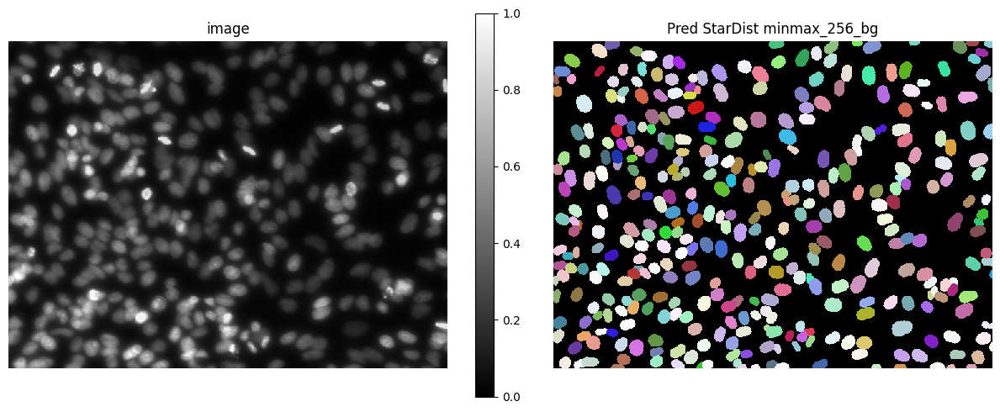

base_model.py (149): output path for model already exists, files may be overwritten: /src/models/stardist/paper_self/minmax_full_bg


Using default values: prob_thresh=0.5, nms_thresh=0.4.
Epoch 1/100


2023-05-10 23:33:25.011799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 4s 194ms/step - loss: 3.0832 - prob_loss: 0.9309 - dist_loss: 10.7617 - prob_kld: 0.7317 - dist_relevant_mae: 10.7614 - dist_relevant_mse: 212.2074 - dist_dist_iou_metric: 0.0185 - val_loss: 2.4799 - val_prob_loss: 0.6072 - val_dist_loss: 9.3635 - val_prob_kld: 0.4497 - val_dist_relevant_mae: 9.3635 - val_dist_relevant_mse: 119.4321 - val_dist_dist_iou_metric: 1.5116e-05 - lr: 0.0030
Epoch 2/100
6/6 [==============================] - 0s 68ms/step - loss: 2.3397 - prob_loss: 0.5390 - dist_loss: 9.0036 - prob_kld: 0.3458 - dist_relevant_mae: 9.0036 - dist_relevant_mse: 110.6727 - dist_dist_iou_metric: 3.3460e-04 - val_loss: 2.2212 - val_prob_loss: 0.3867 - val_dist_loss: 9.1728 - val_prob_kld: 0.2291 - val_dist_relevant_mae: 9.1727 - val_dist_relevant_mse: 115.8545 - val_dist_dist_iou_metric: 0.0012 - lr: 0.0030
Epoch 3/100
6/6 [==============================] - 0s 66ms/step - loss: 2.1974 - prob_loss: 0.4315 - dist_loss: 8.8298 - prob_kld: 0.2387 -

Epoch 14/100
6/6 [==============================] - 0s 70ms/step - loss: 1.2157 - prob_loss: 0.3550 - dist_loss: 4.3032 - prob_kld: 0.1633 - dist_relevant_mae: 4.3025 - dist_relevant_mse: 30.2696 - dist_dist_iou_metric: 0.3915 - val_loss: 1.2533 - val_prob_loss: 0.3103 - val_dist_loss: 4.7151 - val_prob_kld: 0.1527 - val_dist_relevant_mae: 4.7146 - val_dist_relevant_mse: 38.8902 - val_dist_dist_iou_metric: 0.2788 - lr: 0.0030
Epoch 15/100
6/6 [==============================] - 0s 65ms/step - loss: 1.2093 - prob_loss: 0.3595 - dist_loss: 4.2486 - prob_kld: 0.1635 - dist_relevant_mae: 4.2479 - dist_relevant_mse: 29.3398 - dist_dist_iou_metric: 0.3872 - val_loss: 1.1709 - val_prob_loss: 0.2870 - val_dist_loss: 4.4196 - val_prob_kld: 0.1294 - val_dist_relevant_mae: 4.4189 - val_dist_relevant_mse: 32.5486 - val_dist_dist_iou_metric: 0.3535 - lr: 0.0030
Epoch 16/100
6/6 [==============================] - 0s 69ms/step - loss: 1.2095 - prob_loss: 0.3584 - dist_loss: 4.2552 - prob_kld: 0.1655 -

Epoch 27/100
6/6 [==============================] - 0s 66ms/step - loss: 0.8113 - prob_loss: 0.2602 - dist_loss: 2.7554 - prob_kld: 0.0632 - dist_relevant_mae: 2.7548 - dist_relevant_mse: 15.1118 - dist_dist_iou_metric: 0.5512 - val_loss: 0.7280 - val_prob_loss: 0.1976 - val_dist_loss: 2.6518 - val_prob_kld: 0.0401 - val_dist_relevant_mae: 2.6511 - val_dist_relevant_mse: 13.6333 - val_dist_dist_iou_metric: 0.5755 - lr: 0.0030
Epoch 28/100
6/6 [==============================] - 0s 67ms/step - loss: 0.7785 - prob_loss: 0.2556 - dist_loss: 2.6143 - prob_kld: 0.0612 - dist_relevant_mae: 2.6137 - dist_relevant_mse: 13.6539 - dist_dist_iou_metric: 0.5739 - val_loss: 0.7215 - val_prob_loss: 0.2144 - val_dist_loss: 2.5352 - val_prob_kld: 0.0568 - val_dist_relevant_mae: 2.5346 - val_dist_relevant_mse: 13.3686 - val_dist_dist_iou_metric: 0.5746 - lr: 0.0030
Epoch 29/100
6/6 [==============================] - 0s 67ms/step - loss: 0.7639 - prob_loss: 0.2606 - dist_loss: 2.5166 - prob_kld: 0.0599 -

Epoch 40/100
6/6 [==============================] - 0s 66ms/step - loss: 0.6928 - prob_loss: 0.2385 - dist_loss: 2.2717 - prob_kld: 0.0420 - dist_relevant_mae: 2.2712 - dist_relevant_mse: 11.1640 - dist_dist_iou_metric: 0.6138 - val_loss: 0.6409 - val_prob_loss: 0.1848 - val_dist_loss: 2.2803 - val_prob_kld: 0.0272 - val_dist_relevant_mae: 2.2798 - val_dist_relevant_mse: 11.2536 - val_dist_dist_iou_metric: 0.6100 - lr: 0.0030
Epoch 41/100
6/6 [==============================] - 0s 62ms/step - loss: 0.6837 - prob_loss: 0.2286 - dist_loss: 2.2753 - prob_kld: 0.0386 - dist_relevant_mae: 2.2748 - dist_relevant_mse: 11.2805 - dist_dist_iou_metric: 0.6156 - val_loss: 0.6516 - val_prob_loss: 0.1859 - val_dist_loss: 2.3284 - val_prob_kld: 0.0283 - val_dist_relevant_mae: 2.3278 - val_dist_relevant_mse: 11.0350 - val_dist_dist_iou_metric: 0.6176 - lr: 0.0030
Epoch 42/100
6/6 [==============================] - 0s 65ms/step - loss: 0.6911 - prob_loss: 0.2381 - dist_loss: 2.2651 - prob_kld: 0.0414 -

Epoch 53/100
6/6 [==============================] - 0s 63ms/step - loss: 0.6344 - prob_loss: 0.2331 - dist_loss: 2.0065 - prob_kld: 0.0369 - dist_relevant_mae: 2.0061 - dist_relevant_mse: 9.1330 - dist_dist_iou_metric: 0.6526 - val_loss: 0.5877 - val_prob_loss: 0.1822 - val_dist_loss: 2.0274 - val_prob_kld: 0.0246 - val_dist_relevant_mae: 2.0269 - val_dist_relevant_mse: 9.0335 - val_dist_dist_iou_metric: 0.6577 - lr: 0.0030
Epoch 54/100
6/6 [==============================] - 0s 64ms/step - loss: 0.6394 - prob_loss: 0.2268 - dist_loss: 2.0627 - prob_kld: 0.0377 - dist_relevant_mae: 2.0622 - dist_relevant_mse: 9.5234 - dist_dist_iou_metric: 0.6458 - val_loss: 0.6292 - val_prob_loss: 0.1873 - val_dist_loss: 2.2093 - val_prob_kld: 0.0297 - val_dist_relevant_mae: 2.2088 - val_dist_relevant_mse: 10.0733 - val_dist_dist_iou_metric: 0.6451 - lr: 0.0030
Epoch 55/100
6/6 [==============================] - 0s 66ms/step - loss: 0.6501 - prob_loss: 0.2330 - dist_loss: 2.0858 - prob_kld: 0.0395 - di

Epoch 66/100
6/6 [==============================] - 0s 63ms/step - loss: 0.6200 - prob_loss: 0.2444 - dist_loss: 1.8781 - prob_kld: 0.0396 - dist_relevant_mae: 1.8777 - dist_relevant_mse: 8.0039 - dist_dist_iou_metric: 0.6760 - val_loss: 0.5526 - val_prob_loss: 0.1811 - val_dist_loss: 1.8573 - val_prob_kld: 0.0235 - val_dist_relevant_mae: 1.8568 - val_dist_relevant_mse: 8.3061 - val_dist_dist_iou_metric: 0.6734 - lr: 0.0030
Epoch 67/100
6/6 [==============================] - 0s 62ms/step - loss: 0.6057 - prob_loss: 0.2330 - dist_loss: 1.8636 - prob_kld: 0.0360 - dist_relevant_mae: 1.8631 - dist_relevant_mse: 8.0001 - dist_dist_iou_metric: 0.6783 - val_loss: 0.5496 - val_prob_loss: 0.1805 - val_dist_loss: 1.8457 - val_prob_kld: 0.0229 - val_dist_relevant_mae: 1.8452 - val_dist_relevant_mse: 7.7821 - val_dist_dist_iou_metric: 0.6863 - lr: 0.0030
Epoch 68/100
6/6 [==============================] - 0s 66ms/step - loss: 0.6010 - prob_loss: 0.2287 - dist_loss: 1.8615 - prob_kld: 0.0354 - dis

Epoch 79/100
6/6 [==============================] - 0s 67ms/step - loss: 0.5841 - prob_loss: 0.2397 - dist_loss: 1.7218 - prob_kld: 0.0359 - dist_relevant_mae: 1.7213 - dist_relevant_mse: 6.8554 - dist_dist_iou_metric: 0.6997 - val_loss: 0.5215 - val_prob_loss: 0.1801 - val_dist_loss: 1.7070 - val_prob_kld: 0.0226 - val_dist_relevant_mae: 1.7065 - val_dist_relevant_mse: 6.7821 - val_dist_dist_iou_metric: 0.7037 - lr: 0.0030
Epoch 80/100
6/6 [==============================] - 0s 68ms/step - loss: 0.5757 - prob_loss: 0.2311 - dist_loss: 1.7228 - prob_kld: 0.0335 - dist_relevant_mae: 1.7223 - dist_relevant_mse: 6.9701 - dist_dist_iou_metric: 0.7025 - val_loss: 0.5117 - val_prob_loss: 0.1787 - val_dist_loss: 1.6650 - val_prob_kld: 0.0211 - val_dist_relevant_mae: 1.6646 - val_dist_relevant_mse: 6.6921 - val_dist_dist_iou_metric: 0.7034 - lr: 0.0030
Epoch 81/100
6/6 [==============================] - 0s 61ms/step - loss: 0.5835 - prob_loss: 0.2378 - dist_loss: 1.7282 - prob_kld: 0.0355 - dis

Epoch 92/100
6/6 [==============================] - 0s 64ms/step - loss: 0.5597 - prob_loss: 0.2259 - dist_loss: 1.6691 - prob_kld: 0.0330 - dist_relevant_mae: 1.6686 - dist_relevant_mse: 6.5060 - dist_dist_iou_metric: 0.7116 - val_loss: 0.4915 - val_prob_loss: 0.1784 - val_dist_loss: 1.5654 - val_prob_kld: 0.0208 - val_dist_relevant_mae: 1.5649 - val_dist_relevant_mse: 5.6876 - val_dist_dist_iou_metric: 0.7308 - lr: 0.0030
Epoch 93/100
6/6 [==============================] - 0s 63ms/step - loss: 0.5619 - prob_loss: 0.2237 - dist_loss: 1.6911 - prob_kld: 0.0329 - dist_relevant_mae: 1.6906 - dist_relevant_mse: 6.6898 - dist_dist_iou_metric: 0.7090 - val_loss: 0.4967 - val_prob_loss: 0.1790 - val_dist_loss: 1.5885 - val_prob_kld: 0.0214 - val_dist_relevant_mae: 1.5880 - val_dist_relevant_mse: 5.8551 - val_dist_dist_iou_metric: 0.7274 - lr: 0.0030
Epoch 94/100
6/6 [==============================] - 0s 61ms/step - loss: 0.5681 - prob_loss: 0.2338 - dist_loss: 1.6716 - prob_kld: 0.0348 - dis


  0%|          | 0/1 [00:00<?, ?it/s]

2023-05-10 23:34:06,071 [INFO] 1/1 - 0s - 115ms/epoch - 115ms/step



1/1 - 0s - 115ms/epoch - 115ms/step



2023-05-10 23:34:06,123 [INFO] 1/1 - 0s - 15ms/epoch - 15ms/step



1/1 - 0s - 15ms/epoch - 15ms/step

100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


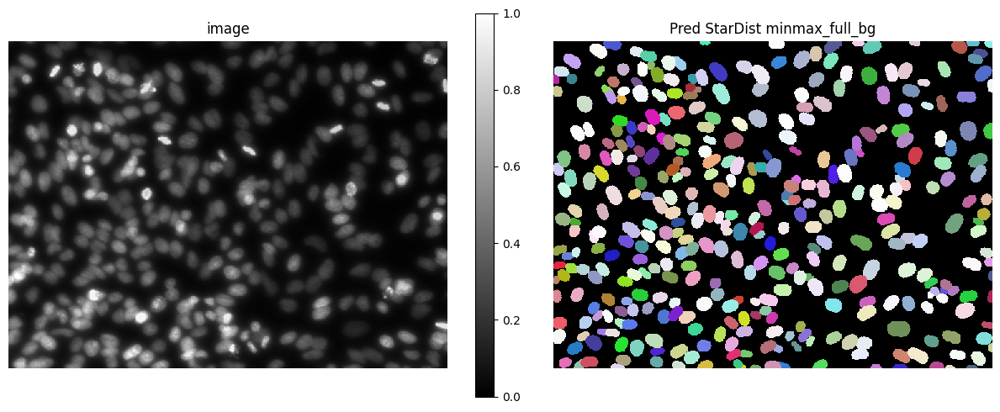

In [7]:
elephant_runner_self = ElephantRunner(
    is_3d=False,
    model_dir="models/elephant/paper_self",
    log_dir="models/elephant/paper_self/logs",
    n_epochs=100,
    lr=0.01,
)

cellpose_runner_self = CellposeRunner(
    save_path='models/cellpose/paper_self',
    n_epochs=100,
    learning_rate=0.01,
)

train_batch_size = 8
stardist_runner_self = StarDistRunner(
    grid=(2, 2),
    basedir='models/stardist/paper_self',
    use_gpu=False,
    train_epochs=100,
    train_patch_size=(224, 224),
    train_batch_size=train_batch_size,
    train_steps_per_epoch=6,
    train_learning_rate=0.003,
)
    
stats_list_dict = {}
for runner in (cellpose_runner_self, elephant_runner_self, stardist_runner_self):
    for include_bg in (True,):
        for mode in ('minmax',):
            key = f'{runner.name()}_{mode}{"_bg" if include_bg else ""}'
            stats_list_dict[key] = runner.run(
                x_trn[6:7] * 48,
                y_trn[6:7] * 48,
                x_trn[6:7],
                y_trn[6:7],
                mode=mode,
                is_train=True,
                include_bg=include_bg,
                show_plot=True,
                sample_ind=0,
            )